In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table, Column

In [2]:
import sncosmo

Importar el mapa de polvo de SFD (Schleger, Finkbeines & Davis 1998), descargado desde este link: https://github.com/kbarbary/sfdmap

In [3]:
import sfdmap
m = sfdmap.SFDMap('/home/francisca/sfddata-master/')

In [4]:
import psycopg2
import requests
from sqlalchemy import create_engine

In [5]:
url = "https://raw.githubusercontent.com/alercebroker/usecases/master/alercereaduser_v3.json"
params = requests.get(url).json()['params']
conn = psycopg2.connect(dbname=params['dbname'], user=params['user'], host=params['host'], password=params['password'])

# Funciones y resumen de los ajustes

En este notebook se verán ajustes con el módulo sncosmo de los modelos SALT2 (en la versión de Betoule et al. 2014) y SALT3 para las detecciones de 84 de las primeras observaciones de SNIa de ZTF confirmadas espectroscópicamente (https://iopscience.iop.org/article/10.3847/1538-4357/ab4cf5/pdf).

A continuación se describen las funciones que se utilizarán, explicando los pasos necesarios para realizar los ajustes, algunas modificaciones, notas y preguntas que creo que pueden ayudar a mejorarlos.

In [6]:
def flujo(mag_AB, zp=23.9):
    '''
    Transforma magnitudes AB en flujo, por defecto el flujo se 
    transforma en unidades de microJanskys.
    '''
    flux = 10**((zp - mag_AB)/2.5)
    return flux

Para los ajustes es necesario tener al menos las siguientes columnas en los datos: tiempo, filtro, flujo, error del flujo, zp,
y sistema de magnitudes a la cual permite pasar el zp.
Por lo tanto, como los flujos de ZTF se entregan en magnitudes AB:
- sistema de magnitudes: AB.

- zp: 23.9 (permite pasar de flujo en $\mu J$ $\rightarrow$ magnitudes AB).

- se utilizan los flujos en microJanskys y sus errores calculados a partir de magnitudes AB y sus errores reportados por ZTF, como:
$$flux_{\mu J} = 10^{\frac{23.9 - mag_{AB}}{2.5}}$$
  con $mag_{AB}$ obtenida en la columna "magpsf" de las detecciones, y
$$fluxerr_{\mu J} = flux_{\mu J} \cdot magerror_{AB} \cdot \frac{\ln{10}}{2.5}$$
  con $magerror_{AB}$ obtenido en la columna "sigmapsf" de las detecciones.

In [7]:
def mag_to_flux_fluxerr_flt(table, zp=23.9):
    '''
    A partir de una tabla de astropy con las detecciones se agregan 
    nuevas columnas, necesarias para realizar los ajustes, estas
    son: el flujo; el error del flujo; nombres de filtros (tal como 
    están guardados en sncosmo); el valor del zp que permite pasar 
    de magnitudes a flujo; y el sistema de magnitudes al cual 
    permite pasar el zp.
    
    - el flujo se determina a partir de la función flux a partir 
    del valor de la magnitud AB en la columna "magpsf" de las 
    detecciones.
    
    - el error del flujo se determina a partir del flujo y el error
    de las magnitudes como fluxerror = flux * magerror * ln(10)/2.5,
    donde este último factor sale de la transformación de 
    magnitudes a flujo, y magerr se encuentra en la comlumna 
    "sigmapsf" de las detecciones.
    
    - cambia los filtros para cada detección como fid: 1 -> 'ztfg' 
    y fid: 2 -> 'ztfr' (columna flt).
    
    - especifica el zp que permite pasar de magnitudes AB a flujo.
    
    - especifica que el zp permite pasar al sistema de 
    magnitudes AB (zpsys).
    '''
    nueva_col_flt = []
    nueva_col_f = []
    nueva_col_fe = []
    ab = sncosmo.get_magsystem('ab')
    for i in range(len(table)):
        if table['fid'][i] == 1:
            nueva_col_flt.append('ztfg')
            mag = table['magpsf'][i]
            magerr = table['sigmapsf'][i]
            flux = flujo(mag)
            fluxerr = magerr * flux * (np.log(2.3)/2.5)
            nueva_col_f.append(flux)
            nueva_col_fe.append(fluxerr)

        if table['fid'][i] == 2:
            nueva_col_flt.append('ztfr')
            mag = table['magpsf'][i]
            magerr = table['sigmapsf'][i]
            flux = flujo(mag)
            fluxerr = magerr * flux * (np.log(10)/2.5)
            nueva_col_f.append(flux)
            nueva_col_fe.append(fluxerr)
  
    table['band'] = nueva_col_flt
    table['f'] = nueva_col_f
    table['fe'] = nueva_col_fe
    table['zp'] = zp                                         
    table['zpsys'] = 'ab'     

In [8]:
def astropy_table_detections(df_metadata, df_detections, zp=23.9):
    '''
    A partir de dataframes de los metadata de las SN y de sus
    detecciones construye una lista de tablas de astropy con la
    información de las detecciones de las SN y sus metadata, que 
    es el formato de los datos que necesita sncosmo para hacer 
    los ajustes. Utiliza la función auxiliar 
    "mag_to_flux_fluxerr_flt" para agregar las columnas necesarias.  
    '''
    oids = list(df_metadata.oid)
    table_list = []
    for i in range(len(oids)):
        oid = oids[i]
        detect_i = df_detections[df_detections.oid == str(oid)] 
        table_i = Table.from_pandas(detect_i)
        mag_to_flux_fluxerr_flt(table_i, zp=zp)

        index_i = detect_i.index[0]
        metadata_i = df_metadata[df_metadata.oid == str(oid)]
        
        lista_val_metadata_i = []
        for j in range(len(metadata_i.columns)):
            column_j = metadata_i.columns[j]
            fila_column_j = list(metadata_i[column_j])
            val_column_j = fila_column_j[0]
            lista_val_metadata_i.append(val_column_j)

        table_i.meta = dict(zip(list(metadata_i.columns), 
                                     lista_val_metadata_i))
        table_list.append(table_i)

    return table_list

Para los ajustes:

- Se minimiza de $\chi^{2}$ mediante el minimizador 'minuit'.
- Un número máximo de iteraciones de 10.000.
- Se utilizan las detecciones que cumplen con tener una señal a ruido mayor a 3 (por defecto sncosmo utiliza 5).
- Se usarán los siguientes límites (por defecto) para los parámetros ajustados:
  - $z$: (0.001, 0.6)
  - $x1$: (-4 4)
  - $c$: (-0.4, 0.4)

Donde los límites para los parámetros $x1$ y $c$ son aquellos    utilizados por Scolnic & Kessler 2016 para simular SNIa de distintos surveys con el moldelo SALT2 (en Betoule et al. 2014 se utilizan $x1$:(-3, 3) y $c$:(-0.3, 0.3)).

- Se aplica la extinción de la vía láctea al modelo (afectando el sistema de referencia del observador), utilizando el mapa de polvo SFD (Schleger, Finkbeines & Davis 1998) con el valor de RA y DEC promedio del objeto y la ley de extinción de O'Donnel de 1994 para determinar el enrojecimiento $E(B-V)$, con parámetro $R_{V} = \frac{A_{V}}{E(B-V)} = 3.1$ constante. Estos se fijan al modelo para cada SN.
- Todos estos pueden modificarse. En particular se puede cambiar O'Donnel 1994 por Clayton Cardelli & Mathis 1989 o por Fitzpatrick 1999 (estos vienen implementados en sncosmo pero también se puede cambiar por otro).

Además:

- Se puede incluir la covarianza del modelo (por defecto es falso), si es verdadero itera hasta converger.
- Se pueden descartar rangos de tiempo y de longitud de onda.

Nota:

- En particular, los ajustes funcionan sin límites para $x1$ y $c$, pero no funcionan si no hay límites para $z$ ya que después de cierto valor de $z$ los rangos de longitudes de onda de los filtros de ZTF quedan fuera del rango de longitud de onda del modelo (para ZTF este se determina con la longitud de onda mínima de la banda $g$ y es $z=0.82$, más detalles en el notebook "SALT2 y SALT3"). Con esto, los ajustes pueden realizarse solo con una banda, lo cual no permite determinar bien $c$, y por lo tanto los ajustes no son buenos. 


- Debido a lo conversado en la práctica acerca de que lo más probable es que ZTF no pueda tener observaciones por sobre $z=0.6$ decidí usar este valor como límite superior para los ajustes.


In [9]:
def ajuste(oid, modelo, df_metadata, astropy_table, version=None, 
           z_real=False, graficos=True, zp=23.9, minsnr=3.0, 
           z_bounds = (0.001, 0.6), x1_bounds = (-4, 4),
           c_bounds = (-0.4, 0.4), effects='OD94', 
           effect_names='mw', effect_frames='obs'):
    '''
    Ajusta el modelo especificado a las observaciones del oid 
    indicado para observaciones que cumplen con tener una cierta
    señal a ruido. Incluye límites para los valores que pueden 
    tomar los parámetros ajustados y efectos que se le incluyen 
    al modelo. Como resultado entrega una lista con el nombre 
    del objeto ajustado, el modelo que mejor se ajusta y los 
    resultados del ajuste. Por defecto se grafica el ajuste 
    realizado. 
    
    
    Input:
    =================
    oid: [str], identificador del objeto.
    
    modelo: [str], nombre del modelo.
    
    df_metadata: [pd.DataFrame], DataFrame que incluye metadata 
                del objeto.
                
    astropy_table: [astropy.Table], tabla que contiene las 
                detecciones del objeto.
                
    version: [str], versión del modelo.
    
    z_real: [bool], incluir el redshift real en el ajuste.
    
    graficos: [bool], graficar el ajuste y los datos.
    
    zp: [float], zeropoint para pasar de flujo a magnitudes.
    
    minsnr: [float], mínima señal a ruido de los datos para 
           realizar el ajuste con ellos, en la función de ajuste
           de sncosmo este valor es 5.0 por defecto.
           
    z_bounds: [2-tuple of floats], límites para el redshift 
               ajustado.
               
    x1_bounds: [2-tuple of floats], límites para el parámetro x1 
               ajustado.
               
    c_bounds: [2-tuple of floats], límites para el parámetro c 
               ajustado.
               
    effects: [str or list of str], efectos que se incluyen en el 
            modelo. Por defecto en este ajuste se utiliza el mapa 
            de polvo de SFD (usando los valores de ra y dec 
            promedio del objeto) para la extinción de O'Donnel de 
            1994 ('OD94') para determinar el enrojecimiento E(B-V) 
            con parámetro R_V = A_V/E(B-V) = 3.1 constante.
            
    effect_names: [str or list of str], prefijo que se le añade
                 a los parámetros del efecto. Por defecto en el
                 ajuste solo se incluye la extinción de la vía
                 láctea ('mw')
                 
    effect_frames: [str or list of str], sistemas de referncia
                  a los cuales afecta el efecto que se le agrega
                  al modelo
    
    Output:
    =================
    
    entrega una lista con 3 elementos:
    1.- nombre del objeto ajustado
    2.- modelo ajustado
    3.- resultados del ajuste
    
    Por defecto grafica el ajuste.
    
    '''
    df_metadata = df_metadata.reset_index()    
    
    index = df_metadata[df_metadata["oid"] == str(oid)].index[0]
    table = astropy_table[index]
    if version is not None:
        source = sncosmo.get_source(modelo, version=version)

    else:
        source = sncosmo.get_source(modelo)

    #modelo
    if effects == None:
        model = sncosmo.Model(source=source)
        
    elif effects == 'OD94':
        dust = sncosmo.OD94Dust()
    elif effects == 'CCM89':
        dust = sncosmo.CCMDust()
    elif effects == 'F99':
        dust = sncosmo.F99Dust()
    
    if effect_names == 'mw':
        if effect_frames == 'obs':
            model = sncosmo.Model(source=source, effects=[dust], 
                                  effect_names=['mw'], 
                                  effect_frames=['obs'])
            meanra = table.meta['meanra']
            meandec = table.meta['meandec']
            
            rv = 3.1
            ebv = m.ebv(meanra, meandec)
            model.set(mwebv=ebv, mwr_v=rv)
    #if effect_names == 'host':
        #if effect_frames == 'rest':
            #model = sncosmo.Model(source=source, effects=[dust], effect_names=[effect_names], effect_frames=[effect_frames])
    
    if not z_real:
        bounds = {'z':z_bounds, 'x1':x1_bounds, 'c':c_bounds}
        result, fitted_model = sncosmo.fit_lc(table, model, 
                                              ['z', 't0', 'x0', 
                                               'x1', 'c'], # parametros a variar  
                                              bounds=bounds, 
                                              minsnr=minsnr) # elegir buenos bounds, eso demora el número de ajustes
        
        if graficos:
            sncosmo.plot_lc(table, model=fitted_model, 
                            errors=result.errors, 
                            figtext= oid+' z ajustado '+modelo, 
                            zp=zp)
            print(" ==== Con ajuste del redshift ====")
        
    if z_real:
        z = table.meta['z']
        model.set(z=z)
        result, fitted_model = sncosmo.fit_lc(table, 
                                              model,
                                              ['t0', 'x0', 
                                               'x1', 'c'])
        if graficos:
            sncosmo.plot_lc(table, model=fitted_model, 
                            errors=result.errors,
                            figtext= oid+' z real '+modelo, 
                            zp=zp, minsnr=minsnr)
            print(" ===== Ajuste con redshift real ====")
    
    return [oid, fitted_model, result] 


In [10]:
def modelo_ajustado_y_resultados(modelo, df_metadata, 
                                 df_detections, version=None, 
                                 z_real=False, zp=23.9, minsnr=3.0,
                                 z_bounds = (0.001, 0.6), 
                                 x1_bounds = (-4, 4), 
                                 c_bounds = (-0.4, 0.4),
                                 effects='OD94', effect_names='mw',
                                 effect_frames='obs', 
                                 print_ind_and_oid=False):
    
    '''
    Ajusta los objetos cuyos nombres y metadata están en un 
    DataFrame (df_metadata) y cuyas detecciones están en otro
    DataFrame (df_detections). Utiliza las funciones auxiliares
    "astropy_table_detections" para pasar las detecciones al 
    formato requerido; y "ajuste" para realizar el ajuste de cada 
    objeto (pero sin graficar los ajustes).
    
    Entrega una lista de los resultados de la función "ajuste" 
    de cada objeto, y, para poder encontrar objetos que no se 
    pudieron ajustar (en los cuales la función sncosmo.fit_lc 
    se cae) si se indica entre los parámetros 
    "print_ind_and_oid=True" imprime el valor del indice en los
    metadata y el nombre de las SN que se han podido ajustar (antes
    de que se caiga la función).
    
    '''
    
    
    df_metadata = df_metadata.reset_index()
    df_detections = df_detections.reset_index()
    
    astropy_table = astropy_table_detections(df_metadata, 
                                             df_detections, zp=zp)
    lista_ajustes = []
    oids = list(df_metadata.oid)
    for i in range(len(astropy_table)):
        oid = oids[i]
        modelo_ajustado_y_resultados_i = ajuste(oid, modelo, 
                                                df_metadata, 
                                                astropy_table, 
                                                version=version,
                                                z_real=z_real,
                                                graficos=False,
                                                zp=zp, 
                                                minsnr=minsnr, 
                                                z_bounds=z_bounds, 
                                                effects=effects, 
                                                effect_names=effect_names, 
                                                effect_frames=effect_frames)

        lista_ajustes.append(modelo_ajustado_y_resultados_i)
        if print_ind_and_oid:
            print(i, oid)
    return lista_ajustes

El objeto "result" de un ajuste (primer componente del resultado de la función sncosmo.fit_lc) es un diccionario con los siguientes parámetros:
- success: describe si el ajuste resultó.
- message: incluye mensajes adicionales de la salida.
- ncall: número de evaluaciones.
- chisq: mínimo valor de $\chi^{2}$.
- ndof: grados de libertad.
- param_names: nombre de los parámetros. 
- parameters: mejor ajuste de los parámetros.
- vparam_names: nombre de los parámetros que se variaron.
- covariance: arreglo 2-d de la covarianza de los parámetros (ordenados según vparam_names).
- errors: incerteza de los parámetros variados.
- nfit: número de veces que se realizó el ajuste, a menos de que se entregue el valor de la matriz de covarianza (donde itera hasta converger), su valor será siempre 1.
- data_mask: arreglo booleano que indica cuáles observaciones se utilizaron en el ajuste.

In [11]:
def estadisticas_resultados(ajustes, z_real=False):
    '''
    A partir de una lista de ajustes generada con la función
    "modelo_ajustado_y_resultados" entrega un DataFrame (sin 
    valores Nan) con los resultados del ajuste, que contiene:
    - el oid del objeto
    - ncall, chisq, ndof y el valor de chisq/ndof del mejor ajuste
    - los parámetros del mejor ajuste y los errores de los 
    parámetros ajustados (no se incluye la matriz de covarianza).
    
    Input:
    =================
    ajustes: [list], lista de ajustes del resultado de la función
            "modelo_ajustado_y_resultados".
    z_real: [bool], indica si en el ajuste se utilizó el redshift
            real de las SN.
    
    Output:
    =================
    df_resultados: [pd.DataFrame], DataFrame que en cada fila
                  contiene el oid, los resultados y mejores 
                  parámetros del ajuste de un cierto objeto.
                  Se eliminan aquellos que tienen valores Nan
                  en alguna de sus columnas
    '''
    oids = []
    ncall = []
    chisq = []
    ndof = [] # grados de libertad
    # nfit es siempre 1 ya que no se entrega el valor de la matriz
    #de covarianza, por lo que no se incluye en el df.
    z = []
    t0 = []
    x0 = []
    x1 = []
    c = []
    mwebv = []
    # mwr_v está fijo en 3.1
    # cov
    t0_err = []
    x0_err = []
    x1_err = []
    c_err = []

    for i in range(len(ajustes)):
        # oid 
        oid_i = ajustes[i][0]
        oids.append(oid_i)
        
        # estadísticas del ajuste
        ncall_i = ajustes[i][2]['ncall']
        ncall.append(ncall_i)
    
        chisq_i = ajustes[i][2]['chisq']
        chisq.append(chisq_i)
    
        ndof_i = ajustes[i][2]['ndof']
        ndof.append(ndof_i)

        z_i = ajustes[i][2]['parameters'][0]
        z.append(z_i)
    
        t0_i = ajustes[i][2]['parameters'][1]
        t0.append(t0_i)
    
        x0_i = ajustes[i][2]['parameters'][2]
        x0.append(x0_i)
    
        x1_i = ajustes[i][2]['parameters'][3]
        x1.append(x1_i)
    
        c_i = ajustes[i][2]['parameters'][4]
        c.append(c_i)
    
        mwebv_i = ajustes[i][2]['parameters'][5]
        mwebv.append(mwebv_i)
    
        # errores de los parámetros ajustados
        t0_err_i = ajustes[i][2]['errors']['t0']
        t0_err.append(t0_err_i)
    
        x0_err_i = ajustes[i][2]['errors']['x0']
        x0_err.append(x0_err_i)
    
        x1_err_i = ajustes[i][2]['errors']['x1']
        x1_err.append(x1_err_i)
    
        c_err_i = ajustes[i][2]['errors']['c']
        c_err.append(c_err_i)

    chisq_part_ndof = list(np.array(chisq)/np.array(ndof))
    
    if not z_real:
        # si no se utiliza el valor del redshift real de la SN
        # entonces este se ajusta, con lo que dentro del 
        # diccionario "errors" del resultado, se encuentra el
        # error del ajuste de z.
        z_err = []
        for i in range(len(ajustes)):
            z_err_i = ajustes[i][2]['errors']['z']
            z_err.append(z_err_i)
            
        data = {'oid': oids, 'ncall': ncall, 'chisq': chisq, 
                'ndof': ndof, 'chisq/ndof': chisq_part_ndof, 
                'z': z, 'z_err': z_err, 't0': t0, 't0_err': t0_err,
                'x0': x0, 'x0_err': x0_err, 'x1': x1, 
                'x1_err': x1_err, 'c': c, 'c_err': c_err, 
                'mwebv': mwebv}
    else:
        # si se utiliza el error del redshift real no hay error
        # en el ajuste de z, ya que este es un parámetro fijo
        data = {'oid': oids, 'ncall': ncall, 'chisq': chisq, 
                'ndof': ndof, 'chisq/ndof': chisq_part_ndof, 
                'z': z, 't0': t0, 't0_err': t0_err, 'x0': x0, 
                'x0_err': x0_err, 'x1': x1, 'x1_err': x1_err, 
                'c': c, 'c_err': c_err, 'mwebv': mwebv}  
        
    df_resultados = pd.DataFrame(data=data)
    
    # eliminar filas que tienen valores Nan
    return df_resultados.dropna()

In [12]:
def histogramas_estadisticas_resultados(ajustes, z_real=False, 
                                        n_bins=50, color='tab:blue',
                                        alpha=1, oids = np.array([])):
    '''
    A partir de una lista de ajustes generada con la función
    "modelo_ajustado_y_resultados" utiliza la función 
    "estadisticas_resultados" y crea histogramas para todas sus
    columnas (salvo la columna "oid"), imprimiendo el valor de su 
    rango, promedio, desviación estándar y mediana.
    
    Input:
    =================
    ajustes: [list], lista de ajustes del resultado de la función
            "modelo_ajustado_y_resultados".
            
    z_real: [bool], indica si en el ajuste se utilizó el redshift
            real de las SN.
            
    n_bins: [int], número de bins.
    
    color: [str], color del histograma.
    
    alpha: [float], transparencia del color.
    
    oids: [array of str], nombres de las SN de cuyas estadísticas se
          construye el histograma
    '''
    est = estadisticas_resultados(ajustes, z_real=z_real)
    
    if len(oids) == 0:
        df = estadisticas_resultados(ajustes, z_real=z_real)
        
    else:
        est = estadisticas_resultados(ajustes, z_real=z_real)
        df = est.loc[est['oid'].isin(oids)]
    
    for i in range(1, len(df.columns)):
        columna_i = df.columns[i]
        lista_i = df[columna_i]
        arreglo_i = np.array(lista_i)
        prom_i = np.mean(arreglo_i)
        std_i = np.std(arreglo_i)
        min_i = np.min(arreglo_i)
        max_i = np.max(arreglo_i)
        med_i = np.median(arreglo_i)
        
        # imprimir distribución de valores de la columna
        print('rango {} : {}, {}'.format(columna_i, min_i, max_i))
        print('promedio {} : {}'.format(columna_i, prom_i))
        print('desviación estándar {} : {}'.format(columna_i, 
                                                   std_i))
        print('mediana {} : {}'.format(columna_i, med_i))
        
        # construcción de un histograma 
        plt.figure(i, figsize=(6, 4))
        plt.hist(arreglo_i, bins= n_bins, color=color, alpha=alpha)[0]
        plt.title(columna_i , fontsize=14)
        plt.tick_params(labelsize=14)
        plt.show()

Como se verá más adelante, un problema en el ajuste consiste en que los modelos SALT2 y SALT3 están definidos en un rango de tiempo con respecto al máximo de -20, 50 en el sistema de referencia en reposo, por lo que observaciones que se encuentran fuera de este rango aumentan mucho el valor de $\frac{\chi^{2}}{ndof}$ pese a que el ajuste se vea bien. 

Por la relación:
$$ z + 1 = \frac{\lambda_{obs}}{\lambda_{rest}}= \dfrac{\frac{c}{t_{obs}}}{\frac{c}{t_{rest}}}$$
con lo que 
$$ z + 1 = \frac{t_{rest}}{t_{obs}}$$

y así el rango de tiempo en $t_{obs}$ será: $-20 \cdot (1 + z)$, $50 \cdot (1 + z)$.

Por lo que una idea es determinar el tiempo del máximo ($t0$) y el redshift ($z$) en un primer ajuste y con estos hacer un segundo ajuste del modelo solo con las observaciones que se encuentren en el rango del modelo determinado con $t0$ y $z$.

Nota:
- Es importante notar que en el caso en que la selección de las observaciones que pertenecen al rango de tiempo del modelo se hace con el valor del redshift real ($z_{real}$) y los primeros ajustes realizados con este, se podría analizar qué pasaría si el ajuste determina el redshift real del modelo. Además asumiendo que en el primer ajuste se determina el valor del tiempo del máximo ($t_0$) de forma correcta o cercana a su valor real, se podría analizar qué pasaría en un "ajuste perfecto" en que se utilizan todos las observaciones que efectivamente pertenecen al rango de tiempo del modelo, y se ajustan solo los parámetros del modelo ($x_0$, $x1$, $c$) y el tiempo del máximo brillo ($t_0$). 

Pregunta:
- ¿Cómo se podrían incluir los errores del tiempo del máximo y del redshift determinados del primer ajuste en la determinación de este rango?

In [13]:
# tiempos máximos y mínimos en el sistema de referencia en reposo
# para los modelos SALT2 y SALT3
trest_min_modelo = -20 
trest_max_modelo = 50

def cortes_t_modelo(t_min, t_max, df_detect, df_results):
    '''
    A partir del tiempo máximo y mínimo del modelo en el 
    sistema de referencia en reposo, y los valores del tiempo
    del máximo (t0) y el redshift (z) determinados a partir
    de un primer ajuste, crea un nuevo DataFrame de las 
    detecciones de los objetos, que contiene solo las 
    observaciones que están dentro del rango de tiempo del modelo
    
    Input:
    ==============
    t_min: [float], tiempo mínimo del modelo con respecto al
           tiempo del máximo brillo, en el sistema de referencia
           en reposo
           
    t_max: [float], tiempo máximo del modelo con respecto al
           tiempo del máximo brillo, en el sistema de referencia
           en reposo
           
    df_detect: [pd.DataFrame], DataFrame que contiene las 
              detecciones de los objetos que se ajustaron en el
              primer ajuste
              
    df_results: [pd.DataFrame], DataFrame con los resultados del
               primer ajuste, obtenidos con la función 
               "estadisticas_resultados".
    
    
    Output:
    =============
    df_detect_cortes_t: [pd.DataFrame], DataFrame que contiene
                       las observaciones de los objetos dentro 
                       del rango de tiempo del modelo, determinado
                       a partir de los valores del tiempo del
                       máximo y redshift de un primer ajuste con 
                       el modelo.
    '''
    # lista de los oids que se ajustaron en el primer ajuste
    oids = list(df_results['oid'])
    
    # lista en la cual se guardarán las observaciones que están
    # en el rango de tiempo del modelo
    lista_df_detect_cortes_t = []
    
    # iterar para cada oid, guardando las observaciones que cumplen
    # lo anterior en la lista
    for i in range(len(oids)):
        oid_i = oids[i]
        # detecciones de cada oid
        detect_oid_i = df_detect[df_detect['oid'] == oid_i]
        ajustes_oid_i = df_results[df_results['oid'] == oid_i]
        
        # redshift ajustado
        z_i = list(ajustes_oid_i['z'])[0]
        
        # tiempo del máximo ajustado
        t0_i = list(ajustes_oid_i['t0'])[0]
        
        # cortes en tmax y tmin en el sistema de referencia del
        # observador, con tobs = trest*(1+z)
        corte_t_max = t0_i + t_max*(1 + z_i)
        corte_t_min = t0_i + t_min*(1 + z_i)
        
        # observaciones del oid en tiempos menores al máximo
        mask_t_max = detect_oid_i['mjd'] < corte_t_max
        df_detect_i_corte_t_max = detect_oid_i[mask_t_max]
        
        # observaciones del oid en el rango
        mask_rango_t = df_detect_i_corte_t_max['mjd'] > corte_t_min
        df_detect_i_cortes_t = df_detect_i_corte_t_max[mask_rango_t]
        
        # guardar las observaciones del oid que están en el rango
        # en una lista
        lista_df_detect_cortes_t.append(df_detect_i_cortes_t)
        
    # concatenar las observaciones de todos los oids que están
    # dentro del rango del modelo en un único DataFrame
    df_detect_cortes_t = pd.concat(lista_df_detect_cortes_t)
    
    return df_detect_cortes_t

Sin embargo, un problema de utilizar lo anterior es que se asume que tanto la fecha del máximo ajustada ($t_0$) como el redshift ($z$) se asume que son correctos, lo cual no siempre es cierto. En particular se verá que lo anterior hace que el valor de $\frac{\chi^{2}}{ndof}$ disminuya, pero sigue siendo alto, además aún se ven puntos que están fuera del rango del modelo, lo que puede pasar si el redshift del segundo ajuste es menor que el determinado en el primer ajuste. Algunas opciones para enfrentar lo anterior serían:
- Asumiendo que el valor del tiempo del máximo ajustado en el primer ajuste ($t_0$) es correcto, o cercano al valor correcto, descartar las observaciones fuera del rango del modelo en el sistema de referencia en reposo (en el cual $z=0$).

- Estimar de otra manera (más exacta) el tiempo del máximo y hacer lo mismo de la opción anterior con este tiempo del máximo.

- Determinar un rango de posibles valores de redshift de la SN a partir del valor de la magnitud aparente en el máximo, para que así el ajuste se demore menos y tome valores más probables (se verá que esto pasa más adelante usando límites para el valor del redshift).

Nota: 
- También se mostrará lo que pasa al eliminar puntos que pertenecen al rango de tiempo del modelo al analizar lo que pasa al hacer este corte en las detecciones para los ajustes que utilizan el redshift real, y así compararlo con el caso de un "ajuste perfecto" en que todos las observaciones seleccionadas para el ajuste pertenecen al rango de tiempo del modelo.

Preguntas:
- ¿Es posible determinar de forma más exacta el tiempo del máximo?

- ¿Sería posible determinar un rango de valores entre los cuales se puede encontrar el redshift de la SN?

In [14]:
def cortes_trest_modelo(t_min, t_max, df_detect, df_results):
    '''
    A partir del tiempo máximo y mínimo del modelo en el 
    sistema de referencia en reposo, y el valor del tiempo
    del máximo (t0) determinado a partir de un primer ajuste, 
    crea un nuevo DataFrame de las detecciones de los objetos, 
    que contiene solo las observaciones que están dentro del rango
    de tiempo del modelo, considerando que está en el sistema de
    referencia en reposo (z=0).
    
    Input:
    ==============
    t_min: [float], tiempo mínimo del modelo con respecto al
           tiempo del máximo brillo, en el sistema de referencia
           en reposo
           
    t_max: [float], tiempo máximo del modelo con respecto al
           tiempo del máximo brillo, en el sistema de referencia
           en reposo
           
    df_detect: [pd.DataFrame], DataFrame que contiene las 
              detecciones de los objetos que se ajustaron en el
              primer ajuste
              
    df_results: [pd.DataFrame], DataFrame con los resultados del
               primer ajuste, obtenidos con la función 
               "estadisticas_resultados".
    
    
    Output:
    =============
    df_detect_cortes_t: [pd.DataFrame], DataFrame que contiene
                       las observaciones de los objetos dentro 
                       del rango de tiempo del modelo, como si
                       el objeto estuviese en el sistema de
                       referencia en reposo, determinado a partir 
                       del valor del tiempo del máximo determinado
                       de un primer ajuste con el modelo.
    '''
    # lista de los oids que se ajustaron en el primer ajuste
    oids = list(df_results['oid'])
    
    # lista en la cual se guardarán las observaciones que están
    # en el rango de tiempo del modelo, considerando que el 
    # objeto está en el sistema de referencia en reposo
    lista_df_detect_cortes_trest = []
    
    # iterar para cada oid, guardando las observaciones que cumplen
    # lo anterior en la lista
    for i in range(len(oids)):
        oid_i = oids[i]
        # detecciones de cada oid
        detect_oid_i = df_detect[df_detect['oid'] == oid_i]
        ajustes_oid_i = df_results[df_results['oid'] == oid_i]
        
        # tiempo del máximo ajustado
        t0_i = list(ajustes_oid_i['t0'])[0]
        
        # cortes en tmax y tmin
        corte_trest_max = t0_i + t_max
        corte_trest_min = t0_i + t_min
        
        # observaciones del oid en tiempos menores al máximo
        mask_trest_max = detect_oid_i['mjd'] < corte_trest_max
        df_detect_i_corte_trest_max = detect_oid_i[mask_trest_max]
        
        # observaciones del oid en el rango
        mask = df_detect_i_corte_trest_max['mjd'] > corte_trest_min
        df_detect_i_cortes_trest = df_detect_i_corte_trest_max[mask]
        
        # guardar las observaciones del oid que están en el rango
        # en una lista
        lista_df_detect_cortes_trest.append(df_detect_i_cortes_trest)
    
    # concatenar las observaciones de todos los oids que están
    # dentro del rango del modelo en un único DataFrame
    df_detect_cortes_trest = pd.concat(lista_df_detect_cortes_trest)
    
    return df_detect_cortes_trest

Comentarios:

- Para lograr mejores ajustes es necesario eliminar las observaciones que están fuera del rango de tiempo del modelo, el cual es entre -20 y 50 días con respecto al máximo en el sistema de referencia en reposo. Al menos gráficamente los problemas asociados a esto se deben a observaciones después del límite superior, por lo que creo que esto no sería problema si se quiere implementar en vivo.


- Se ve que puede que entre los datos hayan outliers (hay valores que se escapan mucho del modelo (poner ejemplos), los cuales aumentan el valor de $\frac{\chi^{2}}{ndof}$.


- Hay veces que ajustes que a simple vista se ven bien tienen valores de $\frac{\chi^{2}}{ndof}$ grandes.


- Los mejores ajustes (en los cuales se ajusta el redshift) ocurren cuando se utiliza un límite más estricto para el redshift. Por lo anterior, si existe alguna manera externa de determinar un rango de valores posibles para el redshift (por ejemplo utilizando el valor de la máxima magnitud aparente de la SN), esto ayudaría a lograr ajustes mejores y más rápidos.


- En los modelos SALT2 y SALT3 a veces se ve que algunos días antes del máximo el modelo toma valores negativos para el flujo, esto podría ser un problema en el caso en que el modelo ajustado tenga esa forma y existan detecciones en esos días, ya que aumentaría de forma no realista el valor de $\frac{\chi^{2}}{ndof}$ (aunque en verdad quizás esto se corrige cuando hay detecciones en ese rango de tiempo). 


Pendiente:

- Hacer ajustes del modelo SALT2 y SALT3 a observaciones de las clases con las que más se confunden las SNIa.

Preguntas:

- ¿Cuál sería un buen criterio para eliminar los outliers?
- ¿Cómo se podría determinar un rango de valores posibles para el redshift?
- ¿Qué piensa acerca de hacer un query de todas las SNIa confirmadas espectroscópicamente hasta la fecha y determinar con estas la distribución de los parámetros $x1$ y $c$ de las SNIa de ZTF?¿Podrían haber valores que se salgan del rango determinado con las espectroscópicas debido a que estas en general son más cercanas y no necesariamente más luminosas?

# Primeras SNIa confirmadas espectroscópicamente de ZTF

## Obtener metadata y detecciones, y agregar el redshift espectroscópico en metadata

Lista de 121 SNIa confirmadas espectroscópicamente de ZTF (https://iopscience.iop.org/article/10.3847/1538-4357/ab4cf5/pdf)
su rango de redshift es $0.0181 \leq z \leq 0.141$.

In [15]:
early_obs =  ('ZTF18aasdted', 'ZTF18abgmcmv', 'ZTF18abauprj', 
              'ZTF18aaxcntm', 'ZTF18abcflnz', 'ZTF18abcrxoj', 
              'ZTF18abuqugw', 'ZTF18aaxsioa', 'ZTF18abkhcwl', 
              'ZTF18abfhryc', 'ZTF18aaxdrjn', 'ZTF18aaumeys', 
              'ZTF18abkhcrj', 'ZTF18abeecwe', 'ZTF18aawjywv', 
              'ZTF18abpaywm', 'ZTF18aayjvve', 'ZTF18aazsabq', 
              'ZTF18aaslhxt', 'ZTF18abbvsiv', 'ZTF18aawurud',
              'ZTF18abwdcdv', 'ZTF18abucvbf', 'ZTF18aapqwyv', 
              'ZTF18abjvhec', 'ZTF18aazixbw', 'ZTF18aansqun', 
              'ZTF18abcsgvj', 'ZTF18abrzeym', 'ZTF18abdbuty', 
              'ZTF18aaqcugm', 'ZTF18absdgon', 'ZTF18aavrwhu', 
              'ZTF18abckujq', 'ZTF18aaqffyp', 'ZTF18abxxssh', 
              'ZTF18sbsxlpi', 'ZTF18abwmuua', 'ZTF18abetehf', 
              'ZTF18abssuxz', 'ZTF18abmmkaz', 'ZTF18aazblzy',
              'ZTF18abnvoel', 'ZTF18abealop', 'ZTF18abbpeqo', 
              'ZTF18abcysdx', 'ZTF18aaqnrum', 'ZTF18abfgygp', 
              'ZTF18abdefet', 'ZTF18abdfwur', 'ZTF18aavrzxp', 
              'ZTF18abeegsl', 'ZTF18abmxdhb', 'ZTF18aazabmh', 
              'ZTF18aaunfqq', 'ZTF18aaqcqvr', 'ZTF18aapsedq', 
              'ZTF18abpamut', 'ZTF18aazjztm', 'ZTF18aaqcozd', 
              'ZTF18abckujg', 'ZTF18aatzygk', 'ZTF18abjtgdo', 
              'ZTF18abetewu', 'ZTF18aaytovs', 'ZTF18abjstcm', 
              'ZTF18abokpvh', 'ZTF18abpmmpo', 'ZTF18aailmnv', 
              'ZTF18abdkimx', 'ZTF18aaqqoqs', 'ZTF18aaxwjmp', 
              'ZTF18aaydmkh', 'ZTF18abcecfi', 'ZTF18abxygvv', 
              'ZTF18abdfydj', 'ZTF18abdfazk', 'ZTF18abdmgab', 
              'ZTF18aauhxce', 'ZTF18abqjvyl', 'ZTF18abimsyv', 
              'ZTF18aazcoob', 'ZTF18aasesgl', 'ZTF18abpttky',
              'ZTF18aaumlfl', 'ZTF18abkifng', 'ZTF18abtnlik', 
              'ZTF18abfhaji', 'ZTF18abfzkno', 'ZTF18aaxvpsw', 
              'ZTF18abkdujo', 'ZTF18abkigee', 'ZTF18aaoxryq', 
              'ZTF18abclalx', 'ZTF18abwnsoc', 'ZTF18abssdpi', 
              'ZTF18aauocnw', 'ZTF18aaxqyki', 'ZTF18abukmty', 
              'ZTF18abwtops', 'ZTF18abfwuwn', 'ZTF18abkhdxe', 
              'ZTF18abtogdl', 'ZTF18abgxvra', 'ZTF18abjtger',
              'ZTF18aarldnh', 'ZTF18aaxrvzj', 'ZTF18aboaeqy', 
              'ZTF18aarqnje', 'ZTF18aaqcqkv', 'ZTF18abptsco', 
              'ZTF18abrzrnb', 'ZTF18aaxakhh', 'ZTF18abixjey', 
              'ZTF18abslxhz', 'ZTF18abvbayb', 'ZTF18abqbavl', 
              'ZTF18abtcdfv', 'ZTF18abjdjge', 'ZTF18abatffv', 
              'ZTF18abklljv')

lista_early_obs = list(early_obs)
array_early_obs = np.array(lista_early_obs)

Redshift de las 121 SNIa confirmadas espectroscópicamente de ZTF

In [16]:
early_red = [0.0181, 0.0185, 0.0242, 0.0269, 0.0273, 0.0309, 
             0.0313, 0.0315, 0.0317, 0.0323, 0.034, 0.0365, 0.0383,
             0.0393, 0.04, 0.045, 0.0474, 0.05, 0.0509, 0.051, 
             0.0531, 0.0538, 0.0549, 0.056, 0.057, 0.0594, 0.0597, 
             0.06, 0.06, 0.06, 0.0619, 0.062, 0.062, 0.0638, 0.064,
             0.064, 0.0642, 0.0643, 0.0649, 0.0649, 0.065, 0.0653, 
             0.065, 0.0666, 0.0667, 0.067, 0.069, 0.07, 0.07, 0.07,
             0.07, 0.07, 0.07, 0.07, 0.0711, 0.0716, 0.072, 0.072,
             0.0721, 0.0732, 0.074, 0.074, 0.0741, 0.074, 0.0746,
             0.079, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08,
             0.08, 0.08, 0.08, 0.0803, 0.0831, 0.0835, 0.084, 
             0.0845, 0.0859, 0.086, 0.0874, 0.088, 0.09, 0.09, 0.09,
             0.0916, 0.0921, 0.0936, 0.094, 0.1, 0.1, 0.1, 0.1, 0.1003,
             0.102, 0.104, 0.105, 0.105, 0.105, 0.106, 0.106, 0.1077, 
             0.110, 0.115, 0.115, 0.1174, 0.12, 0.12, 0.12, 0.1218, 
             0.13, 0.13, 0.1392, 0.14, 0.14, 0.14, 0.141]

lista_early_red = list(early_red)
array_early_red = np.array(lista_early_red)

Metadata de 121 SNIa confirmadas espectroscópicamente (incluyendo la clase con la que se clasificó en ALeRCE)

In [17]:
query_meta_early_SNIa = ''' 
         SELECT
           object.oid, object.meanra, object.meandec, object.ndet,
           object.firstMJD, object.deltajd, object.g_r_max,
           probability.classifier_name, probability.class_name,
           probability.ranking, probability.probability
         FROM
           object INNER JOIN probability
           ON object.oid=probability.oid
         WHERE 
          probability.classifier_name='lc_classifier'
          AND probability.ranking = 1
          AND object.oid IN ('ZTF18aasdted', 'ZTF18abgmcmv', 'ZTF18abauprj', 'ZTF18aaxcntm', 'ZTF18abcflnz', 'ZTF18abcrxoj', 'ZTF18abuqugw',
              'ZTF18aaxsioa', 'ZTF18abkhcwl', 'ZTF18abfhryc', 'ZTF18aaxdrjn', 'ZTF18aaumeys', 'ZTF18abkhcrj', 'ZTF18abeecwe',
              'ZTF18aawjywv', 'ZTF18abpaywm', 'ZTF18aayjvve', 'ZTF18aazsabq', 'ZTF18aaslhxt', 'ZTF18abbvsiv', 'ZTF18aawurud',
              'ZTF18abwdcdv', 'ZTF18abucvbf', 'ZTF18aapqwyv', 'ZTF18abjvhec', 'ZTF18aazixbw', 'ZTF18aansqun', 'ZTF18abcsgvj',
              'ZTF18abrzeym', 'ZTF18abdbuty', 'ZTF18aaqcugm', 'ZTF18absdgon', 'ZTF18aavrwhu', 'ZTF18abckujq', 'ZTF18aaqffyp',
              'ZTF18abxxssh', 'ZTF18sbsxlpi', 'ZTF18abwmuua', 'ZTF18abetehf', 'ZTF18abssuxz', 'ZTF18abmmkaz', 'ZTF18aazblzy',
              'ZTF18abnvoel', 'ZTF18abealop', 'ZTF18abbpeqo', 'ZTF18abcysdx', 'ZTF18aaqnrum', 'ZTF18abfgygp', 'ZTF18abdefet',
              'ZTF18abdfwur', 'ZTF18aavrzxp', 'ZTF18abeegsl', 'ZTF18abmxdhb', 'ZTF18aazabmh', 'ZTF18aaunfqq', 'ZTF18aaqcqvr',
              'ZTF18aapsedq', 'ZTF18abpamut', 'ZTF18aazjztm', 'ZTF18aaqcozd', 'ZTF18abckujg', 'ZTF18aatzygk', 'ZTF18abjtgdo', 
              'ZTF18abetewu', 'ZTF18aaytovs', 'ZTF18abjstcm', 'ZTF18abokpvh', 'ZTF18abpmmpo', 'ZTF18aailmnv', 'ZTF18abdkimx',
              'ZTF18aaqqoqs', 'ZTF18aaxwjmp', 'ZTF18aaydmkh', 'ZTF18abcecfi', 'ZTF18abxygvv', 'ZTF18abdfydj', 'ZTF18abdfazk',
              'ZTF18abdmgab', 'ZTF18aauhxce', 'ZTF18abqjvyl', 'ZTF18abimsyv', 'ZTF18aazcoob', 'ZTF18aasesgl', 'ZTF18abpttky',
              'ZTF18aaumlfl', 'ZTF18abkifng', 'ZTF18abtnlik', 'ZTF18abfhaji', 'ZTF18abfzkno', 'ZTF18aaxvpsw', 'ZTF18abkdujo',
              'ZTF18abkigee', 'ZTF18aaoxryq', 'ZTF18abclalx', 'ZTF18abwnsoc', 'ZTF18abssdpi', 'ZTF18aauocnw', 'ZTF18aaxqyki',
              'ZTF18abukmty', 'ZTF18abwtops', 'ZTF18abfwuwn', 'ZTF18abkhdxe', 'ZTF18abtogdl', 'ZTF18abgxvra', 'ZTF18abjtger',
              'ZTF18aarldnh', 'ZTF18aaxrvzj', 'ZTF18aboaeqy', 'ZTF18aarqnje', 'ZTF18aaqcqkv', 'ZTF18abptsco', 'ZTF18abrzrnb',
              'ZTF18aaxakhh', 'ZTF18abixjey', 'ZTF18abslxhz', 'ZTF18abvbayb', 'ZTF18abqbavl', 'ZTF18abtcdfv', 'ZTF18abjdjge',
              'ZTF18abatffv', 'ZTF18abklljv')
       '''
df_meta_early_SNIa = pd.read_sql_query(query_meta_early_SNIa, conn)

De las 121 SNIa se encontraron los metadata de 84 de estas SNIa

In [18]:
df_meta_early_SNIa

,oid,meanra,meandec,ndet,firstmjd,deltajd,g_r_max,classifier_name,class_name,ranking,probability
0,ZTF18aailmnv,214.202064,58.485409,33,58312.219097,56.913102,-0.263603,lc_classifier,SNIa,1,0.430000
1,ZTF18aansqun,251.292054,42.717867,15,58305.217025,40.962685,0.314913,lc_classifier,SNIbc,1,0.340768
2,ZTF18aaqcqvr,193.852766,45.578389,22,58242.247049,55.009873,0.406601,lc_classifier,SNIbc,1,0.407184
3,ZTF18aaqffyp,231.945012,34.948221,31,58244.331181,46.926181,-0.054800,lc_classifier,SNIbc,1,0.377416
4,ZTF18aaqqoqs,207.970373,47.256992,20,58248.263600,51.918218,-0.133701,lc_classifier,SNIbc,1,0.401196
...,...,...,...,...,...,...,...,...,...,...,...
79,ZTF18abucvbf,277.063688,46.353433,14,58370.159768,52.935185,-0.209349,lc_classifier,SNIa,1,0.352584
80,ZTF18abukmty,321.526517,24.045811,14,58370.274988,29.982072,-0.111900,lc_classifier,SNIa,1,0.318136
81,ZTF18abuqugw,244.557674,39.123812,18,58371.161875,151.346852,-0.220499,lc_classifier,SNIa,1,0.337560
82,ZTF18abvbayb,262.801136,79.054255,17,58373.264433,16.972199,-0.023264,lc_classifier,SNIa,1,0.317440


Arreglo con los oid de las SNIa

In [19]:
names_SNIa = np.array(df_meta_early_SNIa['oid'])

Seleccionar el redshift de aquellas SNIa de las cuales se encontró su metadata 

In [20]:
index_SNIa = np.in1d(array_early_obs, names_SNIa)
red_SNIa = array_early_red[index_SNIa]

Incluir el redshift en el metadata

In [21]:
df_z_early_SNIa = pd.DataFrame({'oid': lista_early_obs,
                                'z': lista_early_red})
df_meta_early_SNIa = df_meta_early_SNIa.set_index('oid').join(df_z_early_SNIa.set_index('oid'))
df_meta_early_SNIa = df_meta_early_SNIa.reset_index()
display(df_meta_early_SNIa)

,oid,meanra,meandec,ndet,firstmjd,deltajd,g_r_max,classifier_name,class_name,ranking,probability,z
0,ZTF18aailmnv,214.202064,58.485409,33,58312.219097,56.913102,-0.263603,lc_classifier,SNIa,1,0.430000,0.0800
1,ZTF18aansqun,251.292054,42.717867,15,58305.217025,40.962685,0.314913,lc_classifier,SNIbc,1,0.340768,0.0597
2,ZTF18aaqcqvr,193.852766,45.578389,22,58242.247049,55.009873,0.406601,lc_classifier,SNIbc,1,0.407184,0.0716
3,ZTF18aaqffyp,231.945012,34.948221,31,58244.331181,46.926181,-0.054800,lc_classifier,SNIbc,1,0.377416,0.0640
4,ZTF18aaqqoqs,207.970373,47.256992,20,58248.263600,51.918218,-0.133701,lc_classifier,SNIbc,1,0.401196,0.0800
...,...,...,...,...,...,...,...,...,...,...,...,...
79,ZTF18abucvbf,277.063688,46.353433,14,58370.159768,52.935185,-0.209349,lc_classifier,SNIa,1,0.352584,0.0549
80,ZTF18abukmty,321.526517,24.045811,14,58370.274988,29.982072,-0.111900,lc_classifier,SNIa,1,0.318136,0.1020
81,ZTF18abuqugw,244.557674,39.123812,18,58371.161875,151.346852,-0.220499,lc_classifier,SNIa,1,0.337560,0.0313
82,ZTF18abvbayb,262.801136,79.054255,17,58373.264433,16.972199,-0.023264,lc_classifier,SNIa,1,0.317440,0.1300


Buscar las detecciones de las SNIa de las cuales se encontró su metadata

In [22]:
query_d_early_SNIa = ''' 
         SELECT
           oid, mjd, ra, dec, fid, magpsf, sigmapsf 
         FROM
           detection
         WHERE 
           oid IN ('ZTF18aailmnv', 'ZTF18aansqun', 'ZTF18aaqcqvr', 'ZTF18aaqffyp', 
                   'ZTF18aaqqoqs', 'ZTF18aasdted', 'ZTF18aaslhxt', 'ZTF18aatzygk',
                   'ZTF18aaumeys', 'ZTF18aaumlfl', 'ZTF18aaunfqq', 'ZTF18aauocnw',
                   'ZTF18aavrwhu', 'ZTF18aavrzxp', 'ZTF18aawjywv', 'ZTF18aaxcntm',
                   'ZTF18aaxdrjn', 'ZTF18aaxqyki', 'ZTF18aaxrvzj', 'ZTF18aaxsioa',
                   'ZTF18aaxvpsw', 'ZTF18aaxwjmp', 'ZTF18aaydmkh', 'ZTF18aayjvve',
                   'ZTF18aaytovs', 'ZTF18aazblzy', 'ZTF18aazcoob', 'ZTF18aazixbw',
                   'ZTF18aazjztm', 'ZTF18aazsabq', 'ZTF18abauprj', 'ZTF18abbpeqo',
                   'ZTF18abbvsiv', 'ZTF18abcecfi', 'ZTF18abcflnz', 'ZTF18abckujg',
                   'ZTF18abclalx', 'ZTF18abcrxoj', 'ZTF18abcsgvj', 'ZTF18abdbuty',
                   'ZTF18abdefet', 'ZTF18abdfazk', 'ZTF18abdfwur', 'ZTF18abdkimx',
                   'ZTF18abealop', 'ZTF18abeecwe', 'ZTF18abetehf', 'ZTF18abetewu',
                   'ZTF18abfgygp', 'ZTF18abfhaji', 'ZTF18abfhryc', 'ZTF18abfzkno',
                   'ZTF18abgmcmv', 'ZTF18abimsyv', 'ZTF18abjtgdo', 'ZTF18abjtger',
                   'ZTF18abjvhec', 'ZTF18abkhcrj', 'ZTF18abkhcwl', 'ZTF18abkifng',
                   'ZTF18abkigee', 'ZTF18abmmkaz', 'ZTF18abmxdhb', 'ZTF18abnvoel',
                   'ZTF18aboaeqy', 'ZTF18abokpvh', 'ZTF18abpamut', 'ZTF18abpaywm',
                   'ZTF18abpmmpo', 'ZTF18abptsco', 'ZTF18abpttky', 'ZTF18abqbavl',
                   'ZTF18abqjvyl', 'ZTF18abrzeym', 'ZTF18absdgon', 'ZTF18abssdpi',
                   'ZTF18abtcdfv', 'ZTF18abtnlik', 'ZTF18abtogdl', 'ZTF18abucvbf',
                   'ZTF18abukmty', 'ZTF18abuqugw', 'ZTF18abvbayb', 'ZTF18abxygvv')
         ORDER BY
           mjd
        '''
detect_early_SNIa = pd.read_sql_query(query_d_early_SNIa, conn)
len_unique_SNIa = len(detect_early_SNIa['oid'].unique())
print('cantidad de SNIa distintas en las detecciones', len_unique_SNIa)
display(detect_early_SNIa)

cantidad de SNIa distintas en las detecciones 84


,oid,mjd,ra,dec,fid,magpsf,sigmapsf
0,ZTF18aaqcqvr,58242.247049,193.852748,45.578390,1,20.141900,0.078784
1,ZTF18aaqffyp,58244.331181,231.944966,34.948222,2,19.233500,0.067199
2,ZTF18aaqffyp,58247.275718,231.944993,34.948245,2,18.807000,0.030836
3,ZTF18aaqffyp,58247.354444,231.945015,34.948217,1,18.728900,0.024548
4,ZTF18aaslhxt,58247.383634,276.108012,44.130393,1,20.714400,0.117904
...,...,...,...,...,...,...,...
2339,ZTF18aaumlfl,58617.286597,244.270727,50.792491,2,19.531965,0.199149
2340,ZTF18aaumlfl,58618.220012,244.270690,50.792461,2,19.607073,0.167359
2341,ZTF18aaxsioa,58618.228345,252.412938,45.492331,2,18.526710,0.133332
2342,ZTF18abauprj,58618.233009,254.770989,47.236451,2,16.972904,0.066302


(En realidad al hacer el query de las detecciones de las 121 SNIa se encuentran detecciones de 118 de estas)

### Separar según clase de supernova

In [23]:
# lo que se puede hacer es hacer los histogramas de las estadísticas por clases

In [24]:
SN_Ia = ['ZTF18aailmnv', 'ZTF18aansqun', 'ZTF18aaqcqvr', 'ZTF18aaqffyp',
                                         'ZTF18aaslhxt', 'ZTF18aatzygk',
                         'ZTF18aaumlfl', 'ZTF18aaunfqq', 'ZTF18aauocnw',
         'ZTF18aavrwhu', 'ZTF18aavrzxp', 'ZTF18aawjywv', 'ZTF18aaxcntm',
         'ZTF18aaxdrjn', 'ZTF18aaxqyki', 'ZTF18aaxrvzj', 'ZTF18aaxsioa',
         'ZTF18aaxvpsw', 'ZTF18aaxwjmp', 'ZTF18aaydmkh', 'ZTF18aayjvve',
                         'ZTF18aazblzy', 'ZTF18aazcoob', 'ZTF18aazixbw', 
         'ZTF18aazjztm', 'ZTF18aazsabq',
         'ZTF18abbvsiv', 'ZTF18abcecfi', 'ZTF18abcflnz', 'ZTF18abckujg',
         'ZTF18abclalx', 'ZTF18abcrxoj', 'ZTF18abcsgvj', 'ZTF18abdbuty',
         'ZTF18abdefet', 'ZTF18abdfazk', 'ZTF18abdfwur', 'ZTF18abdkimx',
         'ZTF18abealop', 'ZTF18abeecwe', 'ZTF18abetehf', 'ZTF18abetewu',
         'ZTF18abfgygp', 'ZTF18abfhaji', 'ZTF18abfhryc', 'ZTF18abfzkno',
                         'ZTF18abimsyv', 'ZTF18abjtgdo', 'ZTF18abjtger',
         'ZTF18abjvhec', 'ZTF18abkhcrj', 'ZTF18abkhcwl', 'ZTF18abkifng',
         'ZTF18abkigee', 'ZTF18abmmkaz', 'ZTF18abmxdhb', 'ZTF18abnvoel',
         'ZTF18aboaeqy', 'ZTF18abokpvh', 'ZTF18abpamut', 'ZTF18abpaywm',
         'ZTF18abpmmpo',                 'ZTF18abpttky', 'ZTF18abqbavl',
         'ZTF18abqjvyl', 'ZTF18abrzeym', 'ZTF18absdgon', 'ZTF18abssdpi',
         'ZTF18abtcdfv', 'ZTF18abtnlik', 'ZTF18abtogdl', 'ZTF18abucvbf',
         'ZTF18abukmty', 'ZTF18abuqugw', 'ZTF18abvbayb', 'ZTF18abxygvv']

SN_Ia_91T = ['ZTF18aaqqoqs', 'ZTF18aaumeys', 'ZTF18aaytovs', 'ZTF18abauprj',
             'ZTF18abgmcmv']

Hay algunas en las cuales no se indica su tipo (pero es entre Ia y peculiares)

In [25]:
Ia_tipo_no_especif = ['ZTF18aasdted', 'ZTF18abbpeqo', 'ZTF18abptsco']

Sus links en ALeRCE ZTF explorer son:
- https://alerce.online/object/ZTF18aasdted
- https://alerce.online/object/ZTF18abbpeqo
- https://alerce.online/object/ZTF18abptsco

# Ajustes con el modelo SALT2 en la versión de Betoule et al. 2014

## Primeros ajustes

### Ajuste con el redshift verdadero

In [26]:
ajustes_SALT2_z_fijo_early_SNIa = modelo_ajustado_y_resultados('salt2', 
                                                               df_meta_early_SNIa, 
                                                               detect_early_SNIa, 
                                                               version='2.4', 
                                                               z_real=True,
                                                               print_ind_and_oid=False)

Estadísticas de las SN Ia

rango ncall : 82, 158
promedio ncall : 106.3157894736842
desviación estándar ncall : 12.792072510487632
mediana ncall : 102.0


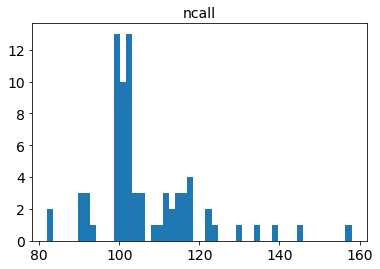

rango chisq : 4.699397408459967, 6419.376154726608
promedio chisq : 267.48389904324756
desviación estándar chisq : 875.6960115183348
mediana chisq : 32.10412268040816


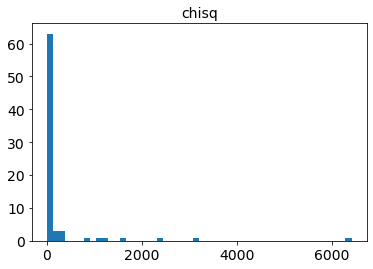

rango ndof : 6, 64
promedio ndof : 22.092105263157894
desviación estándar ndof : 12.611792342652285
mediana ndof : 18.0


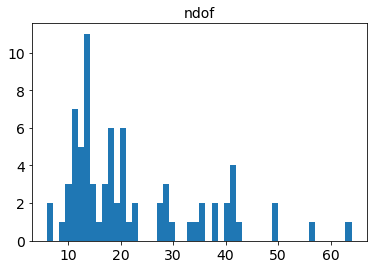

rango chisq/ndof : 0.44236796253013444, 128.38752309453216
promedio chisq/ndof : 8.07753666557171
desviación estándar chisq/ndof : 21.629770341137352
mediana chisq/ndof : 1.4956640308705555


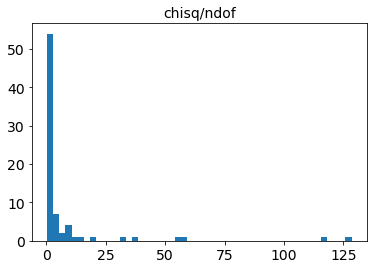

rango z : 0.0269, 0.14
promedio z : 0.07240263157894737
desviación estándar z : 0.024863225717408274
mediana z : 0.0718


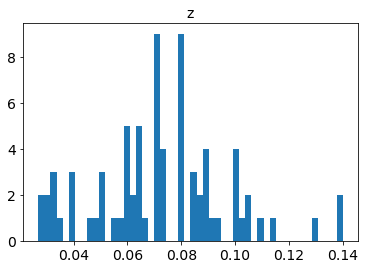

rango t0 : 58254.66089235649, 58395.614080229265
promedio t0 : 58322.16021341175
desviación estándar t0 : 38.658582636758695
mediana t0 : 58317.36089642557


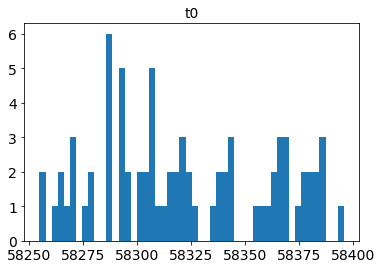

rango t0_err : 0.023821893428248586, 1.3873362933736644
promedio t0_err : 0.17723492266323823
desviación estándar t0_err : 0.18890362036147096
mediana t0_err : 0.12731797375454335


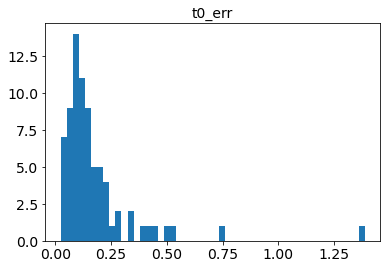

rango x0 : 0.00022820032888927092, 0.006300119044051247
promedio x0 : 0.0011312181876593815
desviación estándar x0 : 0.0012139948150673187
mediana x0 : 0.0006766695892666911


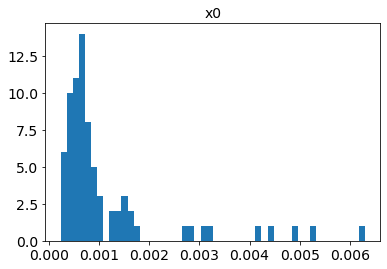

rango x0_err : 4.196005541534452e-06, 4.655013059213483e-05
promedio x0_err : 1.3008539713354153e-05
desviación estándar x0_err : 8.64739379520866e-06
mediana x0_err : 1.0081615766334888e-05


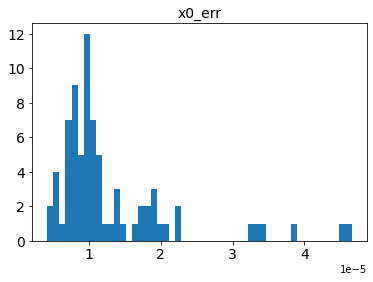

rango x1 : -2.164972393918284, 2.2803275812749906
promedio x1 : 0.025016117291032952
desviación estándar x1 : 1.052757969797178
mediana x1 : 0.23020701974095636


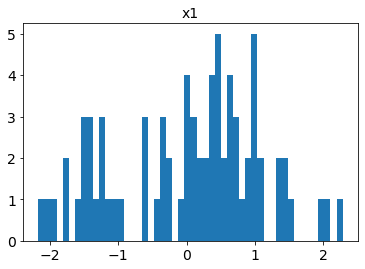

rango x1_err : 0.028506706328470015, 1.3164650963204692
promedio x1_err : 0.21634470312515056
desviación estándar x1_err : 0.19599069481944462
mediana x1_err : 0.16228862209035766


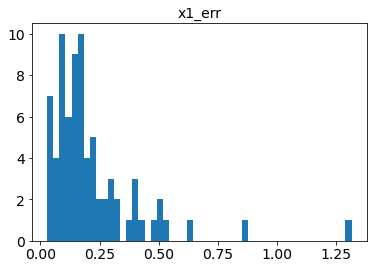

rango c : -0.17831176078141425, 0.2908359184665301
promedio c : -0.0009205304032845015
desviación estándar c : 0.09688110590837459
mediana c : -0.007107744954531953


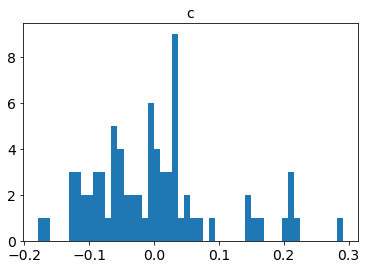

rango c_err : 0.004501769255508247, 0.0622639263448562
promedio c_err : 0.024617418761815536
desviación estándar c_err : 0.011975574253779268
mediana c_err : 0.022067109468898765


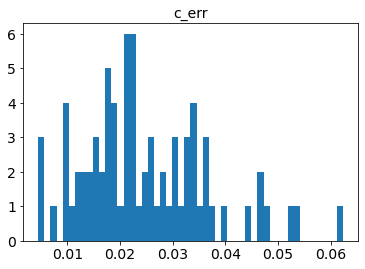

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


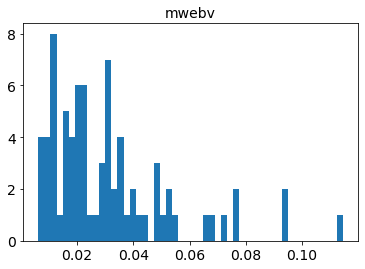

In [27]:
histogramas_estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa, z_real=True, oids=SN_Ia)

Estadísticas de las SN Ia 91-T

rango ncall : 101, 166
promedio ncall : 126.0
desviación estándar ncall : 25.54212207315594
mediana ncall : 116.0


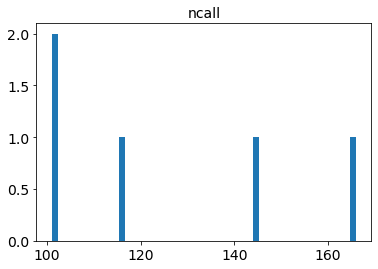

rango chisq : 69.97930207972132, 19240.058996685526
promedio chisq : 4722.692144009142
desviación estándar chisq : 7320.845431010374
mediana chisq : 1512.3988490268225


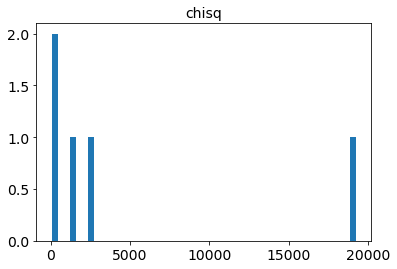

rango ndof : 16, 63
promedio ndof : 40.4
desviación estándar ndof : 19.12694434560837
mediana ndof : 36.0


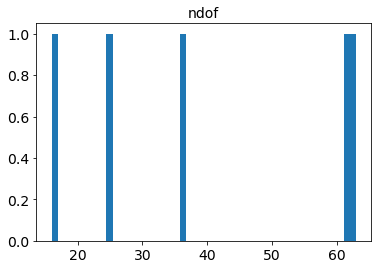

rango chisq/ndof : 4.373706379982583, 305.3977618521512
promedio chisq/ndof : 80.05358596899842
desviación estándar chisq/ndof : 113.89794969199566
mediana chisq/ndof : 42.01107913963396


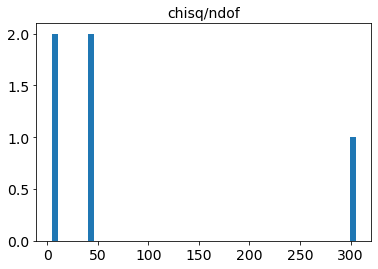

rango z : 0.0185, 0.08
promedio z : 0.046759999999999996
desviación estándar z : 0.02566247065268658
mediana z : 0.0365


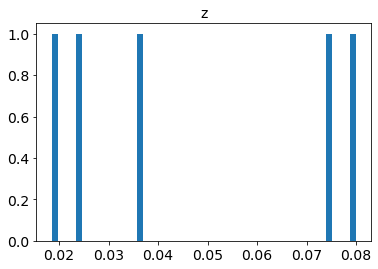

rango t0 : 58262.58357076317, 58328.82255327117
promedio t0 : 58291.02490218737
desviación estándar t0 : 24.230445974569875
mediana t0 : 58294.39897623152


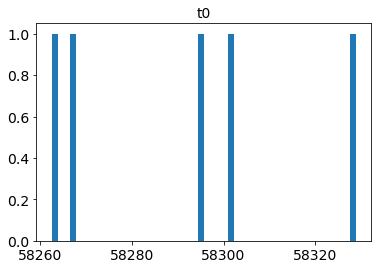

rango t0_err : 0.02522029877945897, 0.09232861749478616
promedio t0_err : 0.05114473136418383
desviación estándar t0_err : 0.024164941625480274
mediana t0_err : 0.04998654821611126


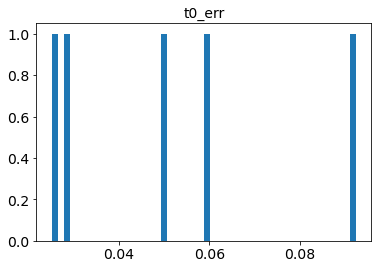

rango x0 : 0.0007341051725383859, 0.011094015298075272
promedio x0 : 0.0037332266190122517
desviación estándar x0 : 0.0038220110506521094
mediana x0 : 0.0024074873021531274


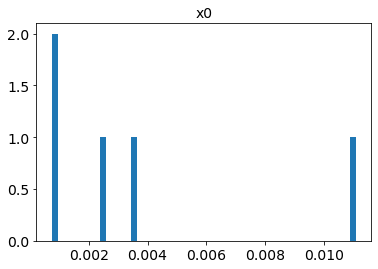

rango x0_err : 5.590017965979013e-06, 6.395852088265453e-05
promedio x0_err : 2.282514357215301e-05
desviación estándar x0_err : 2.1039959549274452e-05
mediana x0_err : 1.5233573588170055e-05


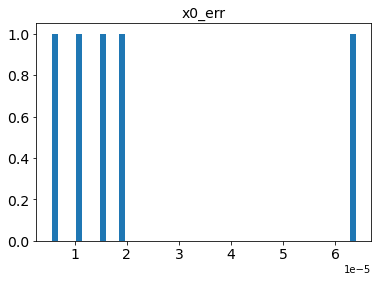

rango x1 : 0.7427862029444889, 2.222472782128073
promedio x1 : 1.255615248935973
desviación estándar x1 : 0.5103711053021323
mediana x1 : 1.0604598002200685


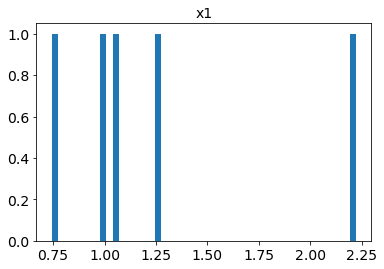

rango x1_err : 0.04020355333091346, 0.15448351783440062
promedio x1_err : 0.07651072974598085
desviación estándar x1_err : 0.042126368866948066
mediana x1_err : 0.06068576510415697


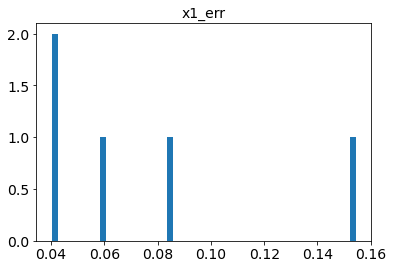

rango c : -0.051341874461644406, 0.6137454707035064
promedio c : 0.12589786933716515
desviación estándar c : 0.2546058990131824
mediana c : -0.0281204335141948


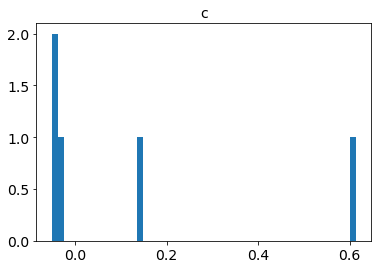

rango c_err : 0.005202057700851458, 0.019207754203955926
promedio c_err : 0.011518535065386217
desviación estándar c_err : 0.005279646350369947
mediana c_err : 0.009467105061567633


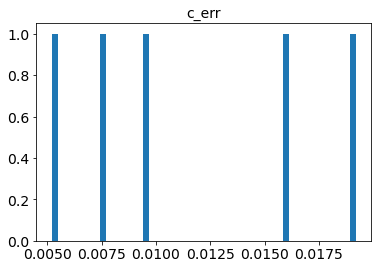

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


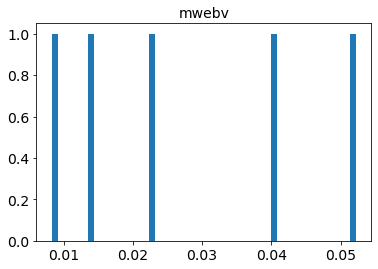

In [28]:
histogramas_estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa, z_real=True, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 103, 128
promedio ncall : 117.0
desviación estándar ncall : 10.424330514074594
mediana ncall : 120.0


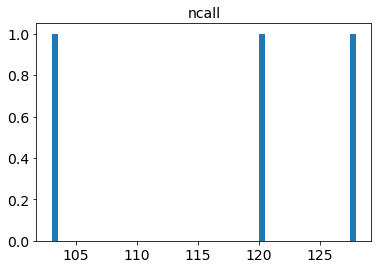

rango chisq : 1.2351738712913127, 21368.761710732033
promedio chisq : 7165.927772278587
desviación estándar chisq : 10043.053078877025
mediana chisq : 127.78643223243796


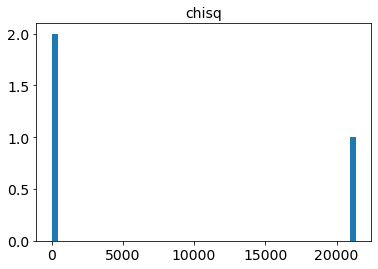

rango ndof : 4, 71
promedio ndof : 42.333333333333336
desviación estándar ndof : 28.193773938387334
mediana ndof : 52.0


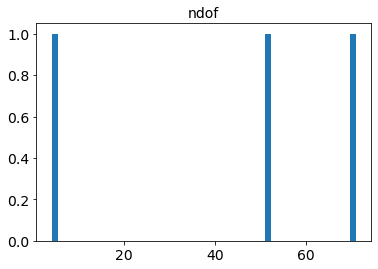

rango chisq/ndof : 0.3087934678228282, 300.9684747990427
promedio chisq/ndof : 101.24489988531697
desviación estándar chisq/ndof : 141.22861830726364
mediana chisq/ndof : 2.4574313890853454


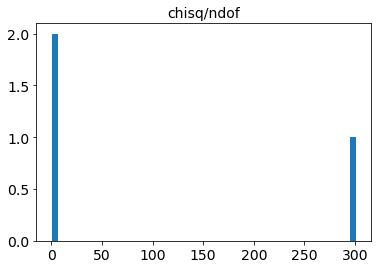

rango z : 0.0181, 0.12
promedio z : 0.06826666666666666
desviación estándar z : 0.04161524827378648
mediana z : 0.0667


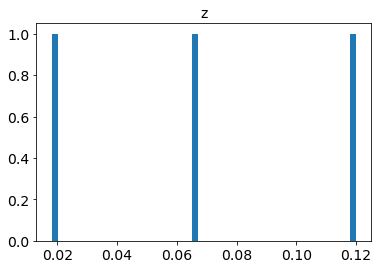

rango t0 : 58265.28523755933, 58363.8681782124
promedio t0 : 58309.92526901665
desviación estándar t0 : 40.78036044972211
mediana t0 : 58300.6223912782


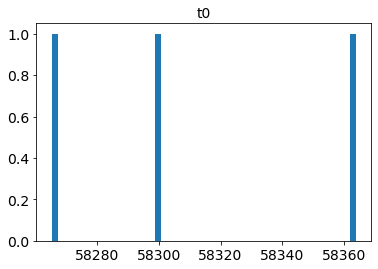

rango t0_err : 0.00994997473389958, 1.0064119983908313
promedio t0_err : 0.37004152325365186
desviación estándar t0_err : 0.4512808993057245
mediana t0_err : 0.09376259663622477


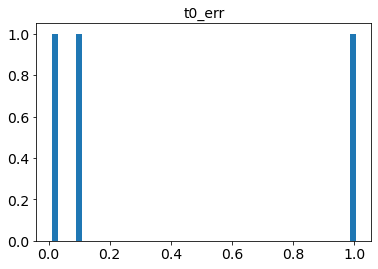

rango x0 : 0.0002408992436632857, 0.008532071566478162
promedio x0 : 0.0032305801684370254
desviación estándar x0 : 0.003758921420645775
mediana x0 : 0.0009187696951696302


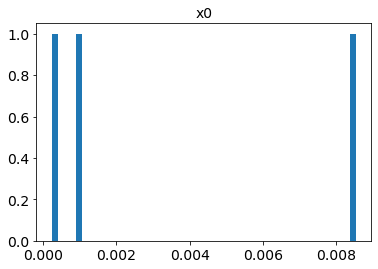

rango x0_err : 9.99628091570283e-06, 3.2771038839677875e-05
promedio x0_err : 1.9591382337675388e-05
desviación estándar x0_err : 9.637052660270578e-06
mediana x0_err : 1.6006827257645455e-05


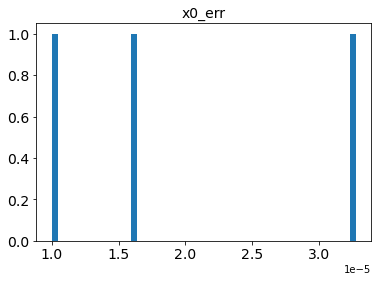

rango x1 : -1.4199483254548064, 0.7993423551283252
promedio x1 : -0.16532760031879282
desviación estándar x1 : 0.9289299822423547
mediana x1 : 0.12462316937010276


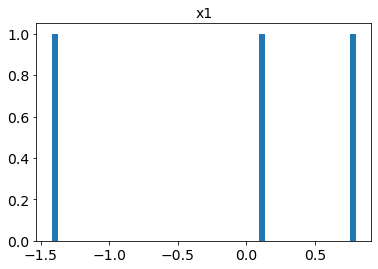

rango x1_err : 0.015622732213473964, 1.9865726930377352
promedio x1_err : 0.7047845779423599
desviación estándar x1_err : 0.9072174889465484
mediana x1_err : 0.11215830857587071


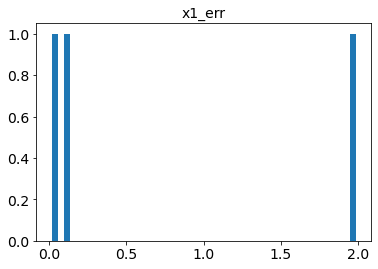

rango c : 0.01859167284749304, 0.13184305501341073
promedio c : 0.06846278367244221
desviación estándar c : 0.04721117066972157
mediana c : 0.05495362315642285


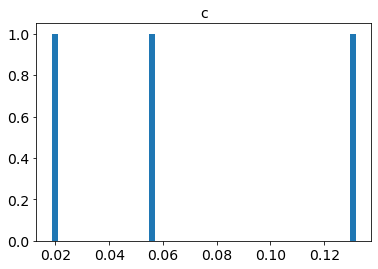

rango c_err : 0.0020608114076144783, 0.11904093410016503
promedio c_err : 0.0457390734840423
desviación estándar c_err : 0.052148860448539086
mediana c_err : 0.01611547494434738


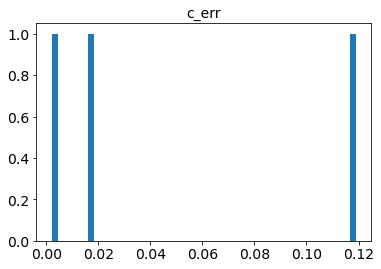

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


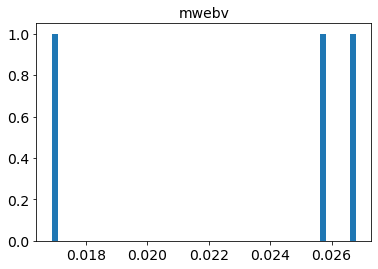

In [29]:
histogramas_estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa, z_real=True, oids=Ia_tipo_no_especif)

Estadísticas de todos los ajustes, ordenados por valor de chisq/ndof

In [30]:
estadisticas_SALT2_z_fijo = estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa, 
                                                    z_real=True).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del primer ajuste
con SALT2 y redshift real, ordenados según el valor de chisq/ndof

In [31]:
lista_oid_SALT2_z_fijo = list(estadisticas_SALT2_z_fijo['oid'])
lista_chisq_vs_ndof_SALT2_z_fijo = list(estadisticas_SALT2_z_fijo['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [32]:
median_chisq_vs_ndof_SALT2_z_fijo = np.median(np.array(estadisticas_SALT2_z_fijo['chisq/ndof']))
df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana = estadisticas_SALT2_z_fijo[estadisticas_SALT2_z_fijo['chisq/ndof'] > median_chisq_vs_ndof_SALT2_z_fijo].reset_index()
lista_oid_SALT2_z_fijo_sobre_mediana = list(df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [33]:
display(df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana[['oid', 
                                                     'chisq/ndof',
                                                     'z',
                                                     't0', 
                                                     't0_err']])

,oid,chisq/ndof,z,t0,t0_err
0,ZTF18abdkimx,1.587939,0.0800,58313.849572,0.112693
1,ZTF18abpamut,1.588199,0.0720,58367.663093,0.148358
2,ZTF18abclalx,1.610255,0.1000,58301.101550,0.182075
3,ZTF18abdbuty,1.675277,0.0600,58308.087150,0.125924
4,ZTF18aaxwjmp,1.677559,0.0800,58288.346748,0.079886
5,ZTF18abjvhec,1.708779,0.0570,58340.363787,0.100591
6,ZTF18aaxrvzj,1.824913,0.1100,58286.100037,0.154429
7,ZTF18abpaywm,1.912038,0.0450,58367.953432,0.084035
8,ZTF18abealop,1.929016,0.0666,58316.249790,0.192941
9,ZTF18aaxqyki,1.982013,0.1003,58286.485350,0.127086


Se ve que los valores de $\frac{\chi^{2}}{ndof}$  son muy altos, pese a que se esté usando el redshift real de la SN Ia para hacer los ajustes. Veamos si esto también pasa al ajustar el redshift de las SN y analicemos ese caso.

### Ajuste con redshift variable 

In [34]:
ajustes_SALT2_early_SNIa = modelo_ajustado_y_resultados('salt2', 
                                                        df_meta_early_SNIa, 
                                                        detect_early_SNIa, 
                                                        version='2.4',
                                                        print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 152, 1081
promedio ncall : 337.5
desviación estándar ncall : 160.83167892976937
mediana ncall : 290.0


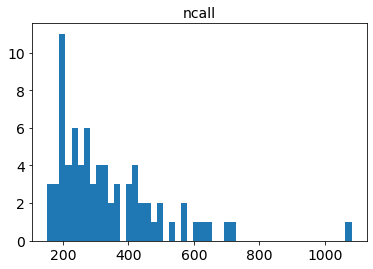

rango chisq : 4.702333060555874, 3559.673809217606
promedio chisq : 198.5539698738405
desviación estándar chisq : 565.2507687754745
mediana chisq : 31.472019545458128


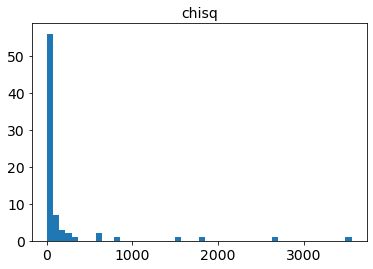

rango ndof : 5, 63
promedio ndof : 21.092105263157894
desviación estándar ndof : 12.611792342652285
mediana ndof : 17.0


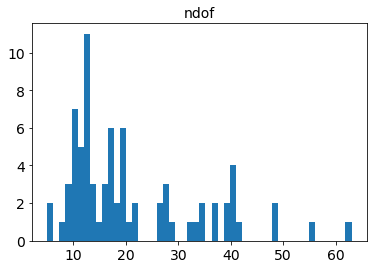

rango chisq/ndof : 0.47023330605558744, 119.60244725464872
promedio chisq/ndof : 6.817524675015284
desviación estándar chisq/ndof : 17.15175244272232
mediana chisq/ndof : 1.7137234829207104


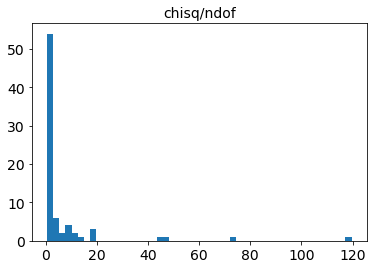

rango z : 0.0010000004500293118, 0.34896642675813283
promedio z : 0.17082130408843554
desviación estándar z : 0.09514780943227123
mediana z : 0.15510544614618324


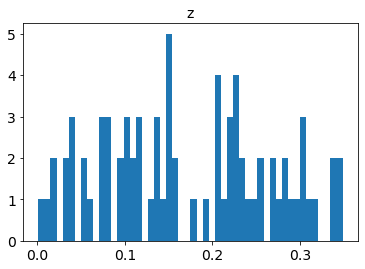

rango z_err : 1.597546400722294e-11, 0.1661183133954589
promedio z_err : 0.0197256930763175
desviación estándar z_err : 0.02107940558576384
mediana z_err : 0.01519546964864369


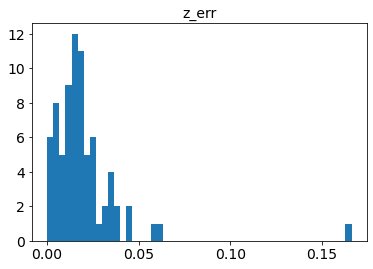

rango t0 : 58257.01493998718, 58396.5690826532
promedio t0 : 58323.07853326173
desviación estándar t0 : 38.777551978237675
mediana t0 : 58318.02787198714


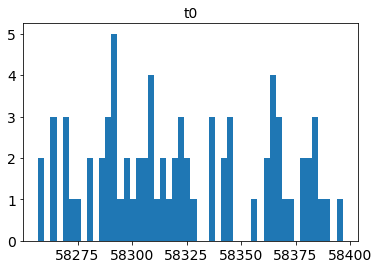

rango t0_err : 9.968061931431293e-10, 1.9826998928328976
promedio t0_err : 0.2912134215934394
desviación estándar t0_err : 0.30853930981034305
mediana t0_err : 0.20663286569651973


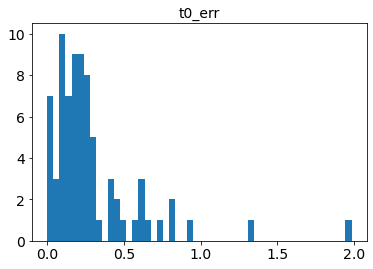

rango x0 : 0.00021593183581902124, 0.005073661055673994
promedio x0 : 0.001060709729554376
desviación estándar x0 : 0.0010750905892555108
mediana x0 : 0.0006606513054358968


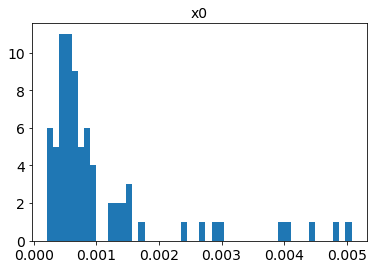

rango x0_err : 5.4301043387187246e-06, 6.090114800060389e-05
promedio x0_err : 1.6999953099566715e-05
desviación estándar x0_err : 1.05333676471705e-05
mediana x0_err : 1.2120710650305057e-05


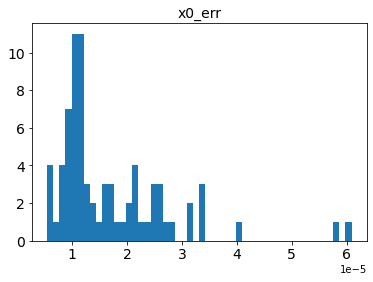

rango x1 : -2.02517714893721, 3.9999999603108023
promedio x1 : 0.06013003303747023
desviación estándar x1 : 1.1527935853610873
mediana x1 : 0.21239707164425736


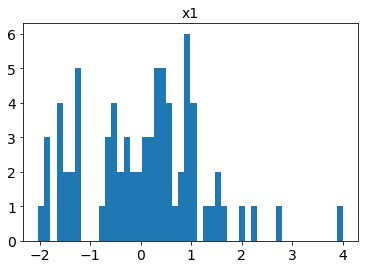

rango x1_err : 0.024738698563037342, 1.2361110642957445
promedio x1_err : 0.24088490739299936
desviación estándar x1_err : 0.2294869478228576
mediana x1_err : 0.1812024571784121


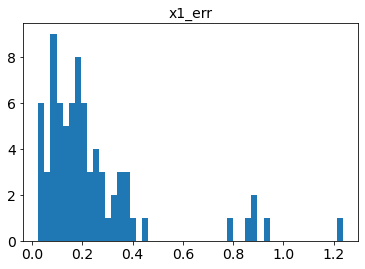

rango c : -0.34573583205279895, 0.2909049500748452
promedio c : -0.10167099530213462
desviación estándar c : 0.13101795894421112
mediana c : -0.10089540750054851


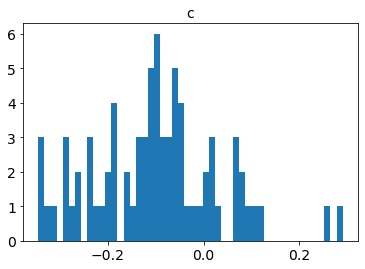

rango c_err : 0.0043564427044217036, 0.20047109140270977
promedio c_err : 0.03561625943724959
desviación estándar c_err : 0.027049986730994194
mediana c_err : 0.03143191738562156


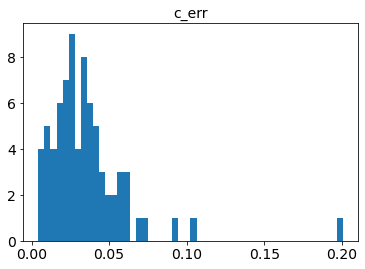

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


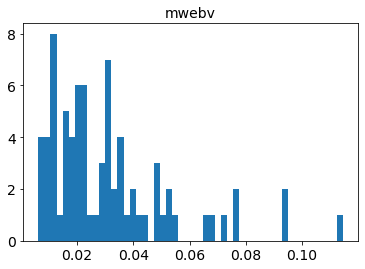

In [35]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 205, 325
promedio ncall : 255.0
desviación estándar ncall : 44.14068418137626
mediana ncall : 266.0


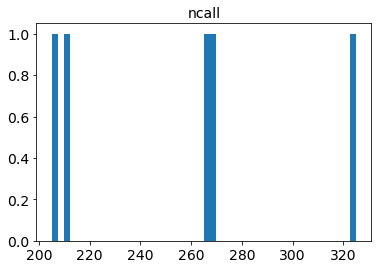

rango chisq : 72.28230319809185, 19235.449527832086
promedio chisq : 4417.433398642831
desviación estándar chisq : 7430.427870393182
mediana chisq : 1113.15305404752


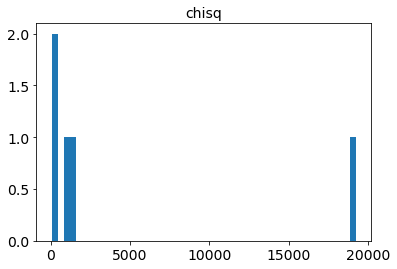

rango ndof : 15, 62
promedio ndof : 39.4
desviación estándar ndof : 19.12694434560837
mediana ndof : 35.0


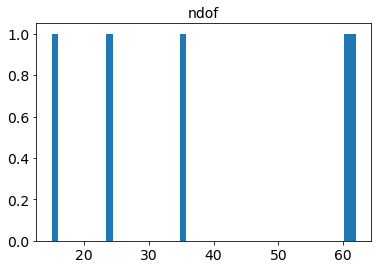

rango chisq/ndof : 4.8188202132061235, 310.24918593277556
promedio chisq/ndof : 76.52447309916916
desviación estándar chisq/ndof : 117.71789806961334
mediana chisq/ndof : 18.248410722090494


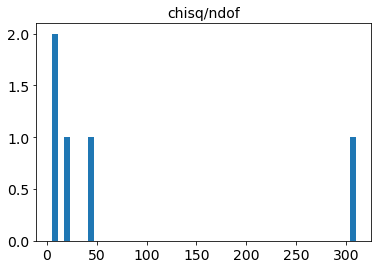

rango z : 0.019878795708199736, 0.4403630136876394
promedio z : 0.21542578589690672
desviación estándar z : 0.13723186853885602
mediana z : 0.2239787095624099


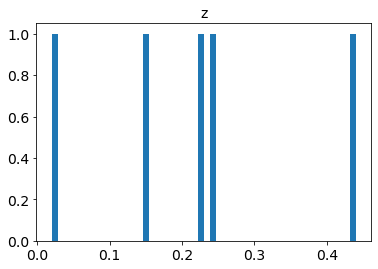

rango z_err : 0.001915966131772832, 0.008383837009476355
promedio z_err : 0.004597829089949454
desviación estándar z_err : 0.0029368346828326118
mediana z_err : 0.0028123416473257723


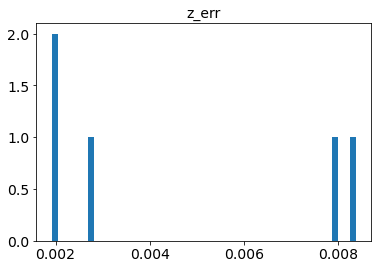

rango t0 : 58264.17154077921, 58334.99388078862
promedio t0 : 58292.97238999228
desviación estándar t0 : 25.768456955369984
mediana t0 : 58295.95926765857


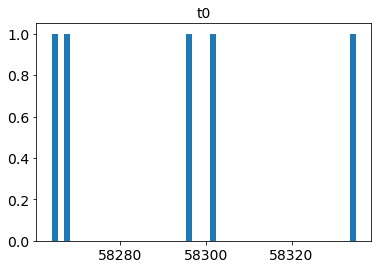

rango t0_err : 0.031050305311509874, 0.10318790457677096
promedio t0_err : 0.067199786920537
desviación estándar t0_err : 0.02534646795885671
mediana t0_err : 0.06677378705717274


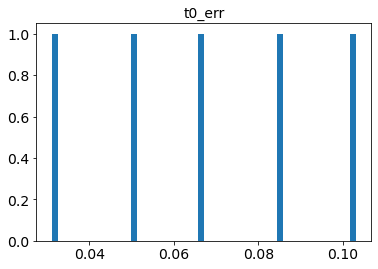

rango x0 : 0.0006541735176434569, 0.011187072147821797
promedio x0 : 0.0037365581442325726
desviación estándar x0 : 0.0038568334943412095
mediana x0 : 0.0027527028250575463


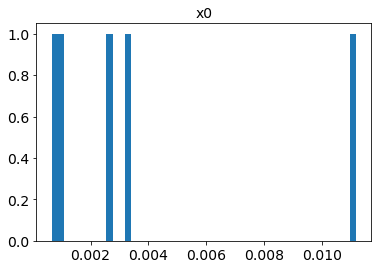

rango x0_err : 9.342447173274886e-06, 7.654066411537456e-05
promedio x0_err : 3.0558889252744263e-05
desviación estándar x0_err : 2.50611084181141e-05
mediana x0_err : 1.4621520460634937e-05


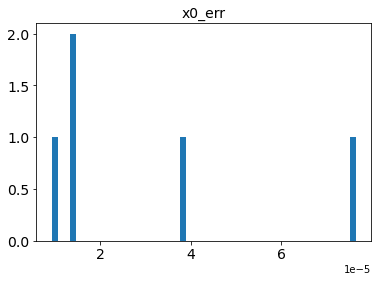

rango x1 : 0.46278406335669775, 3.152286037961926
promedio x1 : 1.5152101455472788
desviación estándar x1 : 0.9686351763895663
mediana x1 : 1.19265197472963


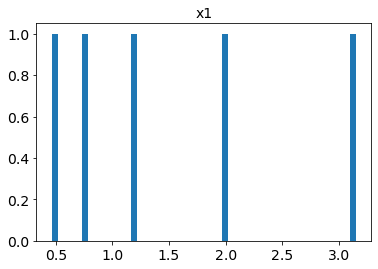

rango x1_err : 0.035099280621482265, 0.1630772992680214
promedio x1_err : 0.09225925085020466
desviación estándar x1_err : 0.046872233359370956
mediana x1_err : 0.09018441598250737


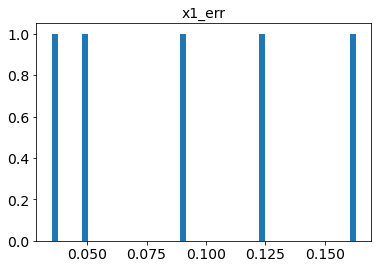

rango c : -0.24291660669955367, -0.006532916285619972
promedio c : -0.11703790039797482
desviación estándar c : 0.08531947167549848
mediana c : -0.12543719034177736


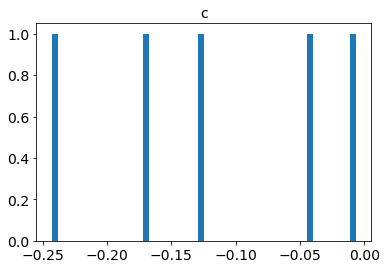

rango c_err : 0.005041548982167049, 0.026818889489959002
promedio c_err : 0.013549148865018961
desviación estándar c_err : 0.00907796915947101
mediana c_err : 0.008800895987383567


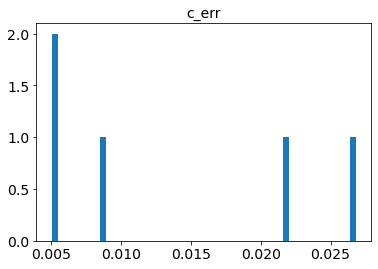

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


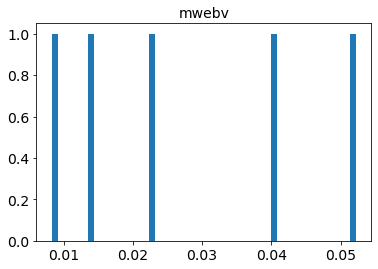

In [36]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 183, 606
promedio ncall : 415.3333333333333
desviación estándar ncall : 175.1843473474601
mediana ncall : 457.0


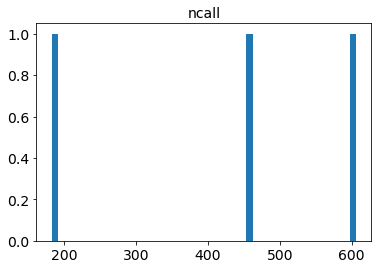

rango chisq : 1.272570386239837, 21325.384807206337
promedio chisq : 7154.386016794747
desviación estándar chisq : 10020.561418014631
mediana chisq : 136.5006727916631


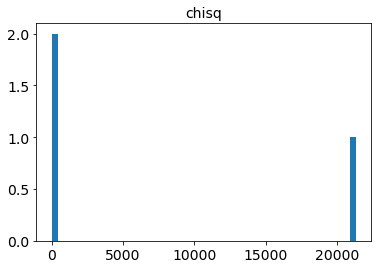

rango ndof : 3, 70
promedio ndof : 41.333333333333336
desviación estándar ndof : 28.193773938387334
mediana ndof : 51.0


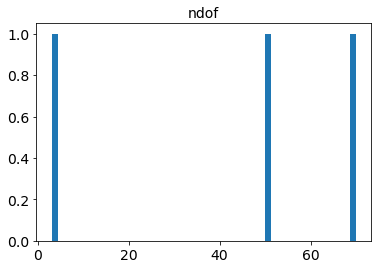

rango chisq/ndof : 0.4241901287466123, 304.64835438866197
promedio chisq/ndof : 102.58300943254575
desviación estándar chisq/ndof : 142.8847342693842
mediana chisq/ndof : 2.6764837802286885


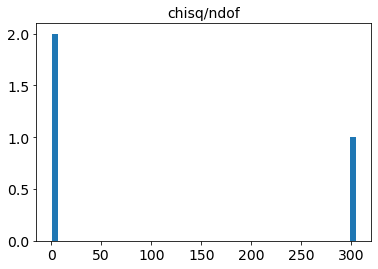

rango z : 0.25528816377305014, 0.2747018677435432
promedio z : 0.26212425843655435
desviación estándar z : 0.008904931901835717
mediana z : 0.2563827437930695


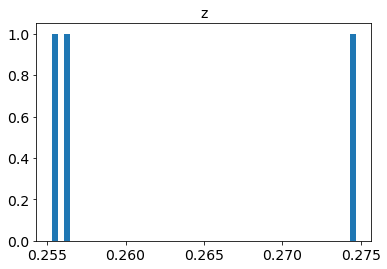

rango z_err : 1.3525767627559082e-05, 0.4139954465671014
promedio z_err : 0.16193889145381749
desviación estándar z_err : 0.1806248066533913
mediana z_err : 0.0718077020267235


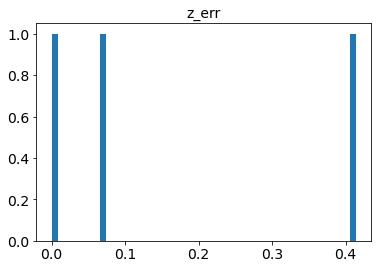

rango t0 : 58267.5439783832, 58363.95650191905
promedio t0 : 58311.2749763157
desviación estándar t0 : 39.865838615935516
mediana t0 : 58302.32444864485


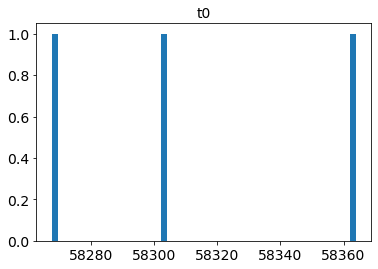

rango t0_err : 1.1542870197445154e-06, 123.00576427039414
promedio t0_err : 41.362728622506744
desviación estándar t0_err : 57.73203536010555
mediana t0_err : 1.0824204428390658


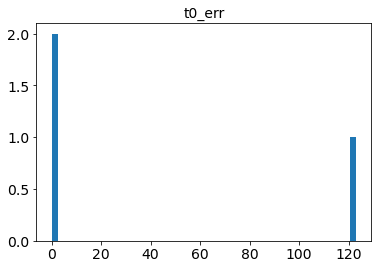

rango x0 : 0.00025894719712728627, 0.00755212228315881
promedio x0 : 0.002884349695441679
desviación estándar x0 : 0.003309184934435562
mediana x0 : 0.0008419796060389409


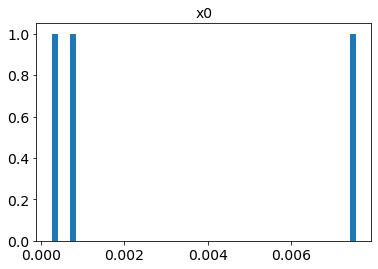

rango x0_err : 1.0085743090363711e-05, 1.0000010000366952
promedio x0_err : 0.3333507548248406
desviación estándar x0_err : 0.47139290923988403
mediana x0_err : 4.117869473610531e-05


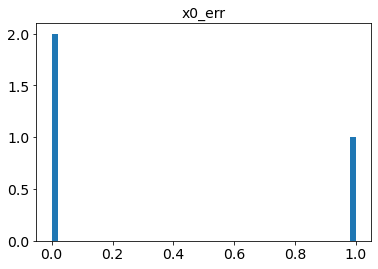

rango x1 : -2.305271444535058, 0.30544966407150653
promedio x1 : -0.6528478449072956
desviación estándar x1 : 1.1734065646713359
mediana x1 : 0.0412782457416645


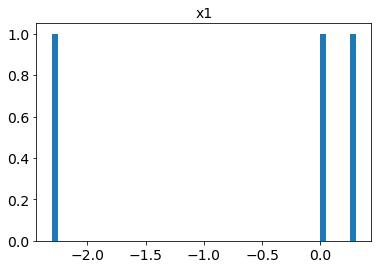

rango x1_err : 0.009495872892204549, 5.692635735224446
promedio x1_err : 2.4751760269392062
desviación estándar x1_err : 2.3802519540776093
mediana x1_err : 1.7233964727009694


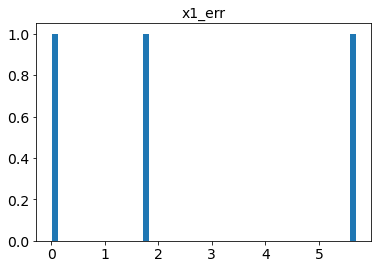

rango c : -0.22894087398532115, -0.20328992367848298
promedio c : -0.21904664027028384
desviación estándar c : 0.011262603074518476
mediana c : -0.22490912314704736


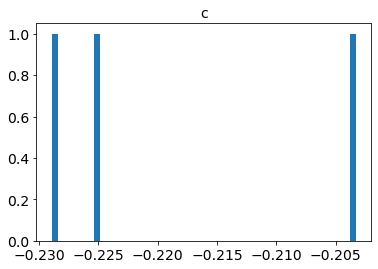

rango c_err : 0.0016599220068092002, 0.4982182012838825
promedio c_err : 0.23448147479270187
desviación estándar c_err : 0.20389432255226903
mediana c_err : 0.2035663010874139


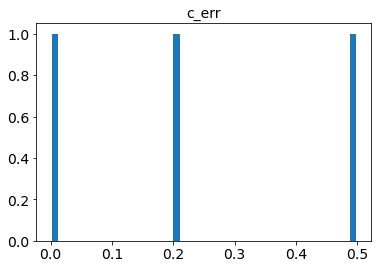

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


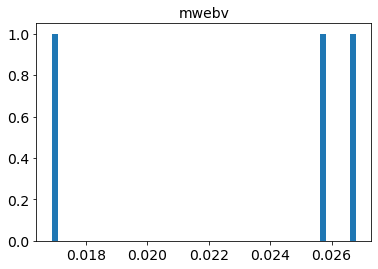

In [37]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [38]:
estadisticas_SALT2_z_var = estadisticas_resultados(ajustes_SALT2_early_SNIa).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del primer ajuste
con SALT2 y redshift variable, ordenados según el valor de chisq/ndof

In [39]:
lista_oid_SALT2_z_var = list(estadisticas_SALT2_z_var['oid'])
lista_chisq_vs_ndof_SALT2_z_var = list(estadisticas_SALT2_z_var['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [40]:
median_chisq_vs_ndof_SALT2_z_var = np.median(np.array(estadisticas_SALT2_z_var['chisq/ndof']))
df_SALT2_z_var_chisq_vs_ndof_sobre_mediana = estadisticas_SALT2_z_var[estadisticas_SALT2_z_var['chisq/ndof'] > median_chisq_vs_ndof_SALT2_z_var].reset_index()
lista_oid_SALT2_z_var_sobre_mediana = list(df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [41]:
display(df_SALT2_z_var_chisq_vs_ndof_sobre_mediana[['oid', 
                                                    'chisq/ndof',
                                                    'z', 
                                                    'z_err', 
                                                    't0', 
                                                    't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
0,ZTF18abdfwur,1.815980,0.227314,0.012858,58311.487508,0.167697
1,ZTF18abealop,1.864397,0.001000,0.014048,58315.390314,0.198186
2,ZTF18abrzeym,1.871267,0.136248,0.018855,58374.232011,0.171011
3,ZTF18aaxrvzj,1.873503,0.220224,0.018028,58287.226885,0.206125
4,ZTF18absdgon,1.941578,0.254116,0.025015,58377.339180,0.201737
5,ZTF18abimsyv,2.021273,0.230718,0.013452,58336.099961,0.183273
6,ZTF18abkifng,2.029426,0.153458,0.033023,58344.007614,0.222102
7,ZTF18aaxqyki,2.099737,0.106999,0.033515,58286.567151,0.438536
8,ZTF18aaxwjmp,2.172378,0.335645,0.014701,58290.774825,0.238167
9,ZTF18abbvsiv,2.219474,0.209209,0.009346,58297.785635,0.178453


Tabla de astropy con las detecciones, en el formato que requiere
sncosmo para hacer los ajustes

In [42]:
table_early_SNIa = astropy_table_detections(df_meta_early_SNIa,
                                            detect_early_SNIa)

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  0.47023330605558744


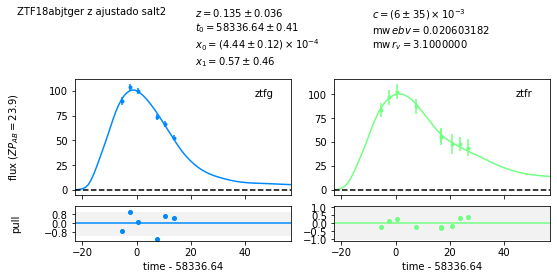

In [43]:
ajuste(lista_oid_SALT2_z_var[1], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var[1])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.5551697749497996


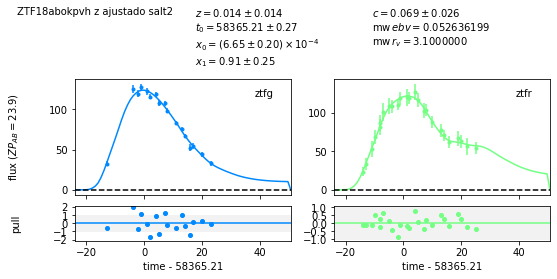

In [44]:
ajuste(lista_oid_SALT2_z_var[2], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var[2])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.6049175865617807


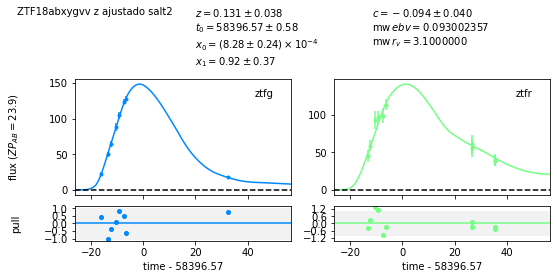

In [45]:
ajuste(lista_oid_SALT2_z_var[6], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var[6])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.8265079196060631


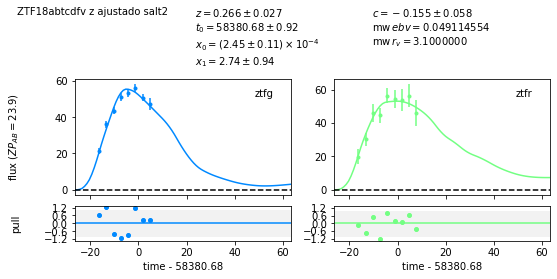

In [46]:
ajuste(lista_oid_SALT2_z_var[12], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var[12])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.3198716083847688


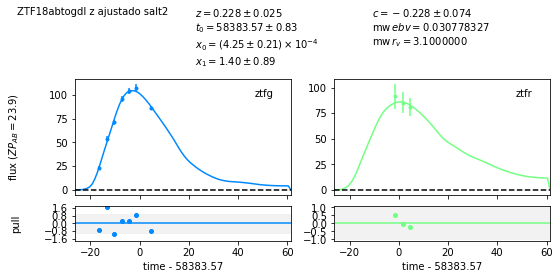

In [47]:
ajuste(lista_oid_SALT2_z_var[31], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var[31])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ mayores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  1.8159802318084


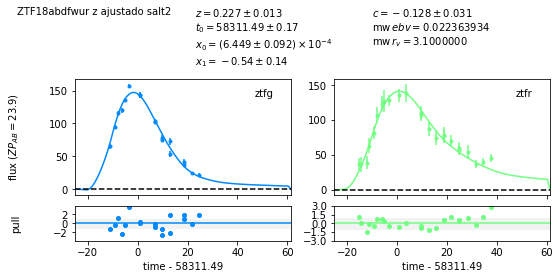

In [48]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[0], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][0])

 ==== Con ajuste del redshift ====
chisq/ndof :  3.654664148249278


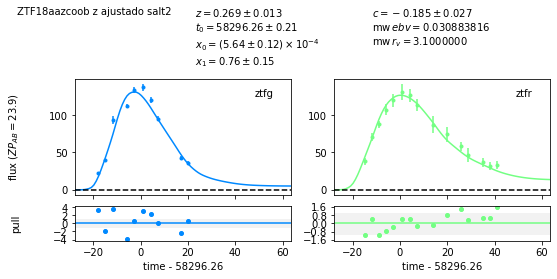

In [49]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[14], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][14])

 ==== Con ajuste del redshift ====
chisq/ndof :  3.7532045333725486


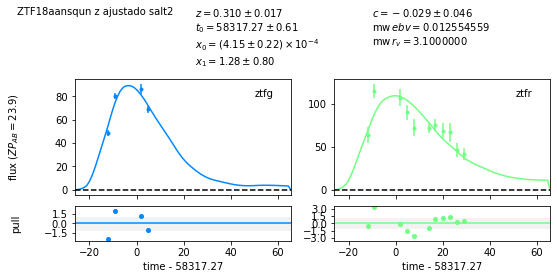

In [50]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[15], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][15])

 ==== Con ajuste del redshift ====
chisq/ndof :  3.840131934961187


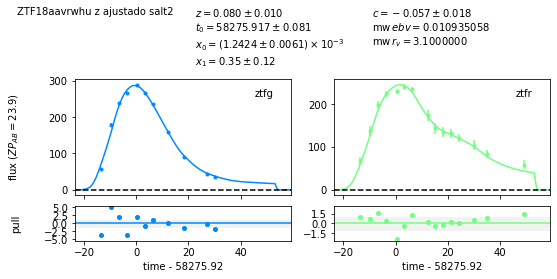

In [51]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[16], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][16])

 ==== Con ajuste del redshift ====
chisq/ndof :  5.402372166874435


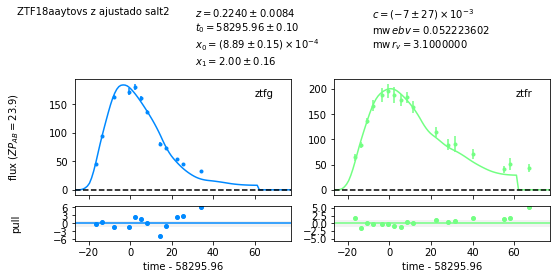

In [52]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[21], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][21])

 ==== Con ajuste del redshift ====
chisq/ndof :  7.722644047719621


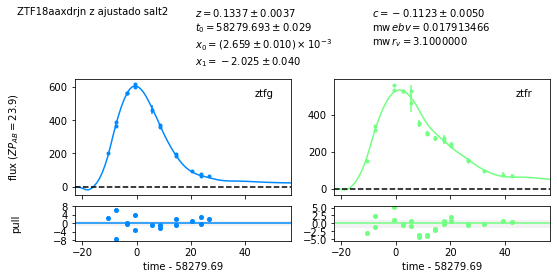

In [53]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[24], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][24])

 ==== Con ajuste del redshift ====
chisq/ndof :  8.216720814043448


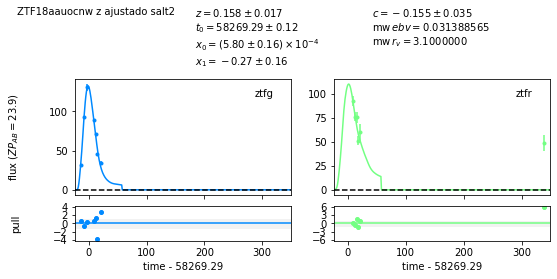

In [54]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[25], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][25])

In [55]:
%%time
ajuste(lista_oid_SALT2_z_var_sobre_mediana[25], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4', graficos=False)

CPU times: user 129 ms, sys: 8 µs, total: 129 ms
Wall time: 127 ms


['ZTF18aauocnw',
       success: True
       message: 'Minimization exited successfully.'
         ncall: 204
         chisq: 65.73376651234759
          ndof: 8
   param_names: ['z', 't0', 'x0', 'x1', 'c', 'mwebv', 'mwr_v']
    parameters: array([ 1.57735448e-01,  5.82692936e+04,  5.80281670e-04, -2.73844220e-01,
        -1.54810285e-01,  3.13885652e-02,  3.10000000e+00])
  vparam_names: ['z', 't0', 'x0', 'x1', 'c']
    covariance: array([[ 2.95279014e-04,  1.16472821e-03, -1.85624666e-07,
         -6.87478752e-04, -2.50685935e-04],
        [ 1.16472821e-03,  1.43757910e-02, -1.12090424e-06,
          2.30334700e-03, -1.20677200e-03],
        [-1.85624666e-07, -1.12090424e-06,  2.49126085e-10,
         -1.15707178e-06,  1.35048683e-07],
        [-6.87478752e-04,  2.30334700e-03, -1.15707178e-06,
          2.63638678e-02,  1.75696889e-03],
        [-2.50685935e-04, -1.20677200e-03,  1.35048683e-07,
          1.75696889e-03,  1.21241595e-03]])
        errors: OrderedDict([('z', 0.017171

 ==== Con ajuste del redshift ====
chisq/ndof :  8.845976382294763


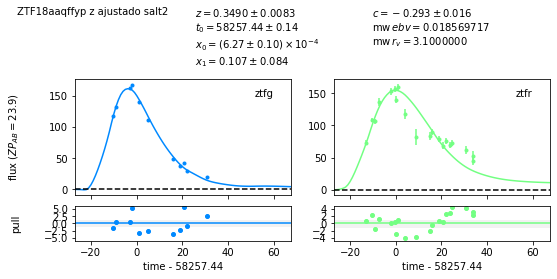

In [56]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[26], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][26])

 ==== Con ajuste del redshift ====
chisq/ndof :  12.84486862637627


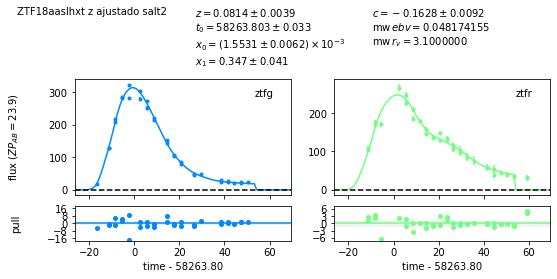

In [57]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[30], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][30])

 ==== Con ajuste del redshift ====
chisq/ndof :  119.60244725464872


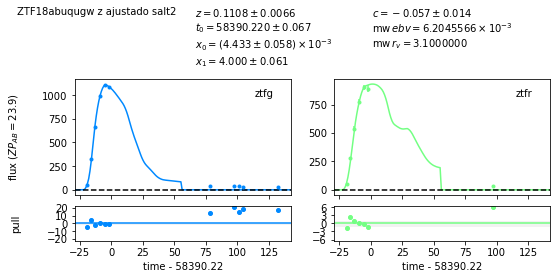

In [58]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[39], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4', )[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][39])

 ==== Con ajuste del redshift ====
chisq/ndof :  310.24918593277556


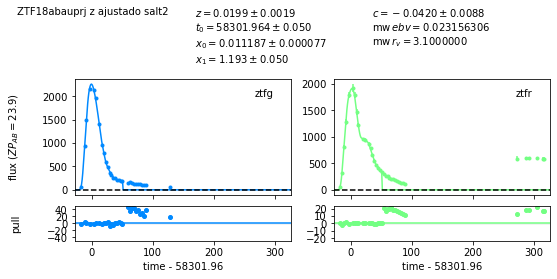

In [59]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana[41], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa, version='2.4')[0]
print('chisq/ndof : ', 
      df_SALT2_z_var_chisq_vs_ndof_sobre_mediana['chisq/ndof'][41])

De lo anterior se ve que los ajustes no son muy buenos y que el valor de $\frac{\chi^{2}}{ndof}$ aumenta mucho cuando hay puntos fuera del rango del modelo. Por lo anterior, se harán cortes en las observaciones para estar dentro del rango de tiempo del modelo, determinado a partir del valor del tiempo del máximo ($t_0$) y del redshift ($z$) determinado en el primer ajuste. 

Donde se utilizarán las observaciones realizadas en un tiempo $t$ que satisface que: $t_0 - 20 \cdot (1+z) \leq t \leq t_0 + 50 \cdot (1+z)$.

## Ajuste con observaciones en el rango de tiempo del modelo (determinado con $t_0$ y $z$ del primer ajuste)

### Ajuste con redshift real

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el primer ajuste con el modelo SALT2 y redshift real

In [60]:
detect_early_SNIa_cortes_t_SALT2_z_fijo = cortes_t_modelo(trest_min_modelo,
                                                          trest_max_modelo, 
                                                          detect_early_SNIa,
                                                          estadisticas_SALT2_z_fijo)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo

In [61]:
ajustes_SALT2_z_fijo_early_SNIa_cortes_t = modelo_ajustado_y_resultados('salt2', 
                                                                        df_meta_early_SNIa, 
                                                                        detect_early_SNIa_cortes_t_SALT2_z_fijo, 
                                                                        version='2.4', 
                                                                        z_real=True,
                                                                        print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 82, 158
promedio ncall : 106.36842105263158
desviación estándar ncall : 12.78037363063006
mediana ncall : 102.0


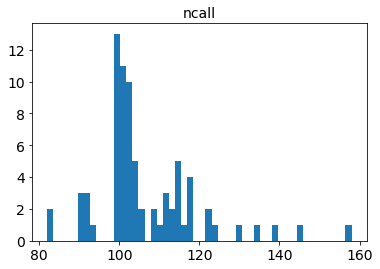

rango chisq : 4.699397408459967, 789.0441000818224
promedio chisq : 57.28883474866465
desviación estándar chisq : 102.97533079976944
mediana chisq : 30.95688365167807


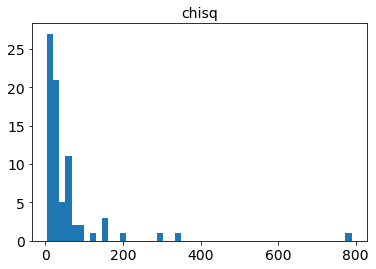

rango ndof : 6, 60
promedio ndof : 20.842105263157894
desviación estándar ndof : 11.09534353679263
mediana ndof : 17.5


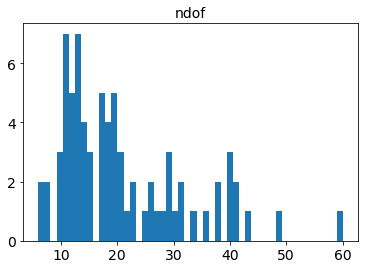

rango chisq/ndof : 0.44236796253013444, 19.116075103470454
promedio chisq/ndof : 2.586153052859824
desviación estándar chisq/ndof : 3.4800390008201716
mediana chisq/ndof : 1.4055648022953047


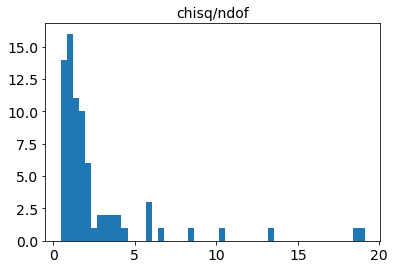

rango z : 0.0269, 0.14
promedio z : 0.07240263157894737
desviación estándar z : 0.024863225717408274
mediana z : 0.0718


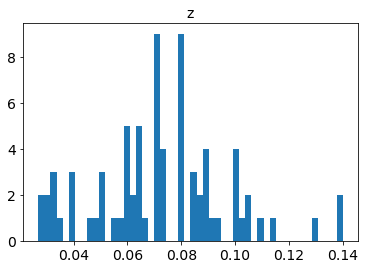

rango t0 : 58254.66089235649, 58395.614080229265
promedio t0 : 58322.16021690317
desviación estándar t0 : 38.658547894498525
mediana t0 : 58317.36089642557


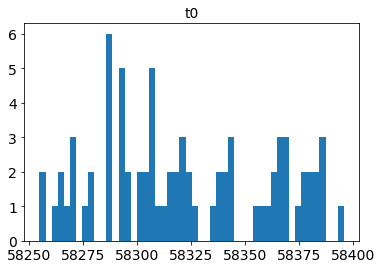

rango t0_err : 0.0238219700549962, 1.3873362933736644
promedio t0_err : 0.17723436104537732
desviación estándar t0_err : 0.18890372133434774
mediana t0_err : 0.12730718941202213


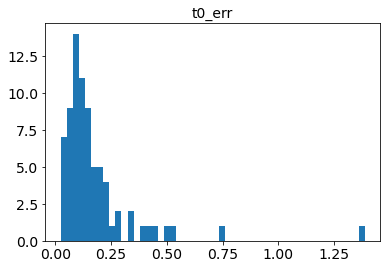

rango x0 : 0.00022820032888927092, 0.006300131544704217
promedio x0 : 0.001131219605556756
desviación estándar x0 : 0.001213997475899248
mediana x0 : 0.0006766695892666911


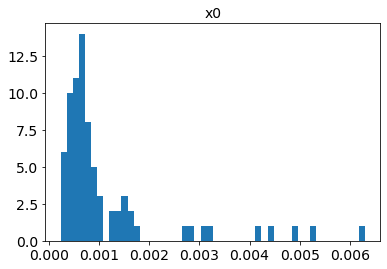

rango x0_err : 4.196005541534452e-06, 4.6541238323823553e-05
promedio x0_err : 1.3007469454345245e-05
desviación estándar x0_err : 8.644346283188019e-06
mediana x0_err : 1.0081615766334888e-05


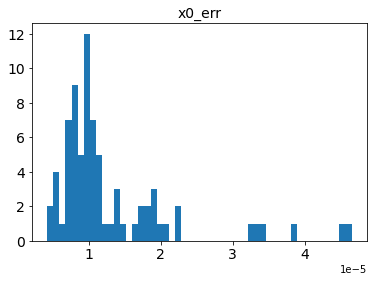

rango x1 : -2.164972393918284, 2.2803275812749906
promedio x1 : 0.02502487372035886
desviación estándar x1 : 1.05276133244122
mediana x1 : 0.23020701974095636


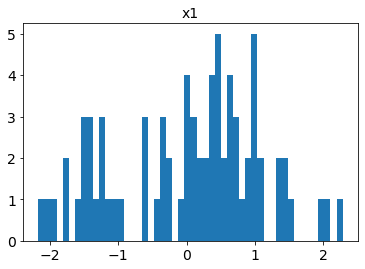

rango x1_err : 0.02850537136575612, 1.3164650963204692
promedio x1_err : 0.21634302990738435
desviación estándar x1_err : 0.19599142601060765
mediana x1_err : 0.16228862209035766


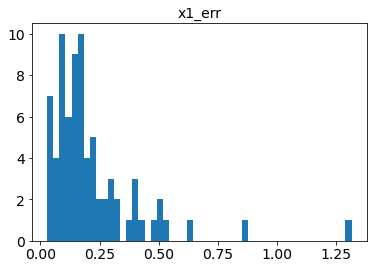

rango c : -0.17831176078141425, 0.2908359184665301
promedio c : -0.0009219917637628265
desviación estándar c : 0.09688146484653935
mediana c : -0.007107744954531953


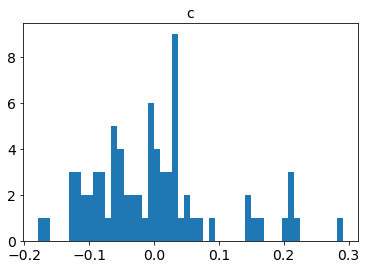

rango c_err : 0.004501216867608889, 0.0622639263448562
promedio c_err : 0.02461713394787852
desviación estándar c_err : 0.011975866040187917
mediana c_err : 0.022067109468898765


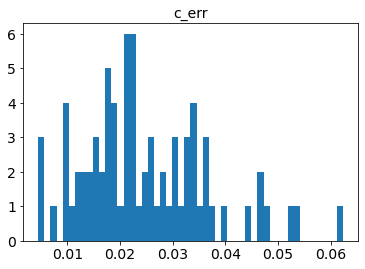

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


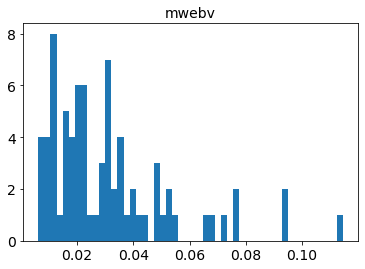

In [62]:
histogramas_estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa_cortes_t, 
                                    z_real=True, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 101, 168
promedio ncall : 125.6
desviación estándar ncall : 25.648391762447794
mediana ncall : 116.0


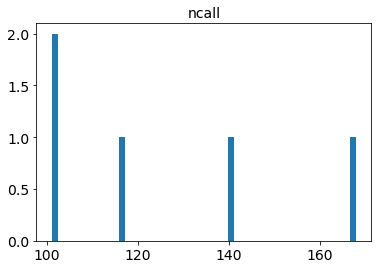

rango chisq : 66.97735776000323, 160.66945231403608
promedio chisq : 109.84644869070412
desviación estándar chisq : 36.807185886581166
mediana chisq : 114.52274248386499


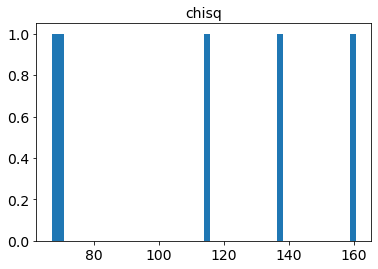

rango ndof : 16, 53
promedio ndof : 30.2
desviación estándar ndof : 12.812493902437573
mediana ndof : 26.0


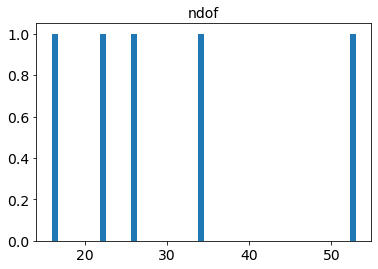

rango chisq/ndof : 2.1608064619597167, 6.179594319770619
promedio chisq/ndof : 3.958079378275685
desviación estándar chisq/ndof : 1.3548632609960438
mediana chisq/ndof : 4.031864376938088


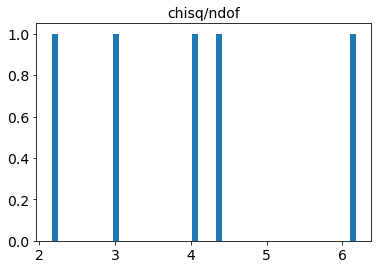

rango z : 0.0185, 0.08
promedio z : 0.046759999999999996
desviación estándar z : 0.02566247065268658
mediana z : 0.0365


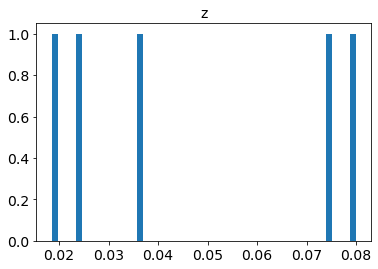

rango t0 : 58262.58357076317, 58328.82248790279
promedio t0 : 58291.02486706602
desviación estándar t0 : 24.23042049587358
mediana t0 : 58294.39887262352


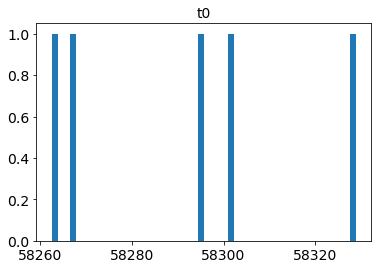

rango t0_err : 0.025213907145371195, 0.09232316587440437
promedio t0_err : 0.051141935712075794
desviación estándar t0_err : 0.024164521237449398
mediana t0_err : 0.0499846780403459


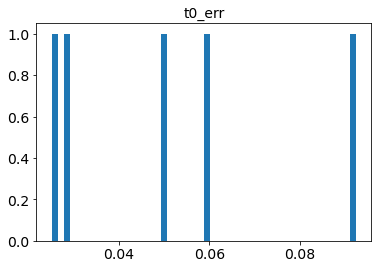

rango x0 : 0.0007341051725383859, 0.01109407608538051
promedio x0 : 0.003733242929886329
desviación estándar x0 : 0.003822031102608956
mediana x0 : 0.0024074825110376253


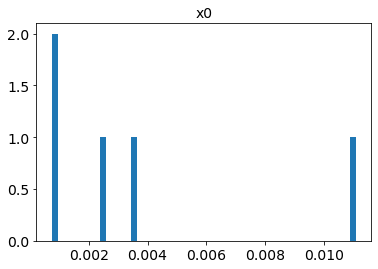

rango x0_err : 5.590017965979013e-06, 6.388406624862285e-05
promedio x0_err : 2.2807668459843285e-05
desviación estándar x0_err : 2.1011529727224812e-05
mediana x0_err : 1.5231181316610293e-05


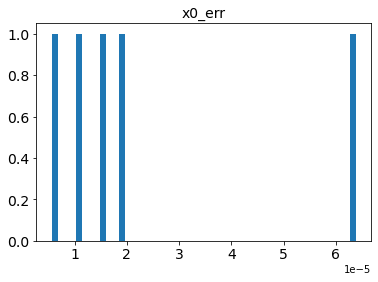

rango x1 : 0.7427790735273909, 2.22224807457989
promedio x1 : 1.2555951139559824
desviación estándar x1 : 0.5102706222750939
mediana x1 : 1.0604598002200685


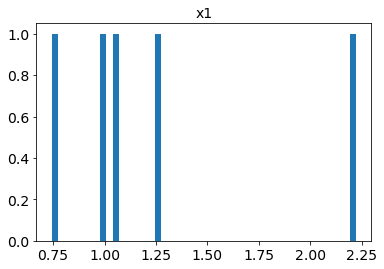

rango x1_err : 0.040201363549412124, 0.15445563969243045
promedio x1_err : 0.07649603797019819
desviación estándar x1_err : 0.04212255812562524
mediana x1_err : 0.060675586186119956


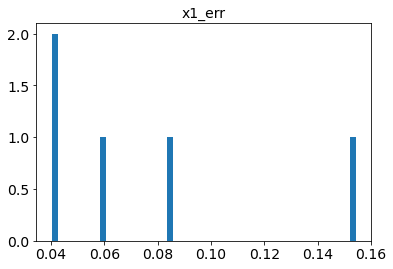

rango c : -0.05134335381066413, 0.6137259453196798
promedio c : 0.12588540978667478
desviación estándar c : 0.25459795824929776
mediana c : -0.02811995157445354


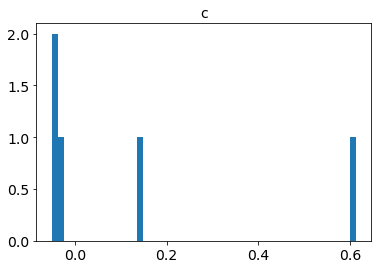

rango c_err : 0.0052016246999908805, 0.019207070569853657
promedio c_err : 0.01151621172803987
desviación estándar c_err : 0.005280803900321157
mediana c_err : 0.009462846728684285


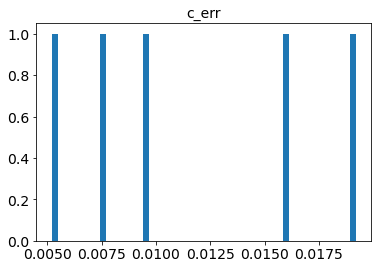

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


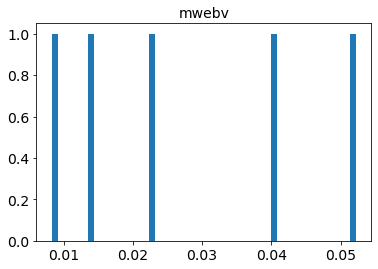

In [63]:
histogramas_estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa_cortes_t, 
                                    z_real=True, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 101, 168
promedio ncall : 125.6
desviación estándar ncall : 25.648391762447794
mediana ncall : 116.0


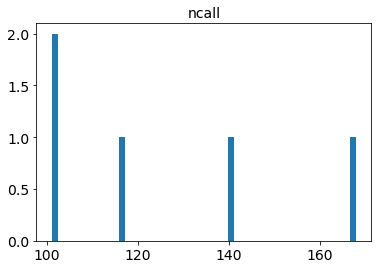

rango chisq : 66.97735776000323, 160.66945231403608
promedio chisq : 109.84644869070412
desviación estándar chisq : 36.807185886581166
mediana chisq : 114.52274248386499


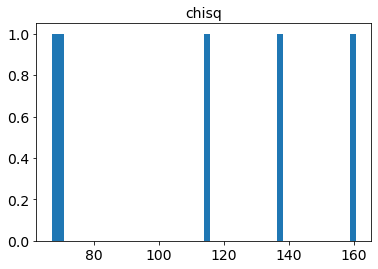

rango ndof : 16, 53
promedio ndof : 30.2
desviación estándar ndof : 12.812493902437573
mediana ndof : 26.0


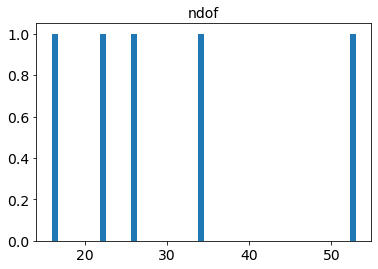

rango chisq/ndof : 2.1608064619597167, 6.179594319770619
promedio chisq/ndof : 3.958079378275685
desviación estándar chisq/ndof : 1.3548632609960438
mediana chisq/ndof : 4.031864376938088


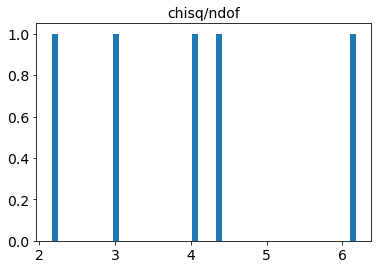

rango z : 0.0185, 0.08
promedio z : 0.046759999999999996
desviación estándar z : 0.02566247065268658
mediana z : 0.0365


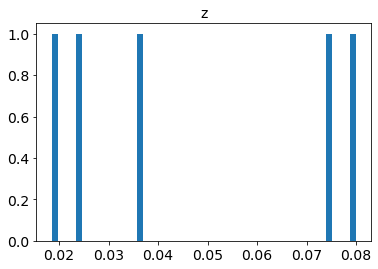

rango t0 : 58262.58357076317, 58328.82248790279
promedio t0 : 58291.02486706602
desviación estándar t0 : 24.23042049587358
mediana t0 : 58294.39887262352


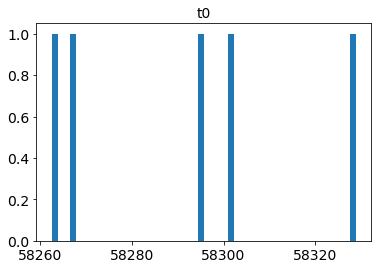

rango t0_err : 0.025213907145371195, 0.09232316587440437
promedio t0_err : 0.051141935712075794
desviación estándar t0_err : 0.024164521237449398
mediana t0_err : 0.0499846780403459


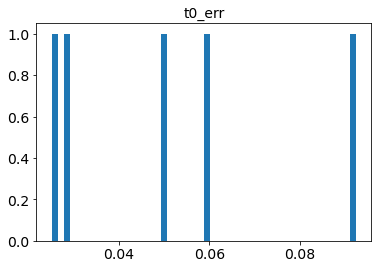

rango x0 : 0.0007341051725383859, 0.01109407608538051
promedio x0 : 0.003733242929886329
desviación estándar x0 : 0.003822031102608956
mediana x0 : 0.0024074825110376253


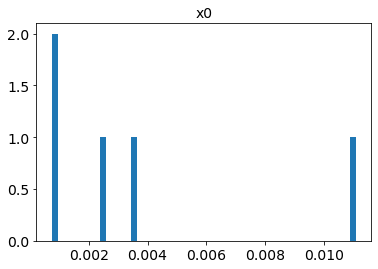

rango x0_err : 5.590017965979013e-06, 6.388406624862285e-05
promedio x0_err : 2.2807668459843285e-05
desviación estándar x0_err : 2.1011529727224812e-05
mediana x0_err : 1.5231181316610293e-05


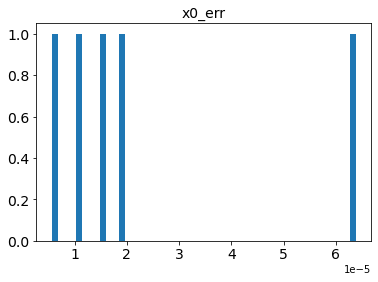

rango x1 : 0.7427790735273909, 2.22224807457989
promedio x1 : 1.2555951139559824
desviación estándar x1 : 0.5102706222750939
mediana x1 : 1.0604598002200685


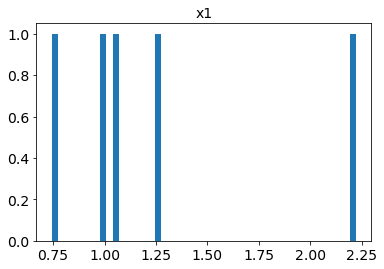

rango x1_err : 0.040201363549412124, 0.15445563969243045
promedio x1_err : 0.07649603797019819
desviación estándar x1_err : 0.04212255812562524
mediana x1_err : 0.060675586186119956


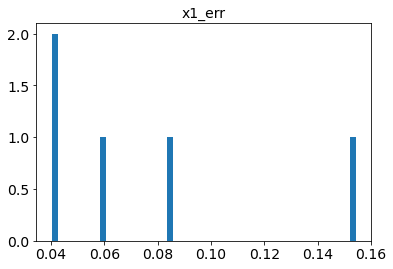

rango c : -0.05134335381066413, 0.6137259453196798
promedio c : 0.12588540978667478
desviación estándar c : 0.25459795824929776
mediana c : -0.02811995157445354


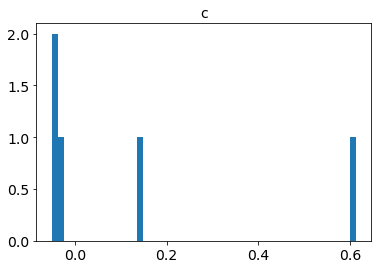

rango c_err : 0.0052016246999908805, 0.019207070569853657
promedio c_err : 0.01151621172803987
desviación estándar c_err : 0.005280803900321157
mediana c_err : 0.009462846728684285


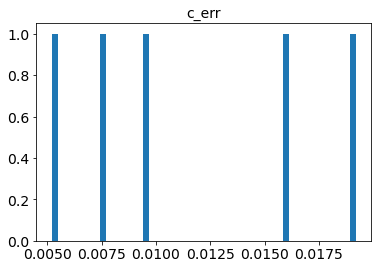

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


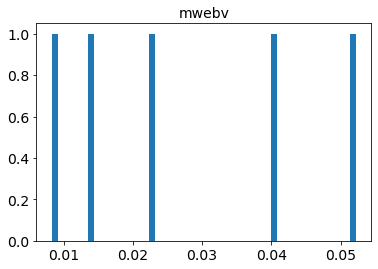

In [64]:
histogramas_estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa_cortes_t, 
                                    z_real=True, oids=SN_Ia_91T)

Aquí vemos que el valor de $\frac{\chi^{2}}{ndof}$ disminuye mucho al utilizar para los ajustes solo las observaciones que están dentro del rango de tiempo del modelo. 

Es importante notar que como aquí se está utilizando el valor real del redshift, si se asume que el valor del tiempo del máximo brillo ($t_0$) es correcto o muy cercano al valor real, este corte en el rango de tiempo del modelo es efectivamente aquel que deja a todas las observaciones posibles dentro del rango de tiempo del modelo.

Por lo anterior, este sería el ajuste perfecto en el caso en que el redshift que se utiliza es el redshift real de la SN y solo se ajustan los parámetros del modelo SALT2 ($x0$, $x1$, $c$) y el tiempo del máximo brillo ($t_0$).




Pregunta: (también está en la parte de las funciones)

- ¿Es posible determinar de otra forma (más exacta) el tiempo del máximo brillo?

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [65]:
estadisticas_SALT2_z_fijo_cortes_t = estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa_cortes_t, 
                                                             z_real=True).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT2 y redshift real, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z_{real}$), ordenados según el valor de chisq/ndof

In [66]:
lista_oid_SALT2_z_fijo_cortes_t = list(estadisticas_SALT2_z_fijo_cortes_t['oid'])
lista_chisq_vs_ndof_SALT2_z_fijo_cortes_t = list(estadisticas_SALT2_z_fijo_cortes_t['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [67]:
median_chisq_vs_ndof_SALT2_z_fijo_cortes_t = np.median(np.array(estadisticas_SALT2_z_fijo_cortes_t['chisq/ndof']))
df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t = estadisticas_SALT2_z_fijo_cortes_t[estadisticas_SALT2_z_fijo_cortes_t['chisq/ndof'] > median_chisq_vs_ndof_SALT2_z_fijo_cortes_t].reset_index()
lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t = list(df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [68]:
display(df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t[['oid', 
                                                             'chisq/ndof', 
                                                             'z', 
                                                             't0', 
                                                             't0_err']])

,oid,chisq/ndof,z,t0,t0_err
0,ZTF18abckujg,1.561183,0.0740,58303.340122,0.146650
1,ZTF18abtnlik,1.564569,0.0900,58379.085173,0.151260
2,ZTF18aazblzy,1.579057,0.0653,58291.799175,0.049163
3,ZTF18abdkimx,1.587939,0.0800,58313.849572,0.112693
4,ZTF18abpamut,1.588199,0.0720,58367.663093,0.148358
5,ZTF18abclalx,1.610255,0.1000,58301.101550,0.182075
6,ZTF18abdbuty,1.675277,0.0600,58308.087150,0.125924
7,ZTF18aaxwjmp,1.677559,0.0800,58288.346748,0.079886
8,ZTF18abjvhec,1.708779,0.0570,58340.363787,0.100591
9,ZTF18aaxrvzj,1.824913,0.1100,58286.100037,0.154429


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT2 y $z_{real}$  antes y después de eliminar los puntos fuera del rango de tiempo del modelo

In [69]:
inter_oid_SALT2_z_fijo_sobre_mediana_cortes_t = np.intersect1d(np.array(lista_oid_SALT2_z_fijo_sobre_mediana),
                                                               np.array(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t))
print('Elementos comunes sobre la mediana de chisq/ndof : ',len(inter_oid_SALT2_z_fijo_sobre_mediana_cortes_t))

Elementos comunes sobre la mediana de chisq/ndof :  39


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [70]:
table_early_SNIa_SALT2_z_fijo_cortes_t = astropy_table_detections(df_meta_early_SNIa, 
                                                                    detect_early_SNIa_cortes_t_SALT2_z_fijo)


Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ===== Ajuste con redshift real ====
chisq/ndof :  0.46993974084599666


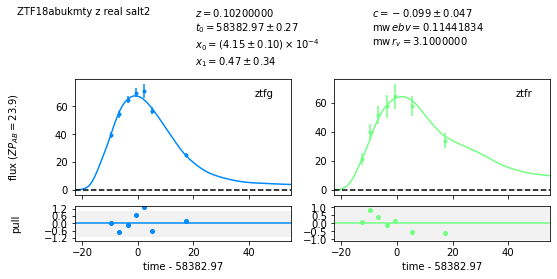

In [71]:
ajuste(lista_oid_SALT2_z_fijo_cortes_t[2], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_t, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_t[2])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.5556740203847491


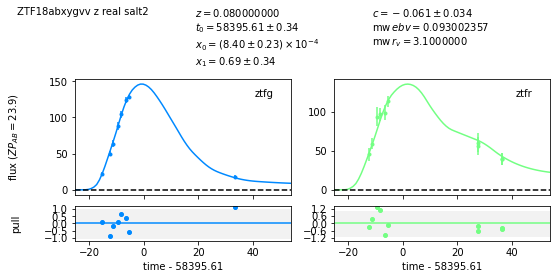

In [72]:
ajuste(lista_oid_SALT2_z_fijo_cortes_t[4], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_t, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_t[4])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.8230933161198772


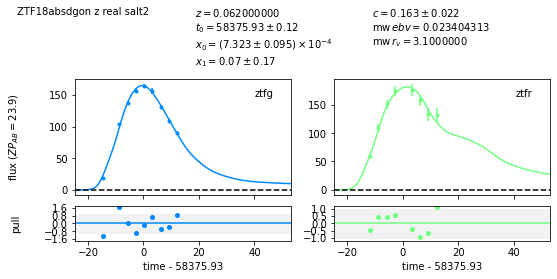

In [73]:
ajuste(lista_oid_SALT2_z_fijo_cortes_t[15], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_t, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_t[15])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.8885944752391858


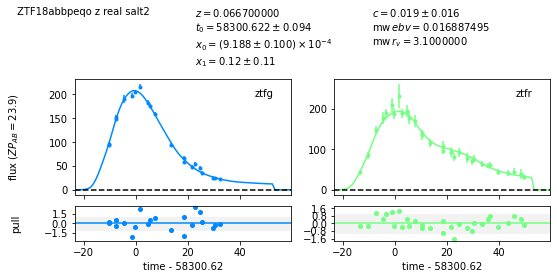

In [74]:
ajuste(lista_oid_SALT2_z_fijo_cortes_t[20], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_t, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_t[20])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.1224600572300125


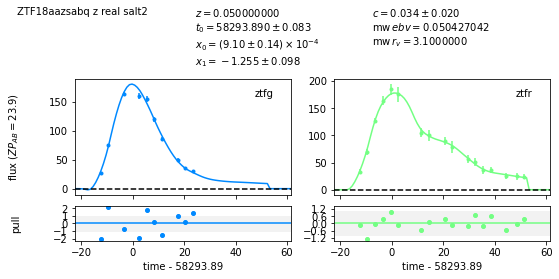

In [75]:
ajuste(lista_oid_SALT2_z_fijo_cortes_t[30], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_t, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_t[30])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.2055754864205708


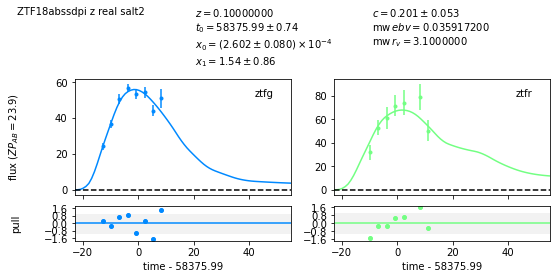

In [76]:
ajuste(lista_oid_SALT2_z_fijo_cortes_t[32], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_t, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_t[32])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.3258233956677075


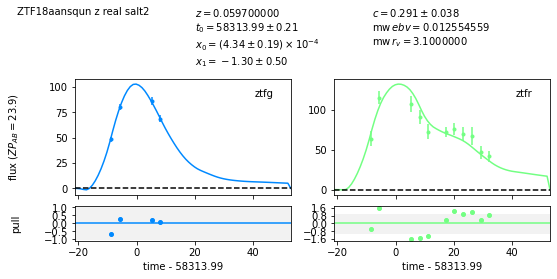

In [77]:
ajuste(lista_oid_SALT2_z_fijo_cortes_t[36], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_t, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_t[36])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.430145069722101


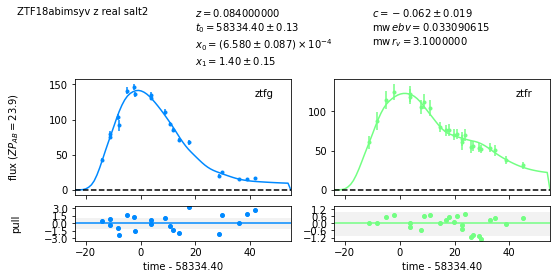

In [78]:
ajuste(lista_oid_SALT2_z_fijo_cortes_t[41], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_t, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_t[41])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ mayores a la mediana.

 ===== Ajuste con redshift real ====
chisq/ndof :  1.5611829920190101


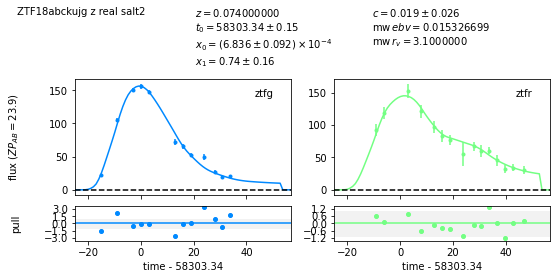

In [79]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t[0], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_t, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][0])

 ===== Ajuste con redshift real ====
chisq/ndof :  2.5046350396752404


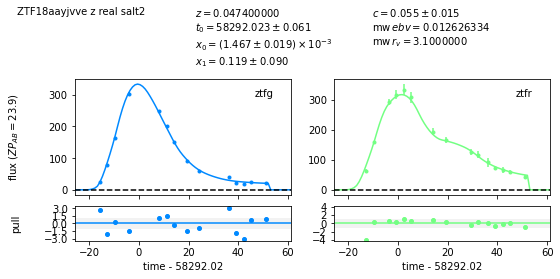

In [80]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t[18], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_t, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][18])

 ===== Ajuste con redshift real ====
chisq/ndof :  3.0380397848592358


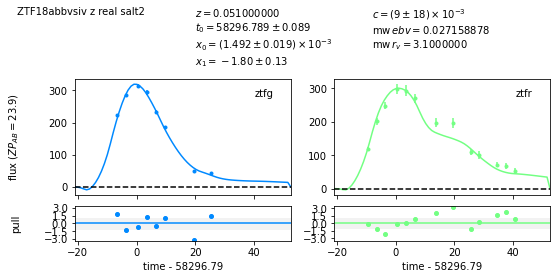

In [81]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t[20], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_t, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][20])

 ===== Ajuste con redshift real ====
chisq/ndof :  3.0444253527274197


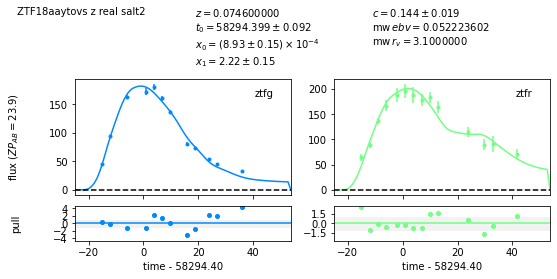

In [82]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t[21], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_t, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][21])

 ===== Ajuste con redshift real ====
chisq/ndof :  5.886143514852669


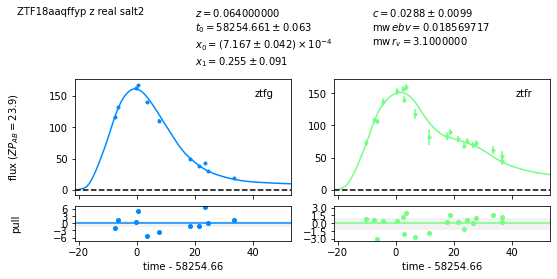

In [83]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t[32], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_t, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][32])

 ===== Ajuste con redshift real ====
chisq/ndof :  6.179594319770619


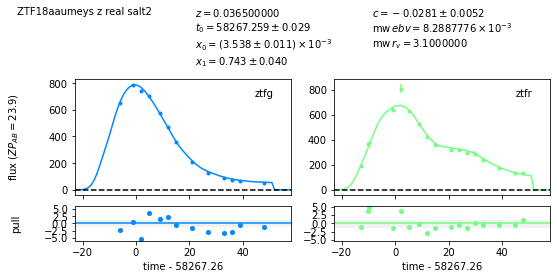

In [84]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t[34], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_t, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][34])

 ===== Ajuste con redshift real ====
chisq/ndof :  13.150735001363707


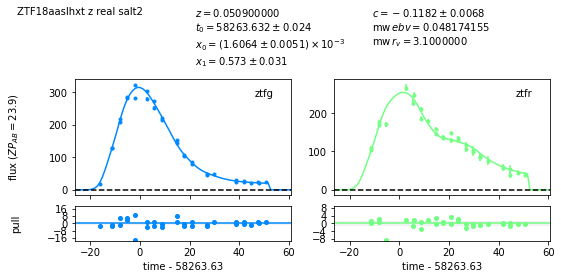

In [85]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t[38], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_t, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][38])

 ===== Ajuste con redshift real ====
chisq/ndof :  20.296988357874742


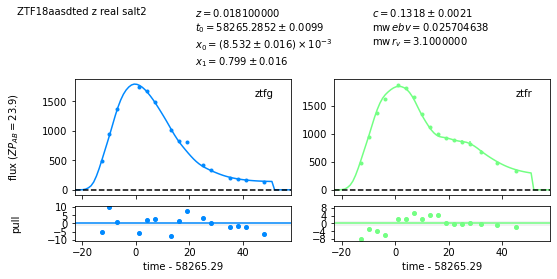

In [86]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_t[41], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_t, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][41])

### Ajuste con redshift variable

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el primer ajuste con el modelo SALT2 y redshift variable

In [87]:
detect_early_SNIa_cortes_t = cortes_t_modelo(trest_min_modelo, 
                                             trest_max_modelo, 
                                             detect_early_SNIa,
                                             estadisticas_SALT2_z_var)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo

In [88]:
ajustes_SALT2_early_SNIa_cortes_t = modelo_ajustado_y_resultados('salt2', 
                                                                 df_meta_early_SNIa, 
                                                                 detect_early_SNIa_cortes_t, 
                                                                 version='2.4',
                                                                 print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 152, 1436
promedio ncall : 348.42105263157896
desviación estándar ncall : 203.2801581922875
mediana ncall : 290.0


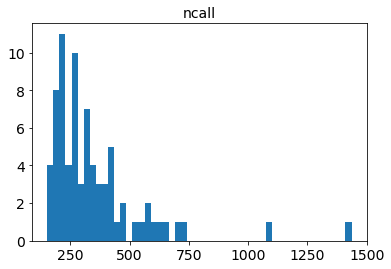

rango chisq : 4.702333060555874, 821.3814100670887
promedio chisq : 92.29179250325075
desviación estándar chisq : 181.39503210358464
mediana chisq : 28.83270252895538


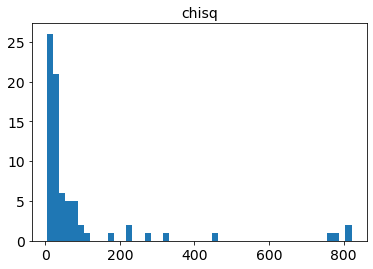

rango ndof : 5, 61
promedio ndof : 20.289473684210527
desviación estándar ndof : 11.58244564379271
mediana ndof : 17.0


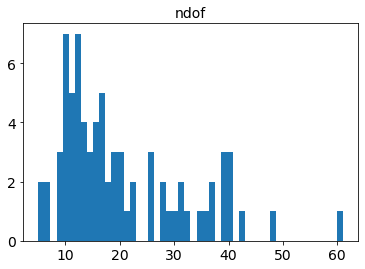

rango chisq/ndof : 0.47023330605558744, 27.379380335569625
promedio chisq/ndof : 3.585426227794796
desviación estándar chisq/ndof : 5.1889770409904115
mediana chisq/ndof : 1.682753891540303


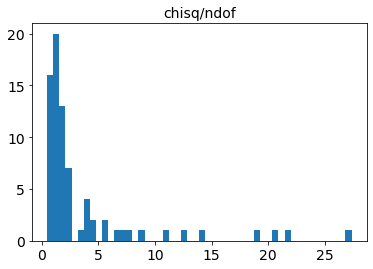

rango z : 0.0010000004500293118, 0.34896642675813283
promedio z : 0.16865253187298582
desviación estándar z : 0.09733005649396216
mediana z : 0.15510544614618324


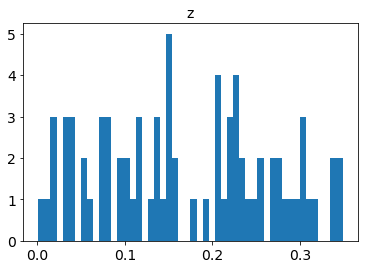

rango z_err : 1.597546400722294e-11, 0.3576527036231301
promedio z_err : 0.02446573786693307
desviación estándar z_err : 0.04379558473278116
mediana z_err : 0.01591960703562683


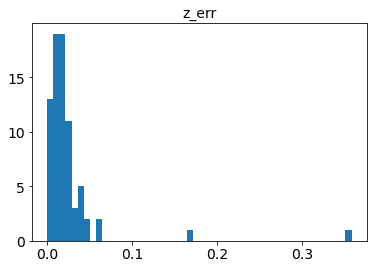

rango t0 : 58257.01493998718, 58396.5690826532
promedio t0 : 58323.054030786014
desviación estándar t0 : 38.75421397835
mediana t0 : 58318.02787198714


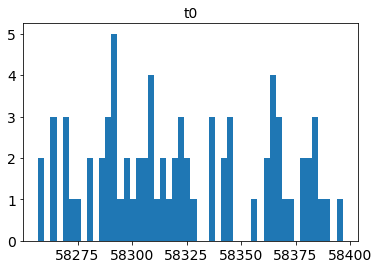

rango t0_err : 9.968061931431293e-10, 113.91267422946476
promedio t0_err : 1.7921899564993702
desviación estándar t0_err : 12.950159452276557
mediana t0_err : 0.2083451650596544


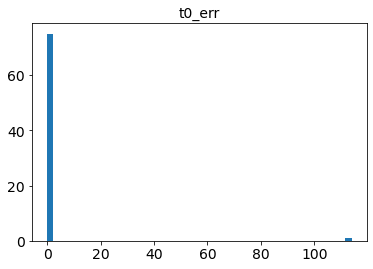

rango x0 : 0.00021593183581902124, 0.0050659230957184965
promedio x0 : 0.0010700083223687579
desviación estándar x0 : 0.0011043777584569018
mediana x0 : 0.0006606513054358968


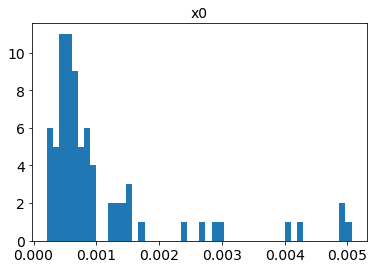

rango x0_err : 5.4301043387187246e-06, 1.0000010003103934
promedio x0_err : 0.013175471783834393
desviación estándar x0_err : 0.11394879788700527
mediana x0_err : 1.2120710650305057e-05


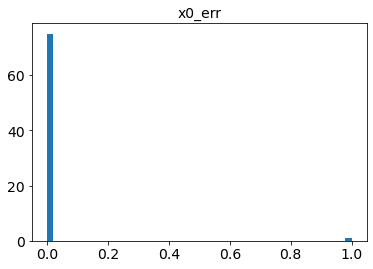

rango x1 : -2.02517714893721, 3.9168637014464673
promedio x1 : 0.05995217902243975
desviación estándar x1 : 1.1484050893979219
mediana x1 : 0.21239707164425736


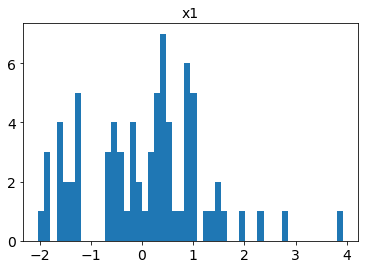

rango x1_err : 0.024597283742621157, 5.851764912934313
promedio x1_err : 0.31924030953553806
desviación estándar x1_err : 0.6781720994547714
mediana x1_err : 0.18344958362769237


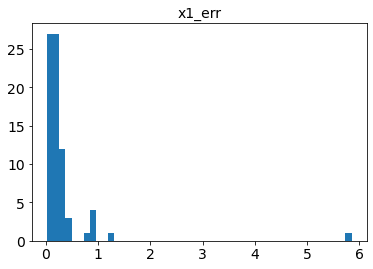

rango c : -0.34573583205279895, 0.2909049500748452
promedio c : -0.09931548465471311
desviación estándar c : 0.13240672231028347
mediana c : -0.10089540750054851


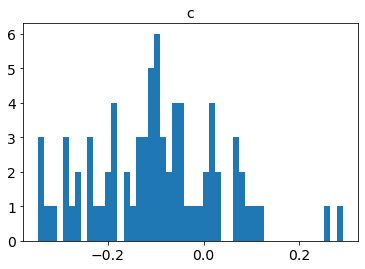

rango c_err : 0.004015912687020465, 0.530126720317886
promedio c_err : 0.042515982300505684
desviación estándar c_err : 0.06237449396016797
mediana c_err : 0.03187898520271512


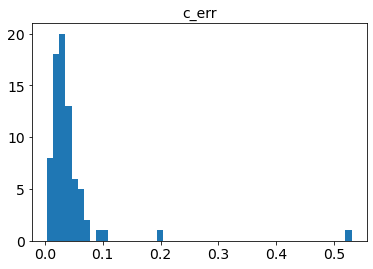

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


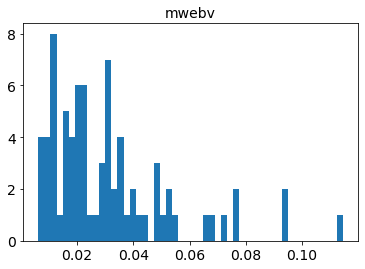

In [89]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_cortes_t, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 210, 302
promedio ncall : 251.2
desviación estándar ncall : 33.62974873530874
mediana ncall : 256.0


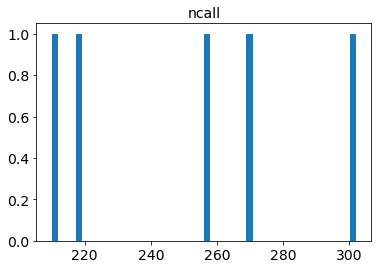

rango chisq : 72.28230319809185, 1113.15305404752
promedio chisq : 368.5658112747509
desviación estándar chisq : 393.0450421276503
mediana chisq : 132.47394733732526


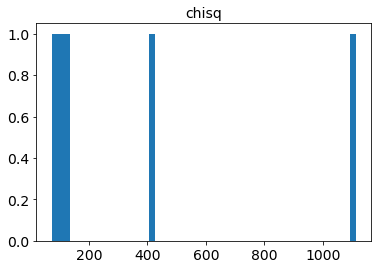

rango ndof : 15, 61
promedio ndof : 32.0
desviación estándar ndof : 15.671630419327785
mediana ndof : 28.0


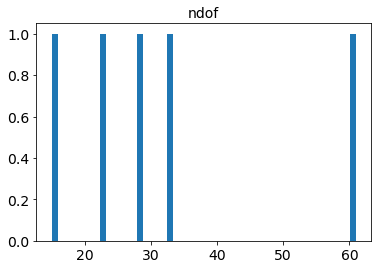

rango chisq/ndof : 4.014362040525008, 18.248410722090494
promedio chisq/ndof : 9.322979397558807
desviación estándar chisq/ndof : 6.1003773442219655
mediana chisq/ndof : 4.8188202132061235


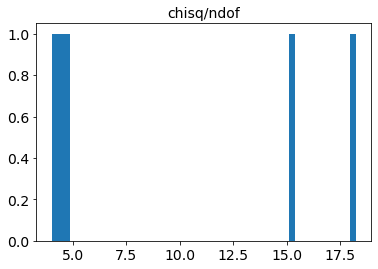

rango z : 0.019876978705741826, 0.4403630136876394
promedio z : 0.21543610943298894
desviación estándar z : 0.13723337254594548
mediana z : 0.22403504994456908


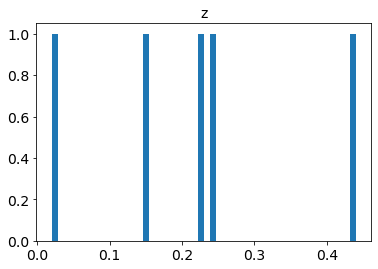

rango z_err : 0.0015849645240293177, 0.008276911211725593
promedio z_err : 0.004529285801431493
desviación estándar z_err : 0.002961665790995099
mediana z_err : 0.002907552610230249


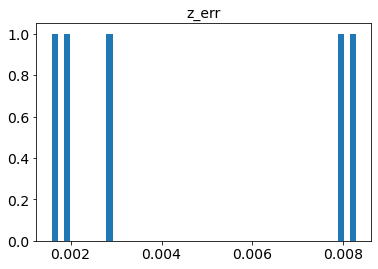

rango t0 : 58264.17154077921, 58334.99388078862
promedio t0 : 58292.97243918155
desviación estándar t0 : 25.768439070044987
mediana t0 : 58295.959335372725


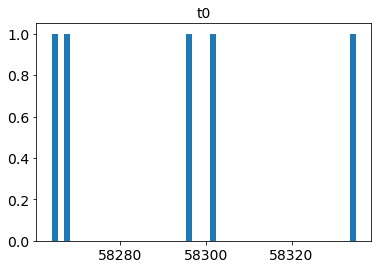

rango t0_err : 0.03105347966629779, 0.102785086237418
promedio t0_err : 0.06586131920048502
desviación estándar t0_err : 0.026191156696480436
mediana t0_err : 0.06677378705717274


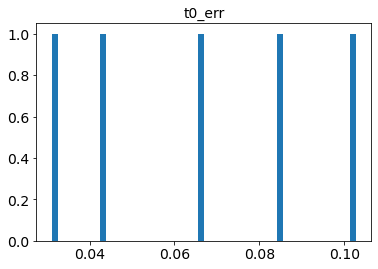

rango x0 : 0.0006541735176434569, 0.011187195217606609
promedio x0 : 0.003736600301112379
desviación estándar x0 : 0.0038568710760431037
mediana x0 : 0.0027527028250575463


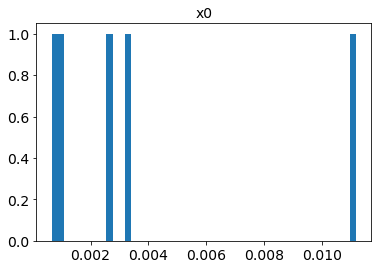

rango x0_err : 9.342447173274886e-06, 7.305953167515668e-05
promedio x0_err : 2.9919072835812572e-05
desviación estándar x0_err : 2.375334566685498e-05
mediana x0_err : 1.458143662974448e-05


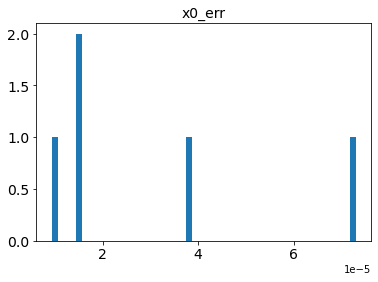

rango x1 : 0.46271172987875087, 3.152286037961926
promedio x1 : 1.514927578138256
desviación estándar x1 : 0.9685270918189186
mediana x1 : 1.192586124794981


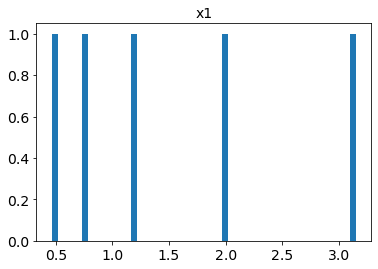

rango x1_err : 0.03511174325826483, 0.16242449265891512
promedio x1_err : 0.09162943703330403
desviación estándar x1_err : 0.047131581319168676
mediana x1_err : 0.09018441598250737


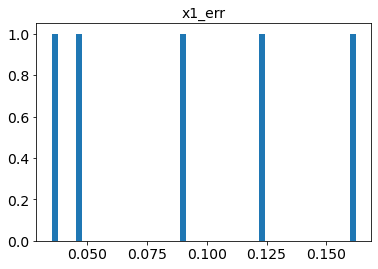

rango c : -0.24291660669955367, -0.006675682999874533
promedio c : -0.11706673957599537
desviación estándar c : 0.08528529572654579
mediana c : -0.12543719034177736


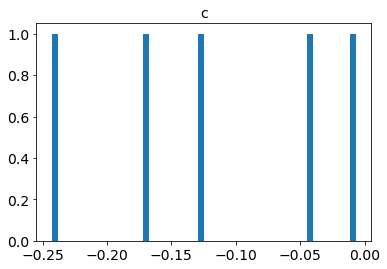

rango c_err : 0.005043569480673027, 0.026629334495971796
promedio c_err : 0.013444277695183532
desviación estándar c_err : 0.009058427786565473
mediana c_err : 0.008464074633687646


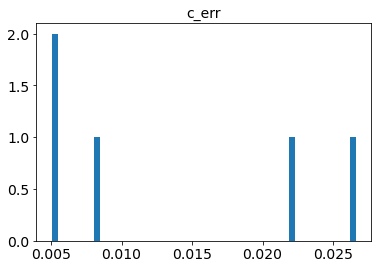

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


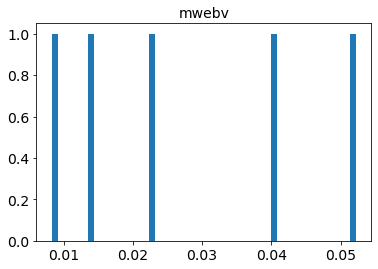

In [90]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_cortes_t, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 183, 716
promedio ncall : 455.0
desviación estándar ncall : 217.73531332024822
mediana ncall : 466.0


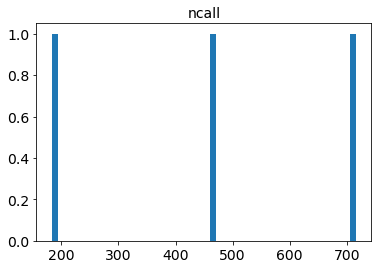

rango chisq : 1.272570386239837, 7243.638680956665
promedio chisq : 2451.426746188474
desviación estándar chisq : 3388.892899815929
mediana chisq : 109.36898722251848


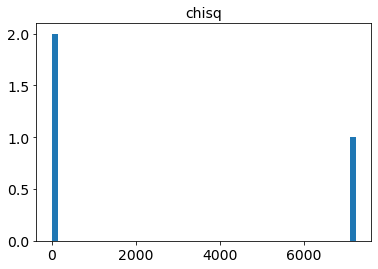

rango ndof : 3, 50
promedio ndof : 29.666666666666668
desviación estándar ndof : 19.70335560817553
mediana ndof : 36.0


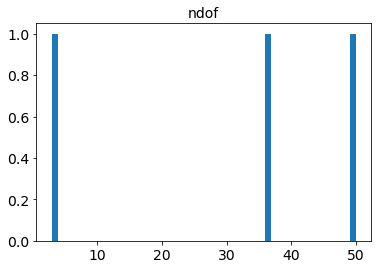

rango chisq/ndof : 0.4241901287466123, 201.21218558212956
promedio chisq/ndof : 67.94125181844218
desviación estándar chisq/ndof : 94.23953009605928
mediana chisq/ndof : 2.1873797444503698


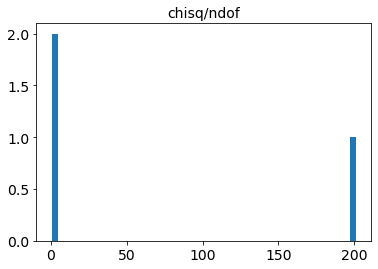

rango z : 0.25528816377305014, 0.2746892992459322
promedio z : 0.2621227500752153
desviación estándar z : 0.008897286595890655
mediana z : 0.2563907872066635


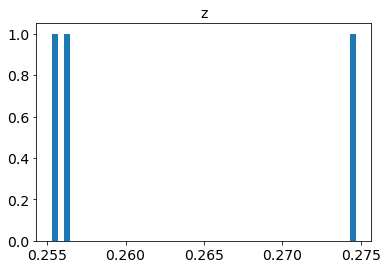

rango z_err : 4.7495336580327674e-08, 0.0718077020267235
promedio z_err : 0.02393844978054209
desviación estándar z_err : 0.03384867301402728
mediana z_err : 7.599819566189714e-06


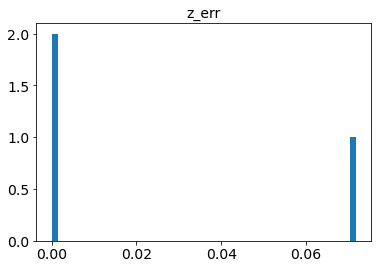

rango t0 : 58267.54460152489, 58363.95650191905
promedio t0 : 58311.275144009116
desviación estándar t0 : 39.86561974928655
mediana t0 : 58302.32432858342


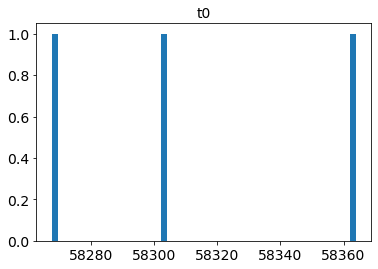

rango t0_err : 8.827653800835833e-06, 1.0824204428390658
promedio t0_err : 0.3609250226036238
desviación estándar t0_err : 0.5101743227908649
mediana t0_err : 0.0003457973180047702


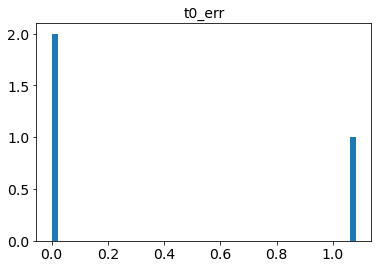

rango x0 : 0.00025894719712728627, 0.0075517367935890685
promedio x0 : 0.0028842165541614426
desviación estándar x0 : 0.003309006550264795
mediana x0 : 0.0008419656717679744


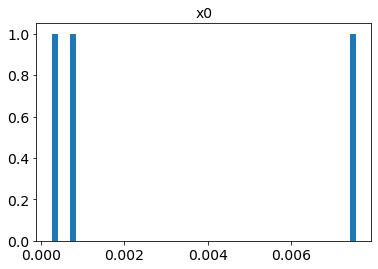

rango x0_err : 5.292840908066453e-06, 4.117869473610531e-05
promedio x0_err : 1.8908323105842313e-05
desviación estándar x0_err : 1.587721553166205e-05
mediana x0_err : 1.0253433673355168e-05


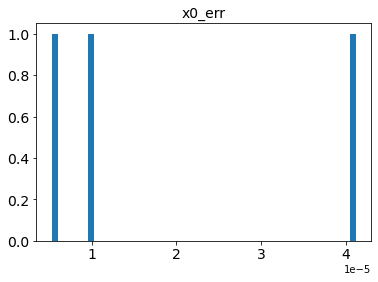

rango x1 : -2.305271444535058, 0.3050001955691197
promedio x1 : -0.6529656287548127
desviación estándar x1 : 1.1733031795134916
mediana x1 : 0.04137436270150019


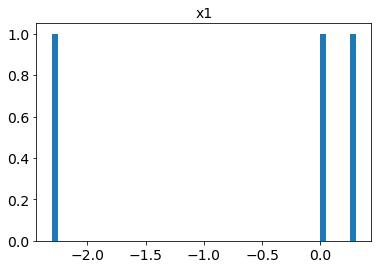

rango x1_err : 0.009965967432632894, 1.7233964727009694
promedio x1_err : 0.6095064783339328
desviación estándar x1_err : 0.788406649495098
mediana x1_err : 0.09515699486819607


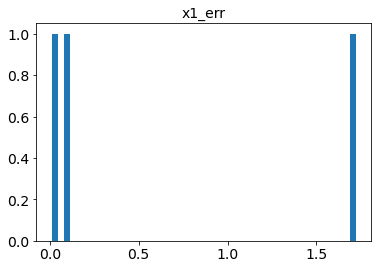

rango c : -0.22895095374127236, -0.20332203101408633
promedio c : -0.21906070263413535
desviación estándar c : 0.01125058330075692
mediana c : -0.22490912314704736


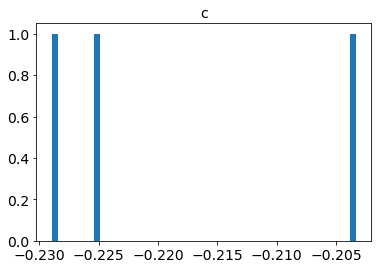

rango c_err : 0.0016603399957476755, 0.2035663010874139
promedio c_err : 0.07048317146564086
desviación estándar c_err : 0.09412241575031859
mediana c_err : 0.006222873313760979


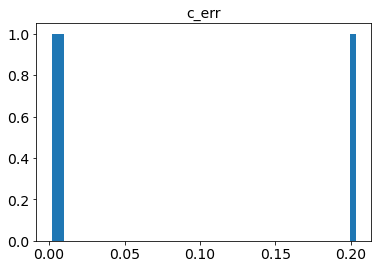

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


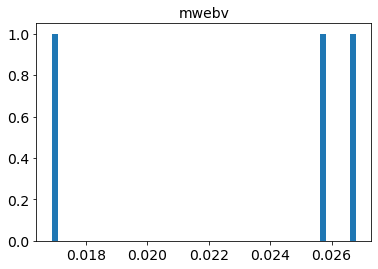

In [91]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_cortes_t, oids=Ia_tipo_no_especif)

Aquí vemos que el valor de $\frac{\chi^{2}}{ndof}$ disminuye un poco al utilizar para los ajustes solo las observaciones que están dentro del rango de tiempo del modelo.

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [92]:
estadisticas_SALT2_z_var_cortes_t = estadisticas_resultados(ajustes_SALT2_early_SNIa_cortes_t).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT2 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ $z$ y del primer ajuste), ordenados según el valor de chisq/ndof

In [93]:
lista_oid_SALT2_z_var_cortes_t = list(estadisticas_SALT2_z_var_cortes_t['oid'])
lista_chisq_vs_ndof_SALT2_z_var_cortes_t = list(estadisticas_SALT2_z_var_cortes_t['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [94]:
median_chisq_vs_ndof_SALT2_z_var_cortes_t = np.median(np.array(estadisticas_SALT2_z_var_cortes_t['chisq/ndof']))
df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t = estadisticas_SALT2_z_var_cortes_t[estadisticas_SALT2_z_var_cortes_t['chisq/ndof'] > median_chisq_vs_ndof_SALT2_z_var_cortes_t].reset_index()
lista_oid_SALT2_z_var_sobre_mediana_cortes_t = list(df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [95]:
display(df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t[['oid', 
                                                             'chisq/ndof', 
                                                             'z',
                                                             'z_err', 
                                                             't0', 
                                                             't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
0,ZTF18abfgygp,1.772677,0.226013,7.145235e-03,58323.517629,0.100453
1,ZTF18abdfwur,1.815980,0.227314,1.285829e-02,58311.487508,0.167697
2,ZTF18abealop,1.864397,0.001000,1.404756e-02,58315.390314,0.198186
3,ZTF18abrzeym,1.871267,0.136248,1.885541e-02,58374.232011,0.171011
4,ZTF18aaxrvzj,1.873503,0.220224,1.802760e-02,58287.226885,0.206125
5,ZTF18absdgon,1.941578,0.254116,2.501496e-02,58377.339180,0.201737
6,ZTF18abimsyv,2.021273,0.230718,1.345244e-02,58336.099961,0.183273
7,ZTF18abkifng,2.029426,0.153458,3.302331e-02,58344.007614,0.222102
8,ZTF18aaxqyki,2.099737,0.106999,3.351543e-02,58286.567151,0.438536
9,ZTF18aaxwjmp,2.172378,0.335645,1.470137e-02,58290.774825,0.238167


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT2 y $z$ variable antes y después de eliminar los puntos fuera del rango de tiempo del modelo

In [96]:
inter_oid_SALT2_z_var_sobre_mediana_cortes_t = np.intersect1d(np.array(lista_oid_SALT2_z_var_sobre_mediana),
                                                              np.array(lista_oid_SALT2_z_var_sobre_mediana_cortes_t))
print('Elementos comunes sobre la mediana de chisq/ndof : ',len(inter_oid_SALT2_z_var_sobre_mediana_cortes_t))

Elementos comunes sobre la mediana de chisq/ndof :  41


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [97]:
table_early_SNIa_SALT2_z_var_cortes_t = astropy_table_detections(df_meta_early_SNIa, 
                                                                detect_early_SNIa_cortes_t)

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  0.4241901287466123


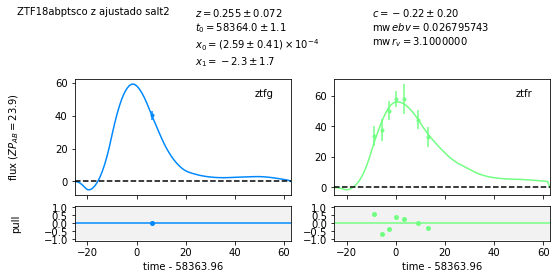

In [98]:
ajuste(lista_oid_SALT2_z_var_cortes_t[0], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_t, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_t[0])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.6306178176926891


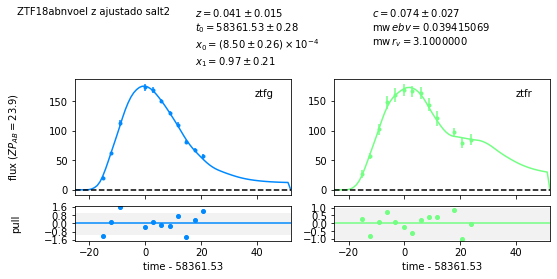

In [99]:
ajuste(lista_oid_SALT2_z_var_cortes_t[7], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_t, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_t[7])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.6937781076434644


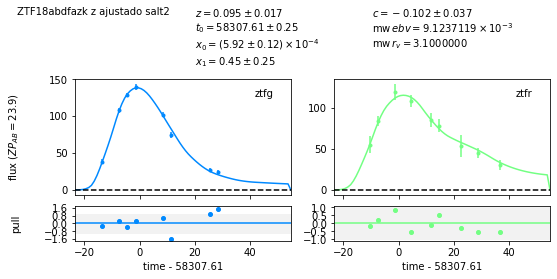

In [100]:
ajuste(lista_oid_SALT2_z_var_cortes_t[9], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_t, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_t[9])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.1482001375805873


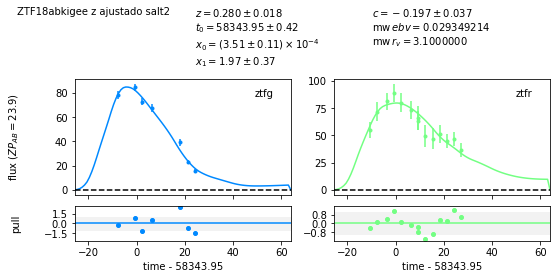

In [101]:
ajuste(lista_oid_SALT2_z_var_cortes_t[21], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_t, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_t[21])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.2853089802036581


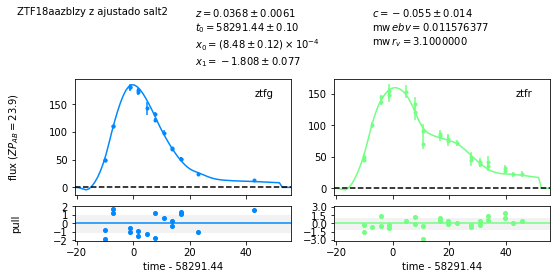

In [102]:
ajuste(lista_oid_SALT2_z_var_cortes_t[28], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_t, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_t[28])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.7556636662258942


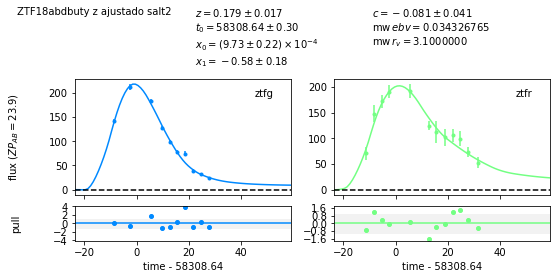

In [103]:
ajuste(lista_oid_SALT2_z_var_cortes_t[41], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_t, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_t[41])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ mayores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  1.8159802318084


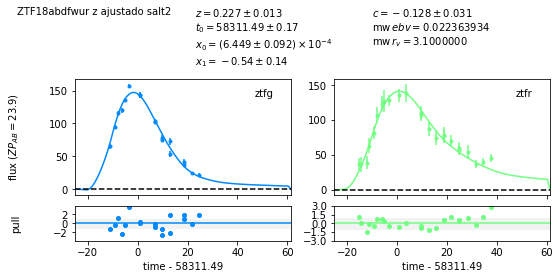

In [104]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_t[1], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_var_cortes_t, 
       version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t['chisq/ndof'][1])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.8712673689842774


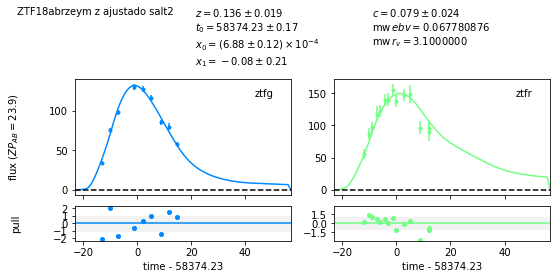

In [105]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_t[3], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_var_cortes_t, 
       version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t['chisq/ndof'][3])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.219474000824213


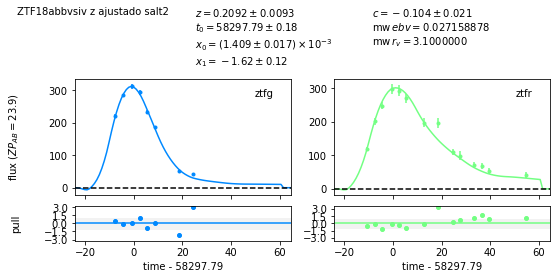

In [106]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_t[11], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_var_cortes_t, 
       version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t['chisq/ndof'][11])

 ==== Con ajuste del redshift ====
chisq/ndof :  3.9741603902957947


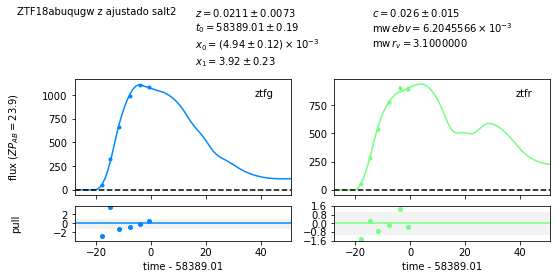

In [107]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_t[19], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_var_cortes_t, 
       version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t['chisq/ndof'][19])

 ==== Con ajuste del redshift ====
chisq/ndof :  4.014362040525008


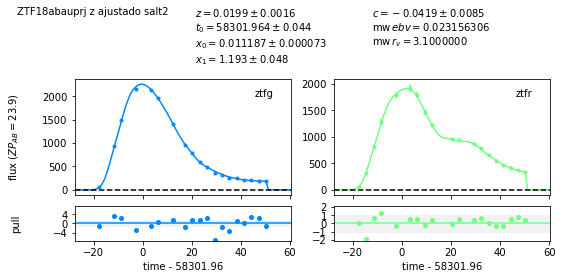

In [108]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_t[20], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_var_cortes_t, 
       version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t['chisq/ndof'][20])

 ==== Con ajuste del redshift ====
chisq/ndof :  6.679948614954342


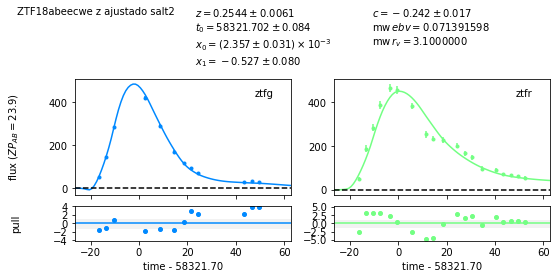

In [109]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_t[28], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_var_cortes_t, 
       version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t['chisq/ndof'][28])

 ==== Con ajuste del redshift ====
chisq/ndof :  18.248410722090494


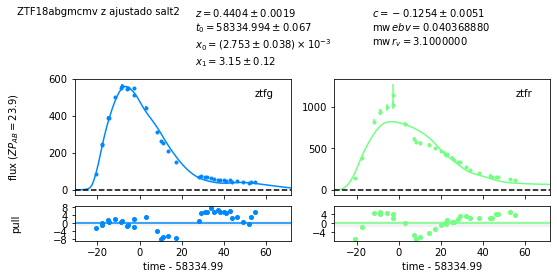

In [110]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_t[36], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_var_cortes_t, 
       version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t['chisq/ndof'][36])

 ==== Con ajuste del redshift ====
chisq/ndof :  27.379380335569625


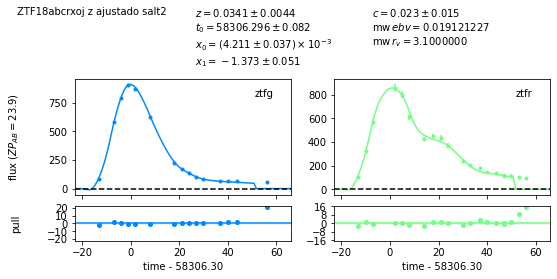

In [111]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_t[40], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_var_cortes_t, 
       version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_t['chisq/ndof'][40])

Aquí vemos que aún hay observaciones que están fuera del rango del modelo pese a que se hayan descartados las observaciones fuera del rango del modelo del obtenido a partir de los parámetros $t_0$ y $z$ del primer ajuste. Esto se debe a que los parámetros $t_0$ y $z$ pueden cambiar al hacer un nuevo ajuste. En particular, si el $z$ obtenido en el segundo ajuste es menor que el del primer ajuste y/o el valor de $t_0$ cambia puede pasar que puntos que estaban dentro del rango de tiempo del modelo en el primer ajuste, ya no lo estén.

Por lo anterior, ahora se hará el ajuste considerando solo las observaciones que están dentro del rango del modelo, como si este estuviese en el sistema de referencia en reposo (en el cual $z=0$) y considerando como correcto el valor de $t_0$ del primer ajuste. 

## Ajuste con observaciones en el rango de tiempo del modelo como si estuviese en el sistema de referencia en reposo (determinado con $t_0$ del primer ajuste)

Como se vió anteriormente, los valores muy grandes de $\frac{\chi^{2}}{ndof}$ tenían que ver principalmente con observaciones que estaban fuera del rango de tiempo del modelo, por lo que ahora se analizarán los casos en que se ajustan solo las observaciones que están en una aproximación para el rango de tiempo del modelo que considera que las observaciones están hechas en el sistema de referencia en reposo de la SN ($z=0$). 

Nota:
- También se podría elegir un valor de $z_{min}$ y considerar que las SN tienen este valor de $z$ para descartar puntos fuera del rango de tiempo del modelo.

### Ajuste con redshift real 

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el primer ajuste de $t_0$ con el modelo SALT2 y $z=0$, pero utilizando el redshift real para el siguiente ajuste.

In [112]:
detect_early_SNIa_cortes_trest_SALT2_z_fijo = cortes_trest_modelo(trest_min_modelo,
                                                                  trest_max_modelo, 
                                                                  detect_early_SNIa,
                                                                  estadisticas_SALT2_z_fijo)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo, determinado con $z=0$ y $t_0$ del primer ajuste

In [113]:
ajustes_SALT2_z_fijo_early_SNIa_cortes_trest = modelo_ajustado_y_resultados('salt2', 
                                                                            df_meta_early_SNIa, 
                                                                            detect_early_SNIa_cortes_trest_SALT2_z_fijo, 
                                                                            version='2.4', 
                                                                            z_real=True,
                                                                            print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 82, 158
promedio ncall : 106.23684210526316
desviación estándar ncall : 12.648973768496868
mediana ncall : 102.0


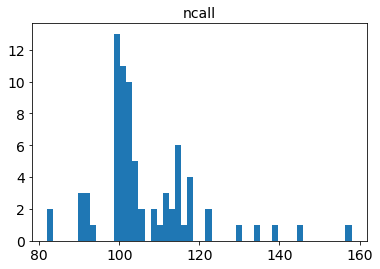

rango chisq : 4.699397408459967, 786.9259414840894
promedio chisq : 57.213334517447095
desviación estándar chisq : 102.771415738881
mediana chisq : 30.95688365167807


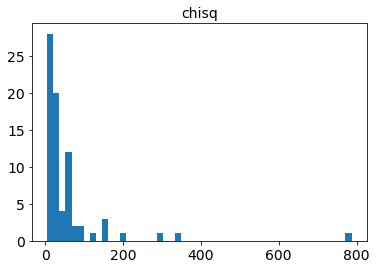

rango ndof : 6, 58
promedio ndof : 20.69736842105263
desviación estándar ndof : 10.919586141234698
mediana ndof : 17.5


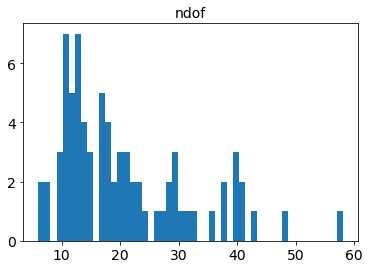

rango chisq/ndof : 0.44236796253013444, 19.116075103470454
promedio chisq/ndof : 2.601658162193552
desviación estándar chisq/ndof : 3.5032420854519675
mediana chisq/ndof : 1.4055648022953047


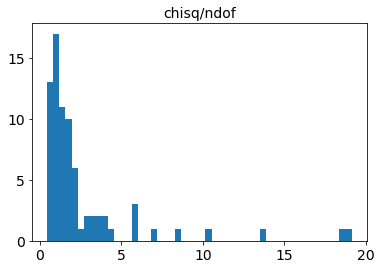

rango z : 0.0269, 0.14
promedio z : 0.07240263157894737
desviación estándar z : 0.024863225717408274
mediana z : 0.0718


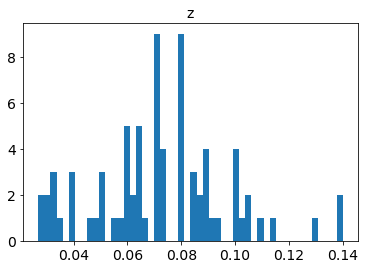

rango t0 : 58254.66089235649, 58395.614080229265
promedio t0 : 58322.160185183755
desviación estándar t0 : 38.658597555361226
mediana t0 : 58317.36089642557


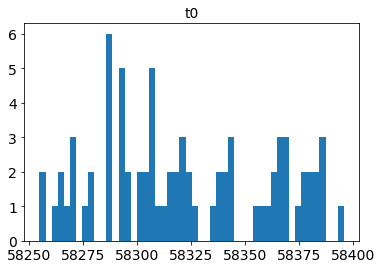

rango t0_err : 0.023828765632060822, 1.3873362933736644
promedio t0_err : 0.1772520396132581
desviación estándar t0_err : 0.1888933354860639
mediana t0_err : 0.12730718941202213


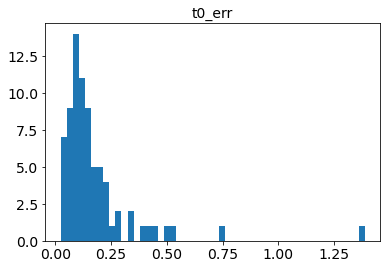

rango x0 : 0.00022820032888927092, 0.006300131544704217
promedio x0 : 0.0011311278871236343
desviación estándar x0 : 0.00121382061569038
mediana x0 : 0.0006766695892666911


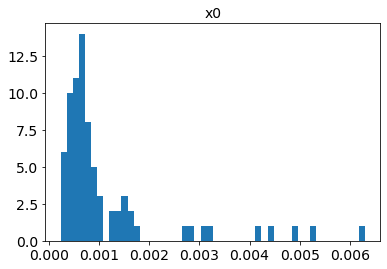

rango x0_err : 4.196005541534452e-06, 4.6727902767139996e-05
promedio x0_err : 1.301258119374437e-05
desviación estándar x0_err : 8.658177244620647e-06
mediana x0_err : 1.0081615766334888e-05


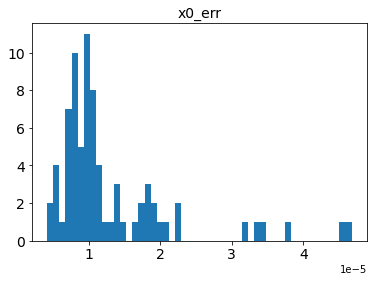

rango x1 : -2.164972393918284, 2.2803275812749906
promedio x1 : 0.025021480265812236
desviación estándar x1 : 1.0528931196675364
mediana x1 : 0.23027740396605118


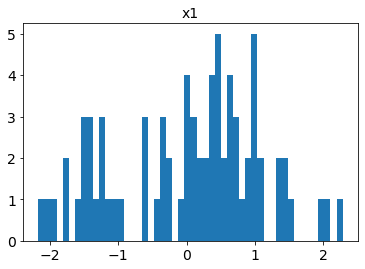

rango x1_err : 0.028729493637220833, 1.3164650963204692
promedio x1_err : 0.21636705680412782
desviación estándar x1_err : 0.19597518568437397
mediana x1_err : 0.16228862209035766


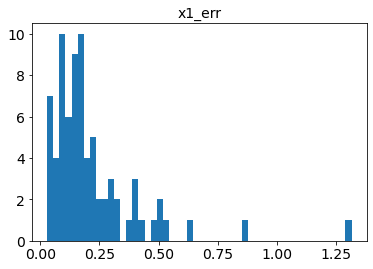

rango c : -0.17831176078141425, 0.2908359184665301
promedio c : -0.0008688085246056276
desviación estándar c : 0.0968777209261742
mediana c : -0.007107744954531953


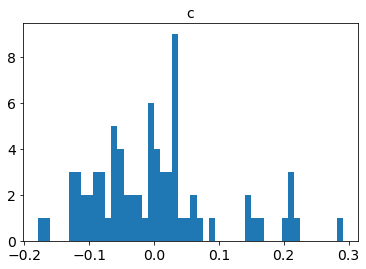

rango c_err : 0.004501216867608889, 0.0622639263448562
promedio c_err : 0.024623783439512725
desviación estándar c_err : 0.011971095173085502
mediana c_err : 0.022067109468898765


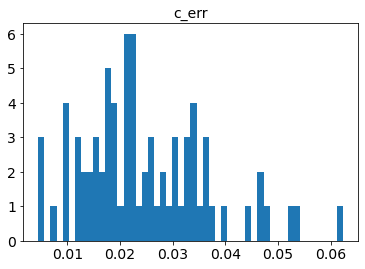

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


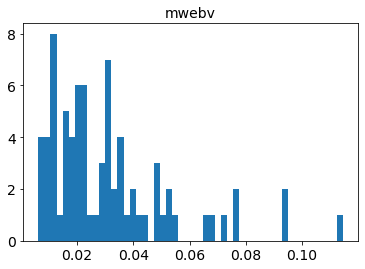

In [114]:
histogramas_estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa_cortes_trest, 
                                    z_real=True, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 101, 162
promedio ncall : 125.8
desviación estándar ncall : 24.82257037456033
mediana ncall : 116.0


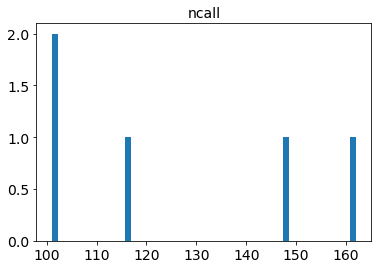

rango chisq : 66.97735776000323, 160.66945231403608
promedio chisq : 109.03978610541427
desviación estándar chisq : 36.715970303901834
mediana chisq : 110.65638883753425


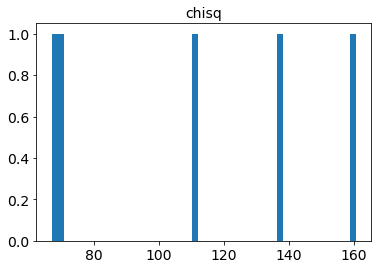

rango ndof : 16, 51
promedio ndof : 29.4
desviación estándar ndof : 11.99333148045196
mediana ndof : 26.0


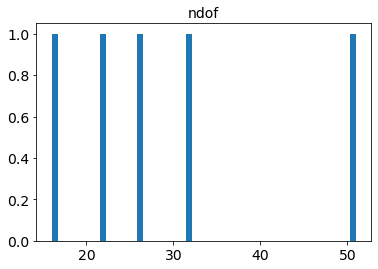

rango chisq/ndof : 2.169733114461456, 6.179594319770619
promedio chisq/ndof : 4.009219517987018
desviación estándar chisq/ndof : 1.358712773858668
mediana chisq/ndof : 4.278638422993012


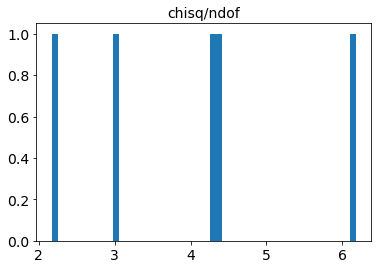

rango z : 0.0185, 0.08
promedio z : 0.046759999999999996
desviación estándar z : 0.02566247065268658
mediana z : 0.0365


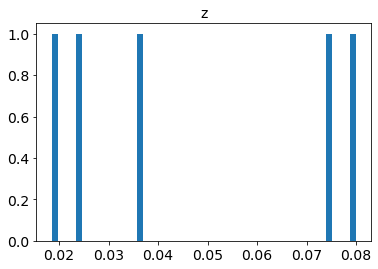

rango t0 : 58262.58357076317, 58328.82764679032
promedio t0 : 58291.025888270684
desviación estándar t0 : 24.232025210425082
mediana t0 : 58294.39887262352


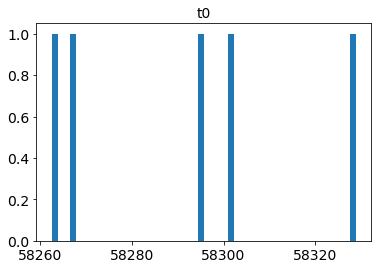

rango t0_err : 0.025249441405321704, 0.09232316587440437
promedio t0_err : 0.051152194081805644
desviación estándar t0_err : 0.024156747629576265
mediana t0_err : 0.05000043562904466


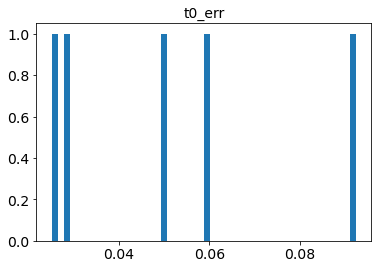

rango x0 : 0.0007341051725383859, 0.011095939060549339
promedio x0 : 0.003733338640576267
desviación estándar x0 : 0.0038228447786920697
mediana x0 : 0.0024060980893184846


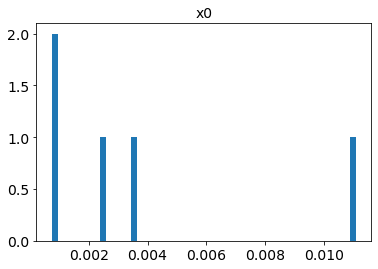

rango x0_err : 5.590017965979013e-06, 6.411129651324512e-05
promedio x0_err : 2.286410046382696e-05
desviación estándar x0_err : 2.1098270619164315e-05
mediana x0_err : 1.5231181316610293e-05


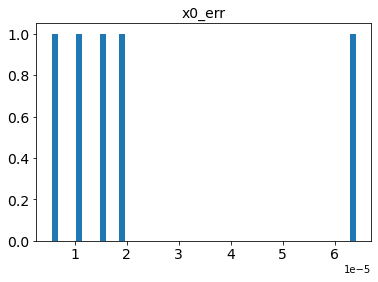

rango x1 : 0.7427790735273909, 2.22224807457989
promedio x1 : 1.2577201314004398
desviación estándar x1 : 0.5092473267240576
mediana x1 : 1.0604598002200685


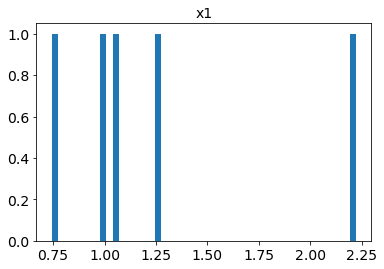

rango x1_err : 0.040201363549412124, 0.15445563969243045
promedio x1_err : 0.07655623145137742
desviación estándar x1_err : 0.04209601987421359
mediana x1_err : 0.0609298864681323


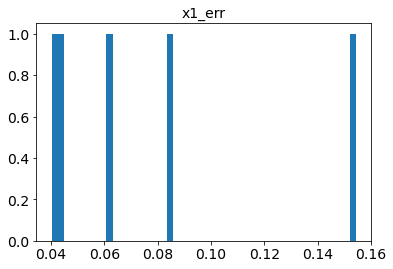

rango c : -0.05172225940293026, 0.6147510196896453
promedio c : 0.12601464354221464
desviación estándar c : 0.2550435900633987
mediana c : -0.02811995157445354


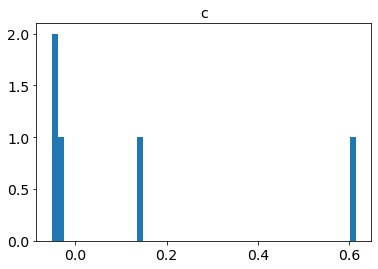

rango c_err : 0.0052016246999908805, 0.019207070569853657
promedio c_err : 0.01154757680883046
desviación estándar c_err : 0.005261797412179838
mediana c_err : 0.009520663106485614


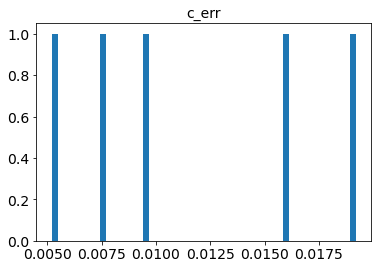

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


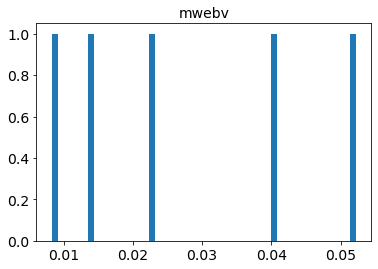

In [115]:
histogramas_estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa_cortes_trest, 
                                    z_real=True, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 103, 127
promedio ncall : 116.66666666666667
desviación estándar ncall : 10.077477638553983
mediana ncall : 120.0


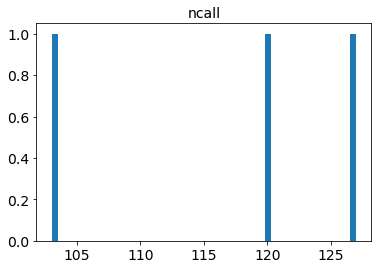

rango chisq : 1.2351738712913127, 568.3156740204928
promedio chisq : 204.06779423442165
desviación estándar chisq : 258.1165600954971
mediana chisq : 42.65253481148092


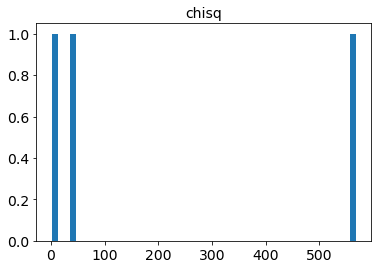

rango ndof : 4, 48
promedio ndof : 26.666666666666668
desviación estándar ndof : 17.98765008430939
mediana ndof : 28.0


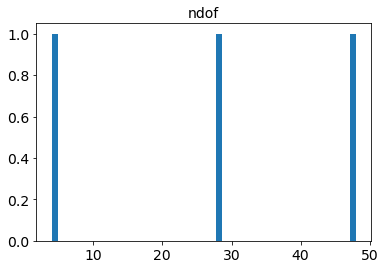

rango chisq/ndof : 0.3087934678228282, 20.296988357874742
promedio chisq/ndof : 7.164792100312251
desviación estándar chisq/ndof : 9.288881389862611
mediana chisq/ndof : 0.8885944752391858


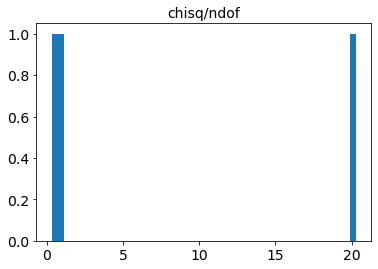

rango z : 0.0181, 0.12
promedio z : 0.06826666666666666
desviación estándar z : 0.04161524827378648
mediana z : 0.0667


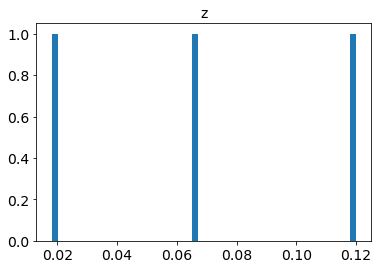

rango t0 : 58265.28523231122, 58363.8681782124
promedio t0 : 58309.92526687448
desviación estándar t0 : 40.78036245426806
mediana t0 : 58300.62239009981


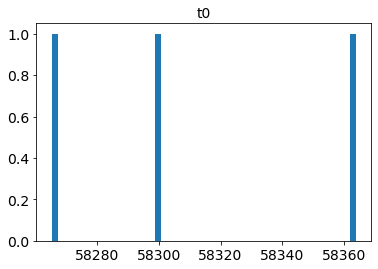

rango t0_err : 0.009948143877409166, 1.0064119983908313
promedio t0_err : 0.3700408012155094
desviación estándar t0_err : 0.4512814546886655
mediana t0_err : 0.0937622613782878


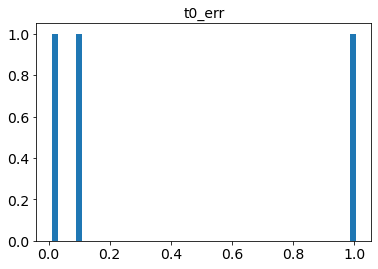

rango x0 : 0.0002408992436632857, 0.008532072016202388
promedio x0 : 0.003230580353295003
desviación estándar x0 : 0.0037589216105776047
mediana x0 : 0.0009187698000193345


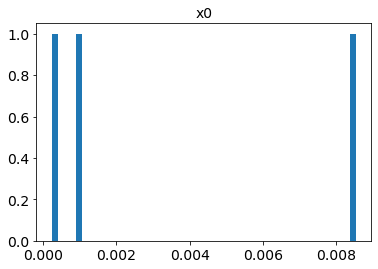

rango x0_err : 9.99568283689796e-06, 3.2771038839677875e-05
promedio x0_err : 1.958795375287867e-05
desviación estándar x0_err : 9.638453197837432e-06
mediana x0_err : 1.5997139582060177e-05


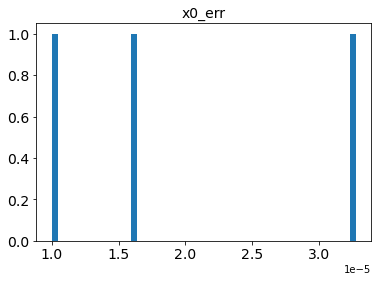

rango x1 : -1.4199483254548064, 0.7993451063524045
promedio x1 : -0.16532686205462813
desviación estándar x1 : 0.9289308787887081
mediana x1 : 0.12462263293851744


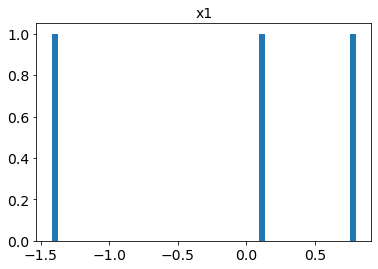

rango x1_err : 0.015615974080204131, 1.9865726930377352
promedio x1_err : 0.7047808833796222
desviación estándar x1_err : 0.9072201420722996
mediana x1_err : 0.112153983020927


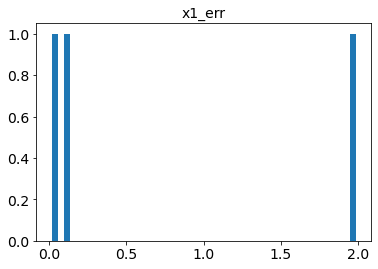

rango c : 0.018591569919656794, 0.1318398829731763
promedio c : 0.06846169201641865
desviación estándar c : 0.04720978744294295
mediana c : 0.05495362315642285


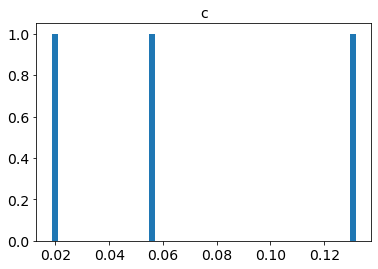

rango c_err : 0.0020599817010846346, 0.11904093410016503
promedio c_err : 0.04573861404758505
desviación estándar c_err : 0.05214919597353652
mediana c_err : 0.01611492634150548


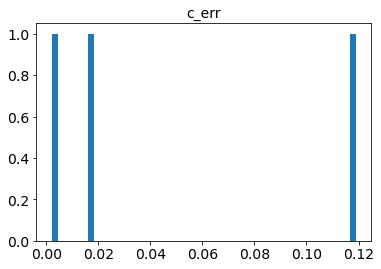

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


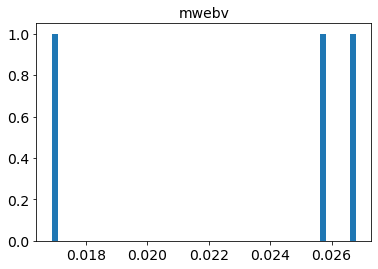

In [116]:
histogramas_estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa_cortes_trest, 
                                    z_real=True, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [117]:
estadisticas_SALT2_z_fijo_cortes_trest = estadisticas_resultados(ajustes_SALT2_z_fijo_early_SNIa_cortes_trest, 
                                                                 z_real=True).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT2 y redshift real, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [118]:
lista_oid_SALT2_z_fijo_cortes_trest = list(estadisticas_SALT2_z_fijo_cortes_trest['oid'])
lista_chisq_vs_ndof_SALT2_z_fijo_cortes_trest = list(estadisticas_SALT2_z_fijo_cortes_trest['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [119]:
median_chisq_vs_ndof_SALT2_z_fijo_cortes_trest = np.median(np.array(estadisticas_SALT2_z_fijo_cortes_trest['chisq/ndof']))
df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest = estadisticas_SALT2_z_fijo_cortes_trest[estadisticas_SALT2_z_fijo_cortes_trest['chisq/ndof'] > median_chisq_vs_ndof_SALT2_z_fijo_cortes_trest].reset_index()
lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest = list(df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [120]:
display(df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest[['oid', 
                                                                  'chisq/ndof', 
                                                                  'z', 
                                                                  't0', 
                                                                  't0_err']])

,oid,chisq/ndof,z,t0,t0_err
0,ZTF18abckujg,1.561183,0.0740,58303.340122,0.146650
1,ZTF18abtnlik,1.564569,0.0900,58379.085173,0.151260
2,ZTF18aazblzy,1.579057,0.0653,58291.799175,0.049163
3,ZTF18abdkimx,1.587939,0.0800,58313.849572,0.112693
4,ZTF18abpamut,1.588199,0.0720,58367.663093,0.148358
5,ZTF18abclalx,1.610255,0.1000,58301.101550,0.182075
6,ZTF18abdbuty,1.675277,0.0600,58308.087150,0.125924
7,ZTF18aaxwjmp,1.677559,0.0800,58288.346748,0.079886
8,ZTF18abjvhec,1.708779,0.0570,58340.363787,0.100591
9,ZTF18aaxrvzj,1.824913,0.1100,58286.100037,0.154429


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT2 y $z_{real}$  antes y después de eliminar los puntos fuera del rango de tiempo del modelo en trest

In [121]:
inter_oid_SALT2_z_fijo_sobre_mediana_cortes_trest = np.intersect1d(np.array(lista_oid_SALT2_z_fijo_sobre_mediana),
                                                                   np.array(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest))
print('Elementos comunes sobre la mediana de chisq/ndof : ',len(inter_oid_SALT2_z_fijo_sobre_mediana_cortes_trest))

Elementos comunes sobre la mediana de chisq/ndof :  39


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [122]:
table_early_SNIa_SALT2_z_fijo_cortes_trest = astropy_table_detections(df_meta_early_SNIa, 
                                                                     detect_early_SNIa_cortes_trest_SALT2_z_fijo)

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ===== Ajuste con redshift real ====
chisq/ndof :  0.44236796253013444


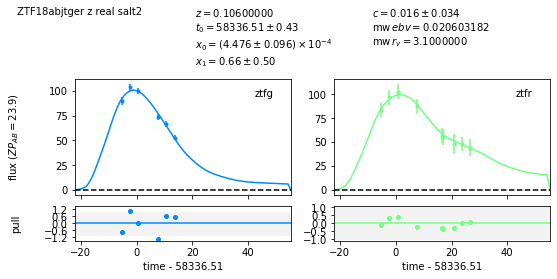

In [123]:
ajuste(lista_oid_SALT2_z_fijo_cortes_trest[1], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_trest, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_trest[1])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.6666883475318054


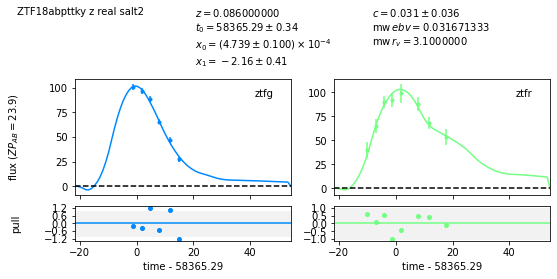

In [124]:
ajuste(lista_oid_SALT2_z_fijo_cortes_trest[6], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_trest, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_trest[6])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.8321587841857431


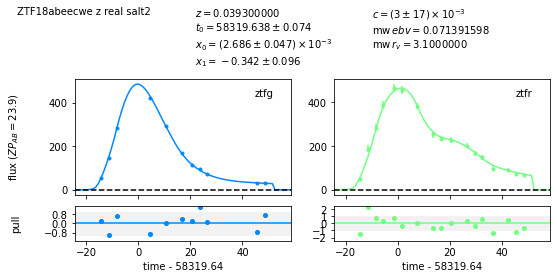

In [125]:
ajuste(lista_oid_SALT2_z_fijo_cortes_trest[16], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_trest, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_trest[16])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.8885482367528331


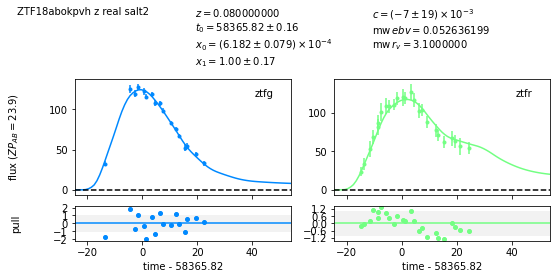

In [126]:
ajuste(lista_oid_SALT2_z_fijo_cortes_trest[19], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_trest, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_trest[19])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.1175309016906863


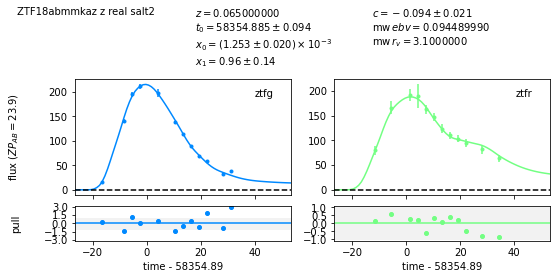

In [127]:
ajuste(lista_oid_SALT2_z_fijo_cortes_trest[29], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_trest, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_trest[29])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.2055754864205708


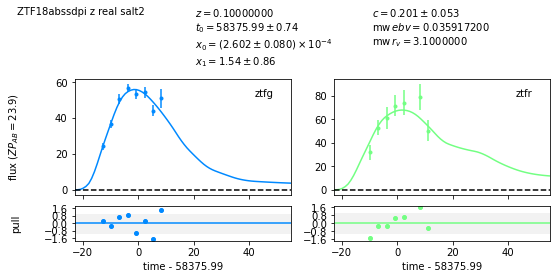

In [128]:
ajuste(lista_oid_SALT2_z_fijo_cortes_trest[32], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_trest, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_trest[32])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.416398910085873


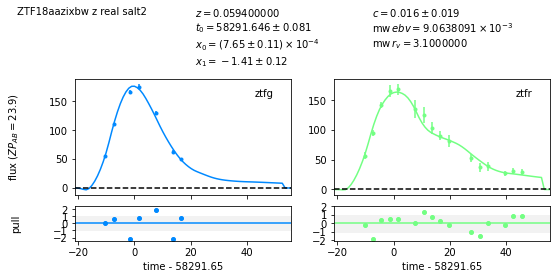

In [129]:
ajuste(lista_oid_SALT2_z_fijo_cortes_trest[40], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_trest, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_trest[40])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.430145069722101


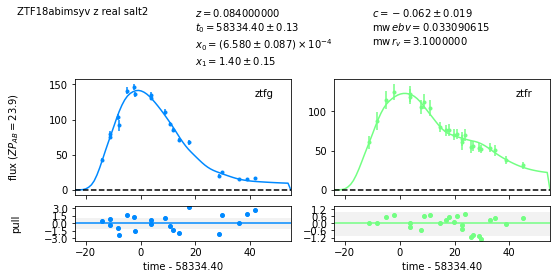

In [130]:
ajuste(lista_oid_SALT2_z_fijo_cortes_trest[41], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_fijo_cortes_trest, version='2.4', z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_fijo_cortes_trest[41])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ mayores a la mediana.

 ===== Ajuste con redshift real ====
chisq/ndof :  1.6752772015673179


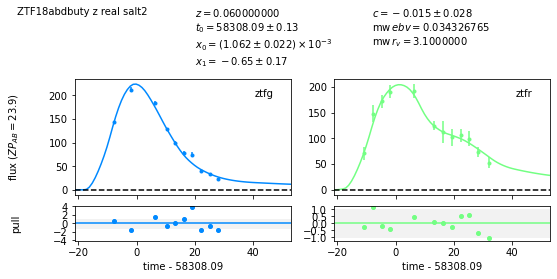

In [131]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest[6], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_trest, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][6])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.9960044165670108


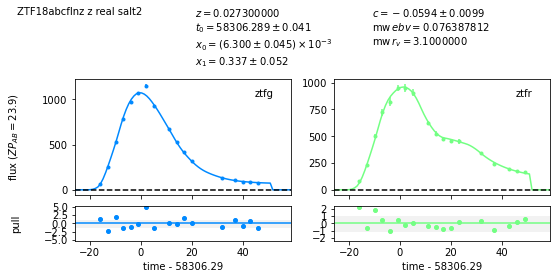

In [132]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest[13], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_trest, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][13])

 ===== Ajuste con redshift real ====
chisq/ndof :  3.0380397848592358


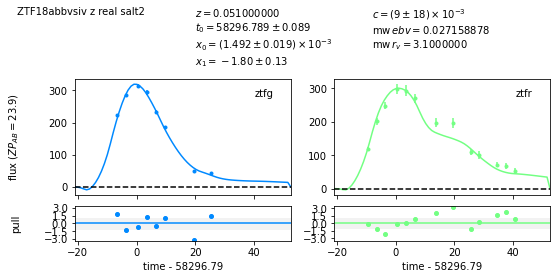

In [133]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest[20], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_trest, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][20])

 ===== Ajuste con redshift real ====
chisq/ndof :  3.205966362146047


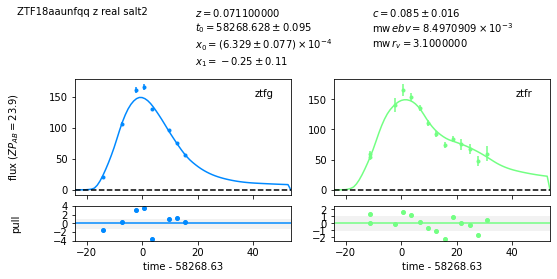

In [134]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest[23], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_trest, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][23])

 ===== Ajuste con redshift real ====
chisq/ndof :  5.685807886884724


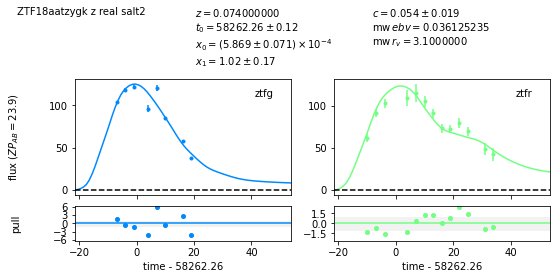

In [135]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest[31], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_trest, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][31])

 ===== Ajuste con redshift real ====
chisq/ndof :  13.567688646277404


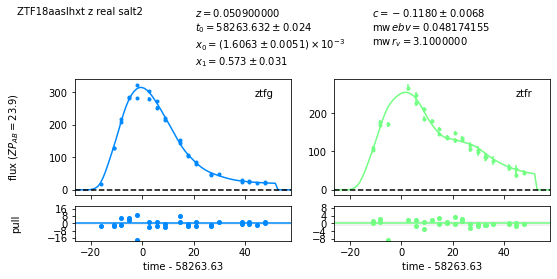

In [136]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest[38], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_trest, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][38])

 ===== Ajuste con redshift real ====
chisq/ndof :  19.116075103470454


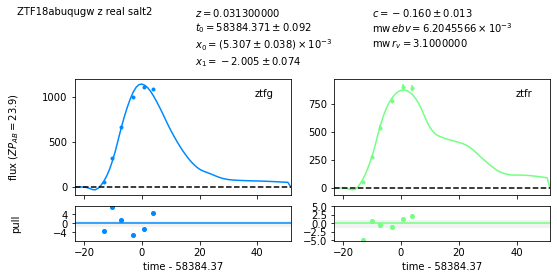

In [137]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest[40], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_trest, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][40])

 ===== Ajuste con redshift real ====
chisq/ndof :  20.296988357874742


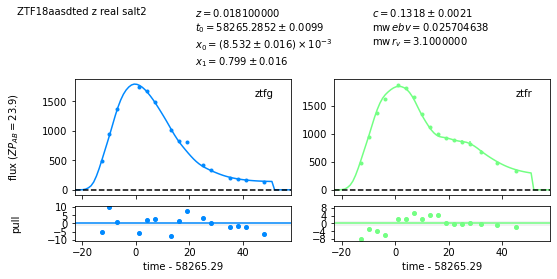

In [138]:
ajuste(lista_oid_SALT2_z_fijo_sobre_mediana_cortes_trest[41], 'salt2', 
       df_meta_early_SNIa, table_early_SNIa_SALT2_z_fijo_cortes_trest, 
       version='2.4', z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][41])

### Ajuste con redshift variable

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el valor de $t_0$ del primer ajuste con el modelo SALT2 $z=0$, donde el siguiente ajuste se realizará con redshift variable

In [139]:
detect_early_SNIa_cortes_trest_SALT2_z_var = cortes_trest_modelo(trest_min_modelo,
                                                                 trest_max_modelo, 
                                                                 detect_early_SNIa,
                                                                 estadisticas_SALT2_z_var)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo, determinado con $z=0$ y $t_0$ del primer ajuste

In [140]:
ajustes_SALT2_early_SNIa_cortes_trest = modelo_ajustado_y_resultados('salt2', 
                                                                     df_meta_early_SNIa, 
                                                                     detect_early_SNIa_cortes_trest_SALT2_z_var, 
                                                                     version='2.4',
                                                                     print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 152, 1184
promedio ncall : 328.07894736842104
desviación estándar ncall : 161.56380222180232
mediana ncall : 273.5


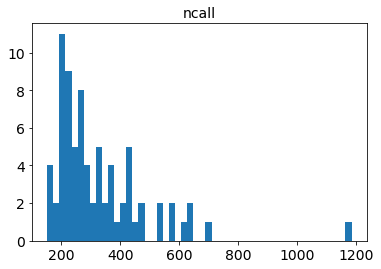

rango chisq : 4.702333060555874, 758.7482040583806
promedio chisq : 73.7929614553197
desviación estándar chisq : 137.40388487468948
mediana chisq : 28.83270252895538


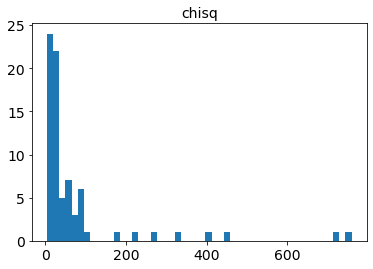

rango ndof : 5, 57
promedio ndof : 19.789473684210527
desviación estándar ndof : 11.007552179578783
mediana ndof : 16.5


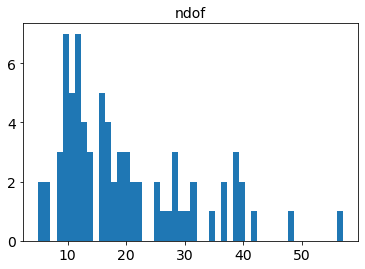

rango chisq/ndof : 0.47023330605558744, 24.238260655889075
promedio chisq/ndof : 3.1753318411107387
desviación estándar chisq/ndof : 4.350023360996653
mediana chisq/ndof : 1.682753891540303


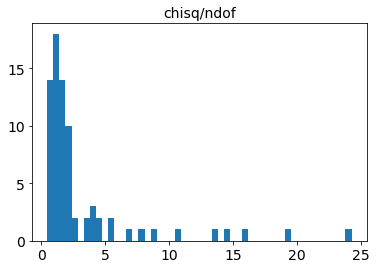

rango z : 0.0010000004500293118, 0.34896642675813283
promedio z : 0.16677645606204722
desviación estándar z : 0.09897260498341806
mediana z : 0.15510544614618324


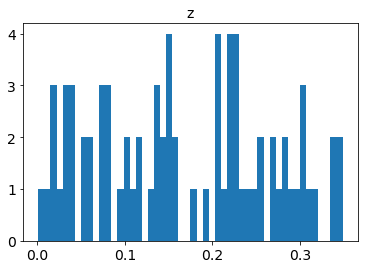

rango z_err : 1.2479866098868975e-10, 0.1661183133954589
promedio z_err : 0.02014360637601643
desviación estándar z_err : 0.020815027479940407
mediana z_err : 0.01591960703562683


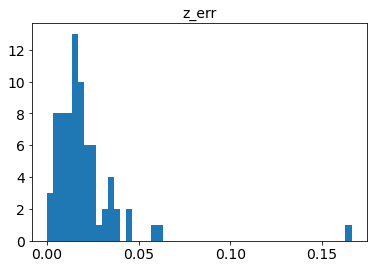

rango t0 : 58257.01493998718, 58396.5690826532
promedio t0 : 58323.03464403317
desviación estándar t0 : 38.75257420852351
mediana t0 : 58318.02787198714


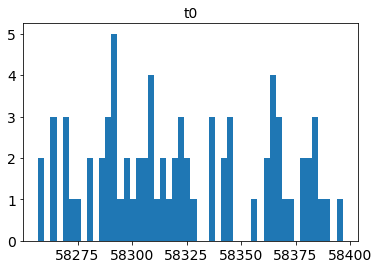

rango t0_err : 2.816998676280491e-05, 1.9826998928328976
promedio t0_err : 0.2961189142429009
desviación estándar t0_err : 0.3051157534746487
mediana t0_err : 0.20663286569651973


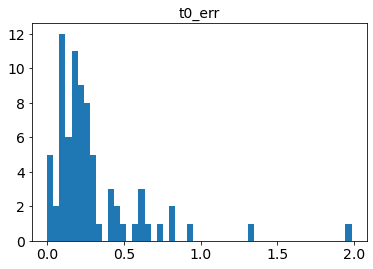

rango x0 : 0.00021593183581902124, 0.005101908717102415
promedio x0 : 0.0010763684890115696
desviación estándar x0 : 0.0011236327749288674
mediana x0 : 0.0006606513054358968


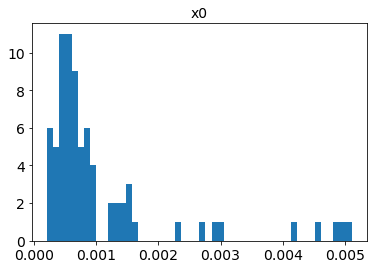

rango x0_err : 5.4301043387187246e-06, 0.00011701876278161326
promedio x0_err : 1.830372570208372e-05
desviación estándar x0_err : 1.5219076915912403e-05
mediana x0_err : 1.2120710650305057e-05


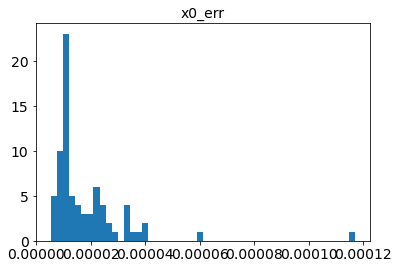

rango x1 : -2.02517714893721, 3.9168637014464673
promedio x1 : 0.05926638560370388
desviación estándar x1 : 1.1489252882163277
mediana x1 : 0.21239707164425736


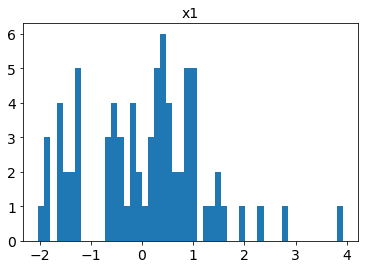

rango x1_err : 0.024837003598902507, 1.2361110642957445
promedio x1_err : 0.2438413598972304
desviación estándar x1_err : 0.22803587171374512
mediana x1_err : 0.18304281854036186


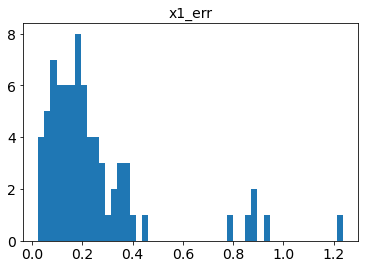

rango c : -0.34573583205279895, 0.2909049500748452
promedio c : -0.09677912223517494
desviación estándar c : 0.13400909865076432
mediana c : -0.09787403368210532


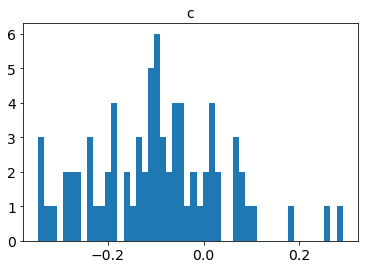

rango c_err : 0.004429663569968989, 0.20047109140270977
promedio c_err : 0.035897571540627685
desviación estándar c_err : 0.026818635510974093
mediana c_err : 0.03143191738562156


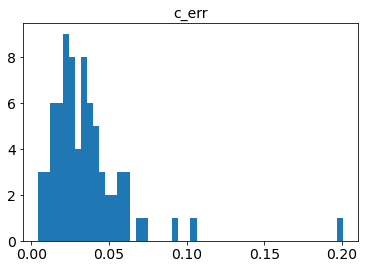

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


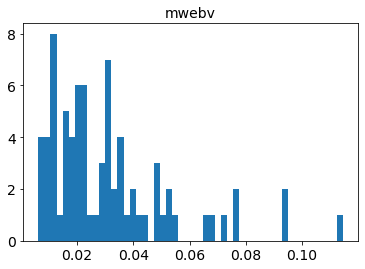

In [142]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_cortes_trest, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 210, 453
promedio ncall : 288.8
desviación estándar ncall : 86.95608086844761
mediana ncall : 279.0


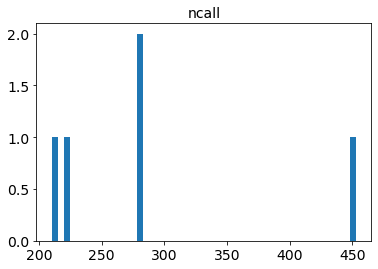

rango chisq : 72.28230319809185, 941.7936635009944
promedio chisq : 332.09733187997483
desviación estándar chisq : 329.5559184152987
mediana chisq : 131.17858705499822


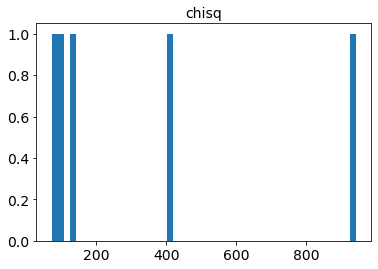

rango ndof : 15, 54
promedio ndof : 29.2
desviación estándar ndof : 13.45213737664019
mediana ndof : 25.0


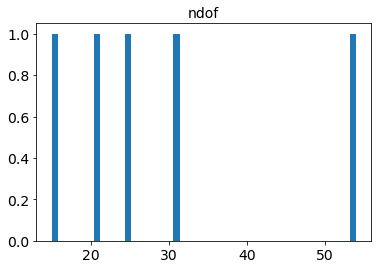

rango chisq/ndof : 4.231567324354781, 17.44062339816656
promedio chisq/ndof : 9.566110816947496
desviación estándar chisq/ndof : 6.164352511512854
mediana chisq/ndof : 4.8188202132061235


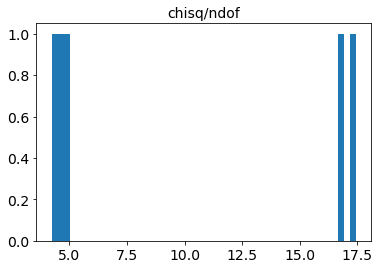

rango z : 0.01918882213793567, 0.4464162651526625
promedio z : 0.21689281090935525
desviación estándar z : 0.1394323376027653
mediana z : 0.2258657299146724


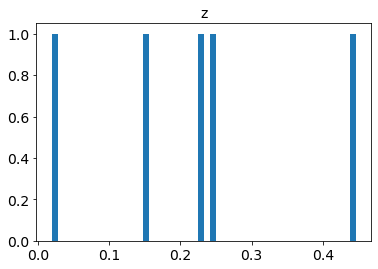

rango z_err : 0.0020355564861059827, 0.007953352373566175
promedio z_err : 0.004600377067289046
desviación estándar z_err : 0.0025173751553150686
mediana z_err : 0.003759673846714953


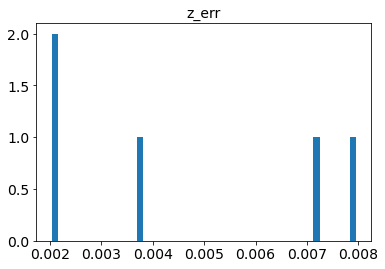

rango t0 : 58264.17154077921, 58334.61702978866
promedio t0 : 58292.8953962919
desviación estándar t0 : 25.64475675318121
mediana t0 : 58295.96631639214


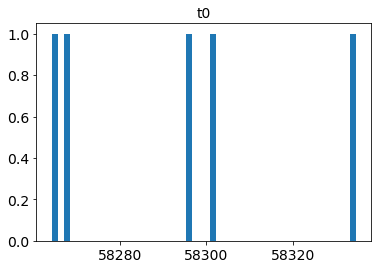

rango t0_err : 0.031103713139600586, 0.0972804067969264
promedio t0_err : 0.06956508899311302
desviación estándar t0_err : 0.024095841081870902
mediana t0_err : 0.08152403055282775


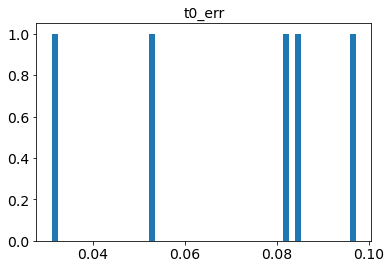

rango x0 : 0.0006541735176434569, 0.011206030560162445
promedio x0 : 0.0037548138978676085
desviación estándar x0 : 0.0038605248823512964
mediana x0 : 0.00282498716180375


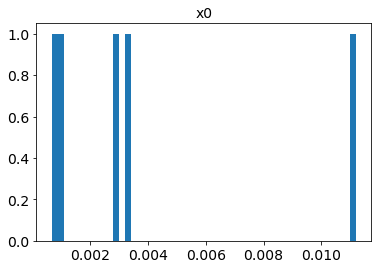

rango x0_err : 9.342447173274886e-06, 7.897856278619903e-05
promedio x0_err : 3.137089134728245e-05
desviación estándar x0_err : 2.5538908927433134e-05
mediana x0_err : 1.7623050637233936e-05


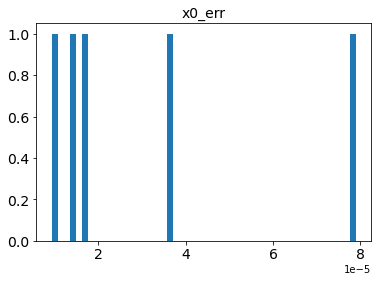

rango x1 : 0.4614337630743295, 2.9119107546978764
promedio x1 : 1.4597450142454322
desviación estándar x1 : 0.8864827052014069
mediana x1 : 1.1842126066385976


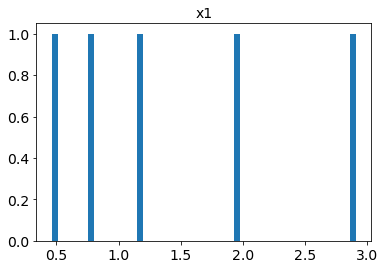

rango x1_err : 0.03526506230018844, 0.1581184799406019
promedio x1_err : 0.09000833401011255
desviación estándar x1_err : 0.04424140070750215
mediana x1_err : 0.09018441598250737


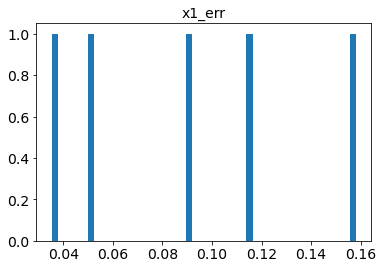

rango c : -0.24291660669955367, -0.0147180881860689
promedio c : -0.11798842826158151
desviación estándar c : 0.08336679956133991
mediana c : -0.12242598164900176


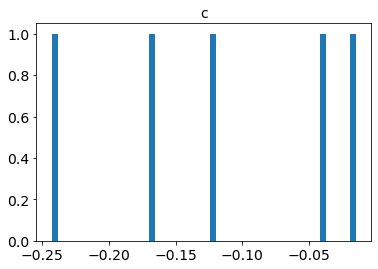

rango c_err : 0.004987959759523319, 0.024956688394151466
promedio c_err : 0.013186852756290677
desviación estándar c_err : 0.008554651220348646
mediana c_err : 0.008975428913829908


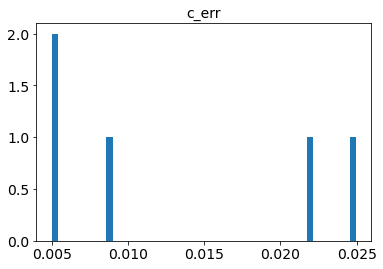

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


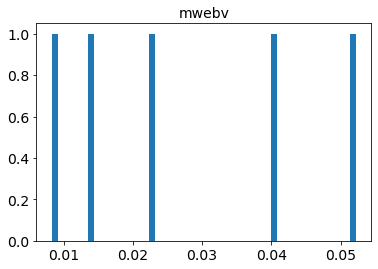

In [143]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_cortes_trest, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 183, 408
promedio ncall : 330.6666666666667
desviación estándar ncall : 104.45520039178943
mediana ncall : 401.0


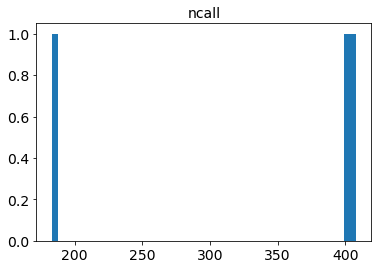

rango chisq : 1.272570386239837, 472.01868844403236
promedio chisq : 171.76152643827223
desviación estándar chisq : 212.96371736981726
mediana chisq : 41.993320484544505


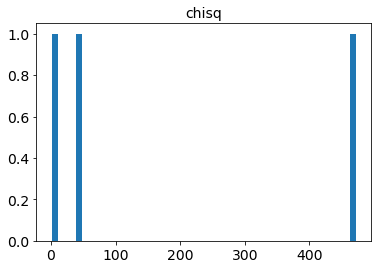

rango ndof : 3, 47
promedio ndof : 26.0
desviación estándar ndof : 18.01850900231944
mediana ndof : 28.0


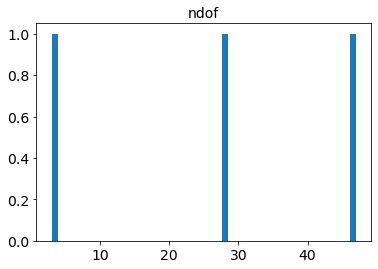

rango chisq/ndof : 0.4241901287466123, 16.857810301572584
promedio chisq/ndof : 6.058491778081891
desviación estándar chisq/ndof : 7.638674295055428
mediana chisq/ndof : 0.8934749039264788


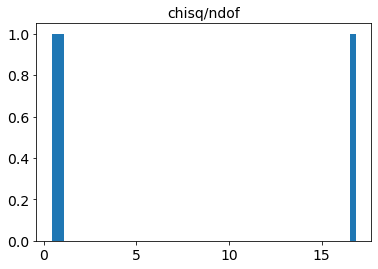

rango z : 0.02721284774490162, 0.25528816377305014
promedio z : 0.11313117834262006
desviación estándar z : 0.10124780546882524
mediana z : 0.056892523509908456


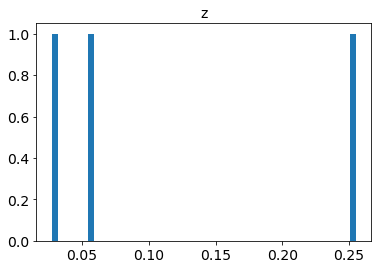

rango z_err : 0.0009547256734651118, 0.0718077020267235
promedio z_err : 0.030187962534372264
desviación estándar z_err : 0.03022256497065205
mediana z_err : 0.017801459902928172


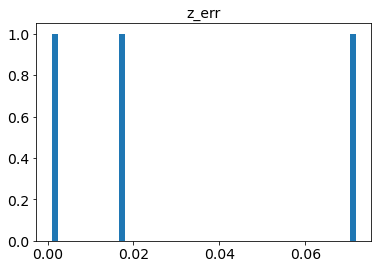

rango t0 : 58265.4529614012, 58363.95650191905
promedio t0 : 58309.994197776534
desviación estándar t0 : 40.761945178015054
mediana t0 : 58300.573130009354


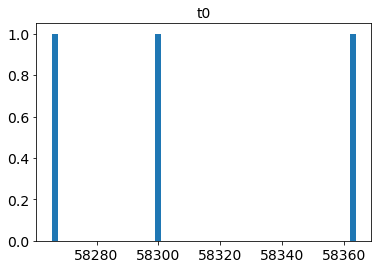

rango t0_err : 0.02037282038872945, 1.0824204428390658
promedio t0_err : 0.4169749759651798
desviación estándar t0_err : 0.4734228783446011
mediana t0_err : 0.1481316646677442


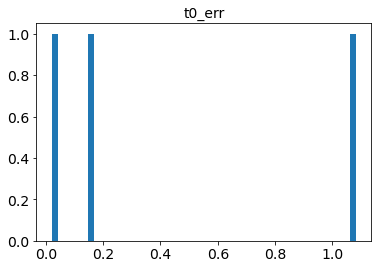

rango x0 : 0.00025894719712728627, 0.008416978625872823
promedio x0 : 0.0032001801933712465
desviación estándar x0 : 0.003698830242037584
mediana x0 : 0.0009246147571136307


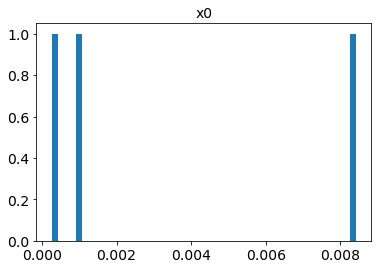

rango x0_err : 1.6023352174092598e-05, 4.117869473610531e-05
promedio x0_err : 2.5713866347695954e-05
desviación estándar x0_err : 1.1051541169795735e-05
mediana x0_err : 1.9939552132889952e-05


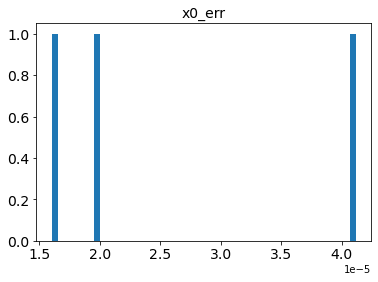

rango x1 : -2.305271444535058, 0.8873440529210201
promedio x1 : -0.41025346165721466
desviación estándar x1 : 1.3701293954968081
mediana x1 : 0.18716700664239383


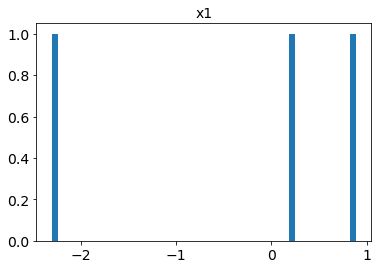

rango x1_err : 0.018290688646695585, 1.7233964727009694
promedio x1_err : 0.6276407311920021
desviación estándar x1_err : 0.7764403010715335
mediana x1_err : 0.14123503222834133


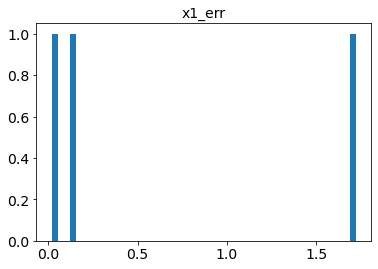

rango c : -0.22490912314704736, 0.12195423458948396
promedio c : -0.024173781395914678
desviación estándar c : 0.14677651323362098
mediana c : 0.030433544369819376


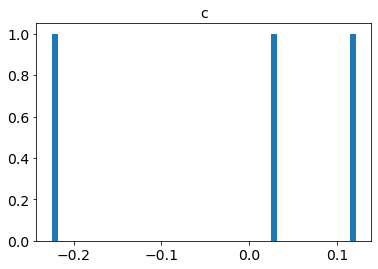

rango c_err : 0.002216417209866872, 0.2035663010874139
promedio c_err : 0.07788693771332447
desviación estándar c_err : 0.0894841036472217
mediana c_err : 0.027878094842692658


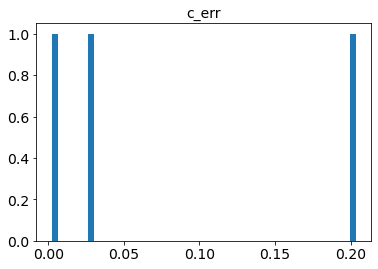

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


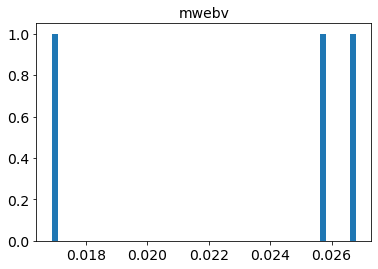

In [144]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_cortes_trest, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [145]:
estadisticas_SALT2_z_var_cortes_trest = estadisticas_resultados(ajustes_SALT2_early_SNIa_cortes_trest).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT2 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [146]:
lista_oid_SALT2_z_var_cortes_trest = list(estadisticas_SALT2_z_var_cortes_trest['oid'])
lista_chisq_vs_ndof_SALT2_z_var_cortes_trest = list(estadisticas_SALT2_z_var_cortes_trest['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [147]:
median_chisq_vs_ndof_SALT2_z_var_cortes_trest = np.median(np.array(estadisticas_SALT2_z_var_cortes_trest['chisq/ndof']))
df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest = estadisticas_SALT2_z_var_cortes_trest[estadisticas_SALT2_z_var_cortes_trest['chisq/ndof'] > median_chisq_vs_ndof_SALT2_z_var_cortes_trest].reset_index()
lista_oid_SALT2_z_var_sobre_mediana_cortes_trest = list(df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [148]:
display(df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest[['oid', 
                                                                 'chisq/ndof', 
                                                                 'z', 
                                                                 'z_err', 
                                                                 't0', 
                                                                 't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
0,ZTF18abdbuty,1.755664,0.179398,1.680274e-02,58308.635290,0.298514
1,ZTF18abfgygp,1.772677,0.226013,7.145235e-03,58323.517629,0.100453
2,ZTF18abdfwur,1.815980,0.227314,1.285829e-02,58311.487508,0.167697
3,ZTF18abealop,1.864397,0.001000,1.404756e-02,58315.390314,0.198186
4,ZTF18abrzeym,1.871267,0.136248,1.885541e-02,58374.232011,0.171011
5,ZTF18aaxrvzj,1.873503,0.220224,1.802760e-02,58287.226885,0.206125
6,ZTF18absdgon,1.941578,0.254116,2.501496e-02,58377.339180,0.201737
7,ZTF18abcrxoj,2.004514,0.034167,4.260207e-03,58306.296736,0.080730
8,ZTF18abimsyv,2.021273,0.230718,1.345244e-02,58336.099961,0.183273
9,ZTF18abkifng,2.029426,0.153458,3.302331e-02,58344.007614,0.222102


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [149]:
table_early_SNIa_SALT2_z_var_cortes_trest = astropy_table_detections(df_meta_early_SNIa, 
                                                                      detect_early_SNIa_cortes_trest_SALT2_z_var)

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  0.4241901287466123


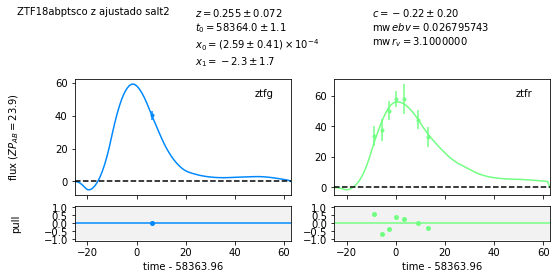

In [150]:
ajuste(lista_oid_SALT2_z_var_cortes_trest[0], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_trest[0])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.5551697749497996


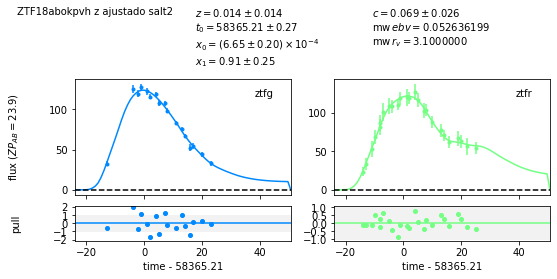

In [151]:
ajuste(lista_oid_SALT2_z_var_cortes_trest[2], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_trest[2])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.6937781076434644


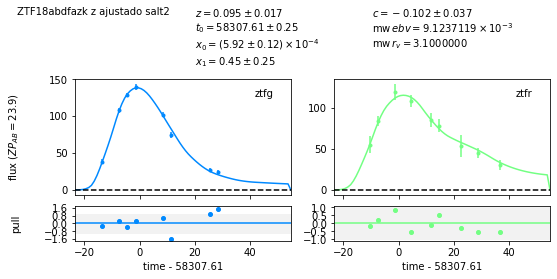

In [152]:
ajuste(lista_oid_SALT2_z_var_cortes_trest[9], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_trest[9])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.9758428029340361


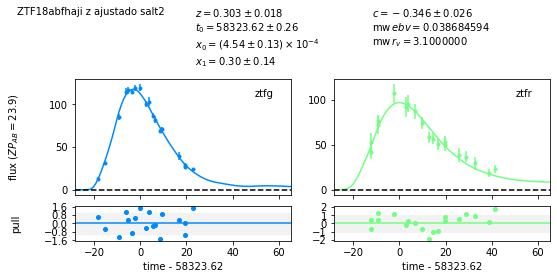

In [153]:
ajuste(lista_oid_SALT2_z_var_cortes_trest[16], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_trest[16])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.0542029473801287


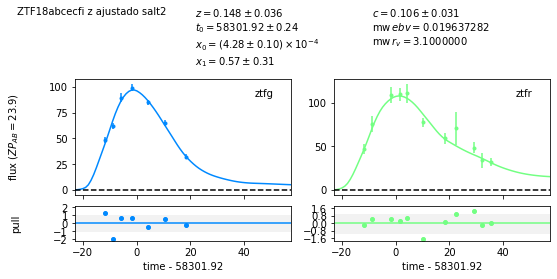

In [154]:
ajuste(lista_oid_SALT2_z_var_cortes_trest[19], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_trest[19])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.1815579388047808


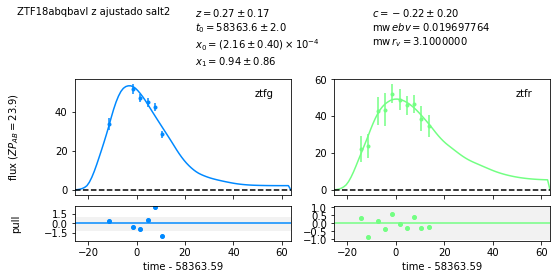

In [155]:
ajuste(lista_oid_SALT2_z_var_cortes_trest[24], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_trest[24])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.691554430365863


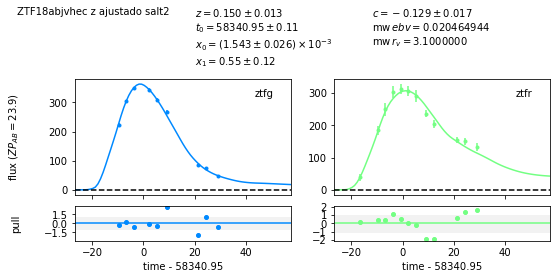

In [156]:
ajuste(lista_oid_SALT2_z_var_cortes_trest[40], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_trest[40])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.735892535475558


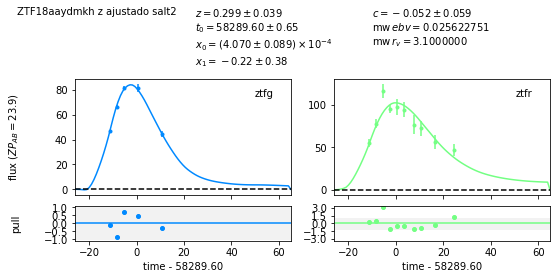

In [157]:
ajuste(lista_oid_SALT2_z_var_cortes_trest[41], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT2_z_var_cortes_trest[41])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ mayores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  1.8643974474087515


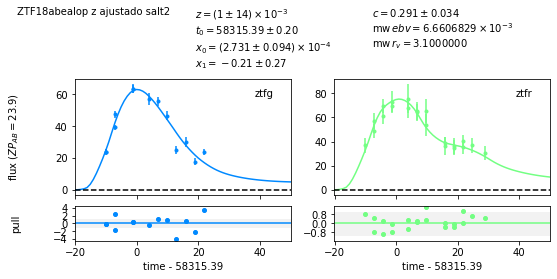

In [158]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_trest[3], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['chisq/ndof'][3])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.0212731548822114


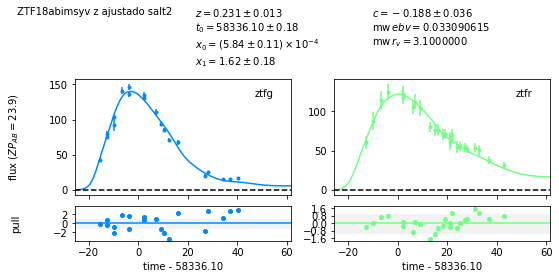

In [159]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_trest[8], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['chisq/ndof'][8])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.371042239064131


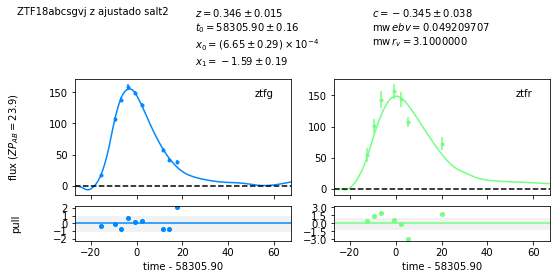

In [160]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_trest[15], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['chisq/ndof'][15])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.5833948998752843


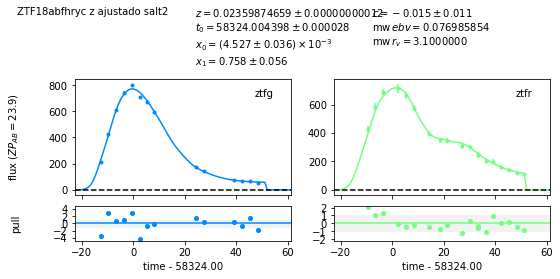

In [161]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_trest[17], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['chisq/ndof'][17])

 ==== Con ajuste del redshift ====
chisq/ndof :  3.9741603902957947


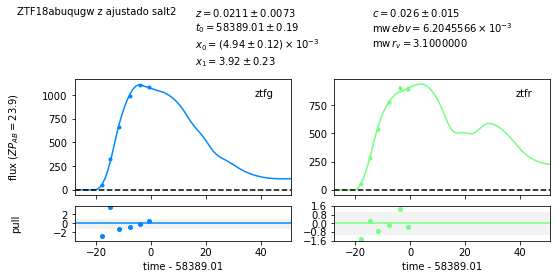

In [162]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_trest[21], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['chisq/ndof'][21])

 ==== Con ajuste del redshift ====
chisq/ndof :  4.564118269865215


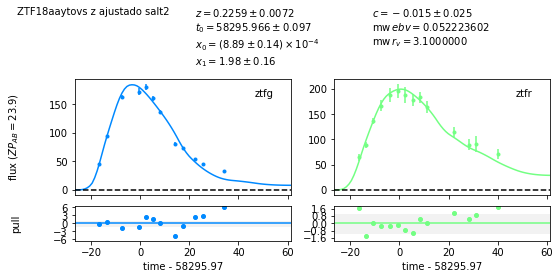

In [163]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_trest[26], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['chisq/ndof'][26])

 ==== Con ajuste del redshift ====
chisq/ndof :  5.54937622561167


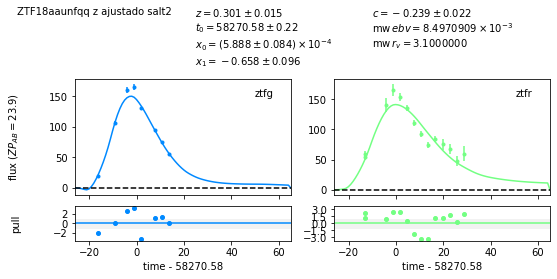

In [164]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_trest[29], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['chisq/ndof'][29])

 ==== Con ajuste del redshift ====
chisq/ndof :  10.76088283236842


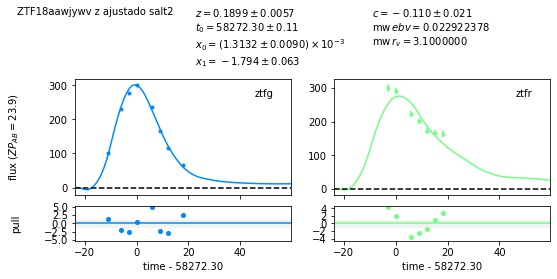

In [165]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_trest[33], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['chisq/ndof'][33])

 ==== Con ajuste del redshift ====
chisq/ndof :  17.44062339816656


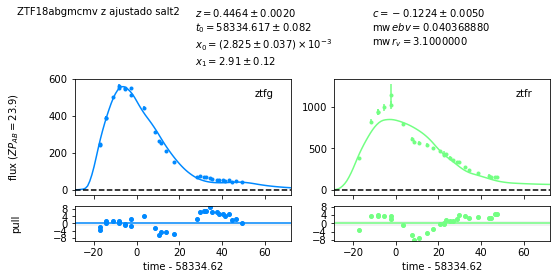

In [166]:
ajuste(lista_oid_SALT2_z_var_sobre_mediana_cortes_trest[39], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_var_cortes_trest, version='2.4')[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT2_z_var_sobre_mediana_cortes_trest['chisq/ndof'][39])

## Ajuste con límite más estricto en el valor de $z$ (solo afecta a los que también ajustan $z$) 

Aquí sabemos que el rango de redshift real de las SNIa es $0.0181 \leq z \leq 0.141$. Probaremos que pasa si en los ajustes se utiliza un rango más estricto de valores de $z$, que en este ejemplo será $[0, 0.2]$.

Límite en el rango de $z$

In [167]:
z_bounds = (0, 0.2)

### Ajuste usando todas las observaciones (con redshift variable), se debe eliminar una SN ya que no se puede ajustar (si no se elimina el programa se cae)

In [168]:
name_50 = names_SNIa[50]
print('Eliminada : ', name_50)

df_meta_early_SNIa_sin_SN50 = df_meta_early_SNIa[df_meta_early_SNIa['oid'] != name_50]
detect_early_SNIa_sin_SN50 = detect_early_SNIa[detect_early_SNIa['oid'] != name_50]

ajustes_SALT2_early_SNIa_z_bounded = modelo_ajustado_y_resultados('salt2', 
                                                                  df_meta_early_SNIa_sin_SN50,
                                                                  detect_early_SNIa_sin_SN50,
                                                                  version='2.4',
                                                                  z_bounds=z_bounds,
                                                                  print_ind_and_oid=False)

Eliminada :  ZTF18abfhryc


Link en ALeRCE ZTF explorer de esta SN: https://alerce.online/object/ZTF18abfhryc

Estadísticas SN Ia

rango ncall : 136, 816
promedio ncall : 243.02666666666667
desviación estándar ncall : 118.30716781140337
mediana ncall : 198.0


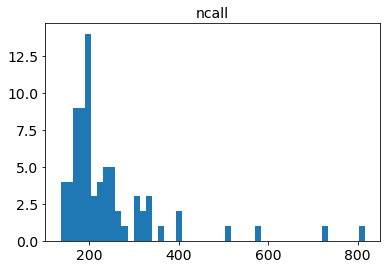

rango chisq : 4.702328651245915, 4130.003224571716
promedio chisq : 218.9315840480711
desviación estándar chisq : 665.9029162438546
mediana chisq : 27.064897575863235


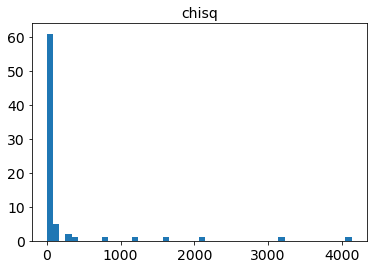

rango ndof : 5, 63
promedio ndof : 20.906666666666666
desviación estándar ndof : 12.592244526780053
mediana ndof : 17.0


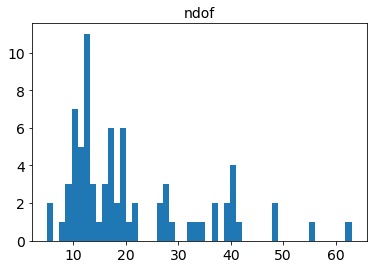

rango chisq/ndof : 0.4076105374717105, 127.11183779831222
promedio chisq/ndof : 7.294108321088786
desviación estándar chisq/ndof : 19.331441926477993
mediana chisq/ndof : 1.4171421958278385


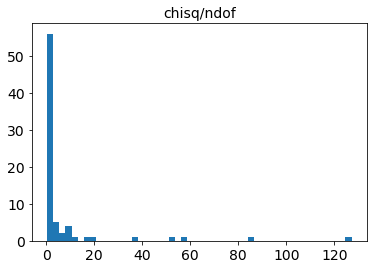

rango z : 3.2474510636149035e-09, 0.1999997551004081
promedio z : 0.07765543843594515
desviación estándar z : 0.04622162430462873
mediana z : 0.07581995561001885


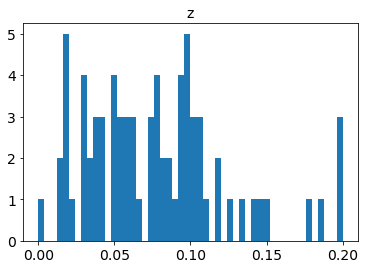

rango z_err : 1.9541313012183537e-12, 0.17104537277360138
promedio z_err : 0.024138820532350506
desviación estándar z_err : 0.03529689473749122
mediana z_err : 0.013983883654916698


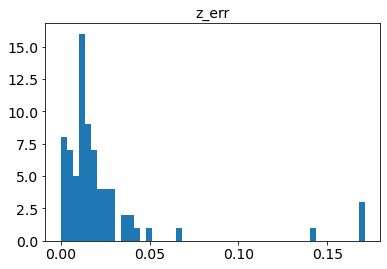

rango t0 : 58254.639819063304, 58394.951637928374
promedio t0 : 58322.138190718564
desviación estándar t0 : 38.90145519279995
mediana t0 : 58315.374825186154


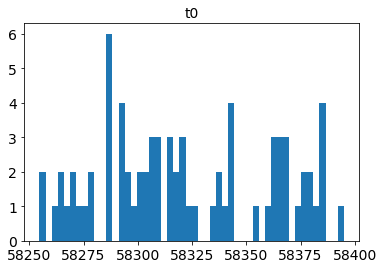

rango t0_err : 3.776222001761198e-09, 107.14097613492413
promedio t0_err : 3.030259153390216
desviación estándar t0_err : 16.866119393084695
mediana t0_err : 0.21678683050413383


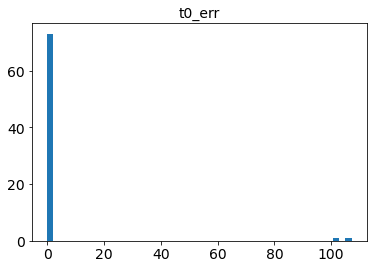

rango x0 : 0.00023151334994536514, 0.005339704983405154
promedio x0 : 0.0010695050380983705
desviación estándar x0 : 0.001090023665209724
mediana x0 : 0.0006846928466585554


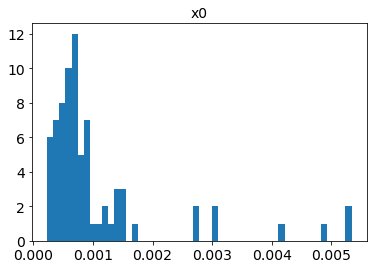

rango x0_err : 5.13260252254012e-06, 1.0339429147941692
promedio x0_err : 0.027136329937778012
desviación estándar x0_err : 0.16386219645834832
mediana x0_err : 1.2594420708545927e-05


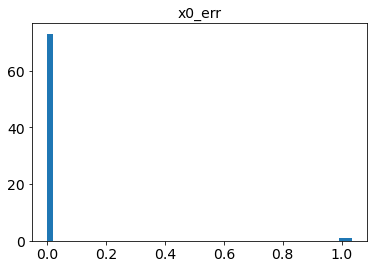

rango x1 : -2.1568083534898075, 2.6923321335276116
promedio x1 : -0.006170764792527296
desviación estándar x1 : 1.0999794196982535
mediana x1 : 0.22575330092669965


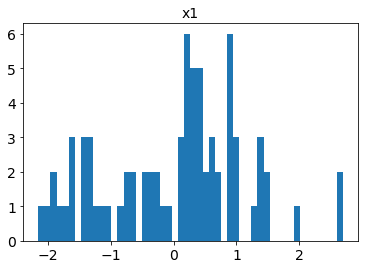

rango x1_err : 0.030261241224073032, 5.762989156459191
promedio x1_err : 0.39262264710637557
desviación estándar x1_err : 0.8763611899739918
mediana x1_err : 0.19170422595357328


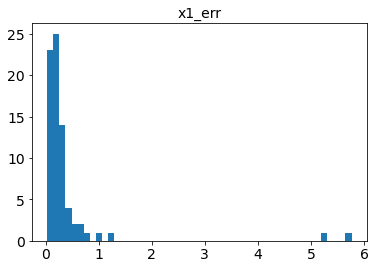

rango c : -0.21678815167251564, 0.3204867101692068
promedio c : -0.0005852838988316149
desviación estándar c : 0.10827541306820151
mediana c : -0.002932265136147194


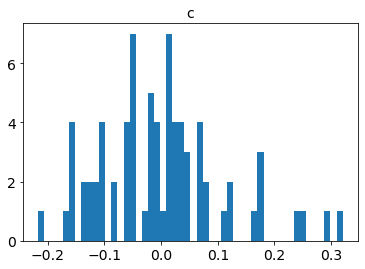

rango c_err : 0.004179173030441213, 0.5887588462221147
promedio c_err : 0.0469461117026921
desviación estándar c_err : 0.08986145872615581
mediana c_err : 0.031120390736444126


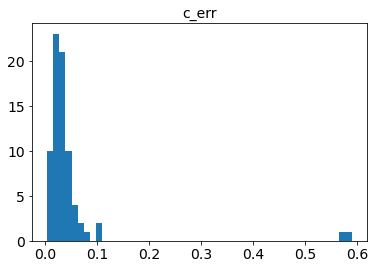

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03053426497386698
desviación estándar mwebv : 0.021538819171362078
mediana mwebv : 0.023404313345236558


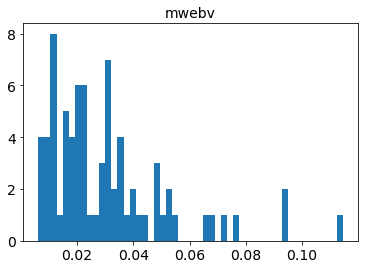

In [169]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 171, 831
promedio ncall : 328.8
desviación estándar ncall : 252.49031664600525
mediana ncall : 201.0


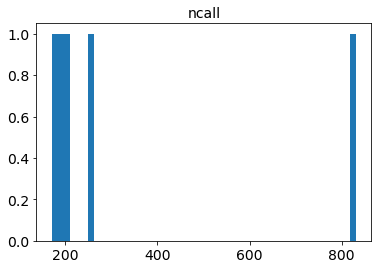

rango chisq : 69.81605388420172, 19235.449556077285
promedio chisq : 4481.314051186801
desviación estándar chisq : 7402.546364996356
mediana chisq : 1449.1440344069983


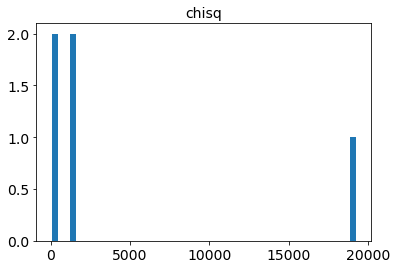

rango ndof : 15, 62
promedio ndof : 39.4
desviación estándar ndof : 19.12694434560837
mediana ndof : 35.0


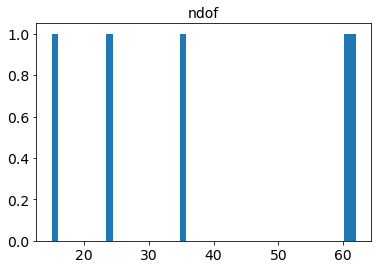

rango chisq/ndof : 4.654403592280115, 310.2491863883433
promedio chisq/ndof : 77.55329428901449
desviación estándar chisq/ndof : 117.18223923080905
mediana chisq/ndof : 23.756459580442595


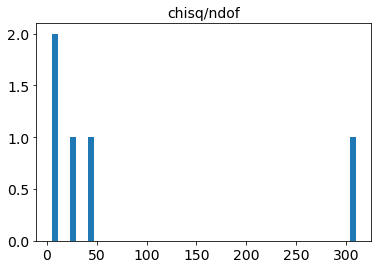

rango z : 0.019883839553257746, 0.1553476598186134
promedio z : 0.0719972788871959
desviación estándar z : 0.04810536863096534
mediana z : 0.07619708487137405


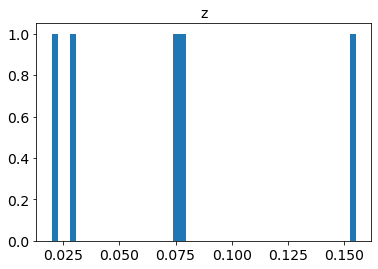

rango z_err : 0.0019098475351586146, 0.11334734062063777
promedio z_err : 0.027937526514924066
desviación estándar z_err : 0.04281465063873426
mediana z_err : 0.009624060104534427


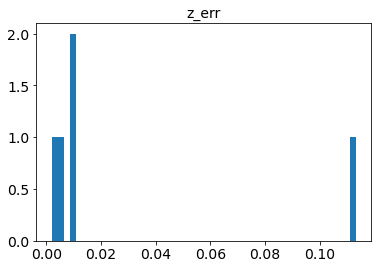

rango t0 : 58262.563743556435, 58330.41283713183
promedio t0 : 58291.30335911127
desviación estándar t0 : 24.74675184195678
mediana t0 : 58294.420620377314


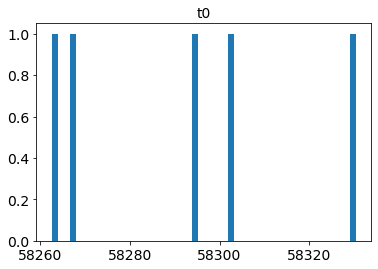

rango t0_err : 2.235484862467274e-05, 0.10478731721377699
promedio t0_err : 0.06080210542786517
desviación estándar t0_err : 0.035024595831439576
mediana t0_err : 0.07344998266853509


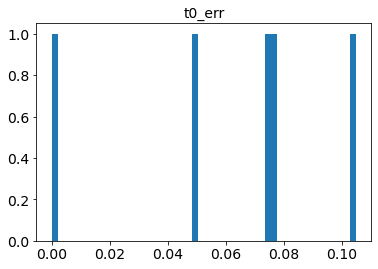

rango x0 : 0.0007350841832056049, 0.011187049600985767
promedio x0 : 0.0038386540044421068
desviación estándar x0 : 0.0038333851479981722
mediana x0 : 0.002780151235852571


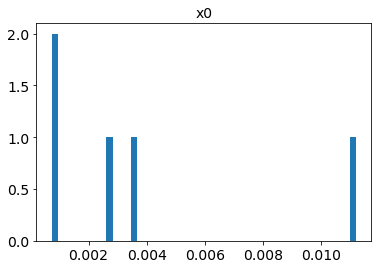

rango x0_err : 6.191830910562833e-06, 7.647661529163201e-05
promedio x0_err : 3.924749417580694e-05
desviación estándar x0_err : 2.5972606737315478e-05
mediana x0_err : 4.0478146594851866e-05


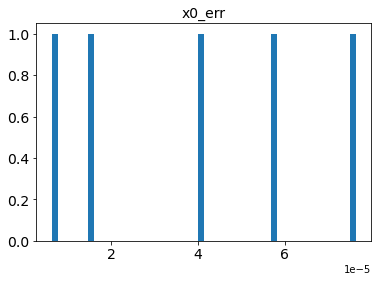

rango x1 : 0.627848977460558, 2.168472243750104
promedio x1 : 1.2612835483400857
desviación estándar x1 : 0.5016225365646173
mediana x1 : 1.192709647069207


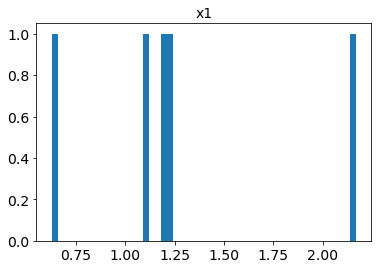

rango x1_err : 0.050147521109325854, 0.18462799808963126
promedio x1_err : 0.10248212803913362
desviación estándar x1_err : 0.04829323494619431
mediana x1_err : 0.08829684239400537


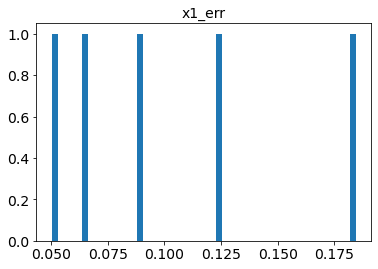

rango c : -0.04232879183522986, 0.39992542299987655
promedio c : 0.08667751967145987
desviación estándar c : 0.17032728092457722
mediana c : -0.01921101655369223


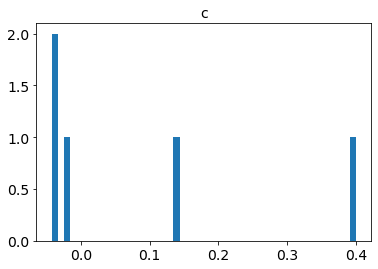

rango c_err : 0.00016156469826961173, 0.024854967633937408
promedio c_err : 0.013042638354175162
desviación estándar c_err : 0.00961539921417438
mediana c_err : 0.008793663720527256


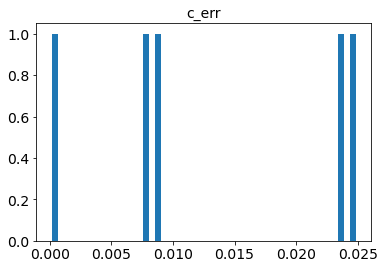

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


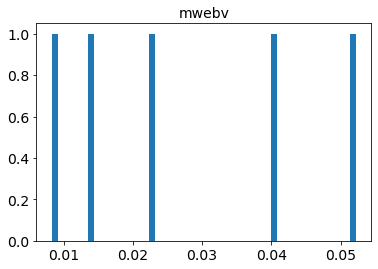

In [170]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 206, 236
promedio ncall : 221.66666666666666
desviación estándar ncall : 12.283683848458853
mediana ncall : 223.0


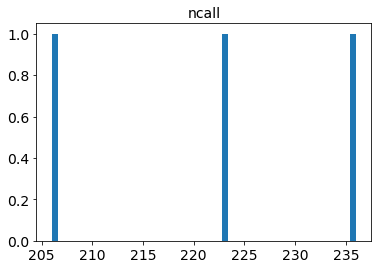

rango chisq : 1.0611599256899187, 21137.799247589563
promedio chisq : 7088.662510131362
desviación estándar chisq : 9934.373171220619
mediana chisq : 127.12712287883619


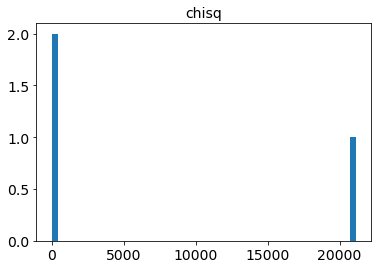

rango ndof : 3, 70
promedio ndof : 41.333333333333336
desviación estándar ndof : 28.193773938387334
mediana ndof : 51.0


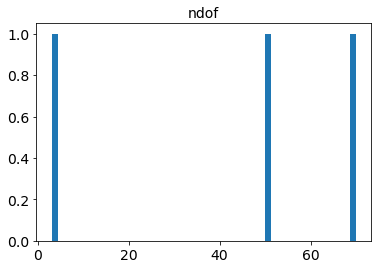

rango chisq/ndof : 0.3537199752299729, 301.9685606798509
promedio chisq/ndof : 101.60498977965987
desviación estándar chisq/ndof : 141.6811307236337
mediana chisq/ndof : 2.492688683898749


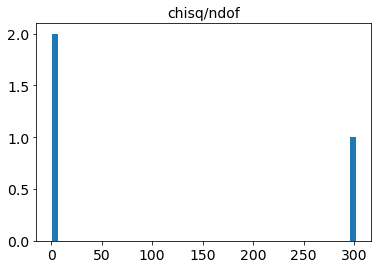

rango z : 0.027200765110386962, 0.16085974455936763
promedio z : 0.0815603232748688
desviación estándar z : 0.057345027544793266
mediana z : 0.05662046015485181


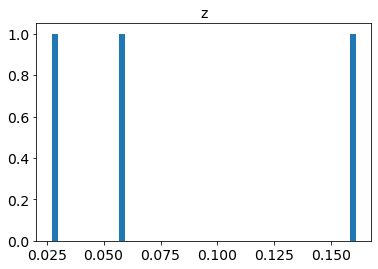

rango z_err : 0.0009563773331185341, 0.054248778389013416
promedio z_err : 0.026651203726150985
desviación estándar z_err : 0.02179809381282902
mediana z_err : 0.024748455456321008


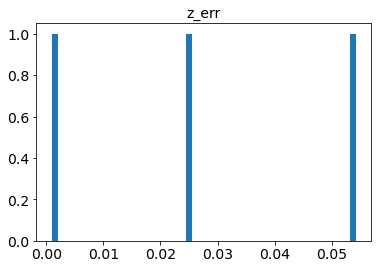

rango t0 : 58265.45273206285, 58363.71296323248
promedio t0 : 58309.912495688004
desviación estándar t0 : 40.65468254833406
mediana t0 : 58300.57179176868


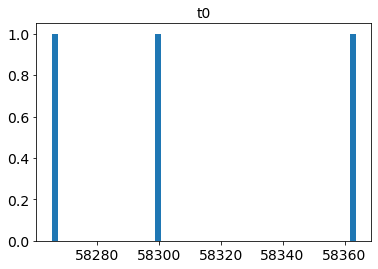

rango t0_err : 0.020406735529832076, 1.034468602956622
promedio t0_err : 0.41464347785828676
desviación estándar t0_err : 0.4436574929476
mediana t0_err : 0.18905509508840623


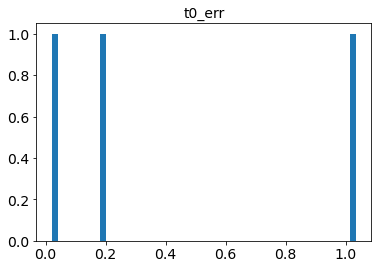

rango x0 : 0.00025182163867951655, 0.008417157347659217
promedio x0 : 0.003197958758657754
desviación estándar x0 : 0.0037007461537328997
mediana x0 : 0.0009248972896345292


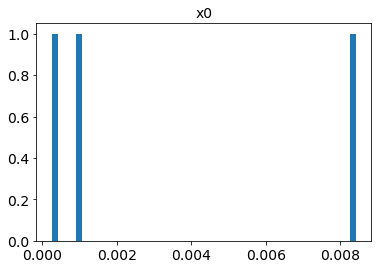

rango x0_err : 1.9927840137773113e-05, 4.263371751954413e-05
promedio x0_err : 2.7511358880162934e-05
desviación estándar x0_err : 1.0693137898152467e-05
mediana x0_err : 1.997251898317156e-05


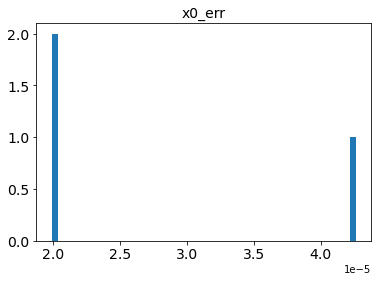

rango x1 : -2.146611790812108, 0.8872123896592248
promedio x1 : -0.35720882263106474
desviación estándar x1 : 1.297118890771252
mediana x1 : 0.1877729332596889


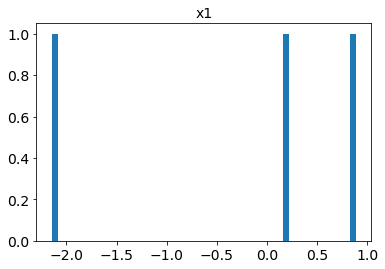

rango x1_err : 0.018310802068357113, 2.014432653937914
promedio x1_err : 0.7315376719988015
desviación estándar x1_err : 0.9090349939202661
mediana x1_err : 0.16186955999013364


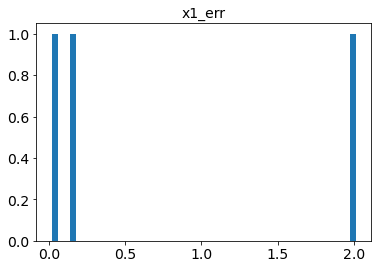

rango c : 0.028845603211245685, 0.12195905788877526
promedio c : 0.06048540743980726
desviación estándar c : 0.04347468723846274
mediana c : 0.030651561219400825


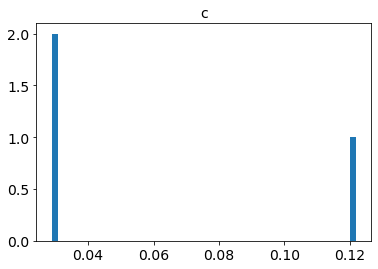

rango c_err : 0.0022168280375348126, 0.15501513907137762
promedio c_err : 0.06440049586181167
desviación estándar c_err : 0.06553915488580309
mediana c_err : 0.03596952047652255


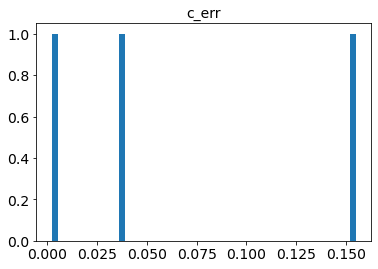

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


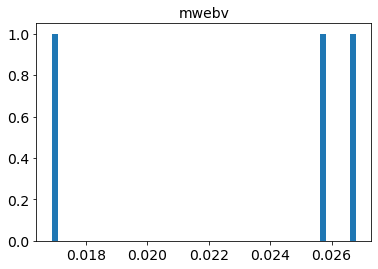

In [171]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [172]:
estadisticas_SALT2_z_bounded = estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT2 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [173]:
lista_oid_SALT2_z_bounded = list(estadisticas_SALT2_z_bounded['oid'])
lista_chisq_vs_ndof_SALT2_z_bounded = list(estadisticas_SALT2_z_bounded['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [174]:
median_chisq_vs_ndof_SALT2_z_bounded = np.median(np.array(estadisticas_SALT2_z_bounded['chisq/ndof']))
df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana = estadisticas_SALT2_z_bounded[estadisticas_SALT2_z_bounded['chisq/ndof'] > median_chisq_vs_ndof_SALT2_z_bounded].reset_index()
lista_oid_SALT2_z_bounded_sobre_mediana = list(df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [175]:
display(df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana[['oid', 
                                                        'chisq/ndof', 
                                                        'z', 
                                                        'z_err', 
                                                        't0', 
                                                        't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
0,ZTF18abpaywm,1.507910,9.667435e-02,1.412859e-01,58368.265877,1.026511e+02
1,ZTF18abdbuty,1.635361,1.045593e-01,1.604610e-02,58308.315705,1.617450e-01
2,ZTF18abclalx,1.650098,1.756881e-02,1.638991e-02,58300.363622,3.662155e-01
3,ZTF18abdkimx,1.669320,7.622732e-02,1.867455e-02,58313.830874,1.441406e-01
4,ZTF18aaxwjmp,1.680652,5.301183e-02,1.204099e-02,58288.218599,1.291181e-01
5,ZTF18abjvhec,1.691556,1.501537e-01,1.253378e-02,58340.953026,1.100675e-01
6,ZTF18abtnlik,1.721071,8.695092e-02,4.823907e-02,58379.073481,2.399219e-01
7,ZTF18abealop,1.861882,3.247451e-09,1.296470e-02,58315.374825,1.981789e-01
8,ZTF18aaxrvzj,1.920324,1.178836e-01,1.549046e-02,58286.183747,2.009828e-01
9,ZTF18aaxqyki,2.099740,1.067138e-01,3.032694e-02,58286.563808,4.058047e-01


Se observa que los valores de $\frac{\chi^{2}}{ndof}$ son muy altos, y que estos tenían que ver principalmente con hay observaciones que están fuera del rango de tiempo del modelo

### Ajuste con observaciones en el rango de tiempo del modelo (determinado con $t_0$ y $z$ del primer ajuste)

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el primer ajuste con el modelo SALT2 y límites para $z$

In [176]:
detect_early_SNIa_SALT2_z_bounded_cortes_t = cortes_t_modelo(trest_min_modelo, 
                                                             trest_max_modelo, 
                                                             detect_early_SNIa_sin_SN50,
                                                             estadisticas_SALT2_z_bounded)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo

In [177]:
ajustes_SALT2_early_SNIa_z_bounded_cortes_t = modelo_ajustado_y_resultados('salt2', 
                                                                           df_meta_early_SNIa_sin_SN50, 
                                                                           detect_early_SNIa_SALT2_z_bounded_cortes_t, 
                                                                           version='2.4',
                                                                           z_bounds=z_bounds,
                                                                           print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 136, 580
promedio ncall : 237.17333333333335
desviación estándar ncall : 95.49874321453426
mediana ncall : 198.0


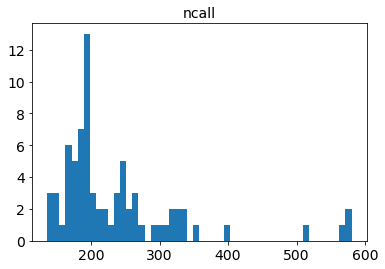

rango chisq : 4.702328651245915, 1322.9854033194588
promedio chisq : 76.74271365374318
desviación estándar chisq : 188.83930424514463
mediana chisq : 25.203781690014505


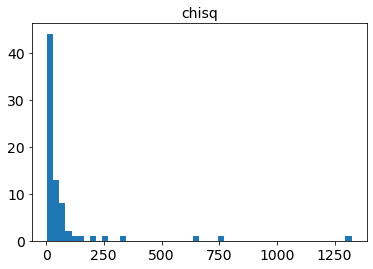

rango ndof : 5, 61
promedio ndof : 19.946666666666665
desviación estándar ndof : 11.401629513168526
mediana ndof : 17.0


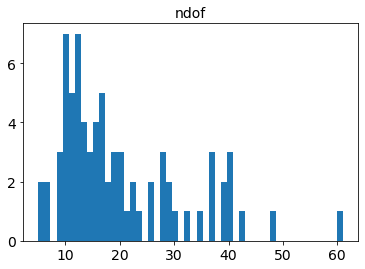

rango chisq/ndof : 0.4076105374717105, 35.75636225187726
promedio chisq/ndof : 3.1906967439496325
desviación estándar chisq/ndof : 5.573037914217688
mediana chisq/ndof : 1.3384150418673193


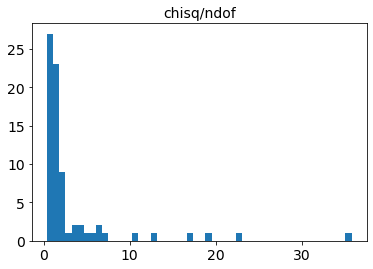

rango z : 3.2474510636149035e-09, 0.1999997551004081
promedio z : 0.0779570359458437
desviación estándar z : 0.04478146995724905
mediana z : 0.07622731534515051


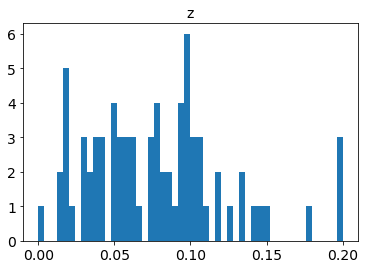

rango z_err : 1.2836442360442124e-09, 0.17104537277360138
promedio z_err : 0.024159372637278895
desviación estándar z_err : 0.035286242120919534
mediana z_err : 0.013983883654916698


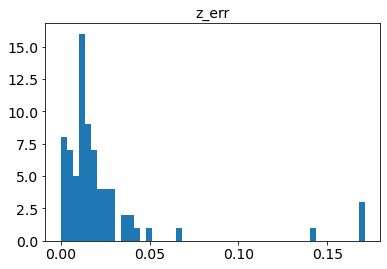

rango t0 : 58254.639819063304, 58394.951637928374
promedio t0 : 58322.13039739728
desviación estándar t0 : 38.918882848342015
mediana t0 : 58315.374825186154


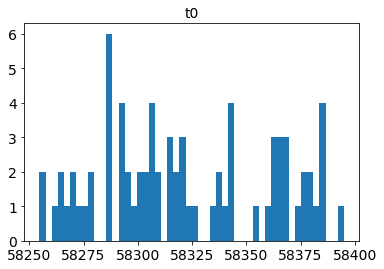

rango t0_err : 3.735112841241062e-08, 102.65107414352678
promedio t0_err : 1.601459747566211
desviación estándar t0_err : 11.748526487696786
mediana t0_err : 0.20800338932895102


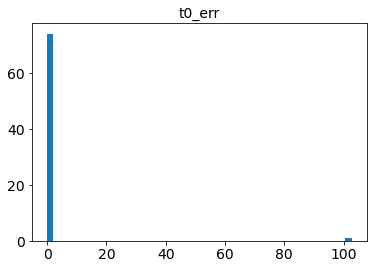

rango x0 : 0.00023151334994536514, 0.005637649382586501
promedio x0 : 0.0010674592294356217
desviación estándar x0 : 0.0010837806035163026
mediana x0 : 0.0006846928466585554


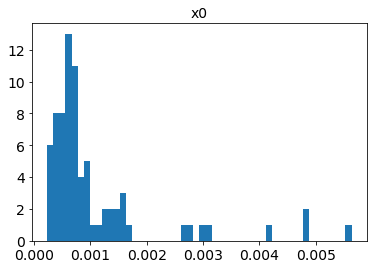

rango x0_err : 5.13260252254012e-06, 1.0000010000317845
promedio x0_err : 0.013350264972594053
desviación estándar x0_err : 0.1146958188488299
mediana x0_err : 1.2594420708545927e-05


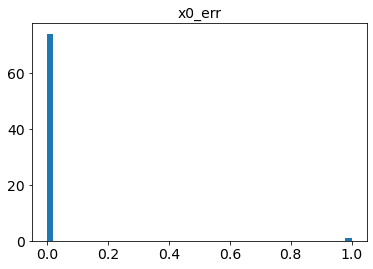

rango x1 : -2.252014411413962, 2.6923321335276116
promedio x1 : -0.01621975364777737
desviación estándar x1 : 1.1142191696021195
mediana x1 : 0.222910449630926


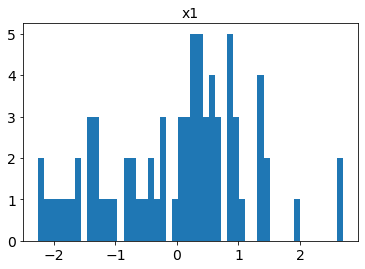

rango x1_err : 0.030161115713498887, 5.762989156459191
promedio x1_err : 0.3227309953647689
desviación estándar x1_err : 0.6663098738978872
mediana x1_err : 0.1869209233008431


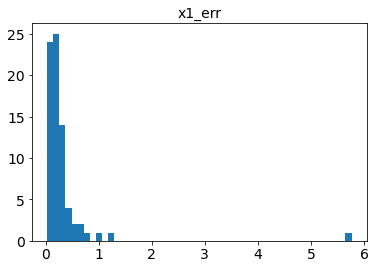

rango c : -0.17713845007615392, 0.3204867101692068
promedio c : -5.059110130732384e-05
desviación estándar c : 0.10710096778626657
mediana c : -0.002932265136147194


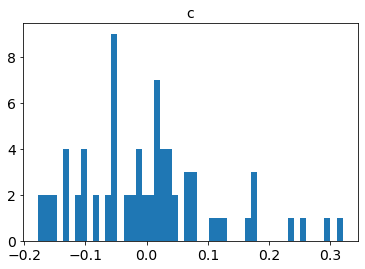

rango c_err : 0.004181800449436723, 0.5887588462221147
promedio c_err : 0.039556431791003
desviación estándar c_err : 0.06650763585054448
mediana c_err : 0.03050325009412555


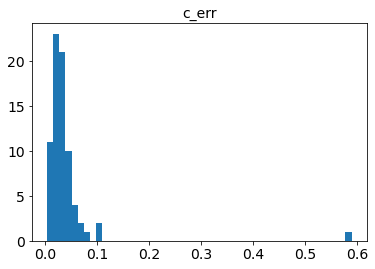

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03053426497386698
desviación estándar mwebv : 0.021538819171362078
mediana mwebv : 0.023404313345236558


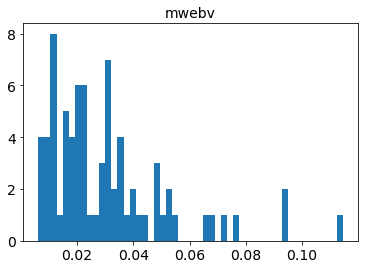

In [178]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded_cortes_t, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 171, 750
promedio ncall : 309.8
desviación estándar ncall : 221.89853537146206
mediana ncall : 190.0


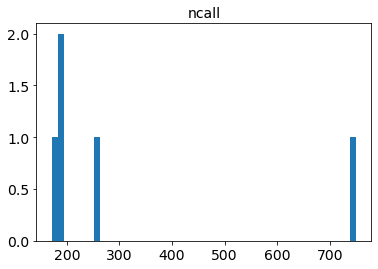

rango chisq : 66.89055403166445, 919.6255723697451
promedio chisq : 268.80131753723373
desviación estándar chisq : 327.23863128757085
mediana chisq : 132.47394510204526


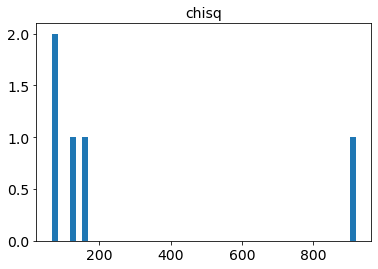

rango ndof : 15, 59
promedio ndof : 30.6
desviación estándar ndof : 15.357083056361974
mediana ndof : 25.0


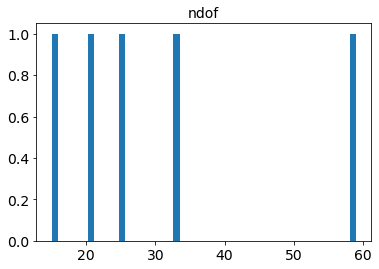

rango chisq/ndof : 3.1852644776983072, 15.586874107961782
promedio chisq/ndof : 6.729784528533986
desviación estándar chisq/ndof : 4.537942787046579
mediana chisq/ndof : 4.654403592280115


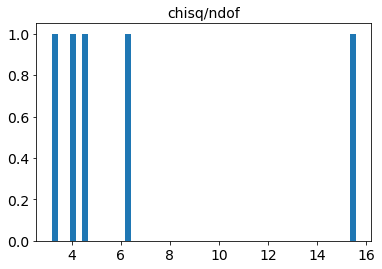

rango z : 0.01988334244082245, 0.08940449264146268
promedio z : 0.058816298724934865
desviación estándar z : 0.028475875530742573
mediana z : 0.07619708487137405


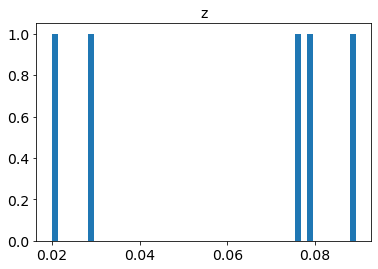

rango z_err : 2.7807351884248654e-06, 0.010037171217256967
promedio z_err : 0.005252511558681168
desviación estándar z_err : 0.0040151206101316375
mediana z_err : 0.00460552826999161


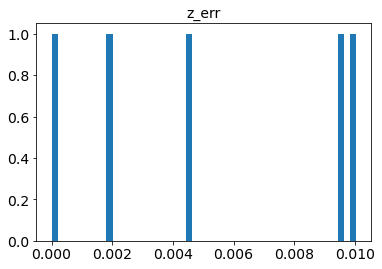

rango t0 : 58262.563743556435, 58329.75514198283
promedio t0 : 58291.17193601197
desviación estándar t0 : 24.539279347090314
mediana t0 : 58294.420618094686


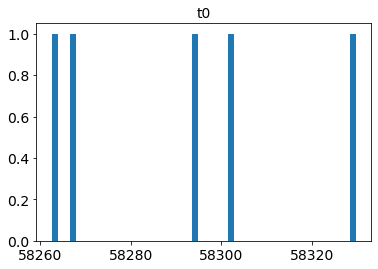

rango t0_err : 0.05103144122767844, 0.10464245771072456
promedio t0_err : 0.07103224321108428
desviación estándar t0_err : 0.01966402122518474
mediana t0_err : 0.0720942819789343


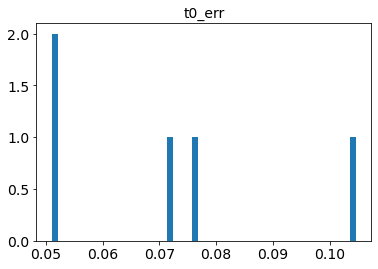

rango x0 : 0.0007350841832056049, 0.011187092675766126
promedio x0 : 0.003818561992703507
desviación estándar x0 : 0.003839145328701176
mediana x0 : 0.0026799242540041833


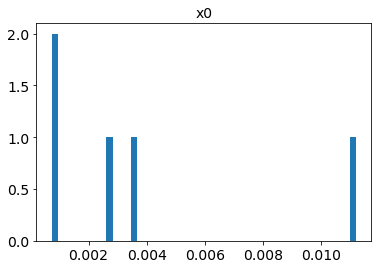

rango x0_err : 6.191830910562833e-06, 7.735160295950833e-05
promedio x0_err : 3.1059416530735795e-05
desviación estándar x0_err : 2.5634787450203563e-05
mediana x0_err : 1.652689579665831e-05


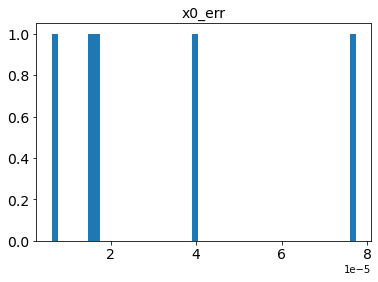

rango x1 : 0.628441649679429, 2.168473641867246
promedio x1 : 1.2543379915193664
desviación estándar x1 : 0.502219799713305
mediana x1 : 1.1872076224501953


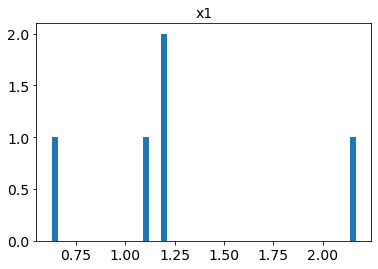

rango x1_err : 0.05084524655497802, 0.18428341886109578
promedio x1_err : 0.10210573593955638
desviación estándar x1_err : 0.04822870133173126
mediana x1_err : 0.08673310836032089


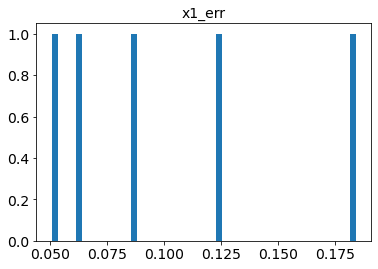

rango c : -0.04232879183522986, 0.39999999996292623
promedio c : 0.08667969086473513
desviación estándar c : 0.17036283824266577
mediana c : -0.019271666987265956


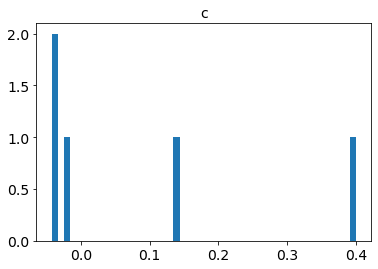

rango c_err : 0.0009453064944764944, 0.024796188416744414
promedio c_err : 0.013184596882812316
desviación estándar c_err : 0.009397465380511222
mediana c_err : 0.00887912167987201


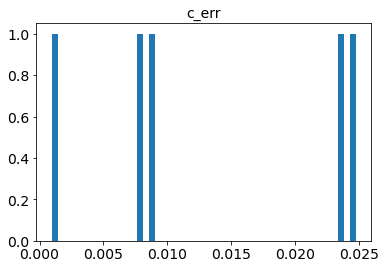

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


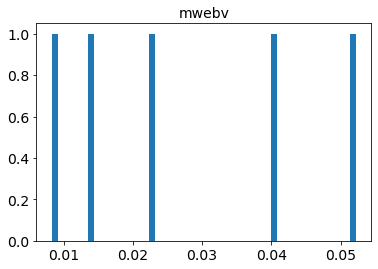

In [179]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded_cortes_t, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 205, 236
promedio ncall : 220.66666666666666
desviación estándar ncall : 12.657891697365017
mediana ncall : 221.0


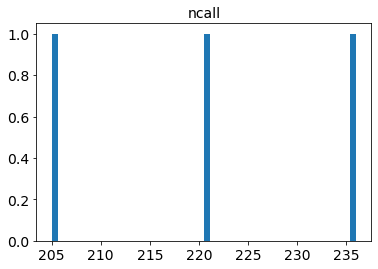

rango chisq : 1.0611599256899187, 472.0187307648083
promedio chisq : 171.69104309415377
desviación estándar chisq : 213.02018488426106
mediana chisq : 41.993238591963106


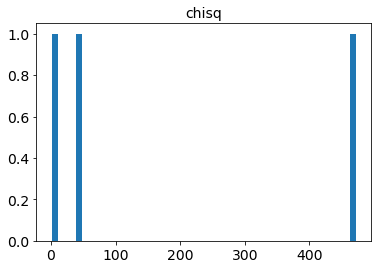

rango ndof : 3, 47
promedio ndof : 26.0
desviación estándar ndof : 18.01850900231944
mediana ndof : 28.0


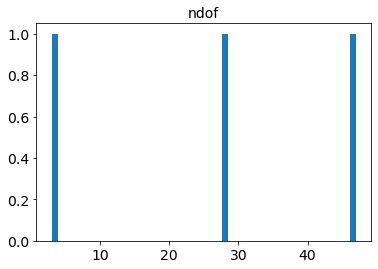

rango chisq/ndof : 0.3537199752299729, 16.857811813028867
promedio chisq/ndof : 6.035001649929989
desviación estándar chisq/ndof : 7.656054172805024
mediana chisq/ndof : 0.8934731615311299


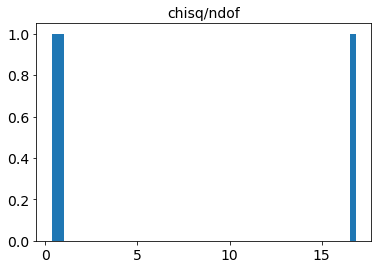

rango z : 0.02720953705695436, 0.16085974455936763
promedio z : 0.08161945041025688
desviación estándar z : 0.0573178584689982
mediana z : 0.05678906961444863


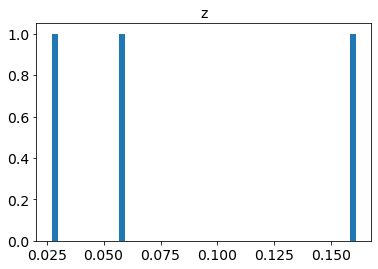

rango z_err : 0.0009558566141985077, 0.054248778389013416
promedio z_err : 0.02599201613341524
desviación estándar z_err : 0.02187560420976338
mediana z_err : 0.022771413397033785


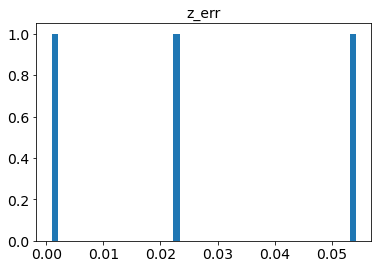

rango t0 : 58265.4529358182, 58363.71296323248
promedio t0 : 58309.91298456438
desviación estándar t0 : 40.65451155836277
mediana t0 : 58300.57305464247


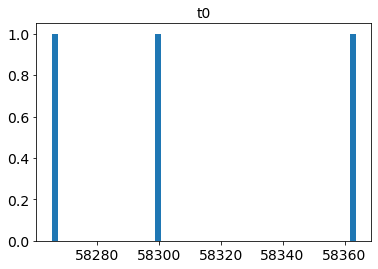

rango t0_err : 0.020390806857903954, 1.034468602956622
promedio t0_err : 0.4102950772564024
desviación estándar t0_err : 0.4459073200564032
mediana t0_err : 0.1760258219546813


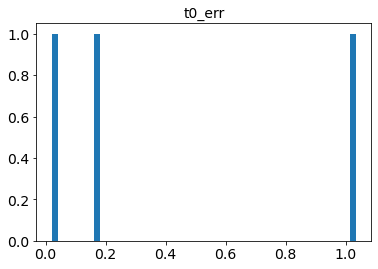

rango x0 : 0.00025182163867951655, 0.008416976798234213
promedio x0 : 0.003197853963637054
desviación estándar x0 : 0.003700688678580511
mediana x0 : 0.0009247634539974323


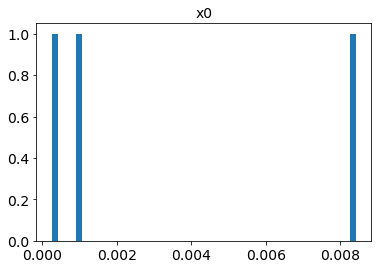

rango x0_err : 1.882400605640273e-05, 4.263371751954413e-05
promedio x0_err : 2.713573469608253e-05
desviación estándar x0_err : 1.09683568166173e-05
mediana x0_err : 1.9949480512300737e-05


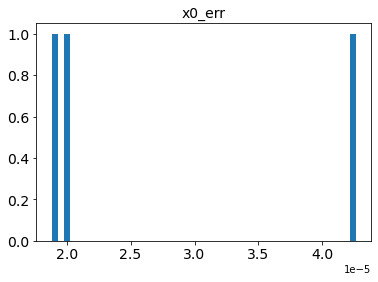

rango x1 : -2.146611790812108, 0.8873755462743231
promedio x1 : -0.3573645951568201
desviación estándar x1 : 1.2970828139778623
mediana x1 : 0.1871424590673243


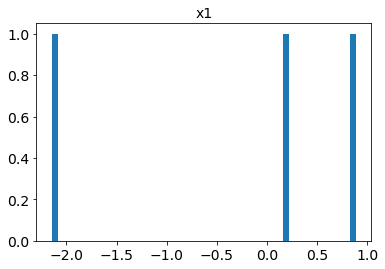

rango x1_err : 0.018296332981925012, 2.014432653937914
promedio x1_err : 0.7297384248431822
desviación estándar x1_err : 0.9101661249801185
mediana x1_err : 0.15648628760970773


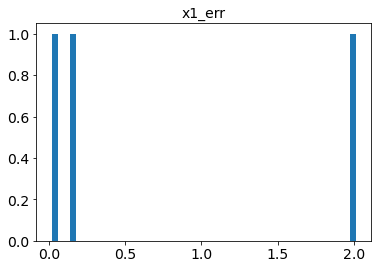

rango c : 0.028845603211245685, 0.12195540877491773
promedio c : 0.06041499380992382
desviación estándar c : 0.04352053690845984
mediana c : 0.030443969443608054


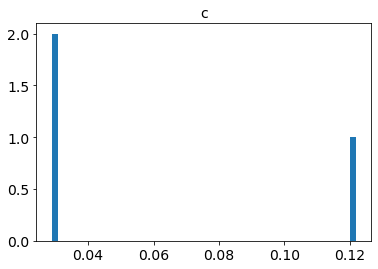

rango c_err : 0.0022168725819510238, 0.15501513907137762
promedio c_err : 0.06357362236176387
desviación estándar c_err : 0.06590724523378184
mediana c_err : 0.03348885543196295


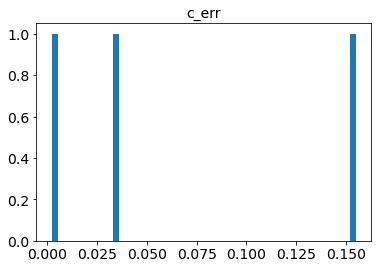

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


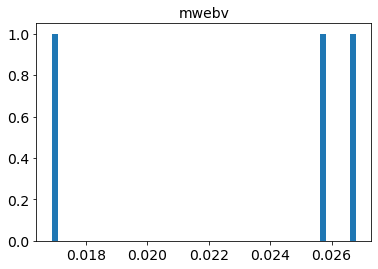

In [180]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded_cortes_t, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [181]:
estadisticas_SALT2_z_bounded_cortes_t = estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded_cortes_t).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT2 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [182]:
lista_oid_SALT2_z_bounded_cortes_t = list(estadisticas_SALT2_z_bounded_cortes_t['oid'])
lista_chisq_vs_ndof_SALT2_z_bounded_cortes_t = list(estadisticas_SALT2_z_bounded_cortes_t['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [183]:
median_chisq_vs_ndof_SALT2_z_bounded_cortes_t = np.median(np.array(estadisticas_SALT2_z_bounded_cortes_t['chisq/ndof']))
df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_t = estadisticas_SALT2_z_bounded_cortes_t[estadisticas_SALT2_z_bounded_cortes_t['chisq/ndof'] > median_chisq_vs_ndof_SALT2_z_bounded_cortes_t].reset_index()
lista_oid_SALT2_z_bounded_sobre_mediana_cortes_t = list(df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_t['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [184]:
display(df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_t[['oid', 
                                                                 'chisq/ndof', 
                                                                 'z', 
                                                                 'z_err', 
                                                                 't0', 
                                                                 't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
0,ZTF18aaumlfl,1.441130,1.830432e-02,1.116389e-02,58265.035894,2.741170e-01
1,ZTF18abimsyv,1.464449,8.639310e-02,9.286663e-03,58334.425352,1.540282e-01
2,ZTF18abckujg,1.470136,3.203560e-02,1.029074e-02,58302.909650,2.332035e-01
3,ZTF18abpaywm,1.507910,9.667435e-02,1.412859e-01,58368.265877,1.026511e+02
4,ZTF18abdbuty,1.635361,1.045593e-01,1.604610e-02,58308.315705,1.617450e-01
5,ZTF18abclalx,1.650098,1.756881e-02,1.638991e-02,58300.363622,3.662155e-01
6,ZTF18abdkimx,1.669320,7.622732e-02,1.867455e-02,58313.830874,1.441406e-01
7,ZTF18aaxwjmp,1.680652,5.301183e-02,1.204099e-02,58288.218599,1.291181e-01
8,ZTF18abjvhec,1.691556,1.501537e-01,1.253378e-02,58340.953026,1.100675e-01
9,ZTF18abtnlik,1.721071,8.695092e-02,4.823907e-02,58379.073481,2.399219e-01


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT2 y $z$ variable antes y después de eliminar los puntos fuera del rango de tiempo del modelo

In [185]:
inter_oid_SALT2_z_bounded_sobre_mediana_cortes_t = np.intersect1d(np.array(lista_oid_SALT2_z_var_sobre_mediana),
                                                                  np.array(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_t))
print('Elementos comunes sobre la mediana de chisq/ndof : ',
      len(inter_oid_SALT2_z_bounded_sobre_mediana_cortes_t))

Elementos comunes sobre la mediana de chisq/ndof :  34


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [186]:
table_early_SNIa_SALT2_z_bounded_cortes_t = astropy_table_detections(df_meta_early_SNIa_sin_SN50, 
                                                                     detect_early_SNIa_SALT2_z_bounded_cortes_t)

Algunos gráficos interesantes de ajustes con $\frac{\chi^2}{ndof}$ mayor a la mediana

 ==== Con ajuste del redshift ====
chisq/ndof :  2.288682576553392


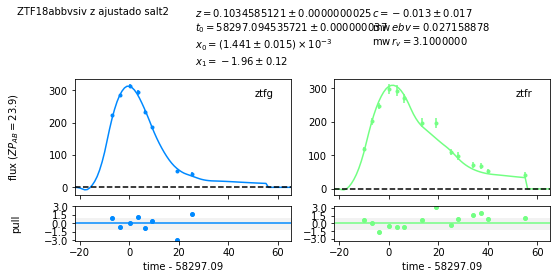

In [187]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_t[14], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_bounded_cortes_t, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_t['chisq/ndof'][14])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.500900895061325


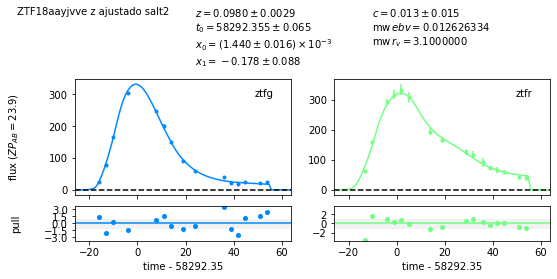

In [188]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_t[18], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_bounded_cortes_t, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_t['chisq/ndof'][18])

 ==== Con ajuste del redshift ====
chisq/ndof :  4.290493432303422


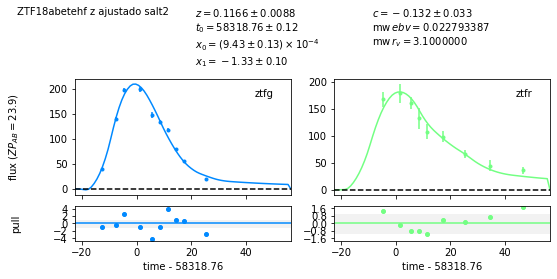

In [189]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_t[25], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_bounded_cortes_t, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_t['chisq/ndof'][25])

 ==== Con ajuste del redshift ====
chisq/ndof :  5.718753898085726


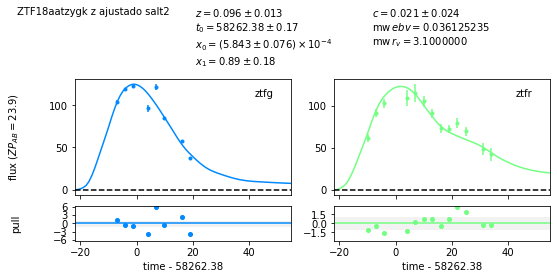

In [190]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_t[28], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_bounded_cortes_t, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_t['chisq/ndof'][28])

 ==== Con ajuste del redshift ====
chisq/ndof :  6.208018491940477


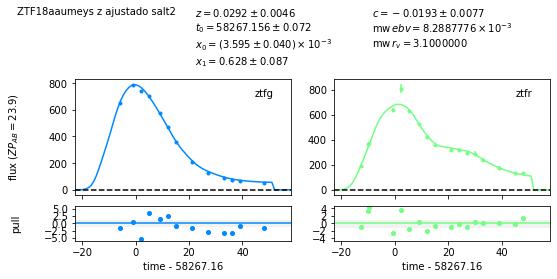

In [191]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_t[30], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_bounded_cortes_t, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_t['chisq/ndof'][30])

 ==== Con ajuste del redshift ====
chisq/ndof :  35.75636225187726


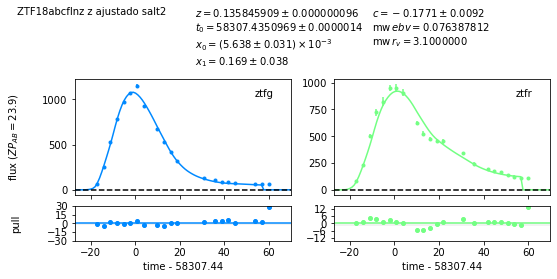

In [192]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_t[40], 'salt2', df_meta_early_SNIa, 
       table_early_SNIa_SALT2_z_bounded_cortes_t, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_t['chisq/ndof'][40])

En general los ajustes se ven bien y se parecen al caso en que se utiliza el redshift real de las SN.

Se ve que hay puntos que quedaron fuera del rango de tiempo del modelo, lo que aumenta el valor de $\frac{\chi^2}{ndof}$.

### Ajuste con observaciones en el rango de tiempo del modelo como si estuviese en el sistema de referencia en reposo (determinado con $t_0$ del primer ajuste)

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo asumiendo que está en el sistema de referencia en reposo $z=0$, con el valor de $t_0$ del primer ajuste con el modelo SALT2 y límites para $z$

In [193]:
detect_early_SNIa_SALT2_z_bounded_cortes_trest = cortes_trest_modelo(trest_min_modelo, 
                                                                     trest_max_modelo, 
                                                                     detect_early_SNIa_sin_SN50,
                                                                     estadisticas_SALT2_z_bounded)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo 

In [194]:
ajustes_SALT2_early_SNIa_z_bounded_cortes_trest = modelo_ajustado_y_resultados('salt2', 
                                                                               df_meta_early_SNIa_sin_SN50, 
                                                                               detect_early_SNIa_SALT2_z_bounded_cortes_trest, 
                                                                               version='2.4',
                                                                               z_bounds=z_bounds,
                                                                               print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 136, 402
promedio ncall : 217.46666666666667
desviación estándar ncall : 56.951987576281205
mediana ncall : 195.0


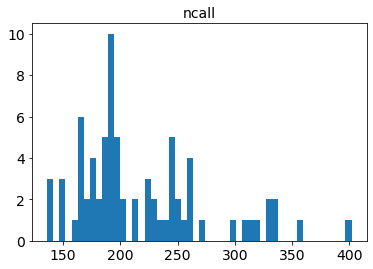

rango chisq : 4.702328651245915, 758.7481051326613
promedio chisq : 52.50273585750227
desviación estándar chisq : 98.83711079475657
mediana chisq : 25.203781690014505


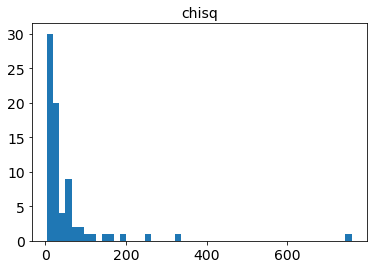

rango ndof : 5, 57
promedio ndof : 19.6
desviación estándar ndof : 10.95931871361841
mediana ndof : 16.0


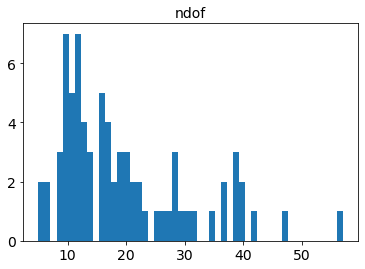

rango chisq/ndof : 0.4076105374717105, 19.35228616992267
promedio chisq/ndof : 2.5239660191146496
desviación estándar chisq/ndof : 3.41941194535117
mediana chisq/ndof : 1.3187100447594513


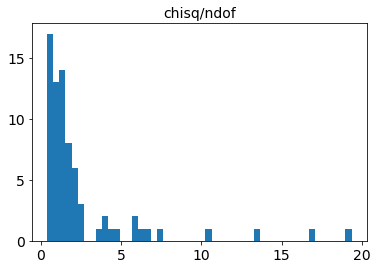

rango z : 3.2474510636149035e-09, 0.1999997551004081
promedio z : 0.0747107506971616
desviación estándar z : 0.04497094895981197
mediana z : 0.07208711497532391


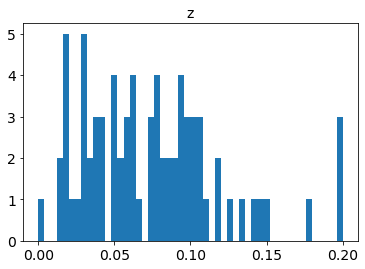

rango z_err : 0.002139650868782232, 0.17104537277360138
promedio z_err : 0.022850656674428052
desviación estándar z_err : 0.03233809084699507
mediana z_err : 0.013983883654916698


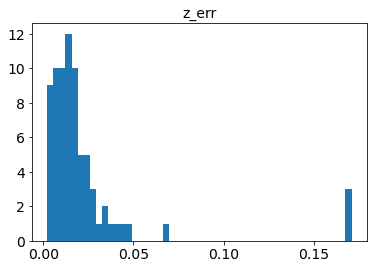

rango t0 : 58254.639819063304, 58394.951637928374
promedio t0 : 58322.106049223854
desviación estándar t0 : 38.925288508375814
mediana t0 : 58315.374825186154


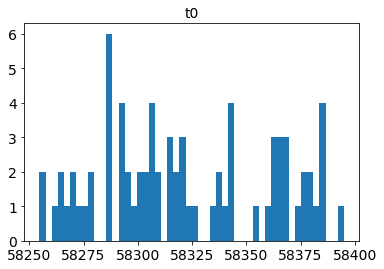

rango t0_err : 0.03357938542467309, 1.3065994698335999
promedio t0_err : 0.24048101309686898
desviación estándar t0_err : 0.19738802033475455
mediana t0_err : 0.20646066738845548


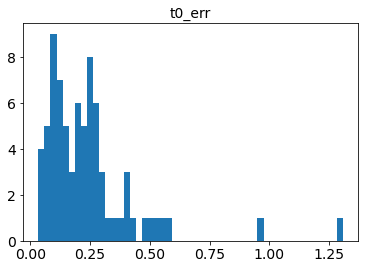

rango x0 : 0.00023151334994536514, 0.006305132462519419
promedio x0 : 0.0010789930309566284
desviación estándar x0 : 0.0011290748719277625
mediana x0 : 0.0006846928466585554


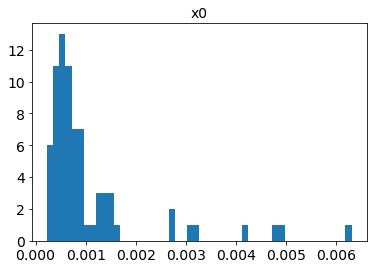

rango x0_err : 5.13260252254012e-06, 7.213701910771403e-05
promedio x0_err : 1.7741204268832994e-05
desviación estándar x0_err : 1.29215079038478e-05
mediana x0_err : 1.2594420708545927e-05


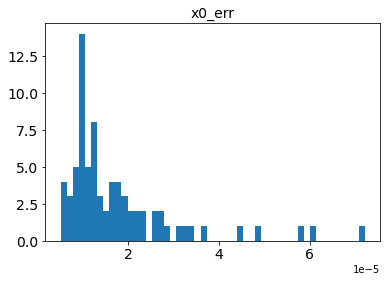

rango x1 : -2.252014411413962, 2.6923321335276116
promedio x1 : -0.0037982866842749983
desviación estándar x1 : 1.105126081224109
mediana x1 : 0.222910449630926


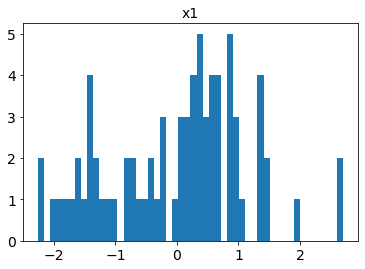

rango x1_err : 0.03088027456133524, 1.2139850684378786
promedio x1_err : 0.24800501609037207
desviación estándar x1_err : 0.20986044670675735
mediana x1_err : 0.18431505549658755


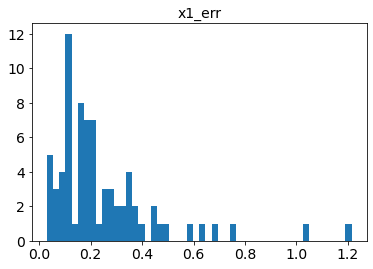

rango c : -0.16898515441970466, 0.3204867101692068
promedio c : 0.0037455686086980164
desviación estándar c : 0.10641544079542482
mediana c : 0.005873318451607823


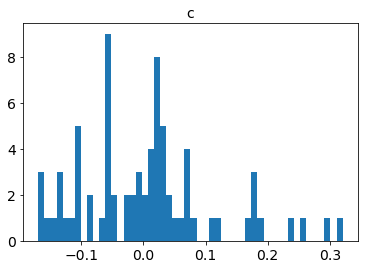

rango c_err : 0.004533836174429151, 0.10258891881793596
promedio c_err : 0.032137509518486145
desviación estándar c_err : 0.01853400321677326
mediana c_err : 0.029547897822770064


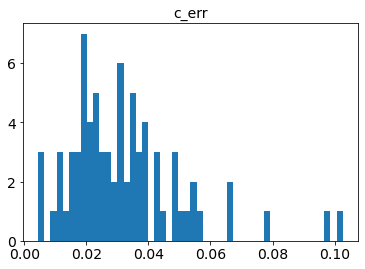

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03053426497386698
desviación estándar mwebv : 0.021538819171362078
mediana mwebv : 0.023404313345236558


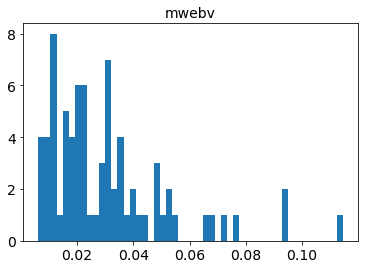

In [195]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded_cortes_trest, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 171, 324
promedio ncall : 225.0
desviación estándar ncall : 57.344572541784636
mediana ncall : 190.0


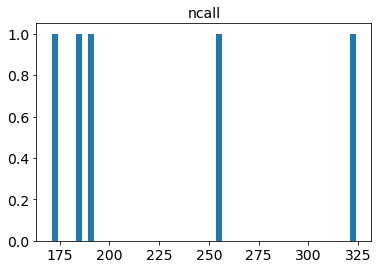

rango chisq : 66.89055403166445, 251.55331110705367
promedio chisq : 134.92781665082688
desviación estándar chisq : 67.66853439401773
mediana chisq : 131.1787019327026


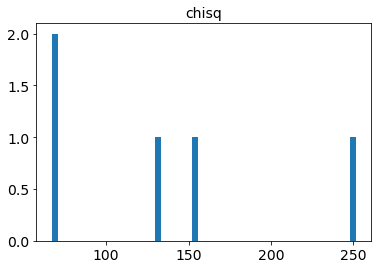

rango ndof : 15, 52
promedio ndof : 28.8
desviación estándar ndof : 12.718490476467716
mediana ndof : 25.0


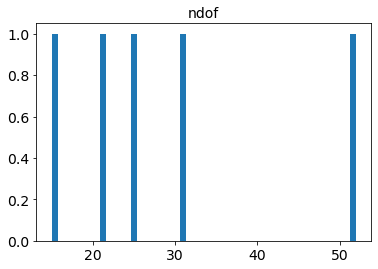

rango chisq/ndof : 3.1852644776983072, 6.208018491940477
promedio chisq/ndof : 4.6233642534283454
desviación estándar chisq/ndof : 0.977712307712387
mediana chisq/ndof : 4.654403592280115


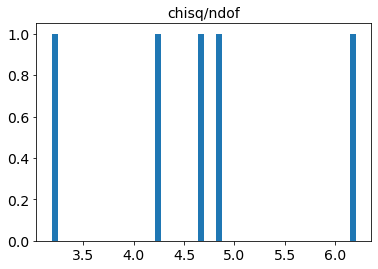

rango z : 0.019183244376742806, 0.09017189104822021
promedio z : 0.058829758793470445
desviación estándar z : 0.02883371639299933
mediana z : 0.07619708487137405


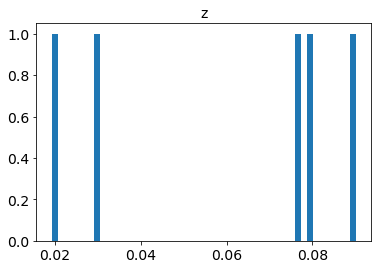

rango z_err : 0.002053331370231814, 0.010037171217256967
promedio z_err : 0.005844511983952976
desviación estándar z_err : 0.0033593786240835033
mediana z_err : 0.00460552826999161


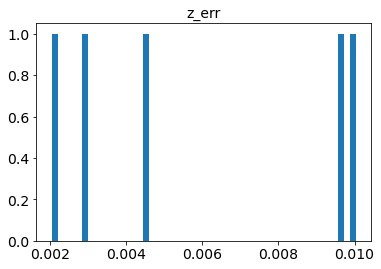

rango t0 : 58262.563743556435, 58329.757938569346
promedio t0 : 58291.169417773854
desviación estándar t0 : 24.538806140106185
mediana t0 : 58294.420618094686


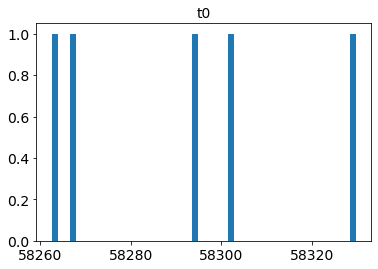

rango t0_err : 0.05280168424724252, 0.10464245771072456
promedio t0_err : 0.07252565350863734
desviación estándar t0_err : 0.018248570269152314
mediana t0_err : 0.0720942819789343


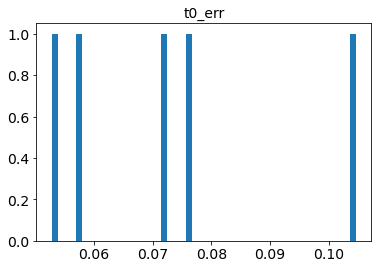

rango x0 : 0.0007350841832056049, 0.011206408124483697
promedio x0 : 0.003822672875878449
desviación estándar x0 : 0.0038464868616122304
mediana x0 : 0.0026811632211613226


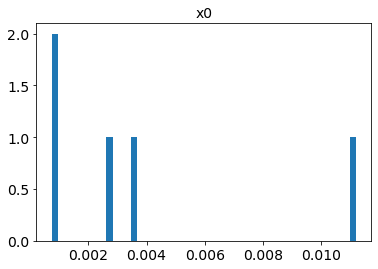

rango x0_err : 6.191830910562833e-06, 7.889477996464914e-05
promedio x0_err : 3.1463633472269506e-05
desviación estándar x0_err : 2.6139962281858836e-05
mediana x0_err : 1.7004803499186062e-05


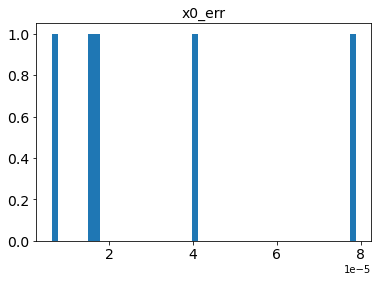

rango x1 : 0.628441649679429, 2.168473641867246
promedio x1 : 1.2507866175908782
desviación estándar x1 : 0.5026946284920659
mediana x1 : 1.1779534098104287


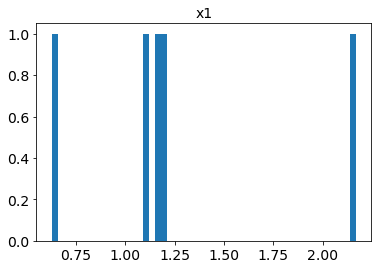

rango x1_err : 0.05108740391272848, 0.18428341886109578
promedio x1_err : 0.10222578278675636
desviación estándar x1_err : 0.048120127251261774
mediana x1_err : 0.08673310836032089


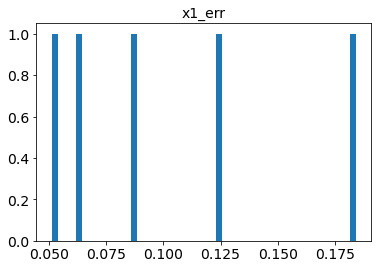

rango c : -0.04232879183522986, 0.3999999211183437
promedio c : 0.08682745113099918
desviación estándar c : 0.1702514378028
mediana c : -0.019271666987265956


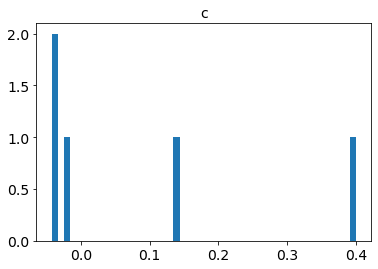

rango c_err : 0.000900294729842932, 0.024796188416744414
promedio c_err : 0.01319292365646887
desviación estándar c_err : 0.009401347643896066
mediana c_err : 0.008965767312788336


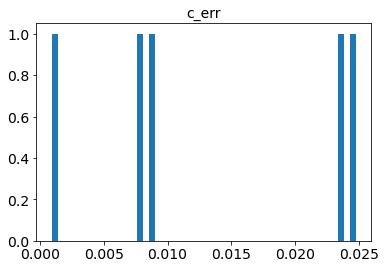

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


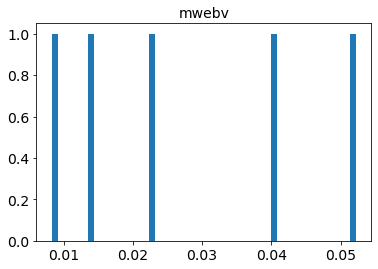

In [196]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded_cortes_trest, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 205, 236
promedio ncall : 220.66666666666666
desviación estándar ncall : 12.657891697365017
mediana ncall : 221.0


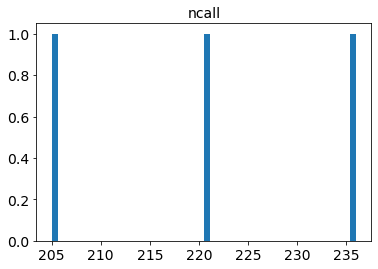

rango chisq : 1.0611599256899187, 471.96082068729993
promedio chisq : 171.6717397349843
desviación estándar chisq : 212.99296994717184
mediana chisq : 41.993238591963106


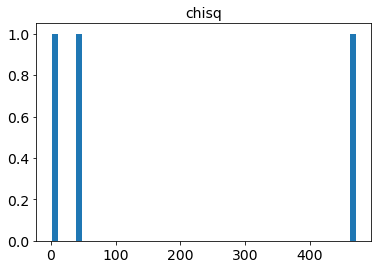

rango ndof : 3, 47
promedio ndof : 25.666666666666668
desviación estándar ndof : 17.98765008430939
mediana ndof : 27.0


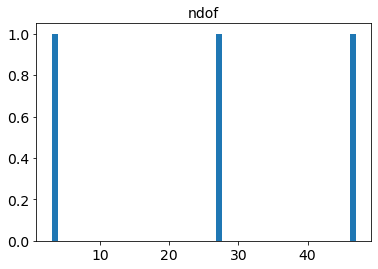

rango chisq/ndof : 0.3537199752299729, 17.480030395825924
promedio chisq/ndof : 6.242407844195675
desviación estándar chisq/ndof : 7.949253794548354
mediana chisq/ndof : 0.8934731615311299


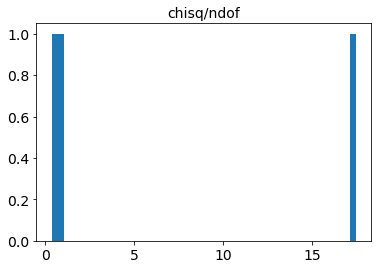

rango z : 0.02720104895079979, 0.16085974455936763
promedio z : 0.08161662104153868
desviación estándar z : 0.05732054437020261
mediana z : 0.05678906961444863


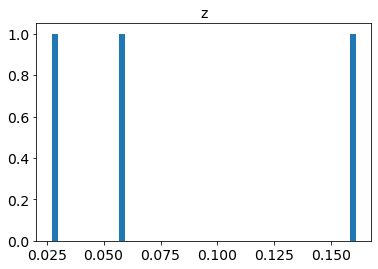

rango z_err : 0.0009552560855009273, 0.054248778389013416
promedio z_err : 0.02599181595718271
desviación estándar z_err : 0.021875833307797382
mediana z_err : 0.022771413397033785


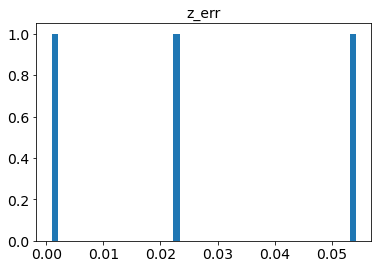

rango t0 : 58265.452731657024, 58363.71296323248
promedio t0 : 58309.91291651066
desviación estándar t0 : 40.65458598242179
mediana t0 : 58300.57305464247


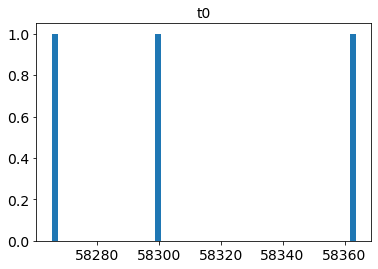

rango t0_err : 0.020384021983772982, 1.034468602956622
promedio t0_err : 0.41029281563169206
desviación estándar t0_err : 0.44590929764289366
mediana t0_err : 0.1760258219546813


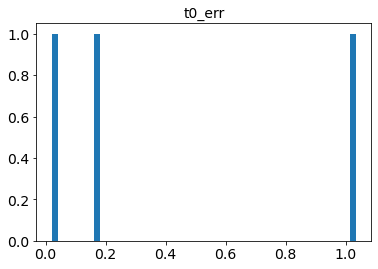

rango x0 : 0.00025182163867951655, 0.008417198942541894
promedio x0 : 0.003197928011739614
desviación estándar x0 : 0.0037007931094599276
mediana x0 : 0.0009247634539974323


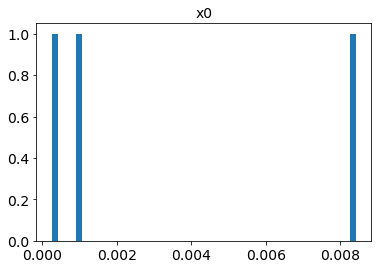

rango x0_err : 1.882400605640273e-05, 4.263371751954413e-05
promedio x0_err : 2.713771844931623e-05
desviación estándar x0_err : 1.096705738187042e-05
mediana x0_err : 1.9955431772001827e-05


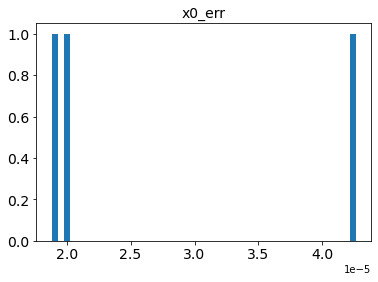

rango x1 : -2.146611790812108, 0.8871800346027054
promedio x1 : -0.357429765714026
desviación estándar x1 : 1.2970202750897712
mediana x1 : 0.1871424590673243


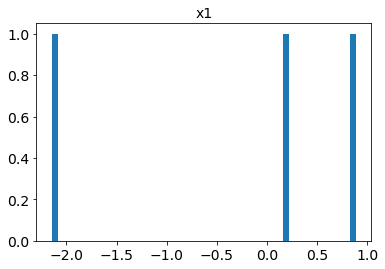

rango x1_err : 0.018300070306957572, 2.014432653937914
promedio x1_err : 0.729739670618193
desviación estándar x1_err : 0.910165151206565
mediana x1_err : 0.15648628760970773


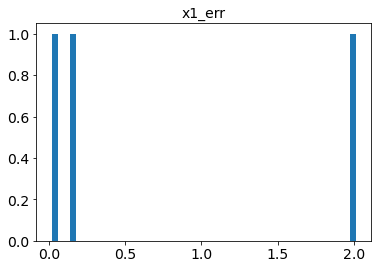

rango c : 0.028845603211245685, 0.12194608429370424
promedio c : 0.060411885649519326
desviación estándar c : 0.043516141800024014
mediana c : 0.030443969443608054


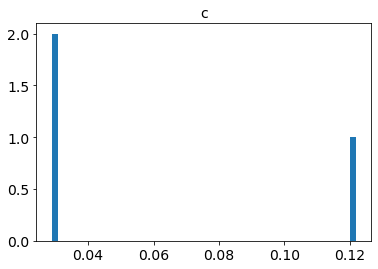

rango c_err : 0.0022165194044752035, 0.15501513907137762
promedio c_err : 0.0635735046359386
desviación estándar c_err : 0.06590735483147224
mediana c_err : 0.03348885543196295


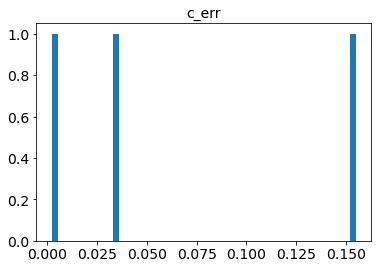

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


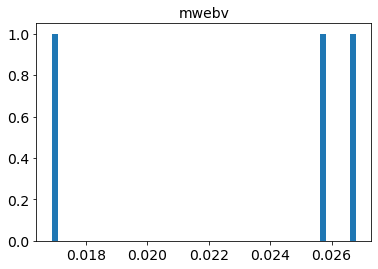

In [197]:
histogramas_estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded_cortes_trest, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [198]:
estadisticas_SALT2_z_bounded_cortes_trest = estadisticas_resultados(ajustes_SALT2_early_SNIa_z_bounded_cortes_trest).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT2 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [199]:
lista_oid_SALT2_z_bounded_cortes_trest = list(estadisticas_SALT2_z_bounded_cortes_trest['oid'])
lista_chisq_vs_ndof_SALT2_z_bounded_cortes_trest = list(estadisticas_SALT2_z_bounded_cortes_trest['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [200]:
median_chisq_vs_ndof_SALT2_z_bounded_cortes_trest = np.median(np.array(estadisticas_SALT2_z_bounded_cortes_trest['chisq/ndof']))
df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest = estadisticas_SALT2_z_bounded_cortes_trest[estadisticas_SALT2_z_bounded_cortes_trest['chisq/ndof'] > median_chisq_vs_ndof_SALT2_z_bounded_cortes_trest].reset_index()
lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest = list(df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [201]:
display(df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest[['oid', 
                                                                     'chisq/ndof', 
                                                                     'z', 
                                                                     'z_err', 
                                                                     't0', 
                                                                     't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
0,ZTF18abpamut,1.436336,1.059142e-01,0.024055,58367.798699,0.206461
1,ZTF18aaumlfl,1.441130,1.830432e-02,0.011164,58265.035894,0.274117
2,ZTF18abimsyv,1.464449,8.639310e-02,0.009287,58334.425352,0.154028
3,ZTF18abckujg,1.470136,3.203560e-02,0.010291,58302.909650,0.233203
4,ZTF18abdbuty,1.635361,1.045593e-01,0.016046,58308.315705,0.161745
5,ZTF18abclalx,1.650098,1.756881e-02,0.016390,58300.363622,0.366216
6,ZTF18abdkimx,1.669320,7.622732e-02,0.018675,58313.830874,0.144141
7,ZTF18aaxwjmp,1.680652,5.301183e-02,0.012041,58288.218599,0.129118
8,ZTF18abjvhec,1.691556,1.501537e-01,0.012534,58340.953026,0.110068
9,ZTF18abtnlik,1.721071,8.695092e-02,0.048239,58379.073481,0.239922


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT2 y $z$ variable antes y después de eliminar los puntos fuera del rango de tiempo del modelo como si en el primer ajuste estuviese en el sistema de referencia en reposo (cota inferior del rango de tiempo)

In [202]:
inter_oid_SALT2_z_bounded_sobre_mediana_cortes_trest = np.intersect1d(np.array(lista_oid_SALT2_z_var_sobre_mediana),
                                                              np.array(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest))
print('Elementos comunes sobre la mediana de chisq/ndof : ',
      len(inter_oid_SALT2_z_bounded_sobre_mediana_cortes_trest))

Elementos comunes sobre la mediana de chisq/ndof :  34


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [203]:
table_early_SNIa_SALT2_z_bounded_cortes_trest = astropy_table_detections(df_meta_early_SNIa_sin_SN50, 
                                                                         detect_early_SNIa_SALT2_z_bounded_cortes_trest)

Los gráficos se parecen mucho a aquellos con redshift real

Algunos gráficos de ajustes con $\frac{\chi^2}{ndof}$ mayor a la mediana

 ==== Con ajuste del redshift ====
chisq/ndof :  2.1770862128757935


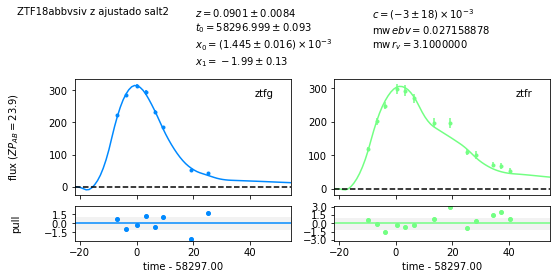

In [204]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest[15], 'salt2', df_meta_early_SNIa_sin_SN50, 
       table_early_SNIa_SALT2_z_bounded_cortes_trest, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'][15])

 ==== Con ajuste del redshift ====
chisq/ndof :  4.290493432303422


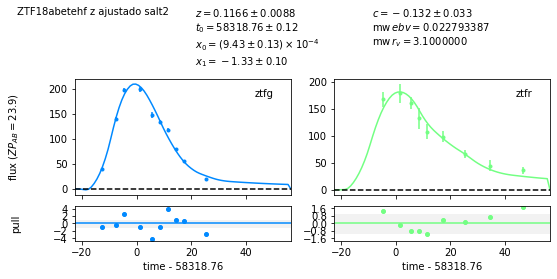

In [205]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest[26], 'salt2', df_meta_early_SNIa_sin_SN50, 
       table_early_SNIa_SALT2_z_bounded_cortes_trest, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'][26])

 ==== Con ajuste del redshift ====
chisq/ndof :  4.654403592280115


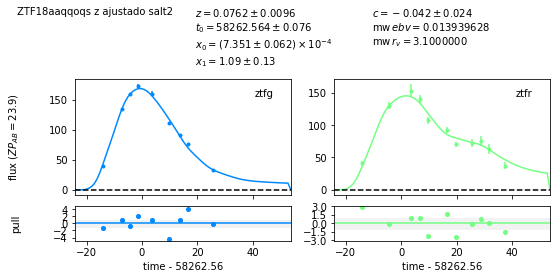

In [206]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest[27], 'salt2', df_meta_early_SNIa_sin_SN50, 
       table_early_SNIa_SALT2_z_bounded_cortes_trest, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'][27])

 ==== Con ajuste del redshift ====
chisq/ndof :  5.718753898085726


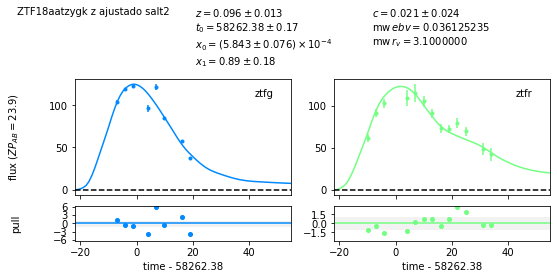

In [207]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest[30], 'salt2', df_meta_early_SNIa_sin_SN50, 
       table_early_SNIa_SALT2_z_bounded_cortes_trest, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'][30])

 ==== Con ajuste del redshift ====
chisq/ndof :  6.208018491940477


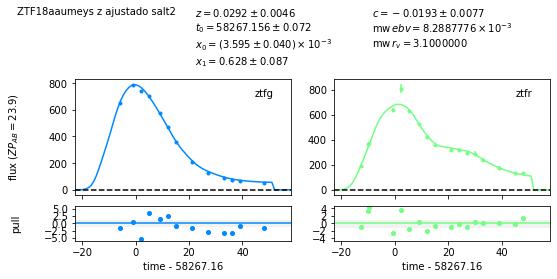

In [208]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest[33], 'salt2', df_meta_early_SNIa_sin_SN50, 
       table_early_SNIa_SALT2_z_bounded_cortes_trest, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'][33])

 ==== Con ajuste del redshift ====
chisq/ndof :  6.790918609266918


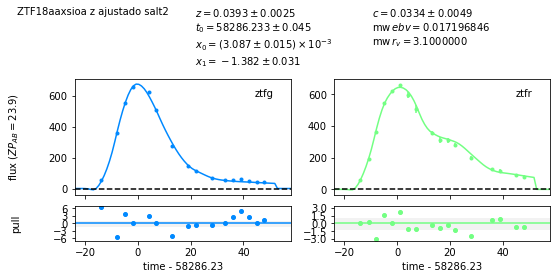

In [209]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest[34], 'salt2', df_meta_early_SNIa_sin_SN50, 
       table_early_SNIa_SALT2_z_bounded_cortes_trest, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'][34])

 ==== Con ajuste del redshift ====
chisq/ndof :  19.35228616992267


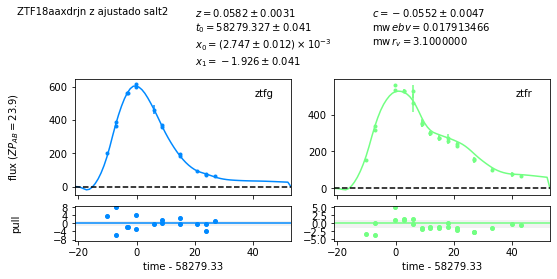

In [210]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest[35], 'salt2', df_meta_early_SNIa_sin_SN50, 
       table_early_SNIa_SALT2_z_bounded_cortes_trest, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'][40])

 ==== Con ajuste del redshift ====
chisq/ndof :  17.480030395825924


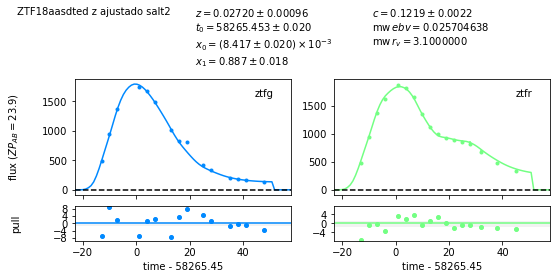

In [211]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest[39], 'salt2', df_meta_early_SNIa_sin_SN50, 
       table_early_SNIa_SALT2_z_bounded_cortes_trest, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'][39])

 ==== Con ajuste del redshift ====
chisq/ndof :  19.35228616992267


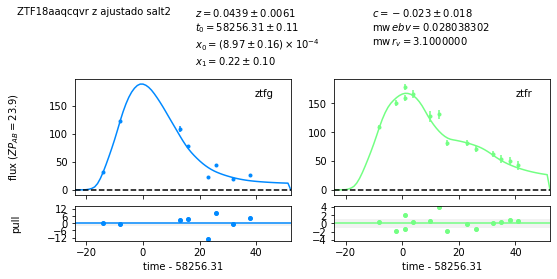

In [212]:
ajuste(lista_oid_SALT2_z_bounded_sobre_mediana_cortes_trest[40], 'salt2', df_meta_early_SNIa_sin_SN50, 
       table_early_SNIa_SALT2_z_bounded_cortes_trest, version='2.4', z_bounds=z_bounds)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT2_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'][40])

# Ajustes con el modelo SALT3

## Primeros ajustes

### Ajuste con el redshift verdadero

In [213]:
ajustes_SALT3_z_fijo_early_SNIa = modelo_ajustado_y_resultados('salt3', df_meta_early_SNIa, 
                                                               detect_early_SNIa, 
                                                               z_real=True,
                                                               print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 89, 156
promedio ncall : 105.11842105263158
desviación estándar ncall : 12.72271808229916
mediana ncall : 101.5


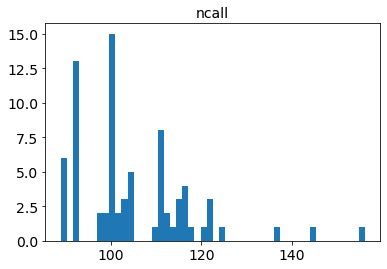

rango chisq : 4.975137305253083, 6455.946500879967
promedio chisq : 271.34852600860233
desviación estándar chisq : 875.9557796517363
mediana chisq : 31.369674213362423


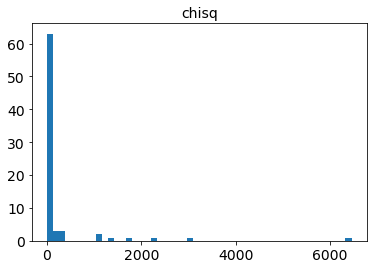

rango ndof : 6, 64
promedio ndof : 22.092105263157894
desviación estándar ndof : 12.611792342652285
mediana ndof : 18.0


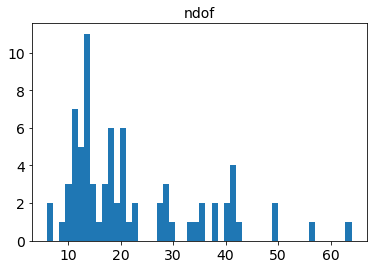

rango chisq/ndof : 0.4911398875281123, 129.11893001759935
promedio chisq/ndof : 8.233395593453736
desviación estándar chisq/ndof : 21.923620737604388
mediana chisq/ndof : 1.5858349638230238


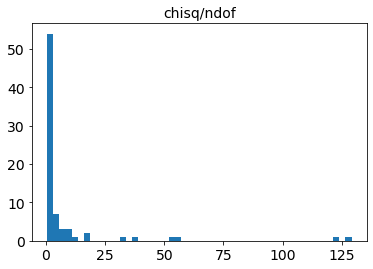

rango z : 0.0269, 0.14
promedio z : 0.07240263157894737
desviación estándar z : 0.024863225717408274
mediana z : 0.0718


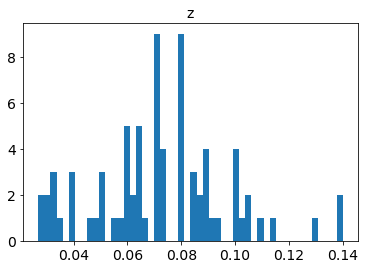

rango t0 : 58254.61862931233, 58395.71445713421
promedio t0 : 58322.137708515686
desviación estándar t0 : 38.628552983803196
mediana t0 : 58317.36017595416


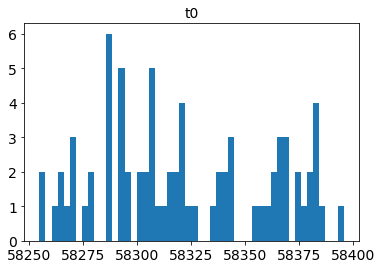

rango t0_err : 0.02316880653233966, 1.140970089356415
promedio t0_err : 0.17560964889889874
desviación estándar t0_err : 0.17820470370763836
mediana t0_err : 0.12889590969098208


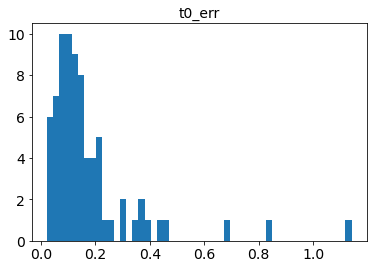

rango x0 : 0.00022861361160102106, 0.006394705345290913
promedio x0 : 0.001137263736323875
desviación estándar x0 : 0.0012235352393969849
mediana x0 : 0.0006769947215276302


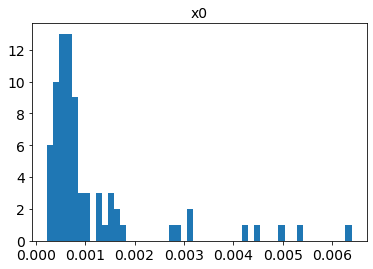

rango x0_err : 4.16418186005795e-06, 4.9441334299854824e-05
promedio x0_err : 1.33485469207378e-05
desviación estándar x0_err : 8.983930505272098e-06
mediana x0_err : 1.017770510325743e-05


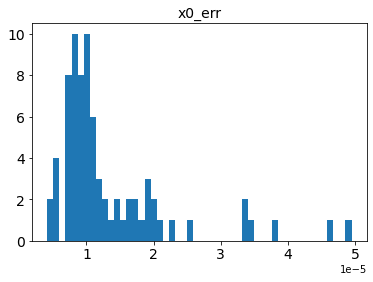

rango x1 : -2.526995129528115, 2.4762138017941413
promedio x1 : -0.00511447414643907
desviación estándar x1 : 1.0845667861314252
mediana x1 : 0.20075751386786606


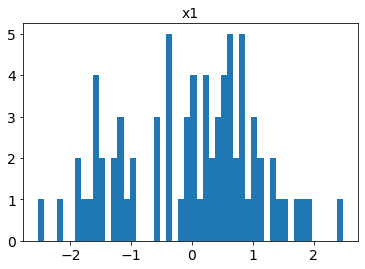

rango x1_err : 0.029580677590762956, 1.2134104320691241
promedio x1_err : 0.22253657994010673
desviación estándar x1_err : 0.2041257379357724
mediana x1_err : 0.16552192434707835


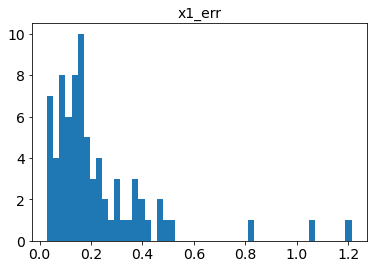

rango c : -0.18078217842949446, 0.3114290888790179
promedio c : 0.006935134335301371
desviación estándar c : 0.10000156146626618
mediana c : 0.0021219080498541725


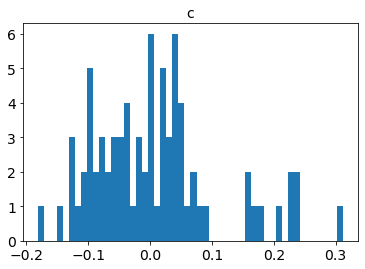

rango c_err : 0.004569970731945652, 0.06240814663034827
promedio c_err : 0.024965501632577467
desviación estándar c_err : 0.011995962249892243
mediana c_err : 0.022331815737664948


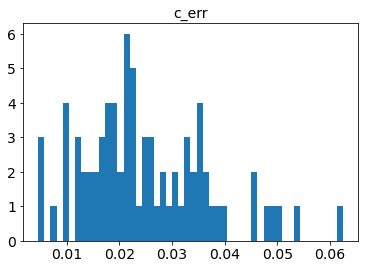

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


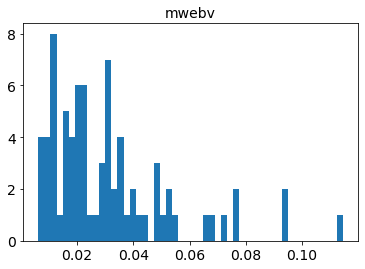

In [214]:
histogramas_estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa, z_real=True, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 98, 162
promedio ncall : 128.0
desviación estándar ncall : 23.723406163533937
mediana ncall : 117.0


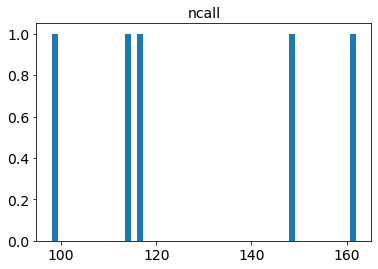

rango chisq : 90.12645435832005, 19468.40452210995
promedio chisq : 4780.393370713245
desviación estándar chisq : 7406.958298352883
mediana chisq : 1498.136672110388


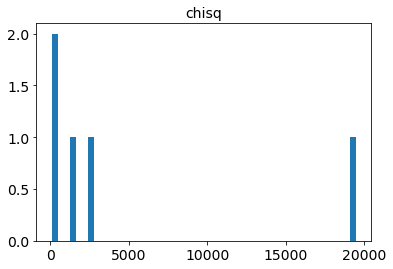

rango ndof : 16, 63
promedio ndof : 40.4
desviación estándar ndof : 19.12694434560837
mediana ndof : 36.0


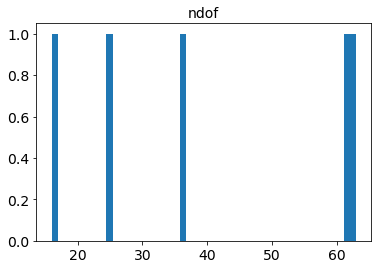

rango chisq/ndof : 5.632903397395003, 309.02229400174525
promedio chisq/ndof : 81.13213375098859
desviación estándar chisq/ndof : 115.1305757071848
mediana chisq/ndof : 41.61490755862189


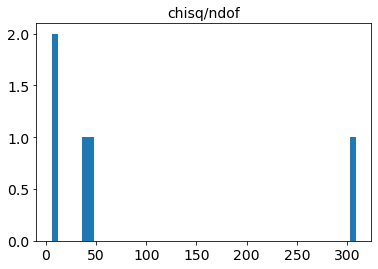

rango z : 0.0185, 0.08
promedio z : 0.046759999999999996
desviación estándar z : 0.02566247065268658
mediana z : 0.0365


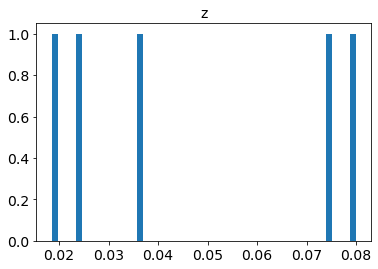

rango t0 : 58262.58921010841, 58328.83761374807
promedio t0 : 58291.05227223052
desviación estándar t0 : 24.255315708533132
mediana t0 : 58294.3730151185


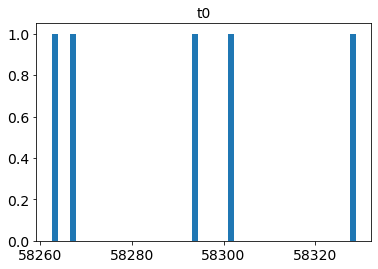

rango t0_err : 0.02570560940876021, 0.09095751601125812
promedio t0_err : 0.051373338435223556
desviación estándar t0_err : 0.023987999116160664
mediana t0_err : 0.05093047839545761


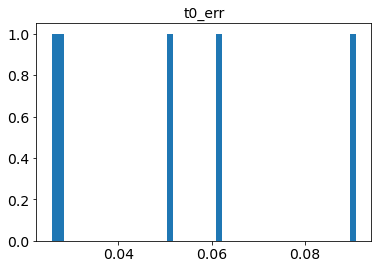

rango x0 : 0.0007342422139426602, 0.011206006717653856
promedio x0 : 0.0037498441189490637
desviación estándar x0 : 0.0038676077798204776
mediana x0 : 0.0023756419490579377


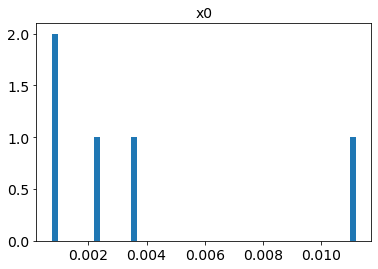

rango x0_err : 5.781193368124637e-06, 6.601356749639282e-05
promedio x0_err : 2.3305841844653024e-05
desviación estándar x0_err : 2.1806218801041722e-05
mediana x0_err : 1.5267032991912887e-05


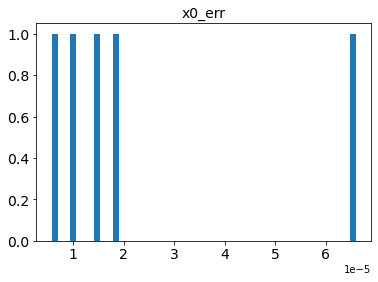

rango x1 : 0.7149399278781672, 2.315526699371765
promedio x1 : 1.2156485631069711
desviación estándar x1 : 0.5635602719403923
mediana x1 : 1.0320394698429758


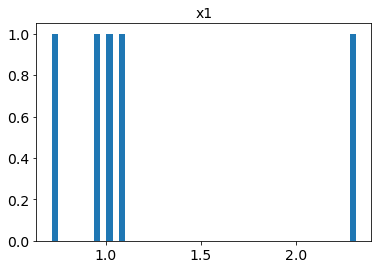

rango x1_err : 0.0384843692801935, 0.15934170973775036
promedio x1_err : 0.07775646127075737
desviación estándar x1_err : 0.044353238072267855
mediana x1_err : 0.06168036540335852


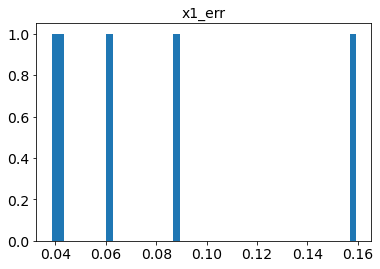

rango c : -0.03938766209509814, 0.6439642875639199
promedio c : 0.1433572485238207
desviación estándar c : 0.26022912681300764
mediana c : -0.01574465012511669


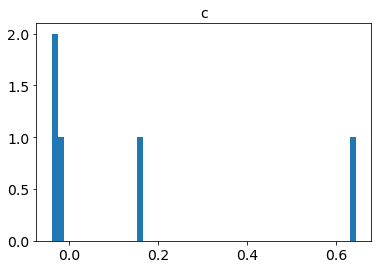

rango c_err : 0.005281215730520307, 0.019386079638113077
promedio c_err : 0.011649831234839831
desviación estándar c_err : 0.005331077790844976
mediana c_err : 0.009598987302157417


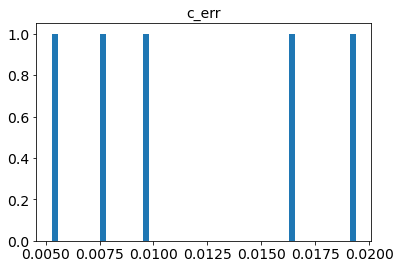

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


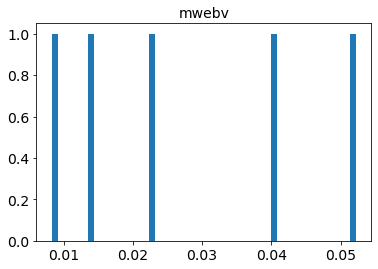

In [215]:
histogramas_estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa, z_real=True, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 103, 121
promedio ncall : 114.33333333333333
desviación estándar ncall : 8.055363982396383
mediana ncall : 119.0


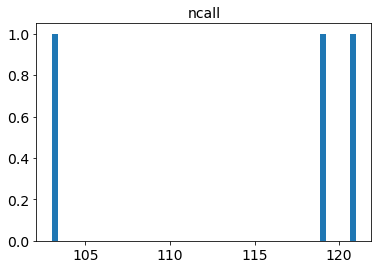

rango chisq : 1.3724525208077036, 21735.96244751
promedio chisq : 7288.066623392315
desviación estándar chisq : 10216.333569384955
mediana chisq : 126.86497014613511


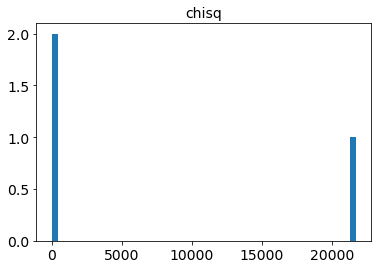

rango ndof : 4, 71
promedio ndof : 42.333333333333336
desviación estándar ndof : 28.193773938387334
mediana ndof : 52.0


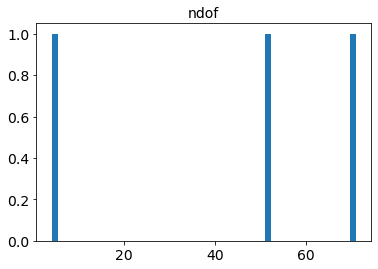

rango chisq/ndof : 0.3431131302019259, 306.14031616211264
promedio chisq/ndof : 102.97438008555444
desviación estándar chisq/ndof : 143.66256092435876
mediana chisq/ndof : 2.4397109643487522


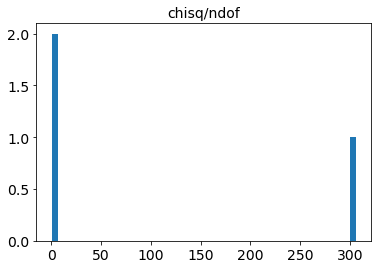

rango z : 0.0181, 0.12
promedio z : 0.06826666666666666
desviación estándar z : 0.04161524827378648
mediana z : 0.0667


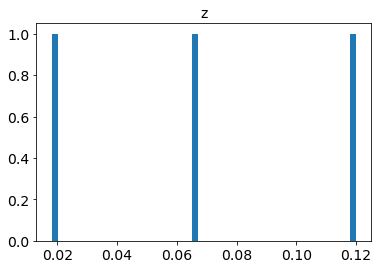

rango t0 : 58265.18405073435, 58363.841483883945
promedio t0 : 58309.86319121399
desviación estándar t0 : 40.80994937929222
mediana t0 : 58300.56403902368


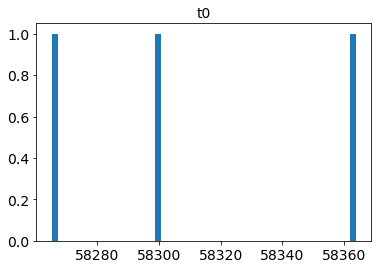

rango t0_err : 0.008853099894622574, 1.1017507151373138
promedio t0_err : 0.4009104151931145
desviación estándar t0_err : 0.49673366308034317
mediana t0_err : 0.09212743054740713


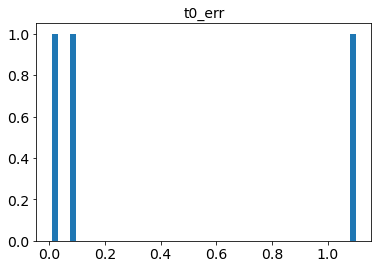

rango x0 : 0.00024111798977574528, 0.00856313221523054
promedio x0 : 0.0032422368244903513
desviación estándar x0 : 0.003772709251504584
mediana x0 : 0.0009224602684647701


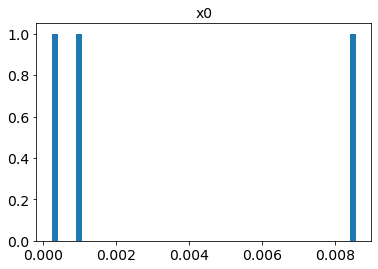

rango x0_err : 1.0135492392180267e-05, 3.741451111726936e-05
promedio x0_err : 2.1137022272044907e-05
desviación estándar x0_err : 1.1744871871134822e-05
mediana x0_err : 1.586106330668508e-05


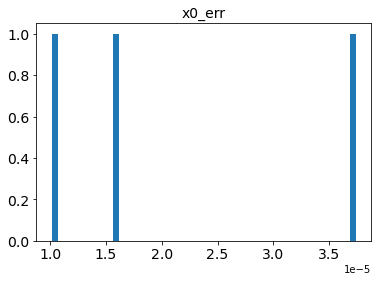

rango x1 : -1.3399160868990225, 0.7325161034287938
promedio x1 : -0.14630093888896337
desviación estándar x1 : 0.8748589148685
mediana x1 : 0.16849716680333857


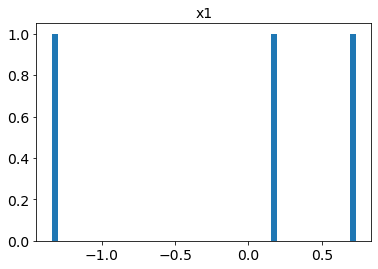

rango x1_err : 0.014901048227003276, 2.174432525459371
promedio x1_err : 0.7683762084794918
desviación estándar x1_err : 0.995084812089267
mediana x1_err : 0.11579505175210111


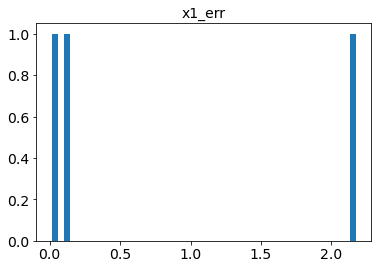

rango c : 0.024665927956165283, 0.14359290659252885
promedio c : 0.07631307173712781
desviación estándar c : 0.04979419199441598
mediana c : 0.060680380662689284


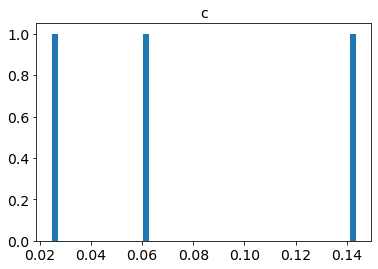

rango c_err : 0.0020820868954110577, 0.13190022716449315
promedio c_err : 0.05012402531862406
desviación estándar c_err : 0.058118773686492695
mediana c_err : 0.016389761895967976


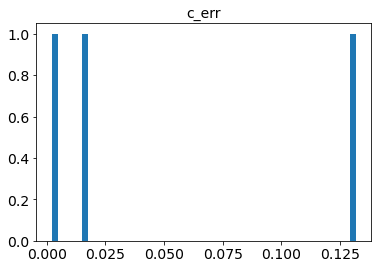

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


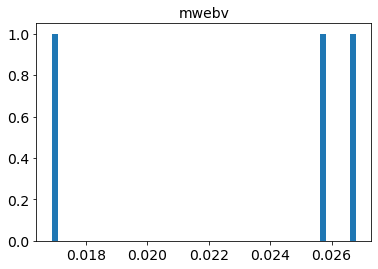

In [216]:
histogramas_estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa, z_real=True, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [217]:
estadisticas_SALT3_z_fijo = estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa, 
                                                    z_real=True).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del primer ajuste
con SALT2 y redshift real, ordenados según el valor de chisq/ndof

In [218]:
lista_oid_SALT3_z_fijo = list(estadisticas_SALT3_z_fijo['oid'])
lista_chisq_vs_ndof_SALT3_z_fijo = list(estadisticas_SALT3_z_fijo['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana

In [219]:
median_chisq_vs_ndof_SALT3_z_fijo = np.median(np.array(estadisticas_SALT3_z_fijo['chisq/ndof']))
df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana = estadisticas_SALT3_z_fijo[estadisticas_SALT3_z_fijo['chisq/ndof'] > median_chisq_vs_ndof_SALT3_z_fijo].reset_index()
lista_oid_SALT3_z_fijo_sobre_mediana = list(df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [220]:
display(df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana[['oid', 
                                                    'chisq/ndof',
                                                    'z', 
                                                    't0', 
                                                    't0_err']])

,oid,chisq/ndof,z,t0,t0_err
0,ZTF18abpamut,1.742925,0.0720,58367.688928,0.147617
1,ZTF18absdgon,1.746921,0.0620,58375.934626,0.121366
2,ZTF18abtnlik,1.750879,0.0900,58379.084046,0.153028
3,ZTF18abdbuty,1.820153,0.0600,58307.994801,0.125981
4,ZTF18aazsabq,1.860961,0.0500,58293.972076,0.083865
5,ZTF18abclalx,1.905211,0.1000,58301.077940,0.187440
6,ZTF18abealop,1.924834,0.0666,58316.176128,0.189972
7,ZTF18abpaywm,1.979794,0.0450,58367.922646,0.083202
8,ZTF18abckujg,2.037916,0.0740,58303.421237,0.155806
9,ZTF18aaxqyki,2.071909,0.1003,58286.408991,0.128616


Se ve que los valores de $\frac{\chi^{2}}{ndof}$  son muy altos, pese a que se esté usando el redshift real de la SN Ia para hacer los ajustes. Veamos si esto también pasa al ajustar el redshift de las SN y analicemos ese caso.

### Ajuste con redshift variable (se debe eliminar una SN de los datos ya que no se puede ajustar, si no se elimina el programa se cae)

In [221]:
name_52 = names_SNIa[52]
print('Eliminada ', name_52)
df_meta_early_SNIa_sin_SN52 = df_meta_early_SNIa[df_meta_early_SNIa.oid != name_52]

detect_early_SNIa_sin_SN52 = detect_early_SNIa[detect_early_SNIa["oid"]!=name_52]
ajustes_SALT3_early_SNIa_sin_SN52 = modelo_ajustado_y_resultados('salt3', 
                                                                 df_meta_early_SNIa_sin_SN52, 
                                                                 detect_early_SNIa_sin_SN52,
                                                                 print_ind_and_oid=False)

Eliminada  ZTF18abgmcmv


Link en ALeRCE ZTF explorer de esta SN: https://alerce.online/object/ZTF18abgmcmv (es SN Ia-91T-like)

Estadísticas SN Ia

rango ncall : 149, 1379
promedio ncall : 363.4078947368421
desviación estándar ncall : 200.82010656513214
mediana ncall : 289.0


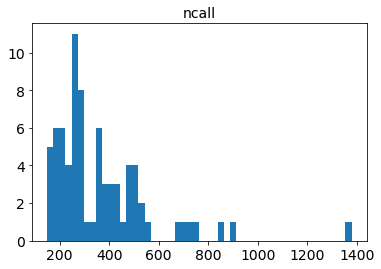

rango chisq : 4.863277827350304, 3620.0315068756395
promedio chisq : 208.92023273019754
desviación estándar chisq : 582.7668262019988
mediana chisq : 31.733537005822704


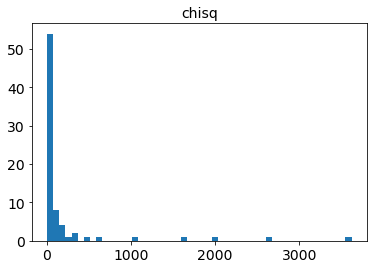

rango ndof : 5, 63
promedio ndof : 21.092105263157894
desviación estándar ndof : 12.611792342652285
mediana ndof : 17.0


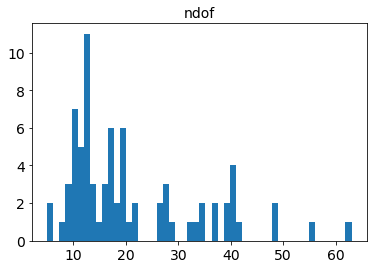

rango chisq/ndof : 0.4772206745634247, 123.88572912065412
promedio chisq/ndof : 7.174179893993386
desviación estándar chisq/ndof : 17.718618914450804
mediana chisq/ndof : 1.8546392167874621


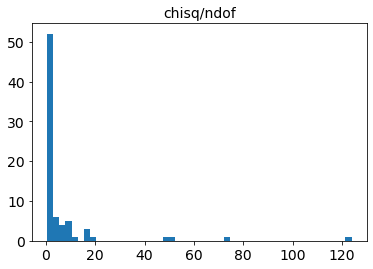

rango z : 0.0010000110338847289, 0.3137887364909378
promedio z : 0.16565352335990355
desviación estándar z : 0.09345947393874532
mediana z : 0.16684266560723843


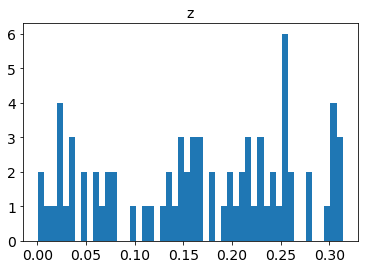

rango z_err : 2.9966641529322047e-09, 0.42086287313204446
promedio z_err : 0.027925366655456845
desviación estándar z_err : 0.050435755413116436
mediana z_err : 0.01746060813744075


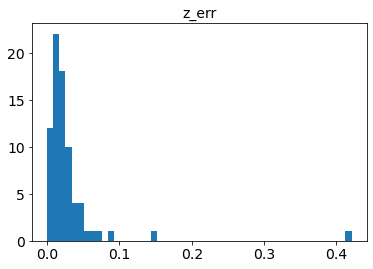

rango t0 : 58256.76099932384, 58395.08339788103
promedio t0 : 58322.967143051654
desviación estándar t0 : 38.56147007794725
mediana t0 : 58318.488651063744


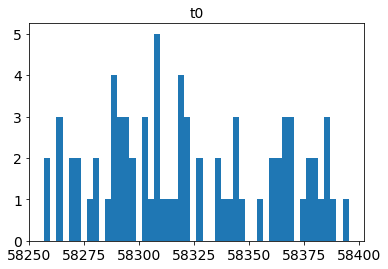

rango t0_err : 1.0899384506046772e-08, 131.59025160868987
promedio t0_err : 2.0247671212346656
desviación estándar t0_err : 14.963899247640716
mediana t0_err : 0.22261991816776572


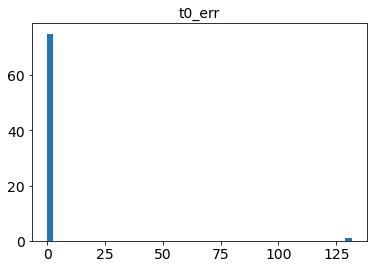

rango x0 : 0.00022795865919194336, 0.005382457034608279
promedio x0 : 0.0010714214414659488
desviación estándar x0 : 0.0011007171106400468
mediana x0 : 0.0006573318115688581


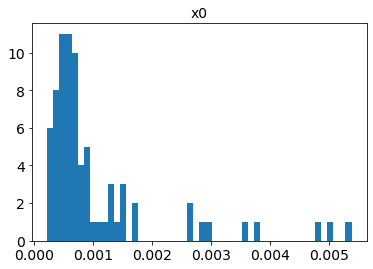

rango x0_err : 5.8647997696926295e-06, 1.0054245570771978
promedio x0_err : 0.026408304255517493
desviación estándar x0_err : 0.16051952704282657
mediana x0_err : 1.4908066739857063e-05


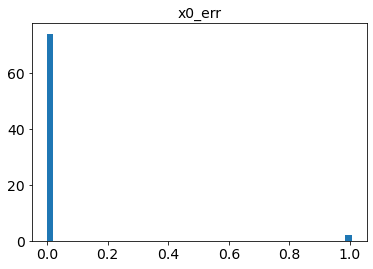

rango x1 : -2.2318680748604987, 3.999999928222608
promedio x1 : 0.031273098366430475
desviación estándar x1 : 1.2136824018627883
mediana x1 : 0.11479869590175085


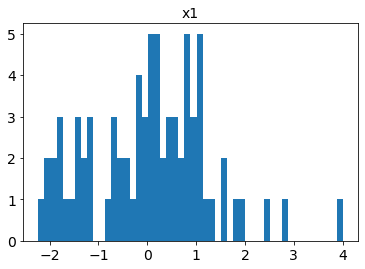

rango x1_err : 0.013066686654696014, 5.896671916029722
promedio x1_err : 0.40180832639040903
desviación estándar x1_err : 0.9153563572162113
mediana x1_err : 0.19977082831933357


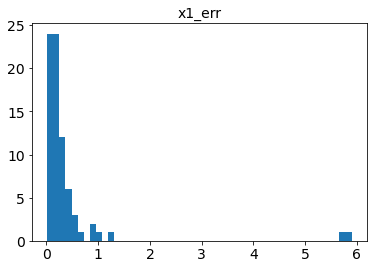

rango c : -0.3506298480117703, 0.2723707852536782
promedio c : -0.07879195504193681
desviación estándar c : 0.1232227564919892
mediana c : -0.0829594368750751


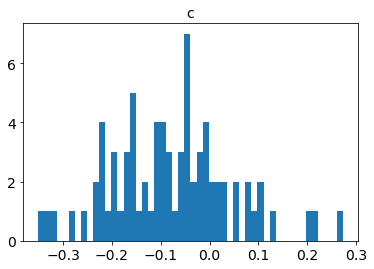

rango c_err : 0.00389520655132769, 0.5079693999832624
promedio c_err : 0.04630908979605362
desviación estándar c_err : 0.07259495064574191
mediana c_err : 0.031903616327465814


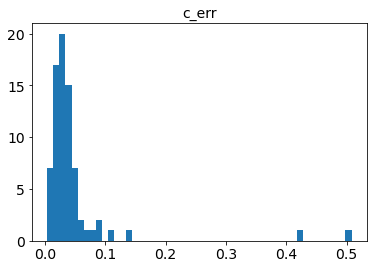

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


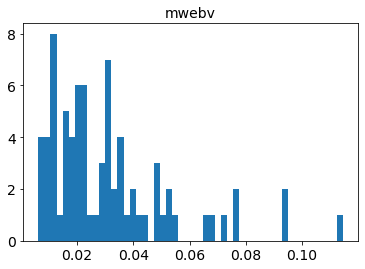

In [222]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 204, 364
promedio ncall : 277.75
desviación estándar ncall : 59.49107075856006
mediana ncall : 271.5


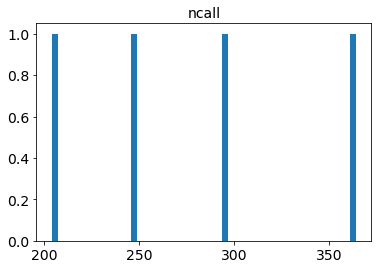

rango chisq : 110.94114633398105, 19430.86886179658
promedio chisq : 5311.236862704542
desviación estándar chisq : 8173.1135051688725
mediana chisq : 851.5687213438027


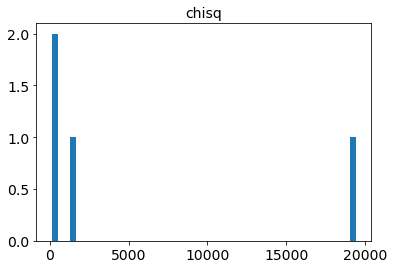

rango ndof : 15, 62
promedio ndof : 34.0
desviación estándar ndof : 17.649362594722792
mediana ndof : 29.5


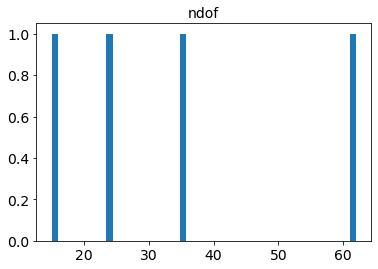

rango chisq/ndof : 5.802399755880406, 313.4011106741384
promedio chisq/ndof : 92.8204670598316
desviación estándar chisq/ndof : 128.29904112101175
mediana chisq/ndof : 26.039178904653784


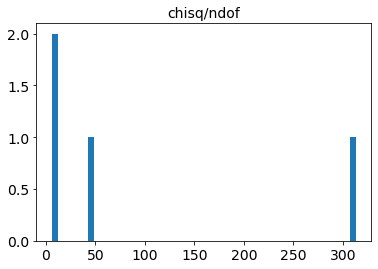

rango z : 0.013254084952174151, 0.3398382504375163
promedio z : 0.1840399738124275
desviación estándar z : 0.1214775816765726
mediana z : 0.19153377993000975


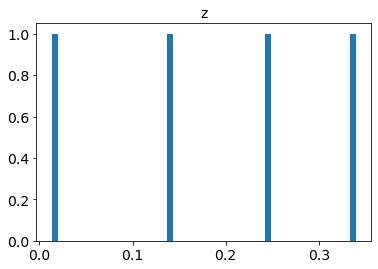

rango z_err : 0.0016603000127089988, 0.011297533234173929
promedio z_err : 0.006203210435313423
desviación estándar z_err : 0.0037709278525369363
mediana z_err : 0.005927504247185383


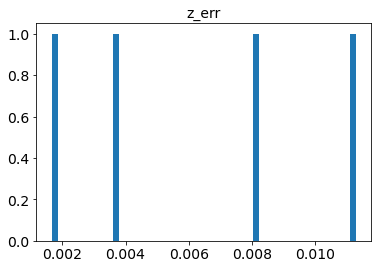

rango t0 : 58264.28481282658, 58301.95697542691
promedio t0 : 58282.85346125597
desviación estándar t0 : 16.94045356675676
mediana t0 : 58282.586028385194


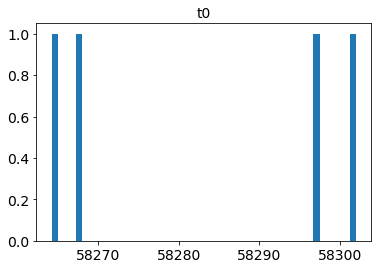

rango t0_err : 0.02961891576705966, 0.2220452384208329
promedio t0_err : 0.09970494938261254
desviación estándar t0_err : 0.07449863564864993
mediana t0_err : 0.0735778216712788


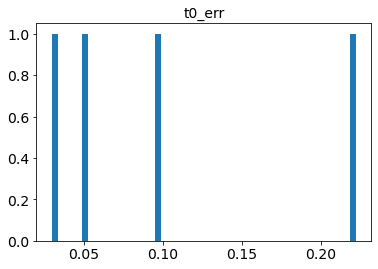

rango x0 : 0.000646703505458106, 0.011421403851412899
promedio x0 : 0.004034487000336114
desviación estándar x0 : 0.004384031683245492
mediana x0 : 0.002034920322236725


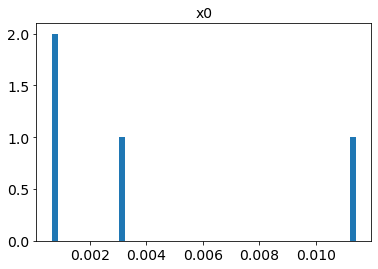

rango x0_err : 1.0219233223217531e-05, 7.740405755573925e-05
promedio x0_err : 3.102121413263609e-05
desviación estándar x0_err : 2.7010392575066266e-05
mediana x0_err : 1.823078287579378e-05


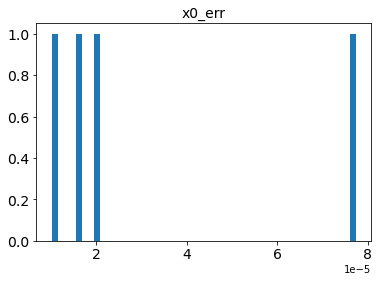

rango x1 : 0.4322050813324694, 2.2657449716891396
promedio x1 : 1.0864236631344213
desviación estándar x1 : 0.7013252022494527
mediana x1 : 0.8238722997580381


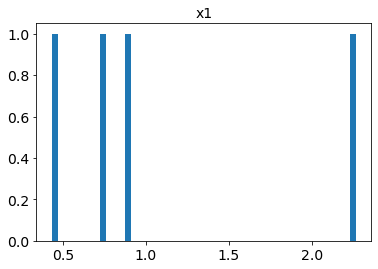

rango x1_err : 0.03727393727415951, 0.21892392014079531
promedio x1_err : 0.09955628422105389
desviación estándar x1_err : 0.0717787053016455
mediana x1_err : 0.07101363973463037


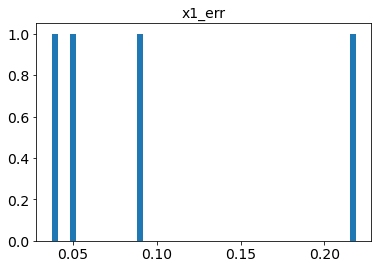

rango c : -0.21287693138134314, -0.0034478012642271683
promedio c : -0.12958563239933724
desviación estándar c : 0.07708129732921166
mediana c : -0.15100889847588933


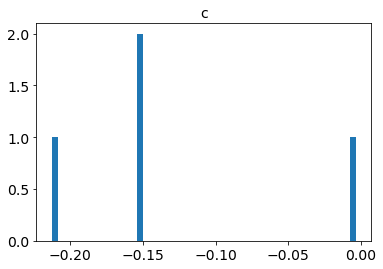

rango c_err : 0.0049755905876304185, 0.022971098380945146
promedio c_err : 0.014280235297018946
desviación estándar c_err : 0.007632743270063939
mediana c_err : 0.01458712610975011


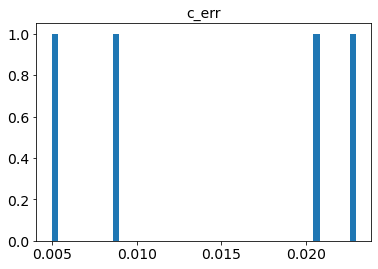

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02440207828578341
desviación estándar mwebv : 0.01691663733240622
mediana mwebv : 0.01854796664576526


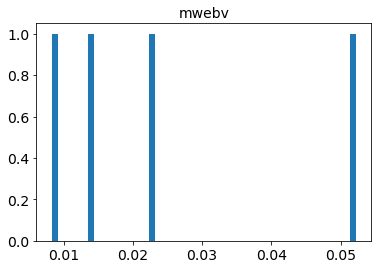

In [223]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 191, 847
promedio ncall : 555.0
desviación estándar ncall : 272.60716547197853
mediana ncall : 627.0


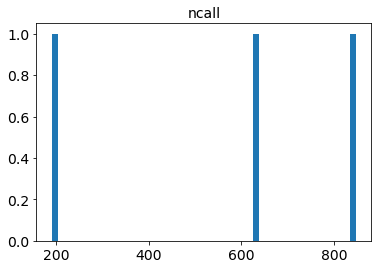

rango chisq : 1.4803418175203376, 22839.341198740418
promedio chisq : 7659.9368423148235
desviación estándar chisq : 10733.60655818093
mediana chisq : 138.98898638653358


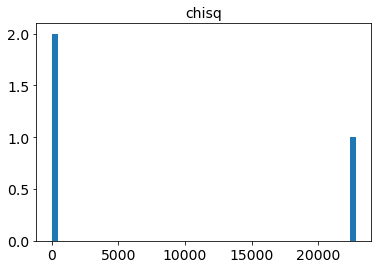

rango ndof : 3, 70
promedio ndof : 41.333333333333336
desviación estándar ndof : 28.193773938387334
mediana ndof : 51.0


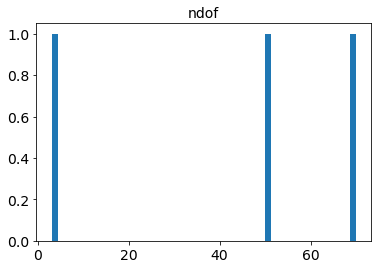

rango chisq/ndof : 0.49344727250677917, 326.27630283914885
promedio chisq/ndof : 109.83167478484295
desviación estándar chisq/ndof : 153.05217633883666
mediana chisq/ndof : 2.7252742428732075


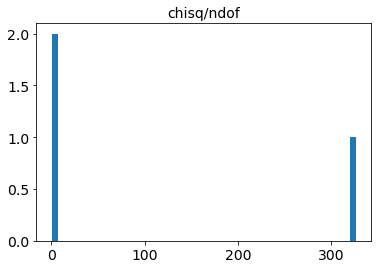

rango z : 0.256407999643031, 0.27744243656167916
promedio z : 0.2695996760417077
desviación estándar z : 0.009383320660592227
mediana z : 0.2749485919204129


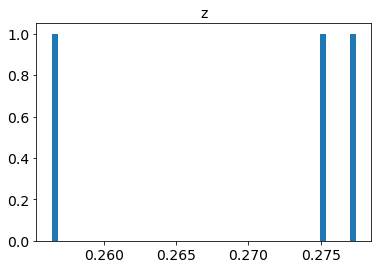

rango z_err : 1.8054899472708108e-07, 0.1271340180628111
promedio z_err : 0.04237870329044204
desviación estándar z_err : 0.05993105782130753
mediana z_err : 1.9112595202874783e-06


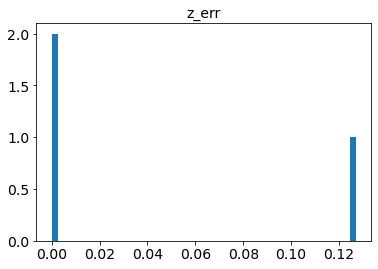

rango t0 : 58267.533283600125, 58364.092301232384
promedio t0 : 58311.31627579612
desviación estándar t0 : 39.929662797410145
mediana t0 : 58302.32324255583


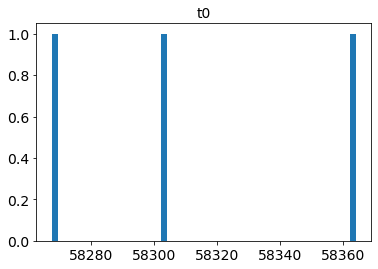

rango t0_err : 2.006446084124036e-05, 2.096757954579516
promedio t0_err : 0.6989747598963731
desviación estándar t0_err : 0.9883819769317694
mediana t0_err : 0.00014626064876210876


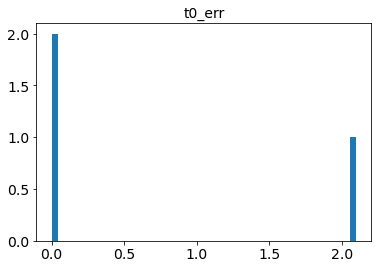

rango x0 : 0.0002565969937892909, 0.00749818687359165
promedio x0 : 0.002861324096728166
desviación estándar x0 : 0.003287079508696816
mediana x0 : 0.0008291884228035573


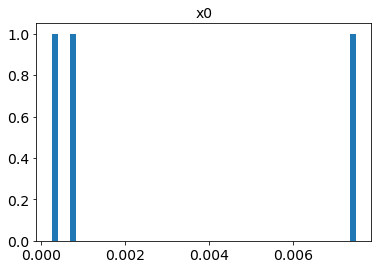

rango x0_err : 9.963939289459626e-06, 4.302916800836718e-05
promedio x0_err : 2.114882091365873e-05
desviación estándar x0_err : 1.5473031889528747e-05
mediana x0_err : 1.0453355443149392e-05


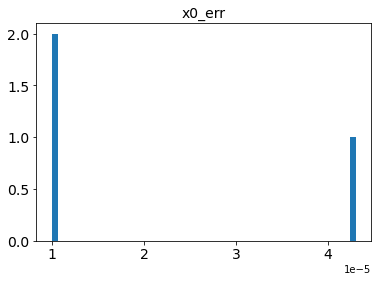

rango x1 : -2.5865571708243507, 0.28271611139581854
promedio x1 : -0.7258017329832757
desviación estándar x1 : 1.3172987458679795
mediana x1 : 0.12643586047870503


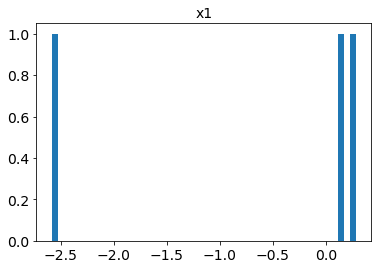

rango x1_err : 0.011042941176991672, 1.7884604736473213
promedio x1_err : 0.6364578929445853
desviación estándar x1_err : 0.8155873831760274
mediana x1_err : 0.10987026400944311


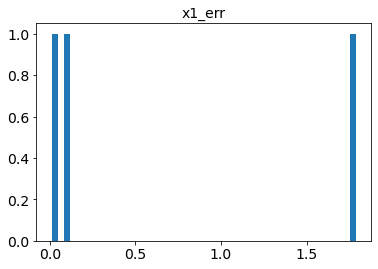

rango c : -0.2803902021421485, -0.18111583893195005
promedio c : -0.22181168092509487
desviación estándar c : 0.042455407663936164
mediana c : -0.2039290017011861


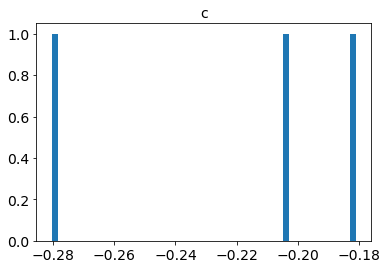

rango c_err : 0.0016252497278006622, 0.15880576579460273
promedio c_err : 0.05818035479733203
desviación estándar c_err : 0.07133522998808728
mediana c_err : 0.014110048869592703


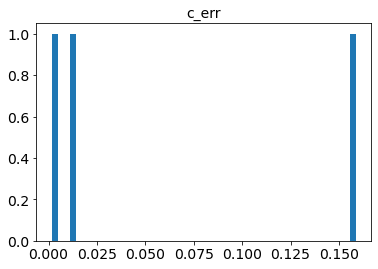

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


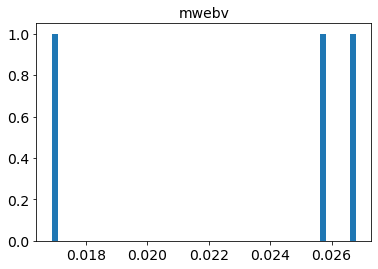

In [225]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [226]:
estadisticas_SALT3_z_var = estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del primer ajuste
con SALT3 y redshift variable, ordenados según el valor de chisq/ndof

In [227]:
lista_oid_SALT3_z_var = list(estadisticas_SALT3_z_var['oid'])
lista_chisq_vs_ndof_SALT3_z_var = list(estadisticas_SALT3_z_var['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [228]:
median_chisq_vs_ndof_SALT3_z_var = np.median(np.array(estadisticas_SALT3_z_var['chisq/ndof']))
df_chisq_vs_ndof_SALT3_z_var_sobre_mediana = estadisticas_SALT3_z_var[estadisticas_SALT3_z_var['chisq/ndof'] > median_chisq_vs_ndof_SALT3_z_var].reset_index()
lista_oid_SALT3_z_var_sobre_mediana = list(df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [229]:
display(df_chisq_vs_ndof_SALT3_z_var_sobre_mediana[['oid', 
                                                    'chisq/ndof',
                                                    'z', 
                                                    'z_err', 
                                                    't0', 
                                                    't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
0,ZTF18aazjztm,1.970341,0.301664,1.897528e-02,58293.197921,2.571549e-01
1,ZTF18abtnlik,2.035663,0.263541,2.632175e-02,58380.518237,2.933191e-01
2,ZTF18abimsyv,2.178769,0.240571,9.676009e-03,58336.302540,1.965998e-01
3,ZTF18aaxwjmp,2.218599,0.302822,1.513047e-02,58290.293653,2.098405e-01
4,ZTF18abclalx,2.266776,0.261197,2.244619e-02,58302.393653,2.972257e-01
5,ZTF18abetewu,2.304188,0.069200,2.146927e-02,58318.796142,1.984565e-01
6,ZTF18abbvsiv,2.438346,0.209085,1.003238e-02,58297.858941,1.659674e-01
7,ZTF18abdefet,2.503095,0.156539,3.569423e-02,58307.885729,2.591158e-01
8,ZTF18abbpeqo,2.725274,0.256408,1.911260e-06,58302.323243,1.462606e-04
9,ZTF18abealop,2.733973,0.308337,2.184332e-02,58318.181160,3.431250e-01


Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  0.4772206745634247


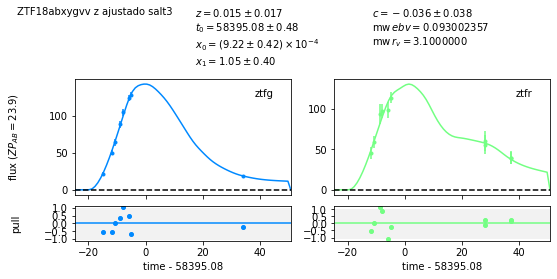

In [230]:
ajuste(lista_oid_SALT3_z_var[0], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var[0])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.49344727250677917


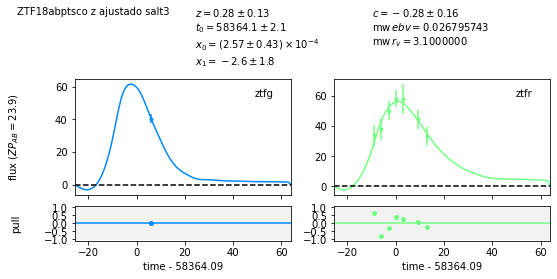

In [231]:
ajuste(lista_oid_SALT3_z_var[1], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var[1])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.7328299296932578


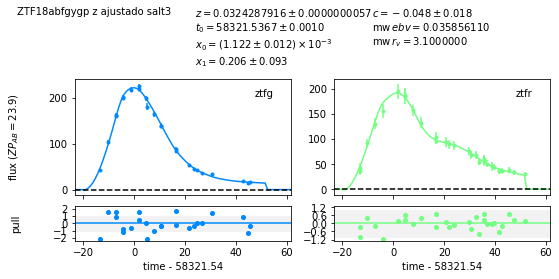

In [232]:
ajuste(lista_oid_SALT3_z_var[9], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var[9])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.856670096717543


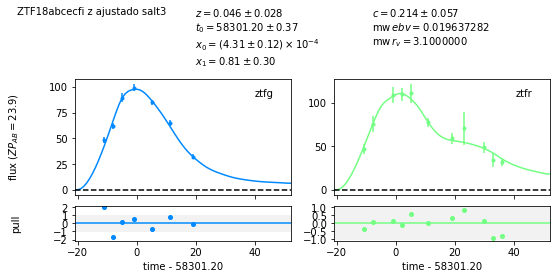

In [233]:
ajuste(lista_oid_SALT3_z_var[11], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var[11])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.2642382034972446


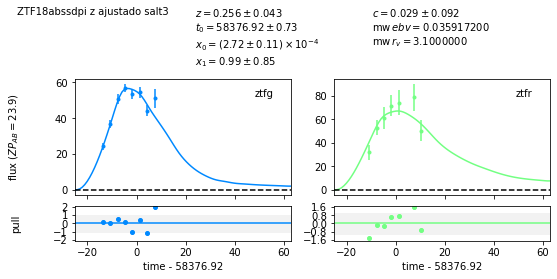

In [234]:
ajuste(lista_oid_SALT3_z_var[22], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var[22])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.6416528750107602


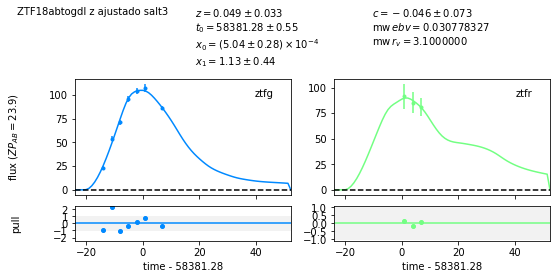

In [235]:
ajuste(lista_oid_SALT3_z_var[35], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var[35])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.8757222060033736


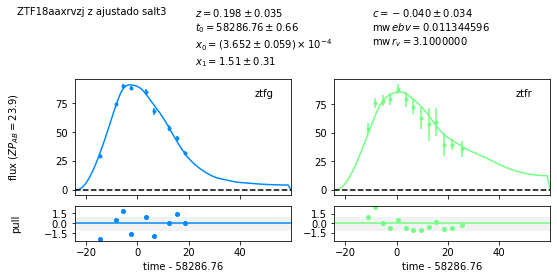

In [236]:
ajuste(lista_oid_SALT3_z_var[40], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var[40])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ mayores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  2.0356625618238935


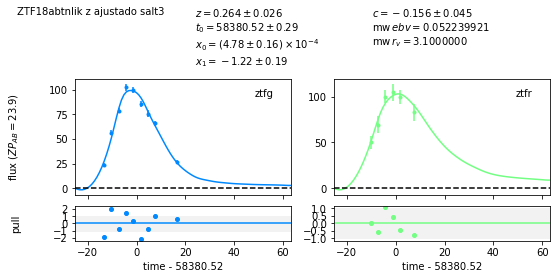

In [237]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana[1], 'salt3', 
       df_meta_early_SNIa, table_early_SNIa)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['chisq/ndof'][1])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.5030950364639555


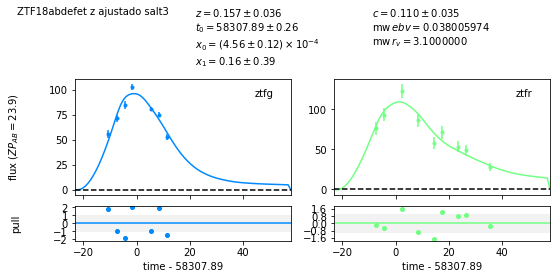

In [238]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana[7], 'salt3', 
       df_meta_early_SNIa, table_early_SNIa)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['chisq/ndof'][7])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.748277446671471


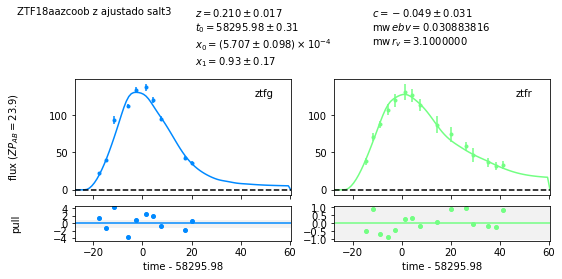

In [239]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana[10], 'salt3', 
       df_meta_early_SNIa, table_early_SNIa)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['chisq/ndof'][10])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.971723323648


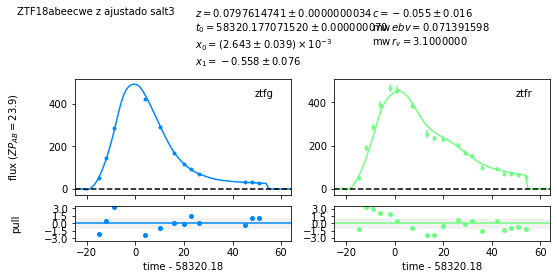

In [240]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana[13], 'salt3', 
       df_meta_early_SNIa, table_early_SNIa)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['chisq/ndof'][13])

 ==== Con ajuste del redshift ====
chisq/ndof :  4.55418325202497


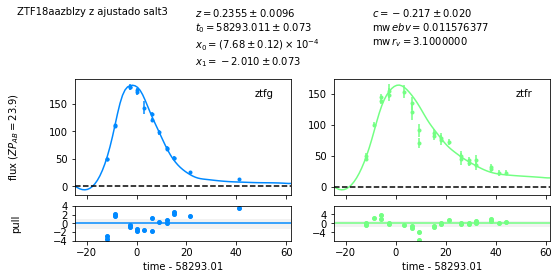

In [241]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana[17], 'salt3', 
       df_meta_early_SNIa, table_early_SNIa)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['chisq/ndof'][17])

 ==== Con ajuste del redshift ====
chisq/ndof :  5.802399755880406


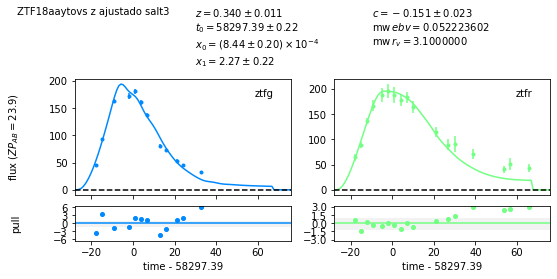

In [242]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana[19], 'salt3', 
       df_meta_early_SNIa, table_early_SNIa)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['chisq/ndof'][19])

 ==== Con ajuste del redshift ====
chisq/ndof :  73.8781940178702


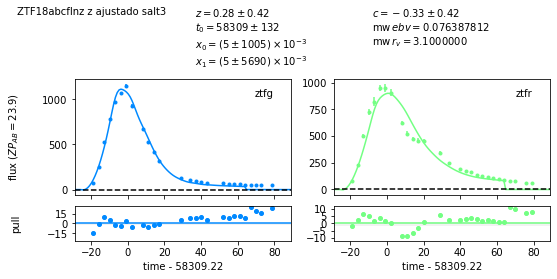

In [243]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana[37], 'salt3', 
       df_meta_early_SNIa, table_early_SNIa)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['chisq/ndof'][37])

 ==== Con ajuste del redshift ====
chisq/ndof :  123.88572912065412


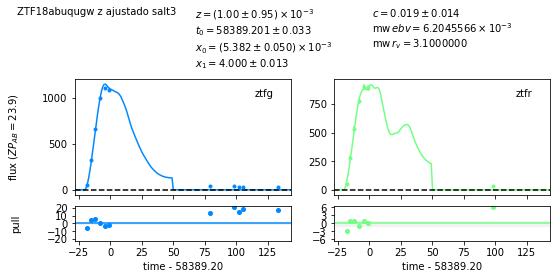

In [244]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana[38], 'salt3', 
       df_meta_early_SNIa, table_early_SNIa)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['chisq/ndof'][38])

 ==== Con ajuste del redshift ====
chisq/ndof :  313.4011106741384


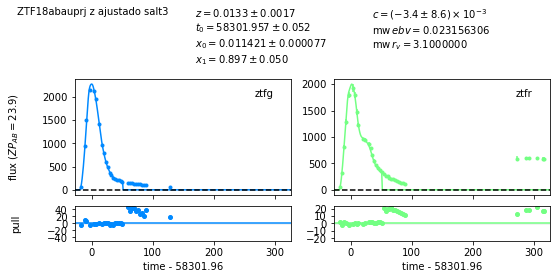

In [245]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana[39], 'salt3', 
       df_meta_early_SNIa, table_early_SNIa)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_var_sobre_mediana['chisq/ndof'][39])

Gráficamente los ajustes con los modelos SALT2 y SALT3 con redshift variable (ajustado en el modelo) son muy parecidos.

También pasa que el valor de $\frac{\chi^{2}}{ndof}$ aumenta mucho cuando hay puntos fuera del rango del modelo. Por lo que se harán cortes en las observaciones para estar dentro del rango de tiempo del modelo ($t$), determinado a partir del valor del tiempo del máximo ($t_0$) y del redshift ($z$) determinado en el primer ajuste, con $t_0 - 20 \cdot (1+z) \leq t \leq t_0 + 50 \cdot (1+z)$. 

## Ajuste con observaciones en el rango de tiempo del modelo (determinado con $t_0$ y $z$ del primer ajuste)

### Ajuste con redshift real

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el primer ajuste con el modelo SALT3 y redshift real

In [246]:
detect_early_SNIa_cortes_t_SALT3_z_fijo = cortes_t_modelo(trest_min_modelo, 
                                                          trest_max_modelo, 
                                                          detect_early_SNIa,
                                                          estadisticas_SALT3_z_fijo)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo

In [247]:
ajustes_SALT3_z_fijo_early_SNIa_cortes_t = modelo_ajustado_y_resultados('salt3',
                                                                        df_meta_early_SNIa,
                                                                        detect_early_SNIa_cortes_t_SALT3_z_fijo,  
                                                                        z_real=True,
                                                                        print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 89, 156
promedio ncall : 105.21052631578948
desviación estándar ncall : 12.753034509350153
mediana ncall : 101.5


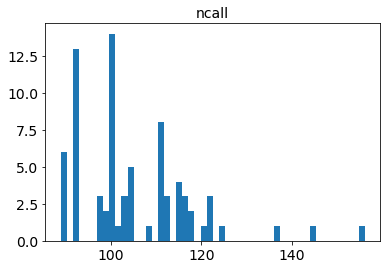

rango chisq : 4.975137305253083, 990.6478981219617
promedio chisq : 61.15346057182478
desviación estándar chisq : 121.11013879089064
mediana chisq : 30.27681080682779


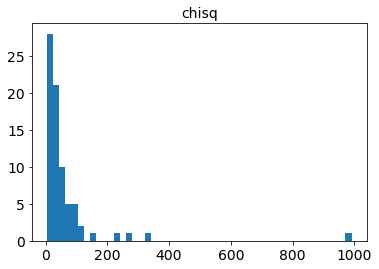

rango ndof : 6, 60
promedio ndof : 20.842105263157894
desviación estándar ndof : 11.09534353679263
mediana ndof : 17.5


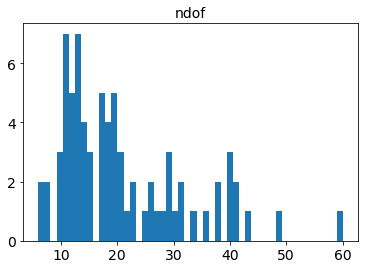

rango chisq/ndof : 0.4911398875281123, 27.758131529006537
promedio chisq/ndof : 2.7703386931004026
desviación estándar chisq/ndof : 4.109825148804109
mediana chisq/ndof : 1.5397170675187266


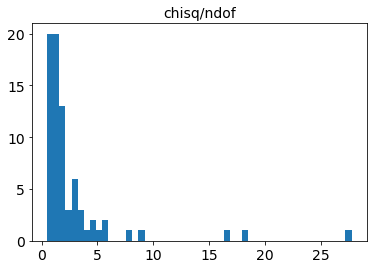

rango z : 0.0269, 0.14
promedio z : 0.07240263157894737
desviación estándar z : 0.024863225717408274
mediana z : 0.0718


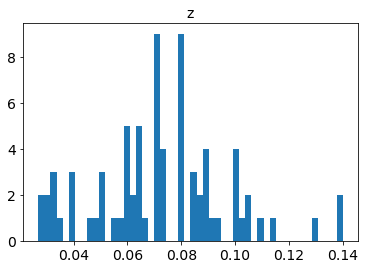

rango t0 : 58254.61862931233, 58395.71445713421
promedio t0 : 58322.13771209313
desviación estándar t0 : 38.628554397509674
mediana t0 : 58317.36017595416


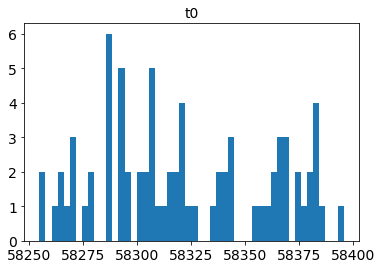

rango t0_err : 0.023168808587797685, 1.140970089356415
promedio t0_err : 0.17560940558513194
desviación estándar t0_err : 0.17820474546613213
mediana t0_err : 0.12889590969098208


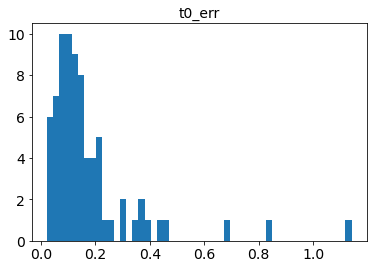

rango x0 : 0.00022861361160102106, 0.0063947076586478285
promedio x0 : 0.0011372629375187902
desviación estándar x0 : 0.0012235327646610613
mediana x0 : 0.0006769947215276302


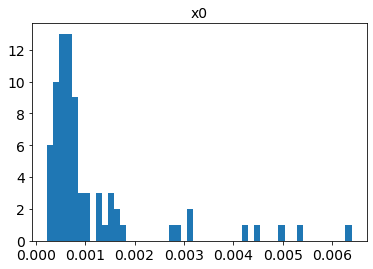

rango x0_err : 4.16418186005795e-06, 4.943246270588687e-05
promedio x0_err : 1.334739120268691e-05
desviación estándar x0_err : 8.980740905438439e-06
mediana x0_err : 1.017770510325743e-05


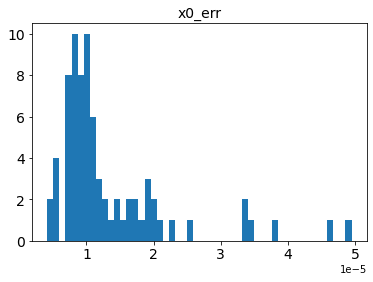

rango x1 : -2.5268717825467966, 2.4762138017941413
promedio x1 : -0.005112248774371724
desviación estándar x1 : 1.0845624492893415
mediana x1 : 0.20077678730206472


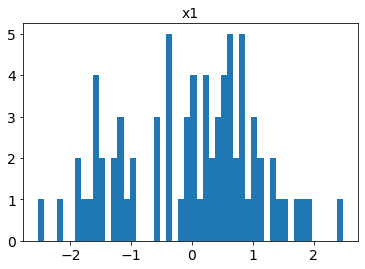

rango x1_err : 0.02957947120261193, 1.2134104320691241
promedio x1_err : 0.22253488807942864
desviación estándar x1_err : 0.20412648643543152
mediana x1_err : 0.1655145200526803


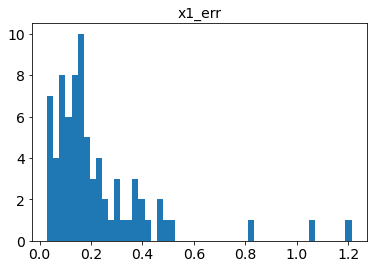

rango c : -0.18078217842949446, 0.3114290888790179
promedio c : 0.006935856313494259
desviación estándar c : 0.1000012189458413
mediana c : 0.0021219080498541725


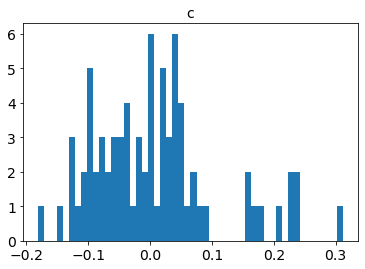

rango c_err : 0.004569351098168988, 0.06240814663034827
promedio c_err : 0.024965157596382858
desviación estándar c_err : 0.011996266910999222
mediana c_err : 0.022331815737664948


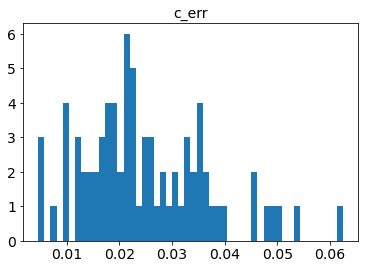

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


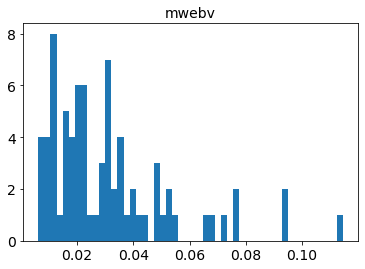

In [248]:
histogramas_estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa_cortes_t, 
                                    z_real=True, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 98, 159
promedio ncall : 126.8
desviación estándar ncall : 22.33741256278354
mediana ncall : 117.0


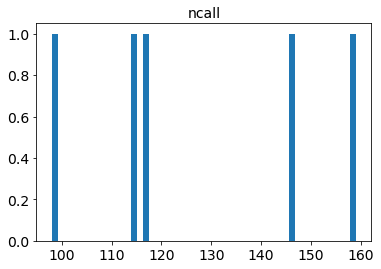

rango chisq : 68.22436790755933, 365.4289166804342
promedio chisq : 167.54767891597376
desviación estándar chisq : 105.32147658249725
mediana chisq : 146.40727321986873


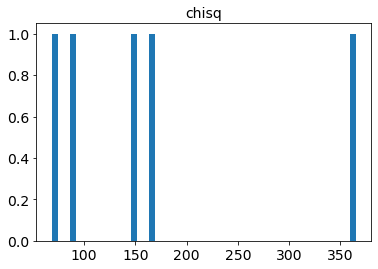

rango ndof : 16, 53
promedio ndof : 30.2
desviación estándar ndof : 12.812493902437573
mediana ndof : 26.0


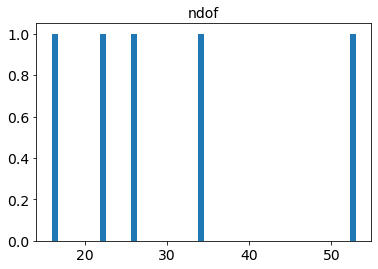

rango chisq/ndof : 3.1011076321617876, 10.747909314130418
promedio chisq/ndof : 5.654863230335249
desviación estándar chisq/ndof : 2.7813471347171324
mediana chisq/ndof : 5.631048969994951


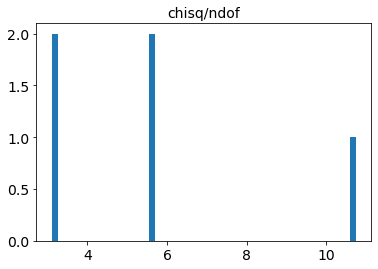

rango z : 0.0185, 0.08
promedio z : 0.046759999999999996
desviación estándar z : 0.02566247065268658
mediana z : 0.0365


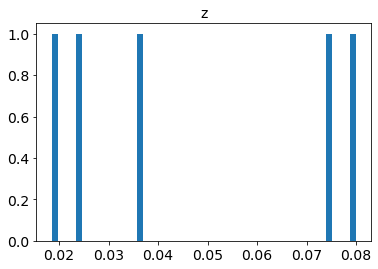

rango t0 : 58262.58921010841, 58328.83757713233
promedio t0 : 58291.0522631831
desviación estándar t0 : 24.255302878626125
mediana t0 : 58294.37301238494


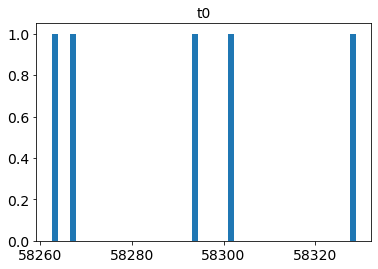

rango t0_err : 0.025695555450511165, 0.09095469986277749
promedio t0_err : 0.05137059241606039
desviación estándar t0_err : 0.023989216942473284
mediana t0_err : 0.05092957783563179


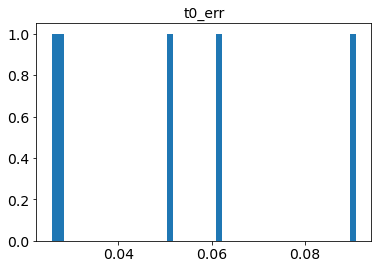

rango x0 : 0.0007342422139426602, 0.011205988295383962
promedio x0 : 0.0037498412162180494
desviación estándar x0 : 0.0038676003463662696
mediana x0 : 0.002375646517211747


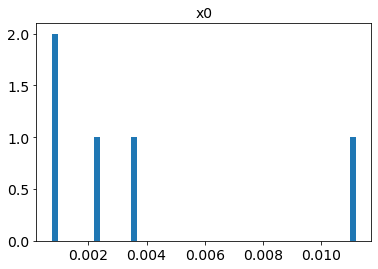

rango x0_err : 5.781193368124637e-06, 6.593178777172072e-05
promedio x0_err : 2.3286769171472046e-05
desviación estándar x0_err : 2.1774911244532975e-05
mediana x0_err : 1.52648689834302e-05


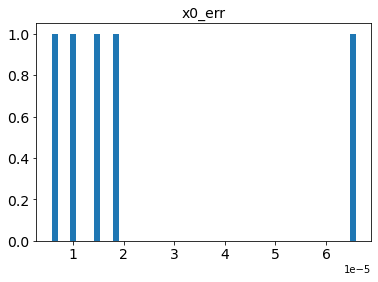

rango x1 : 0.7149390315350513, 2.315526983697362
promedio x1 : 1.2155804842662978
desviación estándar x1 : 0.5635928211300554
mediana x1 : 1.0320394698429758


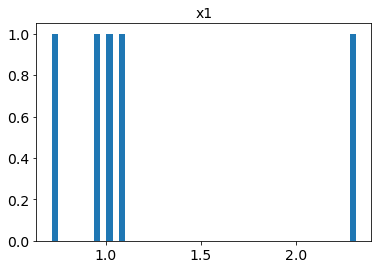

rango x1_err : 0.038482617569997074, 0.1593223840696108
promedio x1_err : 0.07774277846100923
desviación estándar x1_err : 0.044352675036330086
mediana x1_err : 0.061664442764141875


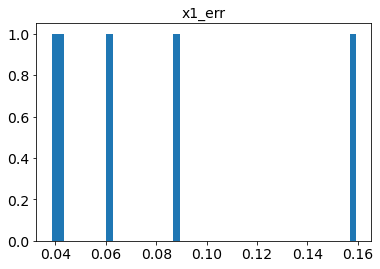

rango c : -0.03938766209509814, 0.6439813241957757
promedio c : 0.14336121480615788
desviación estándar c : 0.2602353092843585
mediana c : -0.015743882748322325


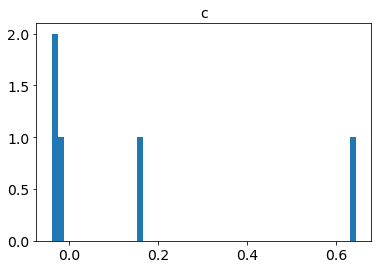

rango c_err : 0.005280728513751352, 0.01938488968702844
promedio c_err : 0.011647273126649559
desviación estándar c_err : 0.005332167460377245
mediana c_err : 0.009594291346630984


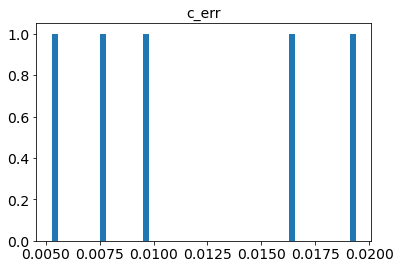

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


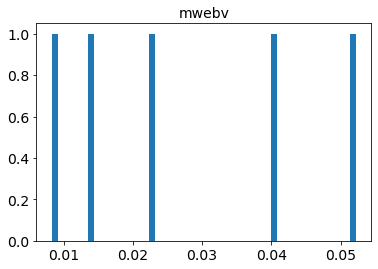

In [249]:
histogramas_estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa_cortes_t, 
                                    z_real=True, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 103, 121
promedio ncall : 114.33333333333333
desviación estándar ncall : 8.055363982396383
mediana ncall : 119.0


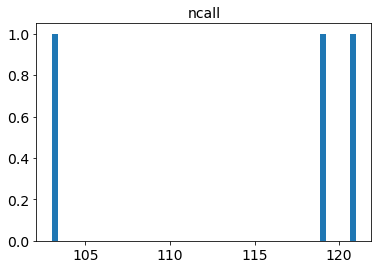

rango chisq : 1.3724525208077036, 935.5164111491221
promedio chisq : 326.206645456743
desviación estándar chisq : 431.1619939046688
mediana chisq : 41.731072700299194


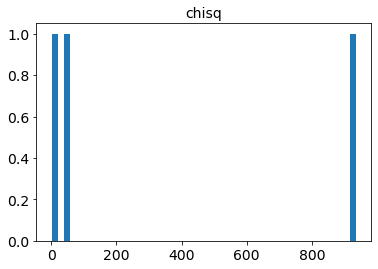

rango ndof : 4, 48
promedio ndof : 26.666666666666668
desviación estándar ndof : 17.98765008430939
mediana ndof : 28.0


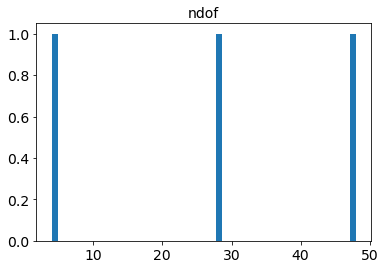

rango chisq/ndof : 0.3431131302019259, 33.41130039818293
promedio chisq/ndof : 11.541270292102586
desviación estándar chisq/ndof : 15.465939057600114
mediana chisq/ndof : 0.8693973479228999


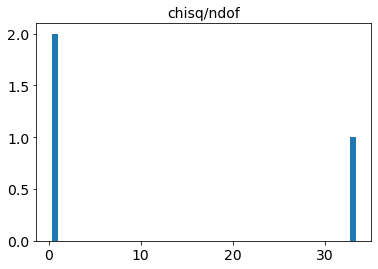

rango z : 0.0181, 0.12
promedio z : 0.06826666666666666
desviación estándar z : 0.04161524827378648
mediana z : 0.0667


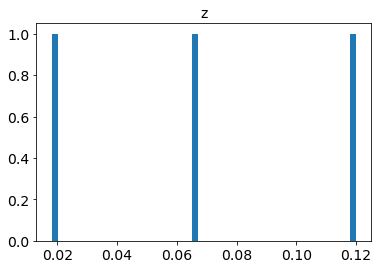

rango t0 : 58265.18405045947, 58363.841483883945
promedio t0 : 58309.863190658034
desviación estándar t0 : 40.80994958541096
mediana t0 : 58300.56403763068


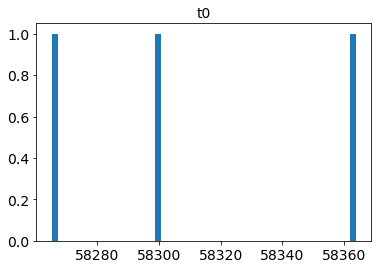

rango t0_err : 0.008852336690324591, 1.1017507151373138
promedio t0_err : 0.4009100919732494
desviación estándar t0_err : 0.4967339066513651
mediana t0_err : 0.09212722409210983


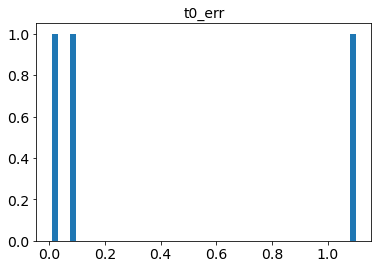

rango x0 : 0.00024111798977574528, 0.008563133443531379
promedio x0 : 0.0032422372722328307
desviación estándar x0 : 0.00377270980539975
mediana x0 : 0.0009224603833913691


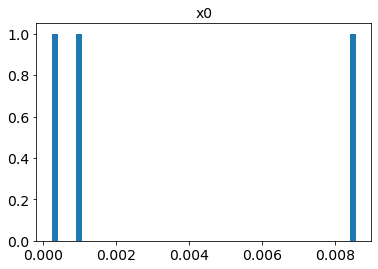

rango x0_err : 1.0134861162714028e-05, 3.741451111726936e-05
promedio x0_err : 2.1133976959712448e-05
desviación estándar x0_err : 1.1746342986512895e-05
mediana x0_err : 1.5852558599153952e-05


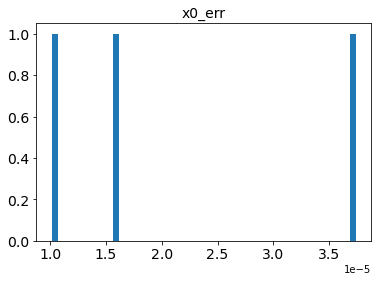

rango x1 : -1.3399160868990225, 0.7325140156167002
promedio x1 : -0.14630183528261323
desviación estándar x1 : 0.8748581436529631
mediana x1 : 0.16849656543448271


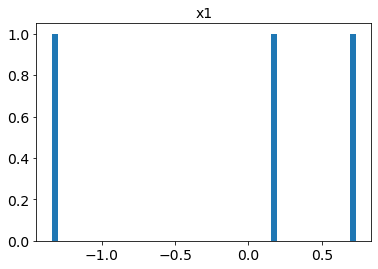

rango x1_err : 0.014895816279680505, 2.174432525459371
promedio x1_err : 0.7683729653911202
desviación estándar x1_err : 0.9950871157479346
mediana x1_err : 0.11579055443430927


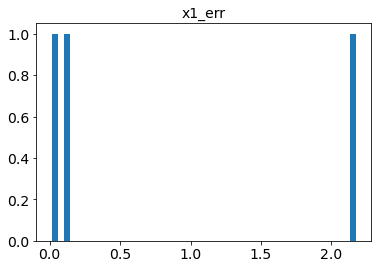

rango c : 0.024665803751682418, 0.14359257833750994
promedio c : 0.07631292091729387
desviación estándar c : 0.04979408709512896
mediana c : 0.060680380662689284


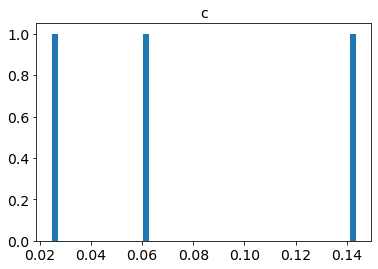

rango c_err : 0.002081287928363721, 0.13190022716449315
promedio c_err : 0.05012356132571528
desviación estándar c_err : 0.05811910856819575
mediana c_err : 0.01638916888428898


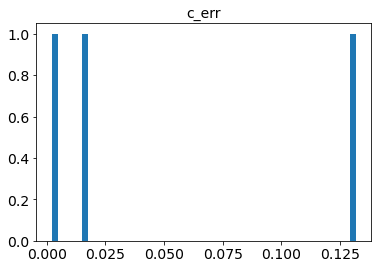

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


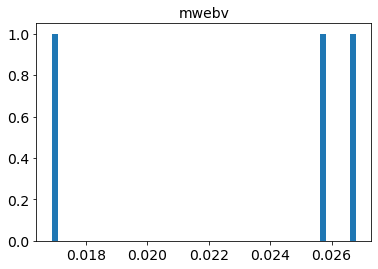

In [250]:
histogramas_estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa_cortes_t, 
                                    z_real=True, oids=Ia_tipo_no_especif)

Aquí vemos que el valor de $\frac{\chi^{2}}{ndof}$ disminuye mucho al utilizar para los ajustes solo las observaciones que están dentro del rango de tiempo del modelo. 

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [251]:
estadisticas_SALT3_z_fijo_cortes_t = estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa_cortes_t, 
                                                             z_real=True).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT3 y redshift real, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z_{real}$), ordenados según el valor de chisq/ndof

In [252]:
lista_oid_SALT3_z_fijo_cortes_t = list(estadisticas_SALT3_z_fijo_cortes_t['oid'])
lista_chisq_vs_ndof_SALT3_z_fijo_cortes_t = list(estadisticas_SALT3_z_fijo_cortes_t['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [253]:
median_chisq_vs_ndof_SALT3_z_fijo_cortes_t = np.median(np.array(estadisticas_SALT3_z_fijo_cortes_t['chisq/ndof']))
df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t = estadisticas_SALT3_z_fijo_cortes_t[estadisticas_SALT3_z_fijo_cortes_t['chisq/ndof'] > median_chisq_vs_ndof_SALT3_z_fijo_cortes_t].reset_index()
lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t = list(df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [254]:
display(df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t[['oid', 
                                                              'chisq/ndof',
                                                              'z',
                                                              't0', 
                                                              't0_err']])

,oid,chisq/ndof,z,t0,t0_err
0,ZTF18aaxrvzj,1.591053,0.1100,58286.011695,0.153579
1,ZTF18abkifng,1.604195,0.0880,58343.581778,0.170823
2,ZTF18abcsgvj,1.624596,0.0600,58303.515861,0.129176
3,ZTF18abpamut,1.742925,0.0720,58367.688928,0.147617
4,ZTF18absdgon,1.746921,0.0620,58375.934626,0.121366
5,ZTF18abtnlik,1.750879,0.0900,58379.084046,0.153028
6,ZTF18abdbuty,1.820153,0.0600,58307.994801,0.125981
7,ZTF18aazsabq,1.860961,0.0500,58293.972076,0.083865
8,ZTF18abclalx,1.905211,0.1000,58301.077940,0.187440
9,ZTF18abealop,1.924834,0.0666,58316.176128,0.189972


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT2 y $z_{real}$ variable antes y después de eliminar los puntos fuera del rango de tiempo del modelo

In [255]:
inter_oid_SALT3_z_fijo_sobre_mediana_cortes_t = np.intersect1d(np.array(lista_oid_SALT3_z_fijo_sobre_mediana),
                                                               np.array(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t))
print('Elementos comunes sobre la mediana de chisq/ndof : ',len(inter_oid_SALT3_z_fijo_sobre_mediana_cortes_t))

Elementos comunes sobre la mediana de chisq/ndof :  39


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [256]:
table_early_SNIa_SALT3_z_fijo_cortes_t = astropy_table_detections(df_meta_early_SNIa, 
                                                                  detect_early_SNIa_cortes_t_SALT3_z_fijo)

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ===== Ajuste con redshift real ====
chisq/ndof :  0.3431131302019259


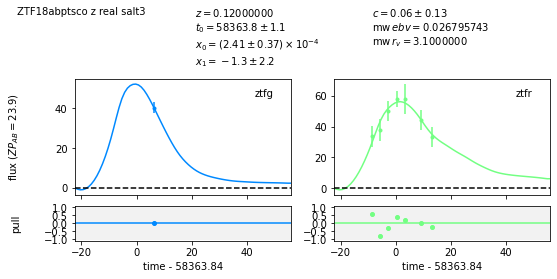

In [257]:
ajuste(lista_oid_SALT3_z_fijo_cortes_t[0], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_t[0])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.5850638241331344


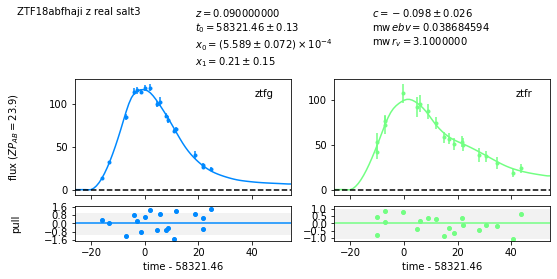

In [258]:
ajuste(lista_oid_SALT3_z_fijo_cortes_t[4], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_t[4])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.8797551096855601


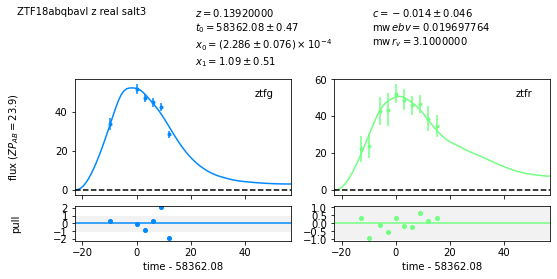

In [259]:
ajuste(lista_oid_SALT3_z_fijo_cortes_t[17], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_t[17])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.8855314036449186


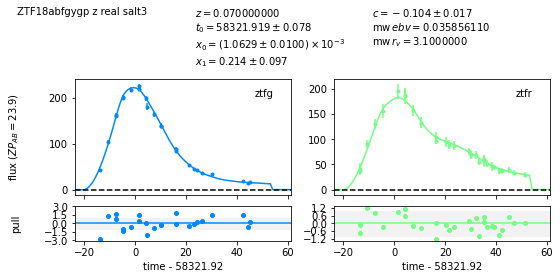

In [260]:
ajuste(lista_oid_SALT3_z_fijo_cortes_t[19], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_t[19])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.1116657835957424


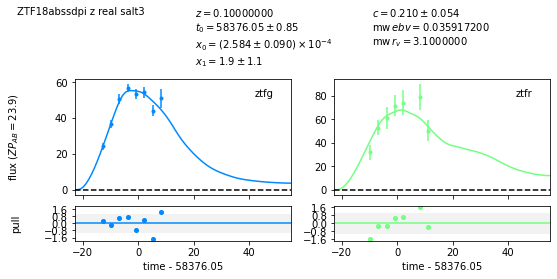

In [261]:
ajuste(lista_oid_SALT3_z_fijo_cortes_t[24], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_t[24])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.421180707056576


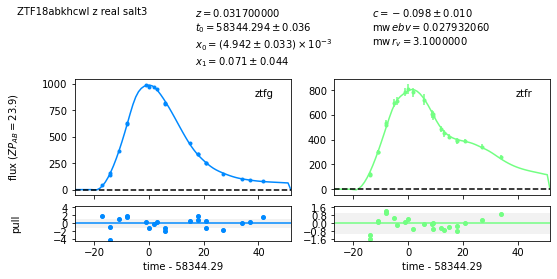

In [262]:
ajuste(lista_oid_SALT3_z_fijo_cortes_t[33], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_t[33])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.5189389899117554


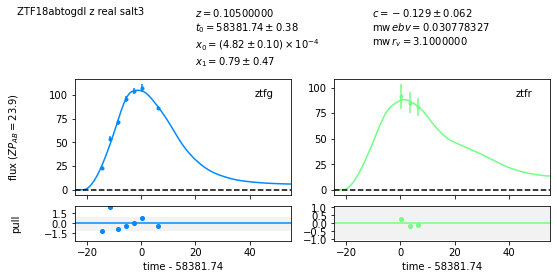

In [263]:
ajuste(lista_oid_SALT3_z_fijo_cortes_t[39], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_t[39])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.5806166660554901


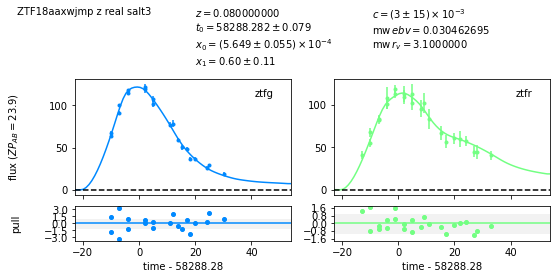

In [264]:
ajuste(lista_oid_SALT3_z_fijo_cortes_t[41], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_t[41])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ mayores a la mediana.

 ===== Ajuste con redshift real ====
chisq/ndof :  1.5910532615905575


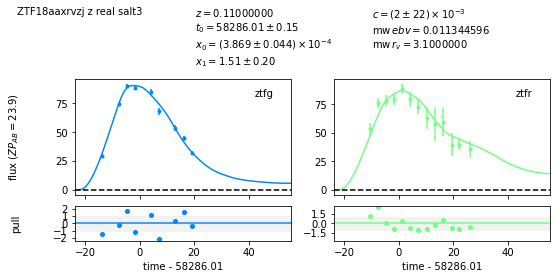

In [265]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[0], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][0])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.8609612076132915


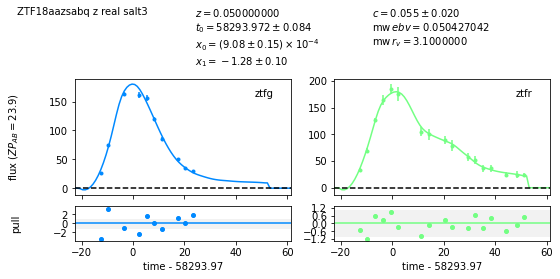

In [266]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[7], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][7])

 ===== Ajuste con redshift real ====
chisq/ndof :  2.071908764523922


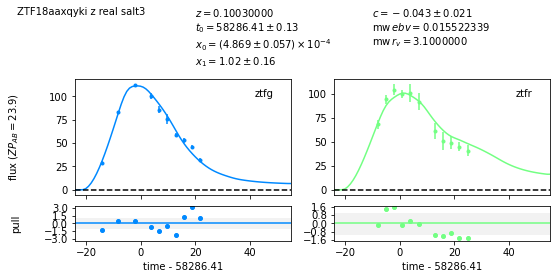

In [267]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[11], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][11])

 ===== Ajuste con redshift real ====
chisq/ndof :  2.1725461680813276


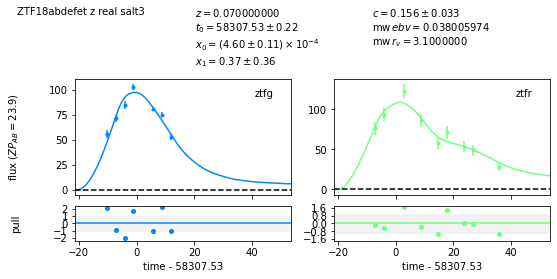

In [268]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[13], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][13])

 ===== Ajuste con redshift real ====
chisq/ndof :  2.8563470632003916


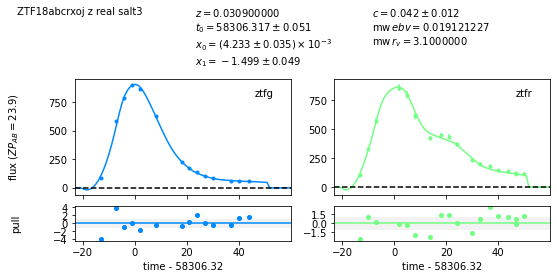

In [269]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[17], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][17])

 ===== Ajuste con redshift real ====
chisq/ndof :  3.092939630447042


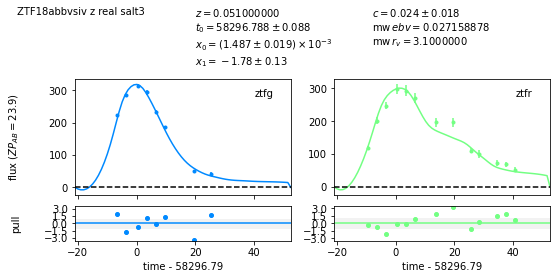

In [270]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[18], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][18])

 ===== Ajuste con redshift real ====
chisq/ndof :  3.1011076321617876


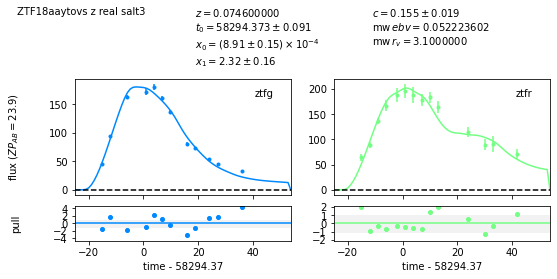

In [271]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[20], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][20])

 ===== Ajuste con redshift real ====
chisq/ndof :  3.161346837994085


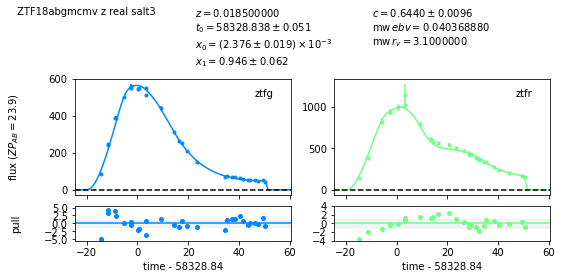

In [272]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[22], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][22])

 ===== Ajuste con redshift real ====
chisq/ndof :  27.758131529006537


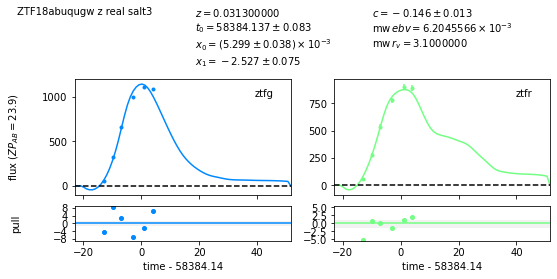

In [273]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[40], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][40])

 ===== Ajuste con redshift real ====
chisq/ndof :  33.41130039818293


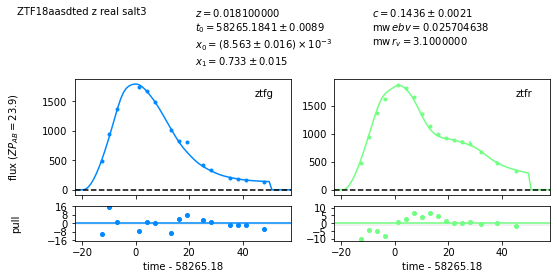

In [274]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_t[41], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_t, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_t['chisq/ndof'][41])

### Ajuste con redshift variable

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el primer ajuste con el modelo SALT3 y redshift variable

In [275]:
detect_early_SNIa_sin_SN52_cortes_t = cortes_t_modelo(trest_min_modelo, 
                                                      trest_max_modelo, 
                                                      detect_early_SNIa_sin_SN52,
                                                     estadisticas_SALT3_z_var)

Ajuste con las detecciones de las SN que están dentro del rango de tiempo del modelo

In [276]:
ajustes_SALT3_early_SNIa_sin_SN52_cortes_t = modelo_ajustado_y_resultados('salt3', 
                                                                          df_meta_early_SNIa_sin_SN52, 
                                                                          detect_early_SNIa_sin_SN52_cortes_t,
                                                                          print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 149, 1379
promedio ncall : 371.2763157894737
desviación estándar ncall : 215.99558954343505
mediana ncall : 289.0


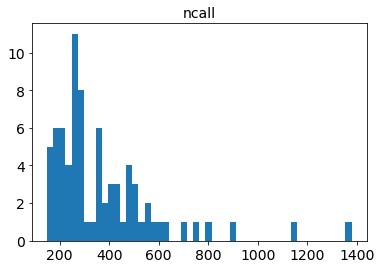

rango chisq : 4.863277827350304, 1805.2397558561593
promedio chisq : 118.53662135963273
desviación estándar chisq : 268.7163684503661
mediana chisq : 29.847513970709677


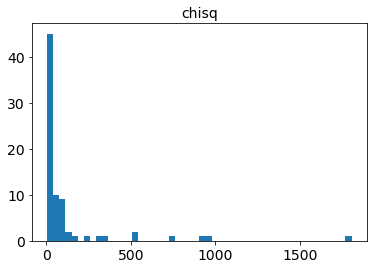

rango ndof : 5, 59
promedio ndof : 20.36842105263158
desviación estándar ndof : 11.611974428946361
mediana ndof : 17.0


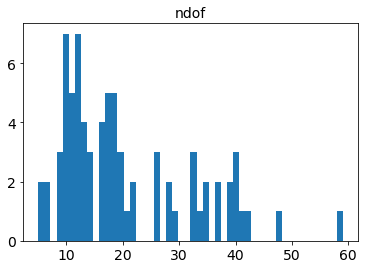

rango chisq/ndof : 0.4772206745634247, 44.0302379477112
promedio chisq/ndof : 4.428405613747168
desviación estándar chisq/ndof : 7.061723564365128
mediana chisq/ndof : 1.7644566121882257


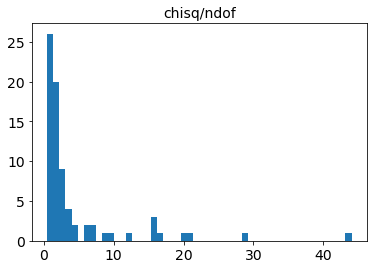

rango z : 0.0010000000002969996, 0.3137887364909378
promedio z : 0.1650110136106239
desviación estándar z : 0.09282261414895654
mediana z : 0.16678950816107238


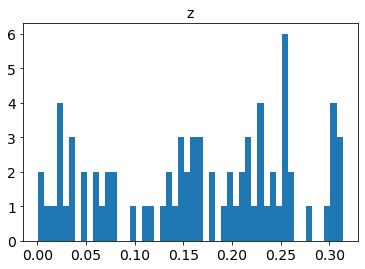

rango z_err : 2.137162669058057e-10, 0.40590237372824345
promedio z_err : 0.03275816118866766
desviación estándar z_err : 0.06456873323422427
mediana z_err : 0.017542777675018148


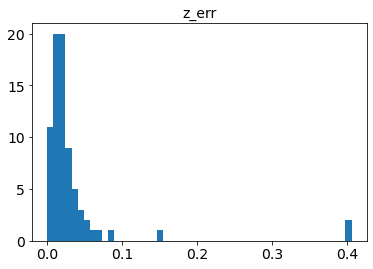

rango t0 : 58256.76099932384, 58395.08339788103
promedio t0 : 58322.95973793226
desviación estándar t0 : 38.56512000039987
mediana t0 : 58318.488651063744


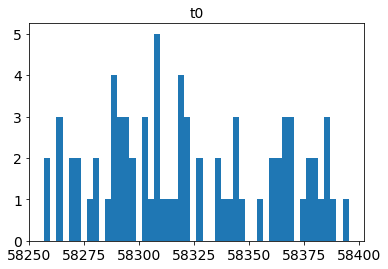

rango t0_err : 5.602487362921238e-10, 122.65784992303452
promedio t0_err : 3.4554098828181705
desviación estándar t0_err : 19.19918027447892
mediana t0_err : 0.22962777099382947


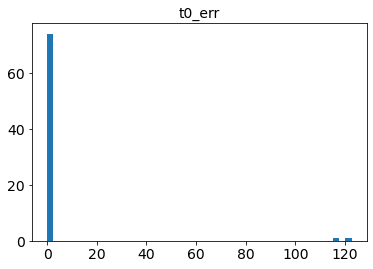

rango x0 : 0.00022795865919194336, 0.00538252213725283
promedio x0 : 0.0010761518564079428
desviación estándar x0 : 0.001117402362928865
mediana x0 : 0.0006573318115688581


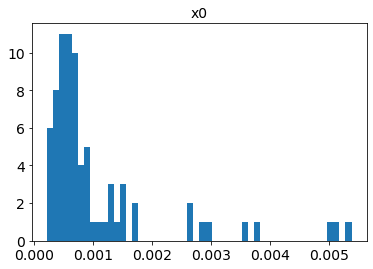

rango x0_err : 5.8647997696926295e-06, 1.0175138843689064
promedio x0_err : 0.039722542715812305
desviación estándar x0_err : 0.19585913394139817
mediana x0_err : 1.4806433658105079e-05


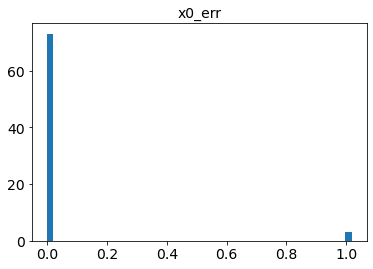

rango x1 : -2.2318680748604987, 3.9999999532332513
promedio x1 : 0.03098818303665975
desviación estándar x1 : 1.2152967810671582
mediana x1 : 0.11479869590175085


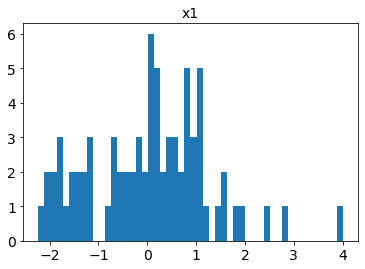

rango x1_err : 0.013075263987949892, 5.900043674893869
promedio x1_err : 0.4748301778928525
desviación estándar x1_err : 1.0918340739473285
mediana x1_err : 0.20995472086804134


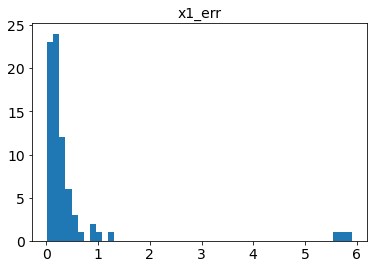

rango c : -0.3506298480117703, 0.2723707852536782
promedio c : -0.0781141198828047
desviación estándar c : 0.12186964947007241
mediana c : -0.0829594368750751


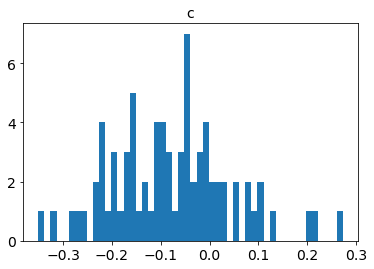

rango c_err : 0.003850422146566654, 0.5757435139722138
promedio c_err : 0.05420049573150489
desviación estándar c_err : 0.09645162564478875
mediana c_err : 0.032368098370969794


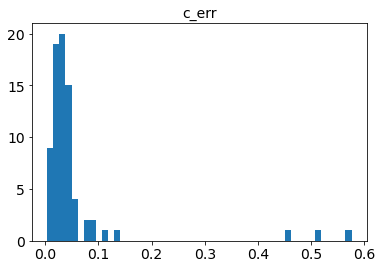

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


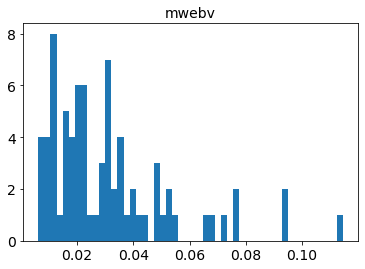

In [277]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52_cortes_t, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 204, 356
promedio ncall : 281.25
desviación estándar ncall : 59.326954245098406
mediana ncall : 282.5


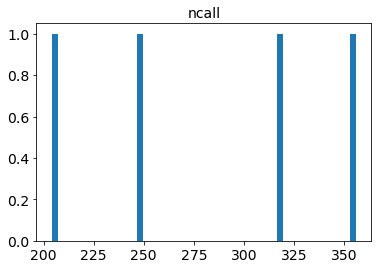

rango chisq : 110.94114633398105, 450.91573554001843
promedio chisq : 257.2519247511199
desviación estándar chisq : 139.4859944252376
mediana chisq : 233.57540856524002


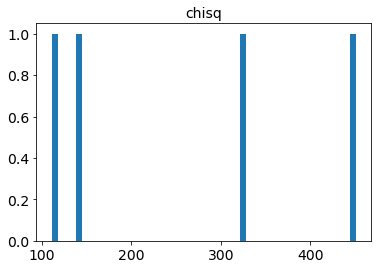

rango ndof : 15, 33
promedio ndof : 25.0
desviación estándar ndof : 6.59545297913646
mediana ndof : 26.0


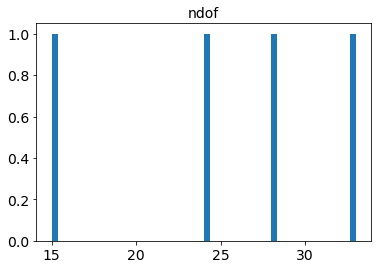

rango chisq/ndof : 5.802399755880406, 16.104133412143515
promedio chisq/ndof : 9.80969196567347
desviación estándar chisq/ndof : 3.921731686889967
mediana chisq/ndof : 8.666117347334978


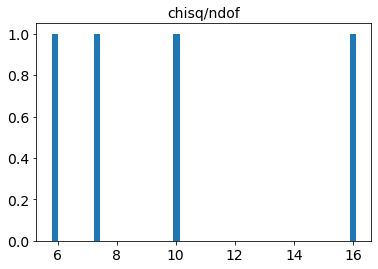

rango z : 0.013253801223405502, 0.3398382504375163
promedio z : 0.18404082508173472
desviación estándar z : 0.12147734114031782
mediana z : 0.19153562433300853


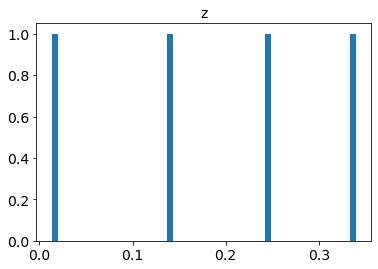

rango z_err : 0.0019385748843361063, 0.011297533234173929
promedio z_err : 0.006312205888678636
desviación estándar z_err : 0.0036609064098783732
mediana z_err : 0.006006357718102255


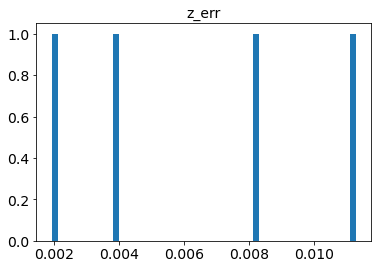

rango t0 : 58264.28481282658, 58301.9570114116
promedio t0 : 58282.85346916152
desviación estándar t0 : 16.94046468161028
mediana t0 : 58282.586026203935


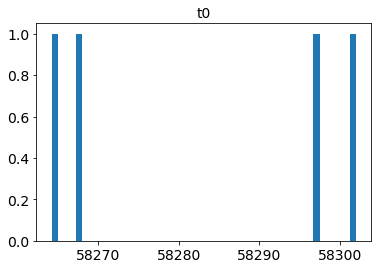

rango t0_err : 0.029641525252372958, 0.2220452384208329
promedio t0_err : 0.10136577891626075
desviación estándar t0_err : 0.07347516342739562
mediana t0_err : 0.07688817599591857


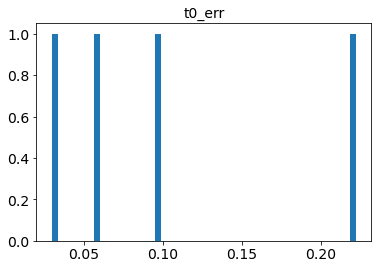

rango x0 : 0.000646703505458106, 0.011421426616418486
promedio x0 : 0.004034494452455265
desviación estándar x0 : 0.004384040948163805
mediana x0 : 0.0020349238439722334


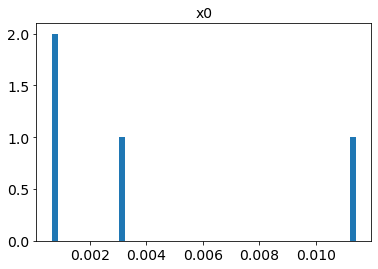

rango x0_err : 1.0219233223217531e-05, 8.006149488740923e-05
promedio x0_err : 3.181816985330189e-05
desviación estándar x0_err : 2.8080330166653046e-05
mediana x0_err : 1.8495975651290388e-05


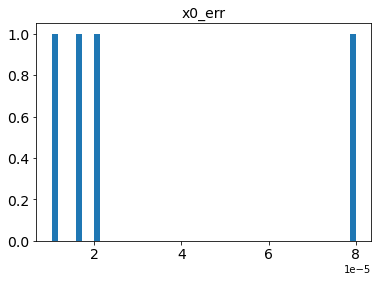

rango x1 : 0.43215027871152234, 2.2657449716891396
promedio x1 : 1.0864158263118706
desviación estándar x1 : 0.7013364012485923
mediana x1 : 0.8238840274234103


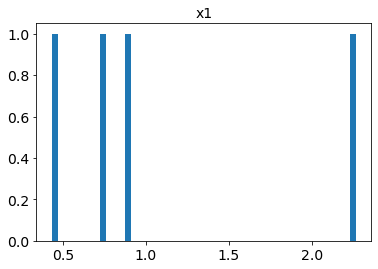

rango x1_err : 0.0373913264873873, 0.21892392014079531
promedio x1_err : 0.10040423720386926
desviación estándar x1_err : 0.07120377012302898
mediana x1_err : 0.07265085109364722


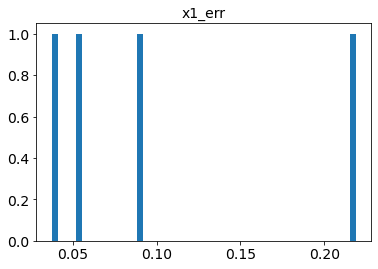

rango c : -0.21287693138134314, -0.003430337471452438
promedio c : -0.12958373473894552
desviación estándar c : 0.07708912816675811
mediana c : -0.15101383505149324


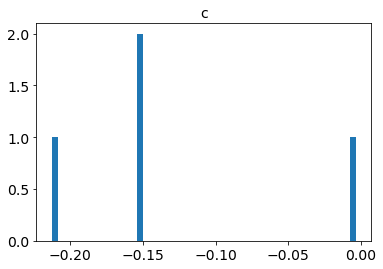

rango c_err : 0.0049756863118602945, 0.022971098380945146
promedio c_err : 0.014344349845392054
desviación estándar c_err : 0.007586017268629605
mediana c_err : 0.014715307344381388


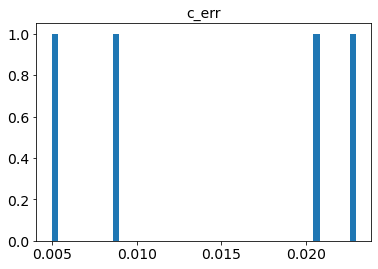

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02440207828578341
desviación estándar mwebv : 0.01691663733240622
mediana mwebv : 0.01854796664576526


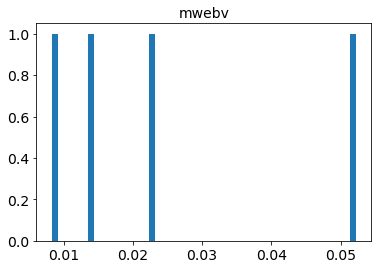

In [278]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52_cortes_t, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 191, 596
promedio ncall : 440.3333333333333
desviación estándar ncall : 178.11294793535427
mediana ncall : 534.0


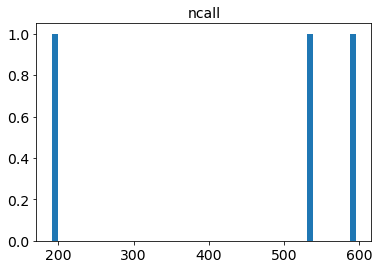

rango chisq : 1.4803418175203376, 8757.093751008098
promedio chisq : 2956.8170645887553
desviación estándar chisq : 4101.662597075405
mediana chisq : 111.87710094064909


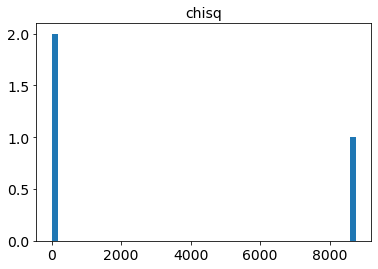

rango ndof : 3, 50
promedio ndof : 29.666666666666668
desviación estándar ndof : 19.70335560817553
mediana ndof : 36.0


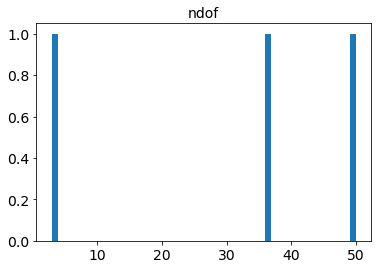

rango chisq/ndof : 0.49344727250677917, 243.2526041946694
promedio chisq/ndof : 81.99453116199639
desviación estándar chisq/ndof : 114.02890000720343
mediana chisq/ndof : 2.2375420188129818


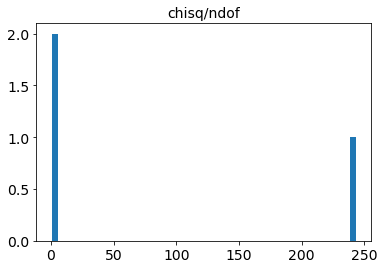

rango z : 0.2568903580903035, 0.27744243656167916
promedio z : 0.2697486592477436
desviación estándar z : 0.009150636126193287
mediana z : 0.2749131830912481


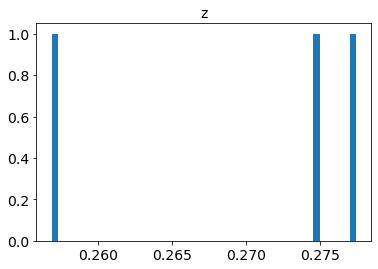

rango z_err : 2.2231672058836693e-10, 0.31420236792366296
promedio z_err : 0.1471121287362636
desviación estándar z_err : 0.1290481193117346
mediana z_err : 0.1271340180628111


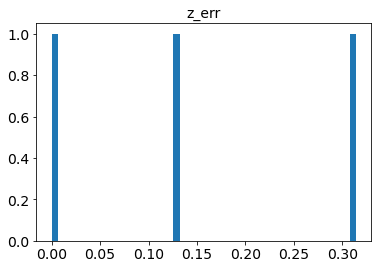

rango t0 : 58267.53371575701, 58364.092301232384
promedio t0 : 58311.308482301894
desviación estándar t0 : 39.93129412642106
mediana t0 : 58302.2994299163


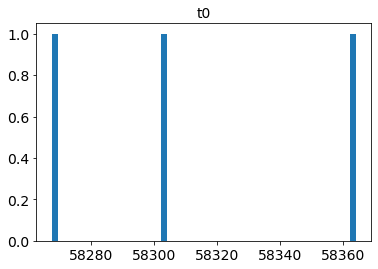

rango t0_err : 8.074923243839294e-06, 2.096757954579516
promedio t0_err : 0.6989306610715479
desviación estándar t0_err : 0.9884131581940727
mediana t0_err : 2.5953711883630604e-05


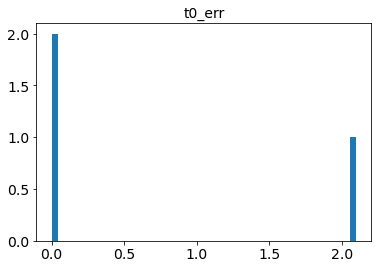

rango x0 : 0.0002565969937892909, 0.007498016341000906
promedio x0 : 0.0028618058059408685
desviación estándar x0 : 0.003286666450918065
mediana x0 : 0.0008308040830324084


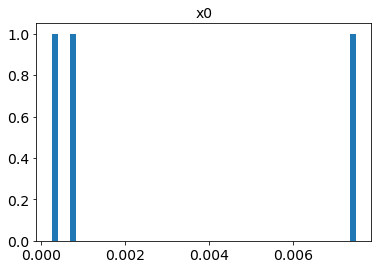

rango x0_err : 1.0451301336220268e-05, 4.302916800836718e-05
promedio x0_err : 2.2782063010661633e-05
desviación estándar x0_err : 1.442984679835253e-05
mediana x0_err : 1.4865719687397458e-05


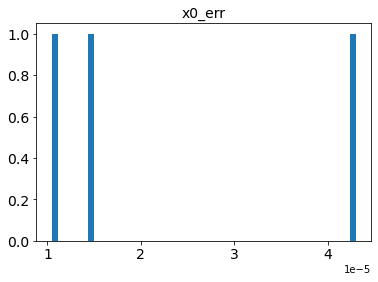

rango x1 : -2.5865571708243507, 0.2833680402507639
promedio x1 : -0.7287836490314107
desviación estándar x1 : 1.3154023191924424
mediana x1 : 0.11683818347935482


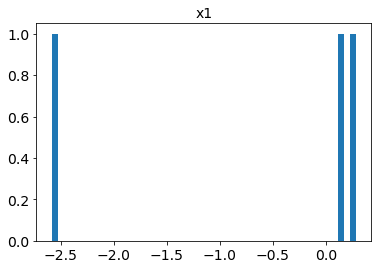

rango x1_err : 0.011045039694947523, 1.7884604736473213
promedio x1_err : 0.6250067389648832
desviación estándar x1_err : 0.8231069306594202
mediana x1_err : 0.07551470355238088


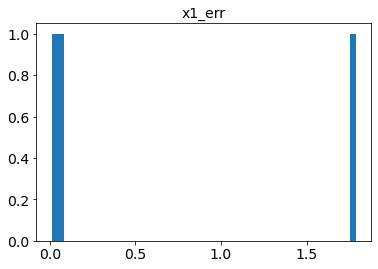

rango c : -0.2803902021421485, -0.17777573619455966
promedio c : -0.22068414342148102
desviación estándar c : 0.043543487666211196
mediana c : -0.20388649192773492


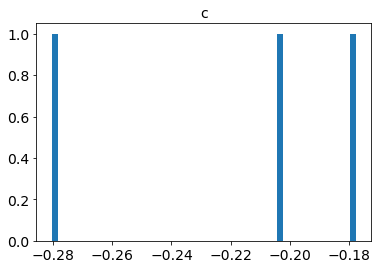

rango c_err : 0.0016254287609830803, 0.15880576579460273
promedio c_err : 0.054126536528962564
desviación estándar c_err : 0.07401951030986828
mediana c_err : 0.0019484150313018728


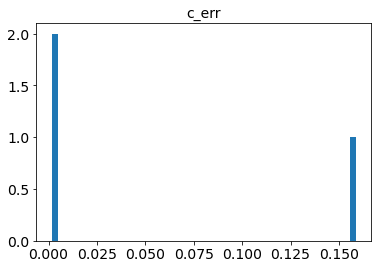

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


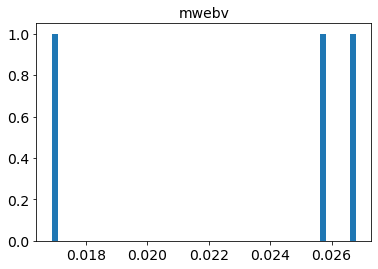

In [279]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52_cortes_t, oids=Ia_tipo_no_especif)

Aquí vemos que el valor de $\frac{\chi^{2}}{ndof}$ disminuye un poco al utilizar para los ajustes solo las observaciones que están dentro del rango de tiempo del modelo. 

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [280]:
estadisticas_SALT3_z_var_cortes_t = estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52_cortes_t).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT3 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ y $z$ del primer ajuste), ordenados según el valor de chisq/ndof

In [281]:
lista_oid_SALT3_z_var_cortes_t = list(estadisticas_SALT3_z_var_cortes_t['oid'])
lista_chisq_vs_ndof_SALT3_z_var_cortes_t = list(estadisticas_SALT3_z_var_cortes_t['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [282]:
median_chisq_vs_ndof_SALT3_z_var_cortes_t = np.median(np.array(estadisticas_SALT3_z_var_cortes_t['chisq/ndof']))
df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t = estadisticas_SALT3_z_var_cortes_t[estadisticas_SALT3_z_var_cortes_t['chisq/ndof'] > median_chisq_vs_ndof_SALT3_z_var_cortes_t].reset_index()
lista_oid_SALT3_z_var_sobre_mediana_cortes_t = list(df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [283]:
display(df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t[['oid', 
                                                             'chisq/ndof',
                                                             'z', 
                                                             'z_err', 
                                                             't0', 
                                                             't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
0,ZTF18abckujg,1.878410,0.028785,9.639951e-03,58302.911508,2.376389e-01
1,ZTF18aazjztm,1.970341,0.301664,1.897528e-02,58293.197921,2.571549e-01
2,ZTF18abtnlik,2.035663,0.263541,2.632175e-02,58380.518237,2.933191e-01
3,ZTF18abimsyv,2.178769,0.240571,9.676009e-03,58336.302540,1.965998e-01
4,ZTF18aaxwjmp,2.218599,0.302822,1.513047e-02,58290.293653,2.098405e-01
5,ZTF18abbpeqo,2.237542,0.256890,3.142024e-01,58302.299430,2.595371e-05
6,ZTF18abclalx,2.266776,0.261197,2.244619e-02,58302.393653,2.972257e-01
7,ZTF18abetewu,2.304188,0.069200,2.146927e-02,58318.796142,1.984565e-01
8,ZTF18abbvsiv,2.438346,0.209085,1.003238e-02,58297.858941,1.659674e-01
9,ZTF18abdefet,2.503095,0.156539,3.569423e-02,58307.885729,2.591158e-01


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT3 y $z$ variable antes y después de eliminar los puntos fuera del rango de tiempo del modelo

In [284]:
inter_oid_SALT3_z_var_sobre_mediana_cortes_t = np.intersect1d(np.array(lista_oid_SALT3_z_var_sobre_mediana),
                                                              np.array(lista_oid_SALT3_z_var_sobre_mediana_cortes_t))
print('Elementos comunes sobre la mediana de chisq/ndof : ',len(inter_oid_SALT3_z_var_sobre_mediana_cortes_t))

Elementos comunes sobre la mediana de chisq/ndof :  40


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [285]:
table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t = astropy_table_detections(df_meta_early_SNIa_sin_SN52,
                                                                          detect_early_SNIa_sin_SN52_cortes_t)

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  0.4772206745634247


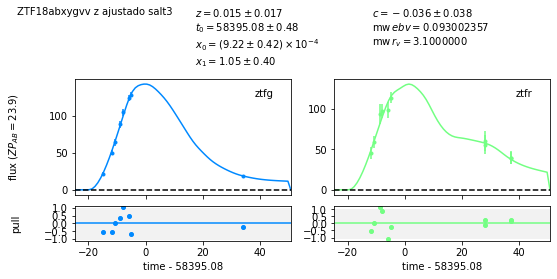

In [286]:
ajuste(lista_oid_SALT3_z_var_cortes_t[0], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_t[0])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.49344727250677917


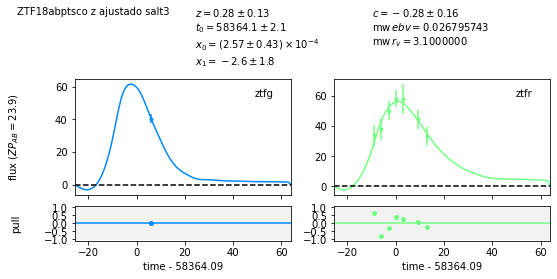

In [287]:
ajuste(lista_oid_SALT3_z_var_cortes_t[1], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_t[1])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.5569357112573126


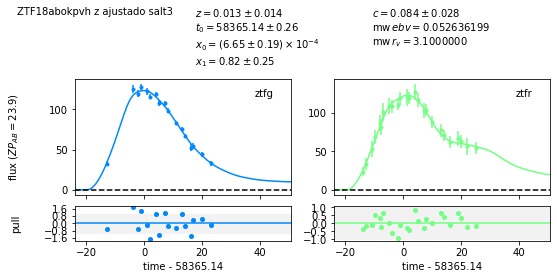

In [288]:
ajuste(lista_oid_SALT3_z_var_cortes_t[6], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_t[6])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.954616458439399


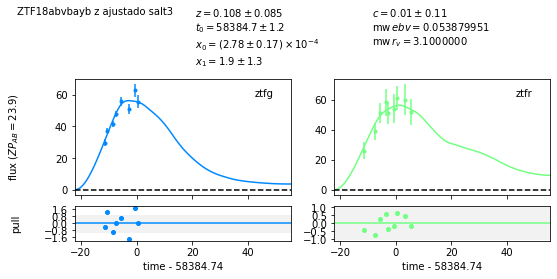

In [289]:
ajuste(lista_oid_SALT3_z_var_cortes_t[14], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_t[14])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.0661139574277532


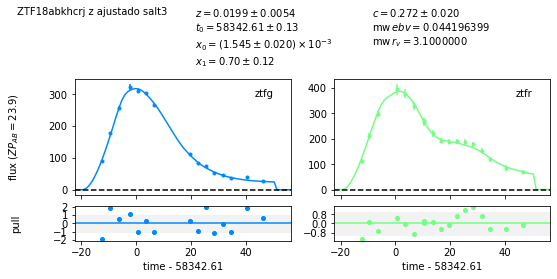

In [290]:
ajuste(lista_oid_SALT3_z_var_cortes_t[17], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_t[17])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.4476431809725094


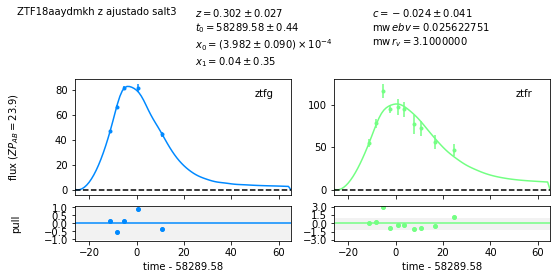

In [291]:
ajuste(lista_oid_SALT3_z_var_cortes_t[28], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_t[28])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.6230128415402219


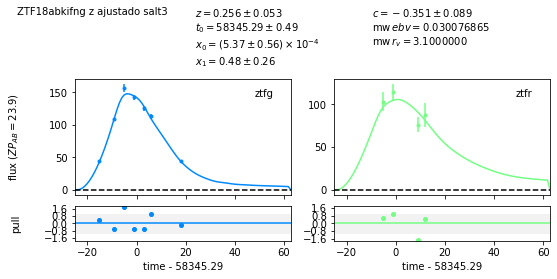

In [292]:
ajuste(lista_oid_SALT3_z_var_cortes_t[34], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_t[34])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.8757222060033736


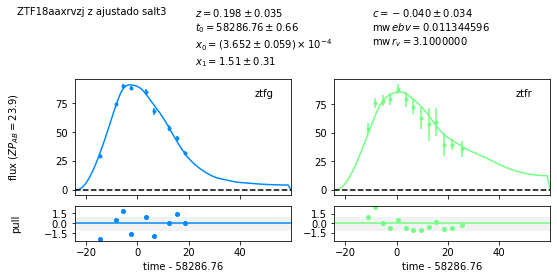

In [293]:
ajuste(lista_oid_SALT3_z_var_cortes_t[41], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_t[41])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  1.8784104405068656


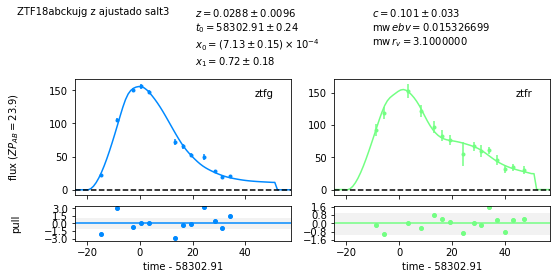

In [294]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_t[0], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t['chisq/ndof'][0])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.3041878461086616


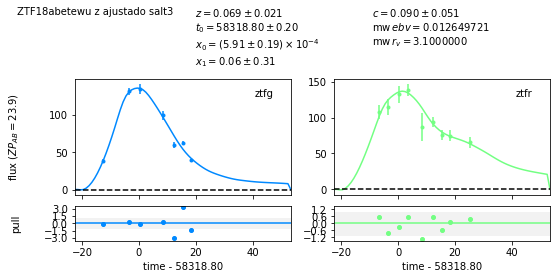

In [295]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_t[7], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t['chisq/ndof'][7])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.971723323648


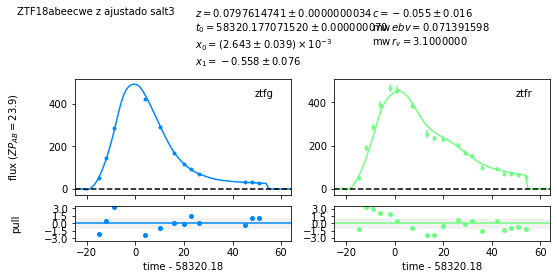

In [296]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_t[14], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t['chisq/ndof'][14])

 ==== Con ajuste del redshift ====
chisq/ndof :  5.802399755880406


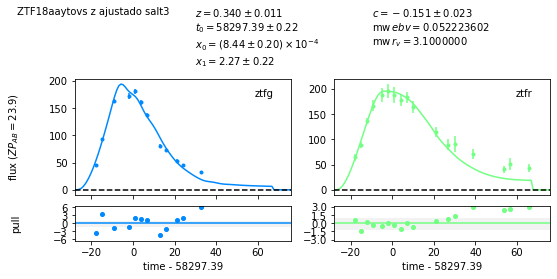

In [297]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_t[21], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t['chisq/ndof'][21])

 ==== Con ajuste del redshift ====
chisq/ndof :  16.3147752411403


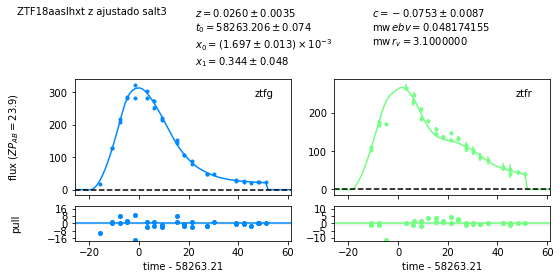

In [298]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_t[35], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t['chisq/ndof'][35])

 ==== Con ajuste del redshift ====
chisq/ndof :  19.78867410921886


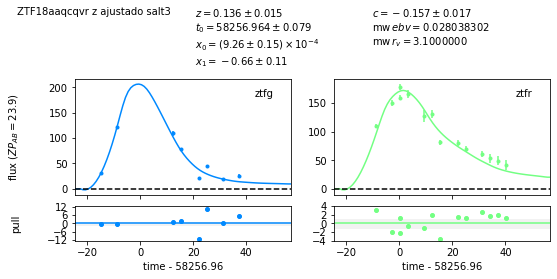

In [299]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_t[36], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t['chisq/ndof'][36])

 ==== Con ajuste del redshift ====
chisq/ndof :  20.968158645726664


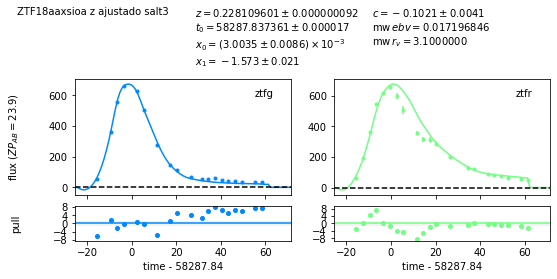

In [300]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_t[37], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t['chisq/ndof'][37])

 ==== Con ajuste del redshift ====
chisq/ndof :  44.0302379477112


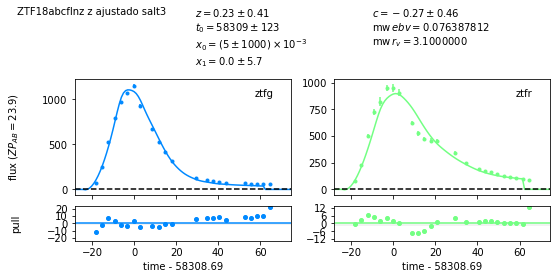

In [301]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_t[39], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_t)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_t['chisq/ndof'][39])

Se observa que al hacer este mismo ajuste pero con el modelo SALT2, SALT2 deja más observaciones fuera del rango de tiempo del modelo (1 en $g$ y 2 en $r$) que SALT3 (1 en $g$ y 1 en $r$), pero SALT2 se ajusta mejor a la forma de la curva de luz que SALT3

Aquí vemos que aún hay observaciones que están fuera del rango del modelo pese a que se hayan descartados las observaciones fuera del rango del modelo del obtenido a partir de los parámetros $t_0$ y $z$ del primer ajuste. Esto se debe a que los parámetros $t_0$ y $z$ pueden cambiar al hacer un nuevo ajuste. En particular, si el $z$ obtenido en el segundo ajuste es menor que el del primer ajuste y/o el valor de $t_0$ cambia puede pasar que puntos que estaban dentro del rango de tiempo del modelo en el primer ajuste, ya no lo estén.

Por lo anterior, ahora se hará el ajuste considerando solo las observaciones que están dentro del rango del modelo, como si este estuviese en el sistema de referencia en reposo (en el cual $z=0$) y considerando como correcto el valor de $t_0$ del primer ajuste. 

## Ajuste con observaciones en el rango de tiempo del modelo como si estuviese en el sistema de referencia en reposo (determinado con $t_0$ del primer ajuste)

### Ajuste con redshift real 

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el primer ajuste de $t_0$ con el modelo SALT3 y $z=0$, pero utilizando el redshift real para el siguiente ajuste.

In [302]:
detect_early_SNIa_cortes_trest_SALT3_z_fijo = cortes_trest_modelo(trest_min_modelo, 
                                                                  trest_max_modelo, 
                                                                  detect_early_SNIa,
                                                                  estadisticas_SALT3_z_fijo)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo, determinado con $z=0$ y $t_0$ del primer ajuste

In [303]:
ajustes_SALT3_z_fijo_early_SNIa_cortes_trest = modelo_ajustado_y_resultados('salt3',
                                                                            df_meta_early_SNIa,
                                                                            detect_early_SNIa_cortes_trest_SALT3_z_fijo,  
                                                                            z_real=True,
                                                                            print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 89, 156
promedio ncall : 105.07894736842105
desviación estándar ncall : 12.594655464139851
mediana ncall : 101.5


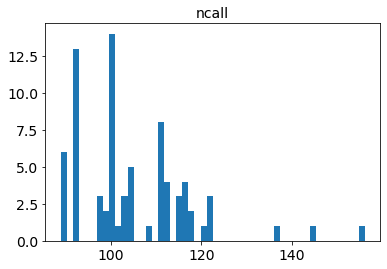

rango chisq : 4.975137305253083, 987.283129096583
promedio chisq : 61.06927173811297
desviación estándar chisq : 120.76891797664798
mediana chisq : 30.27681080682779


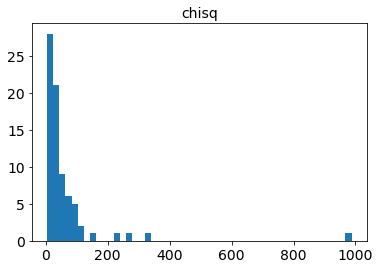

rango ndof : 6, 58
promedio ndof : 20.69736842105263
desviación estándar ndof : 10.919586141234698
mediana ndof : 17.5


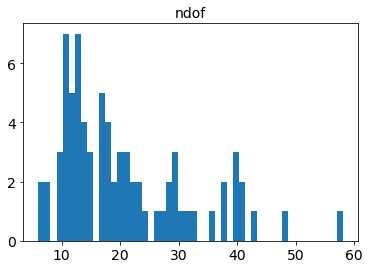

rango chisq/ndof : 0.4911398875281123, 27.758131529006537
promedio chisq/ndof : 2.7849787117618563
desviación estándar chisq/ndof : 4.131888319619962
mediana chisq/ndof : 1.5397170675187266


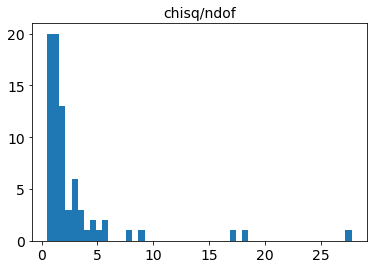

rango z : 0.0269, 0.14
promedio z : 0.07240263157894737
desviación estándar z : 0.024863225717408274
mediana z : 0.0718


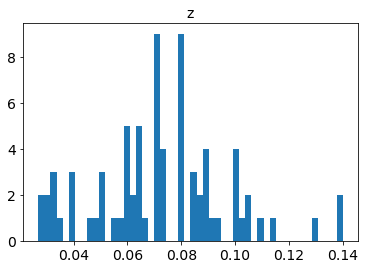

rango t0 : 58254.61862931233, 58395.71445713421
promedio t0 : 58322.137651794335
desviación estándar t0 : 38.6286081275405
mediana t0 : 58317.36017595416


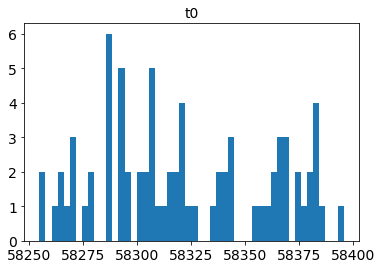

rango t0_err : 0.02317759870129521, 1.140970089356415
promedio t0_err : 0.17561644175130872
desviación estándar t0_err : 0.17820032318436613
mediana t0_err : 0.12889590969098208


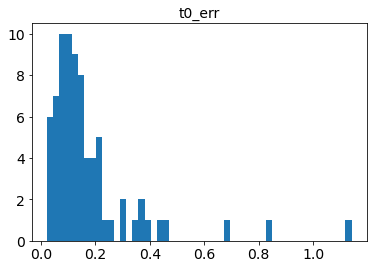

rango x0 : 0.00022861361160102106, 0.0063947076586478285
promedio x0 : 0.001137174182415471
desviación estándar x0 : 0.0012233788378959106
mediana x0 : 0.0006769947215276302


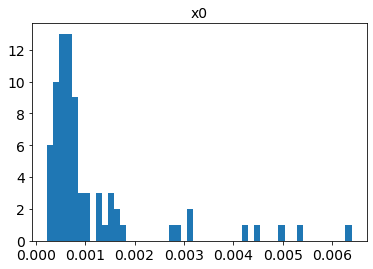

rango x0_err : 4.16418186005795e-06, 4.967284352223887e-05
promedio x0_err : 1.3353117730119088e-05
desviación estándar x0_err : 8.997357351074388e-06
mediana x0_err : 1.017770510325743e-05


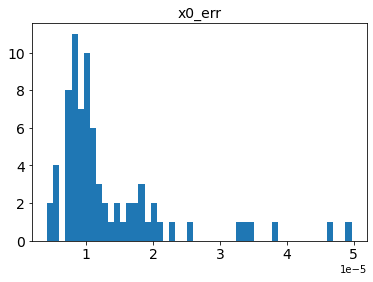

rango x1 : -2.5268717825467966, 2.4762138017941413
promedio x1 : -0.005112635940401767
desviación estándar x1 : 1.0846312295520166
mediana x1 : 0.20077678730206472


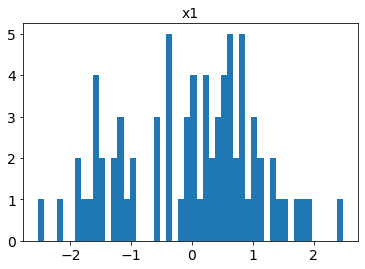

rango x1_err : 0.02971894468700055, 1.2134104320691241
promedio x1_err : 0.22254739618734307
desviación estándar x1_err : 0.20411802029943357
mediana x1_err : 0.1655145200526803


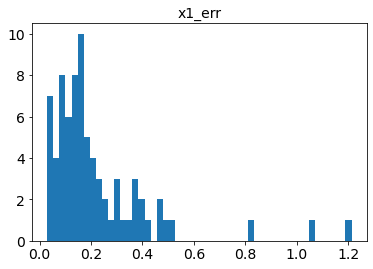

rango c : -0.18078217842949446, 0.3114290888790179
promedio c : 0.006969883663290668
desviación estándar c : 0.09999531337439511
mediana c : 0.002346018242907268


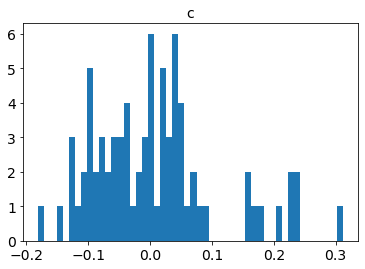

rango c_err : 0.004569351098168988, 0.06240814663034827
promedio c_err : 0.02497207877220339
desviación estándar c_err : 0.011991259754205716
mediana c_err : 0.022331815737664948


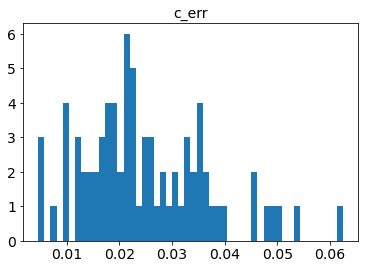

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


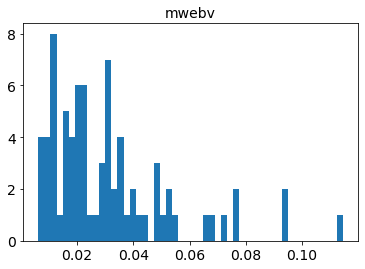

In [304]:
histogramas_estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa_cortes_trest, 
                                    z_real=True, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 98, 154
promedio ncall : 126.6
desviación estándar ncall : 21.758676430334635
mediana ncall : 117.0


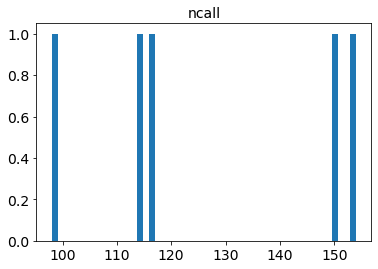

rango chisq : 68.22436790755933, 364.73010339268626
promedio chisq : 167.0861542285827
desviación estándar chisq : 105.06046139187522
mediana chisq : 146.40727321986873


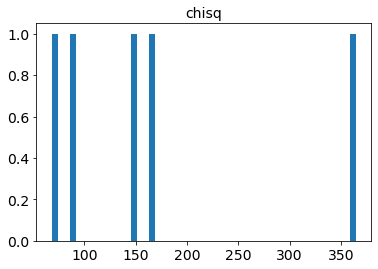

rango ndof : 16, 51
promedio ndof : 29.6
desviación estándar ndof : 12.043255373859678
mediana ndof : 26.0


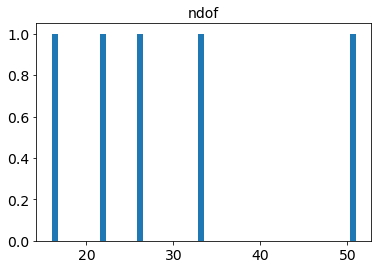

rango chisq/ndof : 3.1011076321617876, 11.052427375535947
promedio chisq/ndof : 5.734252660368436
desviación estándar chisq/ndof : 2.8771556280962103
mediana chisq/ndof : 5.631048969994951


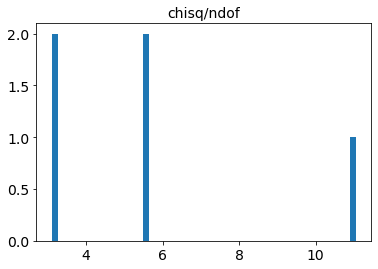

rango z : 0.0185, 0.08
promedio z : 0.046759999999999996
desviación estándar z : 0.02566247065268658
mediana z : 0.0365


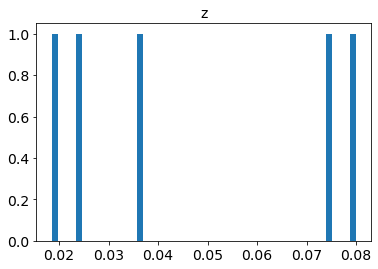

rango t0 : 58262.58921010841, 58328.839095729745
promedio t0 : 58291.05239893667
desviación estándar t0 : 24.255698589558357
mediana t0 : 58294.37301238494


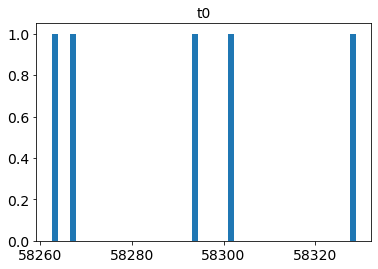

rango t0_err : 0.02571330477076117, 0.09095469986277749
promedio t0_err : 0.0513716914174438
desviación estándar t0_err : 0.023985464291889046
mediana t0_err : 0.05091732352229883


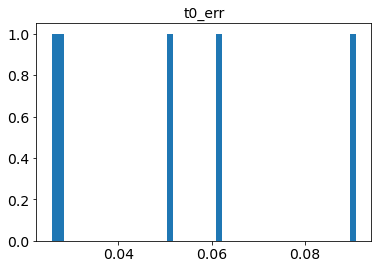

rango x0 : 0.0007342422139426602, 0.011210377293994598
promedio x0 : 0.0037505957341801245
desviación estándar x0 : 0.0038693364589448167
mediana x0 : 0.002375030108411487


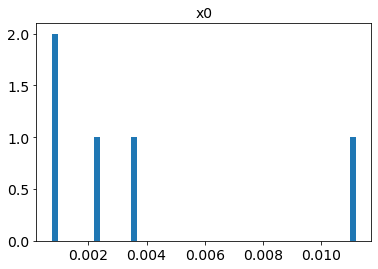

rango x0_err : 5.781193368124637e-06, 6.61640250366066e-05
promedio x0_err : 2.3345482029650113e-05
desviación estándar x0_err : 2.1863411913132957e-05
mediana x0_err : 1.52648689834302e-05


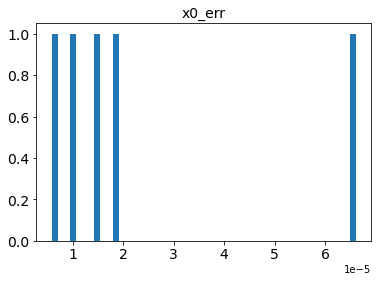

rango x1 : 0.7149390315350513, 2.315526983697362
promedio x1 : 1.2164322851780456
desviación estándar x1 : 0.5631546864908842
mediana x1 : 1.0320394698429758


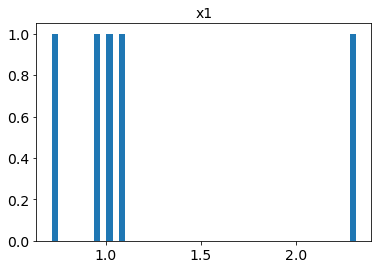

rango x1_err : 0.038482617569997074, 0.1593223840696108
promedio x1_err : 0.07776954109529473
desviación estándar x1_err : 0.04434235360266922
mediana x1_err : 0.061791015644580415


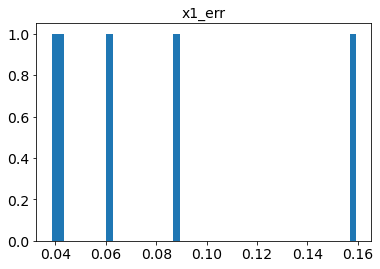

rango c : -0.03938766209509814, 0.6446503059899552
promedio c : 0.1433024962253689
desviación estándar c : 0.2606192117068446
mediana c : -0.015743882748322325


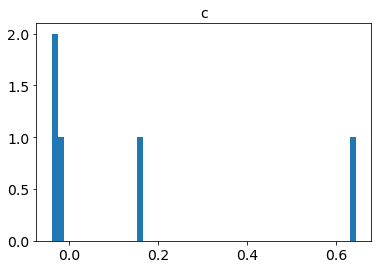

rango c_err : 0.005280728513751352, 0.01938488968702844
promedio c_err : 0.011677410449902594
desviación estándar c_err : 0.005314024497745154
mediana c_err : 0.009652927556542774


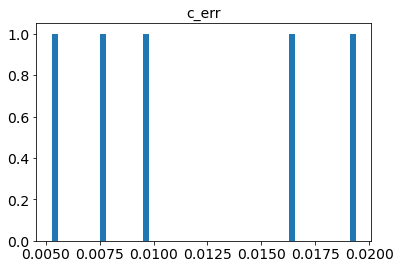

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


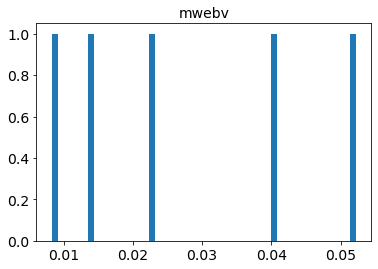

In [305]:
histogramas_estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa_cortes_trest, 
                                    z_real=True, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 103, 121
promedio ncall : 114.33333333333333
desviación estándar ncall : 8.055363982396383
mediana ncall : 119.0


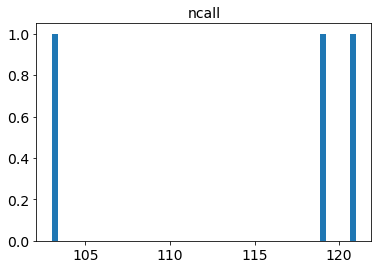

rango chisq : 1.3724525208077036, 935.5164111491221
promedio chisq : 326.206645456743
desviación estándar chisq : 431.1619939046688
mediana chisq : 41.731072700299194


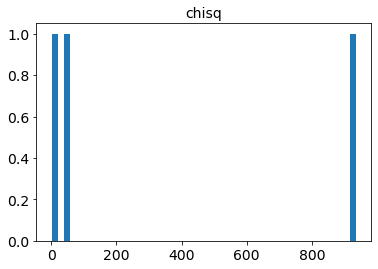

rango ndof : 4, 48
promedio ndof : 26.666666666666668
desviación estándar ndof : 17.98765008430939
mediana ndof : 28.0


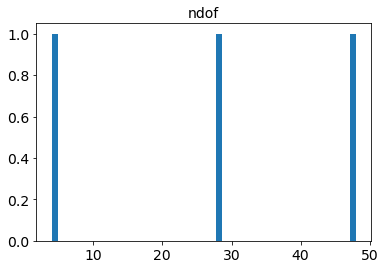

rango chisq/ndof : 0.3431131302019259, 33.41130039818293
promedio chisq/ndof : 11.541270292102586
desviación estándar chisq/ndof : 15.465939057600114
mediana chisq/ndof : 0.8693973479228999


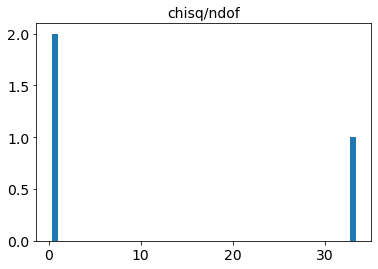

rango z : 0.0181, 0.12
promedio z : 0.06826666666666666
desviación estándar z : 0.04161524827378648
mediana z : 0.0667


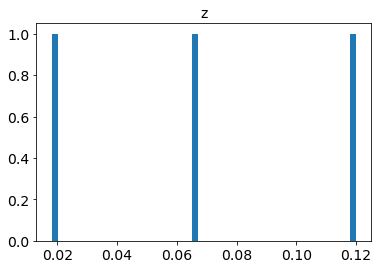

rango t0 : 58265.18405045947, 58363.841483883945
promedio t0 : 58309.863190658034
desviación estándar t0 : 40.80994958541096
mediana t0 : 58300.56403763068


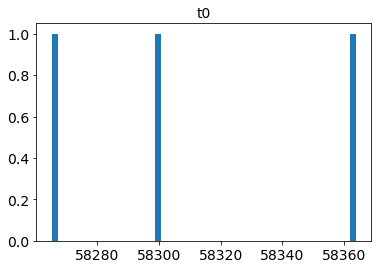

rango t0_err : 0.008852336690324591, 1.1017507151373138
promedio t0_err : 0.4009100919732494
desviación estándar t0_err : 0.4967339066513651
mediana t0_err : 0.09212722409210983


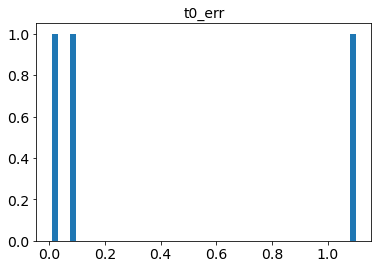

rango x0 : 0.00024111798977574528, 0.008563133443531379
promedio x0 : 0.0032422372722328307
desviación estándar x0 : 0.00377270980539975
mediana x0 : 0.0009224603833913691


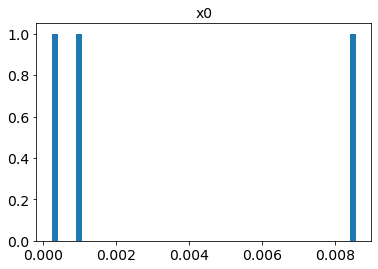

rango x0_err : 1.0134861162714028e-05, 3.741451111726936e-05
promedio x0_err : 2.1133976959712448e-05
desviación estándar x0_err : 1.1746342986512895e-05
mediana x0_err : 1.5852558599153952e-05


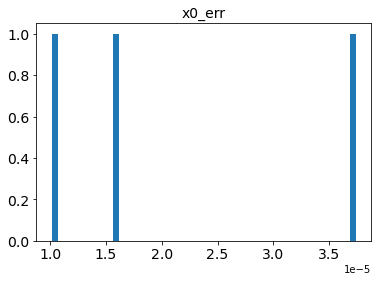

rango x1 : -1.3399160868990225, 0.7325140156167002
promedio x1 : -0.14630183528261323
desviación estándar x1 : 0.8748581436529631
mediana x1 : 0.16849656543448271


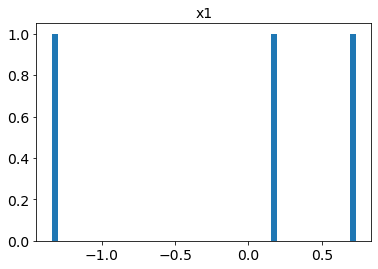

rango x1_err : 0.014895816279680505, 2.174432525459371
promedio x1_err : 0.7683729653911202
desviación estándar x1_err : 0.9950871157479346
mediana x1_err : 0.11579055443430927


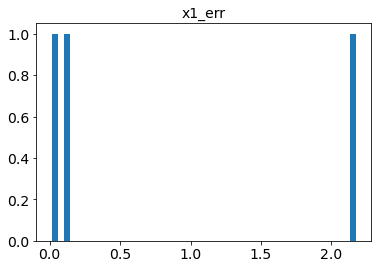

rango c : 0.024665803751682418, 0.14359257833750994
promedio c : 0.07631292091729387
desviación estándar c : 0.04979408709512896
mediana c : 0.060680380662689284


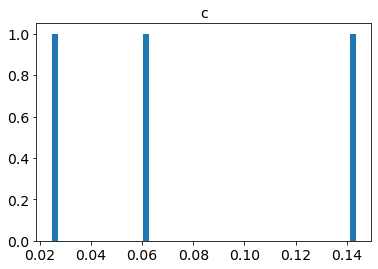

rango c_err : 0.002081287928363721, 0.13190022716449315
promedio c_err : 0.05012356132571528
desviación estándar c_err : 0.05811910856819575
mediana c_err : 0.01638916888428898


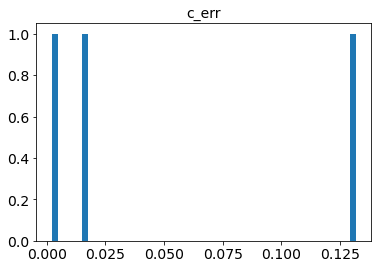

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


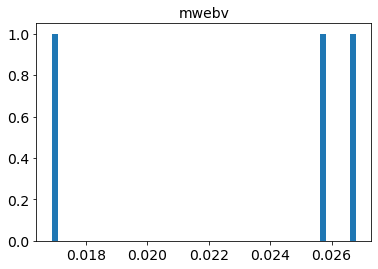

In [306]:
histogramas_estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa_cortes_trest, 
                                    z_real=True, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [307]:
estadisticas_SALT3_z_fijo_cortes_trest = estadisticas_resultados(ajustes_SALT3_z_fijo_early_SNIa_cortes_trest, 
                                                                 z_real=True).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT3 y redshift real, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [308]:
lista_oid_SALT3_z_fijo_cortes_trest = list(estadisticas_SALT3_z_fijo_cortes_trest['oid'])
lista_chisq_vs_ndof_SALT3_z_fijo_cortes_trest = list(estadisticas_SALT3_z_fijo_cortes_trest['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [309]:
median_chisq_vs_ndof_SALT3_z_fijo_cortes_trest = np.median(np.array(estadisticas_SALT3_z_fijo_cortes_trest['chisq/ndof']))
df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest = estadisticas_SALT3_z_fijo_cortes_trest[estadisticas_SALT3_z_fijo_cortes_trest['chisq/ndof'] > median_chisq_vs_ndof_SALT3_z_fijo_cortes_trest].reset_index()
lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest = list(df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [310]:
display(df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest[['oid', 
                                                                  'chisq/ndof', 
                                                                  'z', 
                                                                  't0', 
                                                                  't0_err']])

,oid,chisq/ndof,z,t0,t0_err
0,ZTF18aaxrvzj,1.591053,0.1100,58286.011695,0.153579
1,ZTF18abkifng,1.604195,0.0880,58343.581778,0.170823
2,ZTF18abcsgvj,1.624596,0.0600,58303.515861,0.129176
3,ZTF18abpamut,1.742925,0.0720,58367.688928,0.147617
4,ZTF18absdgon,1.746921,0.0620,58375.934626,0.121366
5,ZTF18abtnlik,1.750879,0.0900,58379.084046,0.153028
6,ZTF18abdbuty,1.820153,0.0600,58307.994801,0.125981
7,ZTF18abclalx,1.905211,0.1000,58301.077940,0.187440
8,ZTF18abealop,1.924834,0.0666,58316.176128,0.189972
9,ZTF18aazsabq,1.936241,0.0500,58293.969488,0.083987


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT3 y $z_{real}$  antes y después de eliminar los puntos fuera del rango de tiempo del modelo en trest

In [311]:
inter_oid_SALT3_z_fijo_sobre_mediana_cortes_trest = np.intersect1d(np.array(lista_oid_SALT3_z_fijo_sobre_mediana),
                                                                   np.array(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest))
print('Elementos comunes sobre la mediana de chisq/ndof : ',len(inter_oid_SALT3_z_fijo_sobre_mediana_cortes_trest))

Elementos comunes sobre la mediana de chisq/ndof :  39


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [312]:
table_early_SNIa_SALT3_z_fijo_cortes_trest = astropy_table_detections(df_meta_early_SNIa, 
                                                                     detect_early_SNIa_cortes_trest_SALT3_z_fijo)

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ===== Ajuste con redshift real ====
chisq/ndof :  0.49751373052530834


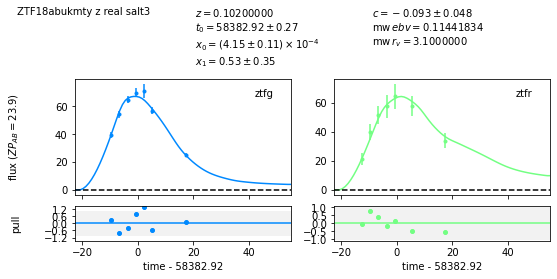

In [313]:
ajuste(lista_oid_SALT3_z_fijo_cortes_trest[2], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', 
      lista_chisq_vs_ndof_SALT3_z_fijo_cortes_trest[2])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.8693973479228999


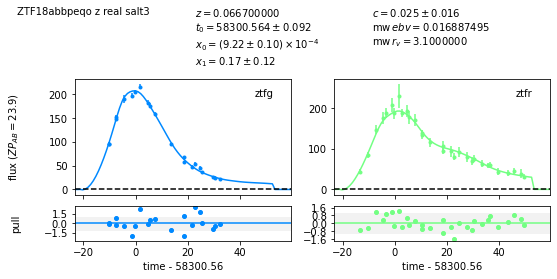

In [314]:
ajuste(lista_oid_SALT3_z_fijo_cortes_trest[16], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_trest[16])

 ===== Ajuste con redshift real ====
chisq/ndof :  0.8834262214283835


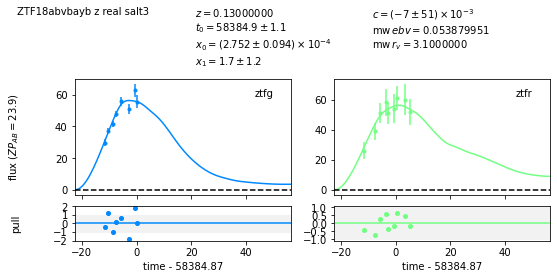

In [315]:
ajuste(lista_oid_SALT3_z_fijo_cortes_trest[18], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_trest[18])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.1872435047433483


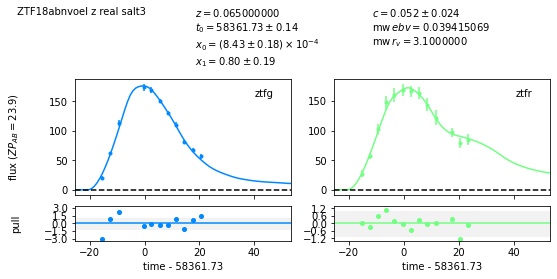

In [316]:
ajuste(lista_oid_SALT3_z_fijo_cortes_trest[26], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_trest[26])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.4420701475804265


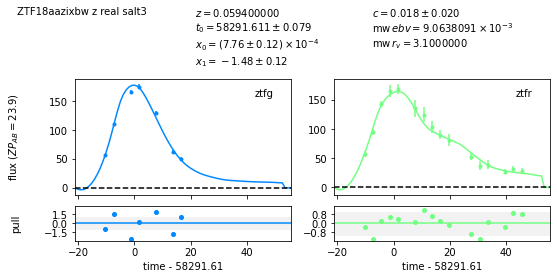

In [317]:
ajuste(lista_oid_SALT3_z_fijo_cortes_trest[33], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_trest[33])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.4938626949453462


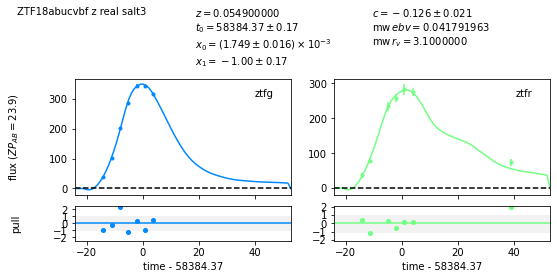

In [318]:
ajuste(lista_oid_SALT3_z_fijo_cortes_trest[35], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_trest[35])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.5040002473861547


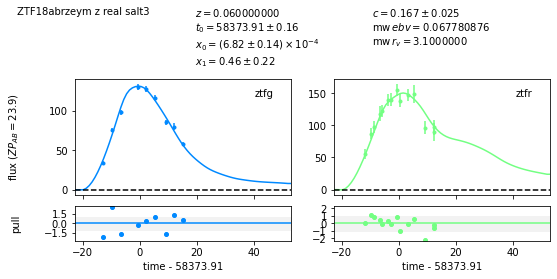

In [319]:
ajuste(lista_oid_SALT3_z_fijo_cortes_trest[38], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_trest[38])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.5189389899117554


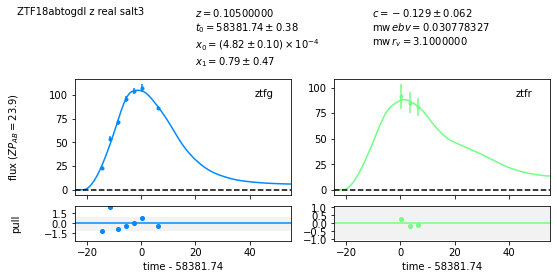

In [320]:
ajuste(lista_oid_SALT3_z_fijo_cortes_trest[39], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_fijo_cortes_trest[39])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ mayores a la mediana.

 ===== Ajuste con redshift real ====
chisq/ndof :  1.5910532615905575


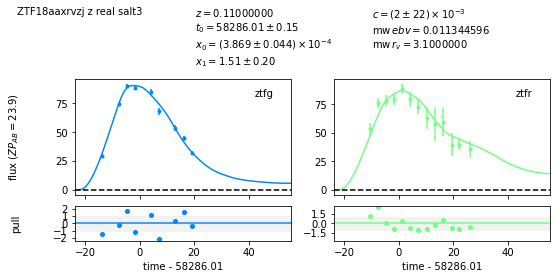

In [321]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest[0], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][0])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.7429247230708345


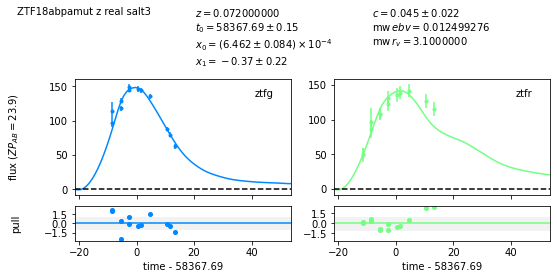

In [322]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest[3], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][3])

 ===== Ajuste con redshift real ====
chisq/ndof :  1.9362407034884597


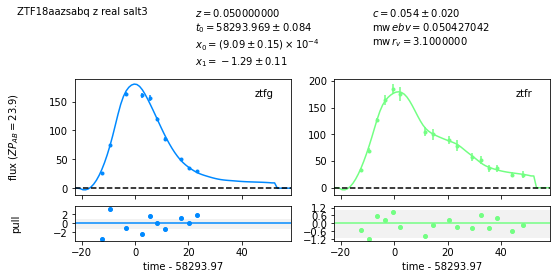

In [323]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest[9], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][9])

 ===== Ajuste con redshift real ====
chisq/ndof :  2.1725461680813276


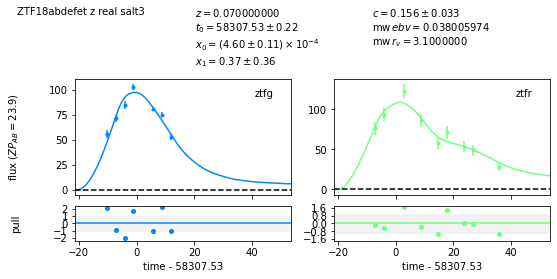

In [324]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest[13], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][13])

 ===== Ajuste con redshift real ====
chisq/ndof :  3.092939630447042


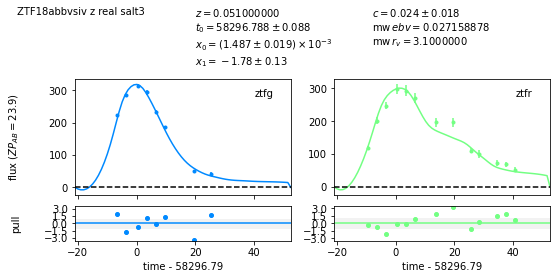

In [325]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest[18], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][18])

 ===== Ajuste con redshift real ====
chisq/ndof :  3.1011076321617876


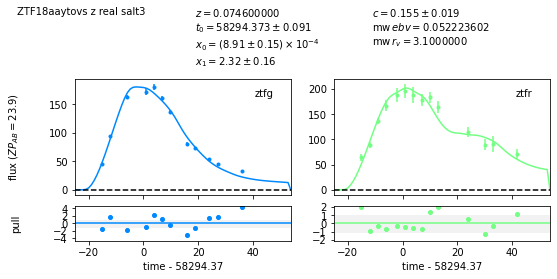

In [326]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest[20], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][20])

 ===== Ajuste con redshift real ====
chisq/ndof :  18.239802608113298


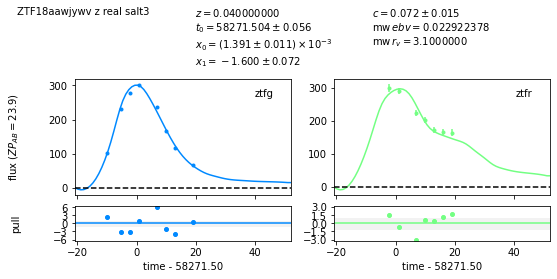

In [327]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest[36], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][39])

 ===== Ajuste con redshift real ====
chisq/ndof :  33.41130039818293


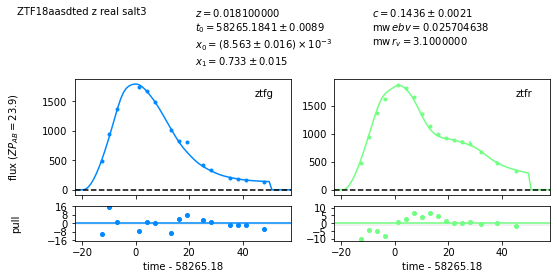

In [328]:
ajuste(lista_oid_SALT3_z_fijo_sobre_mediana_cortes_trest[41], 'salt3', df_meta_early_SNIa, 
       table_early_SNIa_SALT3_z_fijo_cortes_trest, z_real=True)[0]
print('chisq/ndof : ', 
      df_chisq_vs_ndof_SALT3_z_fijo_sobre_mediana_cortes_trest['chisq/ndof'][41])

### Ajuste con redshift variable

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el valor de $t_0$ del primer ajuste con el modelo SALT3 $z=0$, donde el siguiente ajuste se realizará con redshift variable

In [329]:
detect_early_SNIa_sin_SN52_cortes_trest = cortes_trest_modelo(trest_min_modelo, 
                                                              trest_max_modelo, 
                                                              detect_early_SNIa_sin_SN52,
                                                              estadisticas_SALT3_z_var)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo, determinado con $z=0$ y $t_0$ del primer ajuste

In [330]:
ajustes_SALT3_early_SNIa_sin_SN52_cortes_trest = modelo_ajustado_y_resultados('salt3', 
                                                                              df_meta_early_SNIa_sin_SN52, 
                                                                              detect_early_SNIa_sin_SN52_cortes_trest,
                                                                              print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 149, 1108
promedio ncall : 341.3421052631579
desviación estándar ncall : 169.32206563634094
mediana ncall : 287.5


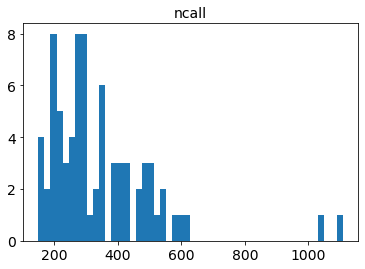

rango chisq : 4.863277827350304, 961.9926197170648
promedio chisq : 77.9966939215682
desviación estándar chisq : 152.69029296881288
mediana chisq : 29.847513970709677


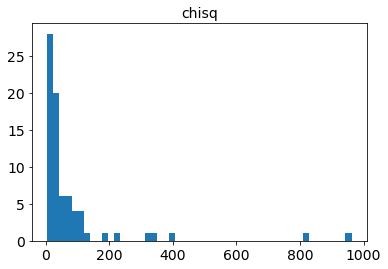

rango ndof : 5, 57
promedio ndof : 19.75
desviación estándar ndof : 10.964206117611694
mediana ndof : 16.5


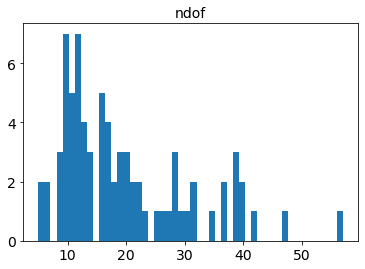

rango chisq/ndof : 0.4772206745634247, 32.76611388447659
promedio chisq/ndof : 3.516241440148574
desviación estándar chisq/ndof : 5.133563425184153
mediana chisq/ndof : 1.6642395622401942


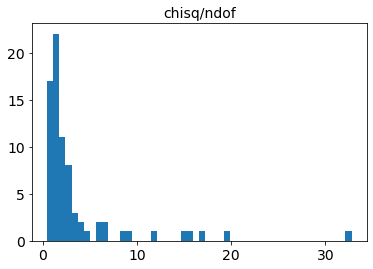

rango z : 0.0010000000002969996, 0.3137887364909378
promedio z : 0.15637608674850756
desviación estándar z : 0.0978791070007662
mediana z : 0.15891266029236517


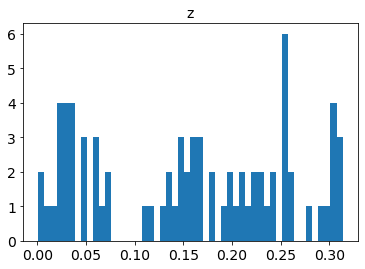

rango z_err : 1.880221672800886e-12, 0.1515034069608234
promedio z_err : 0.022480634167719237
desviación estándar z_err : 0.02150558326354895
mediana z_err : 0.01730590792615231


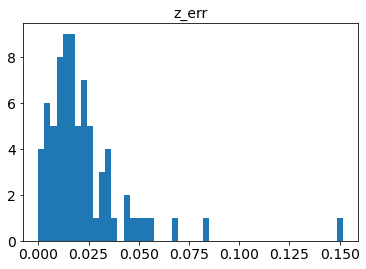

rango t0 : 58256.76099932384, 58395.08339788103
promedio t0 : 58322.866541929914
desviación estándar t0 : 38.58925697965283
mediana t0 : 58318.488651063744


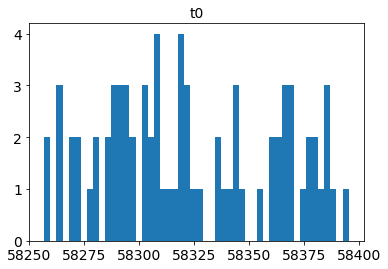

rango t0_err : 5.3551048040390015e-09, 1.8537934291198326
promedio t0_err : 0.2993270226873057
desviación estándar t0_err : 0.2945298943595632
mediana t0_err : 0.21721945462741132


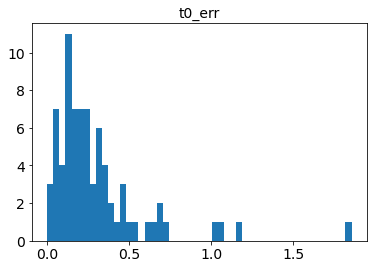

rango x0 : 0.00022795865919194336, 0.006326545394789514
promedio x0 : 0.0011048054798777878
desviación estándar x0 : 0.0012107314939542781
mediana x0 : 0.0006573318115688581


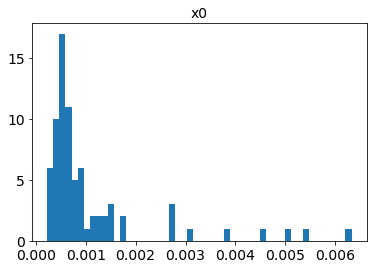

rango x0_err : 5.8647997696926295e-06, 6.5902920905724e-05
promedio x0_err : 2.0095048689593776e-05
desviación estándar x0_err : 1.280743983486231e-05
mediana x0_err : 1.5364380749891658e-05


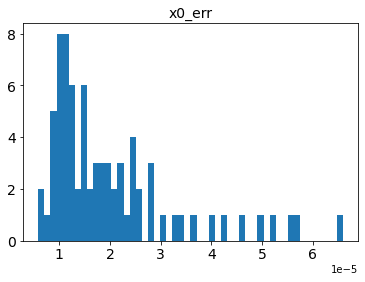

rango x1 : -2.2318680748604987, 3.9999999532332513
promedio x1 : 0.030872331433028633
desviación estándar x1 : 1.20794952096704
mediana x1 : 0.13901147923844315


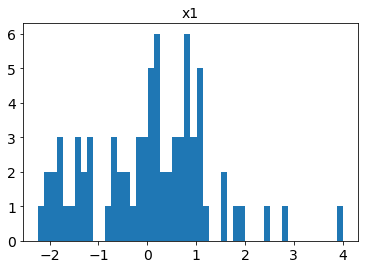

rango x1_err : 0.013075263987949892, 1.2918248428049193
promedio x1_err : 0.25181099036673316
desviación estándar x1_err : 0.2294566252272109
mediana x1_err : 0.1900128647715048


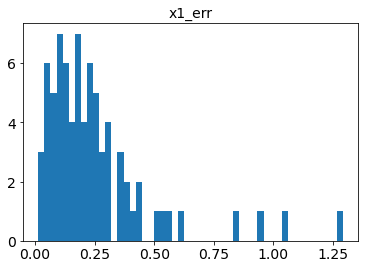

rango c : -0.3506298480117703, 0.2723707852536782
promedio c : -0.06927671664223212
desviación estándar c : 0.1234245322919038
mediana c : -0.06186758204039641


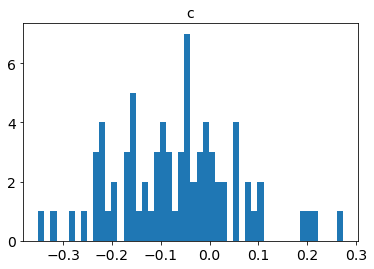

rango c_err : 0.004154860997353696, 0.13965822152614765
promedio c_err : 0.03449747512587403
desviación estándar c_err : 0.022892098791700295
mediana c_err : 0.031164472035290817


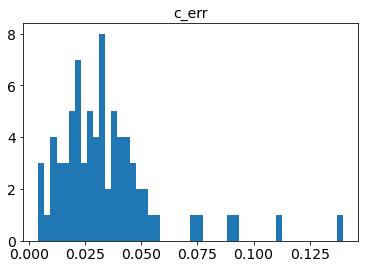

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.03114547008998045
desviación estándar mwebv : 0.02204165121299313
mediana mwebv : 0.02451353213255834


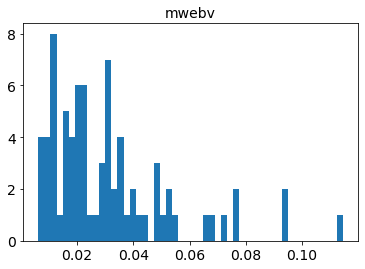

In [331]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52_cortes_trest, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 204, 353
promedio ncall : 278.0
desviación estándar ncall : 58.356662001865736
mediana ncall : 277.5


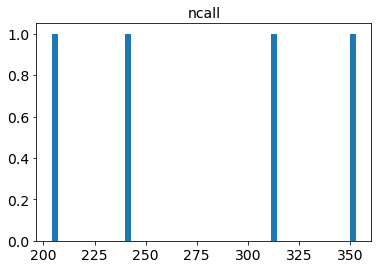

rango chisq : 110.94114633398105, 447.60107069368377
promedio chisq : 250.3144871789271
desviación estándar chisq : 143.02311118956754
mediana chisq : 221.35786584402183


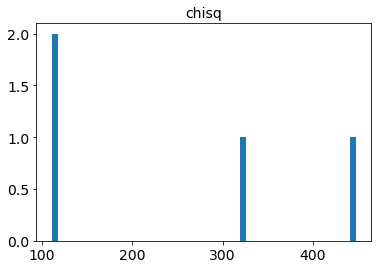

rango ndof : 15, 31
promedio ndof : 23.0
desviación estándar ndof : 5.830951894845301
mediana ndof : 23.0


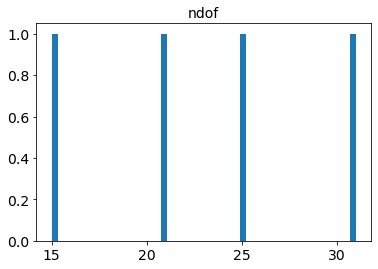

rango chisq/ndof : 5.56944210122612, 17.90404282774735
promedio chisq/ndof : 10.344466527828228
desviación estándar chisq/ndof : 4.708181689619461
mediana chisq/ndof : 8.952190591169721


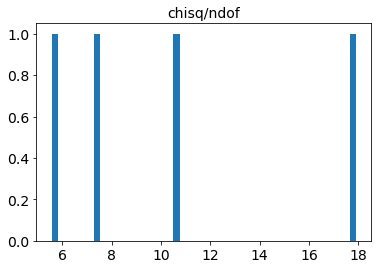

rango z : 0.012544398399101049, 0.34578605065753426
promedio z : 0.18547804155625244
desviación estándar z : 0.12359683954723412
mediana z : 0.19179085858418723


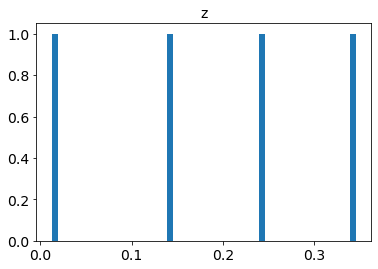

rango z_err : 0.001673271472906036, 0.010817989053850285
promedio z_err : 0.006183400568557429
desviación estándar z_err : 0.003546010668857198
mediana z_err : 0.006121170873736696


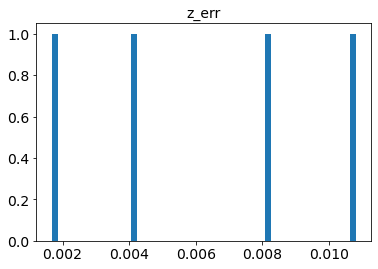

rango t0 : 58264.28481282658, 58301.93709335564
promedio t0 : 58282.87139288875
desviación estándar t0 : 16.954202354307274
mediana t0 : 58282.6318326864


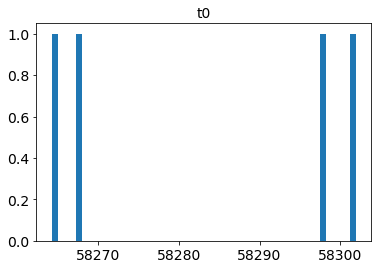

rango t0_err : 0.029725256346864626, 0.2124026156780019
promedio t0_err : 0.09746291560531972
desviación estándar t0_err : 0.07043542802761468
mediana t0_err : 0.07386189519820618


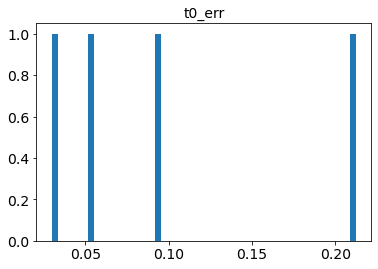

rango x0 : 0.000646703505458106, 0.011446448142203995
promedio x0 : 0.0040378218448086575
desviación estándar x0 : 0.004396450911467967
mediana x0 : 0.0020290678657862654


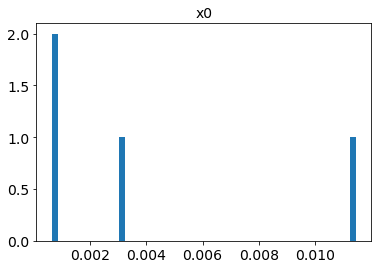

rango x0_err : 1.0219233223217531e-05, 7.890015495755771e-05
promedio x0_err : 3.2012554018940084e-05
desviación estándar x0_err : 2.735462062730128e-05
mediana x0_err : 1.9465413947492546e-05


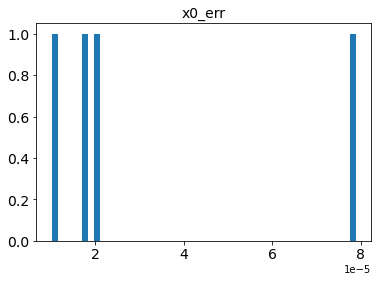

rango x1 : 0.4292376803915321, 2.3174564111571323
promedio x1 : 1.0951760670229669
desviación estándar x1 : 0.7247485432431486
mediana x1 : 0.8170050882716016


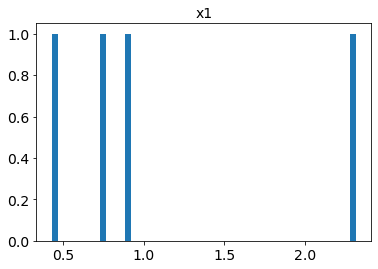

rango x1_err : 0.037375469880618795, 0.22245204553203646
promedio x1_err : 0.1005437801329403
desviación estándar x1_err : 0.0731702206037347
mediana x1_err : 0.07117380255955297


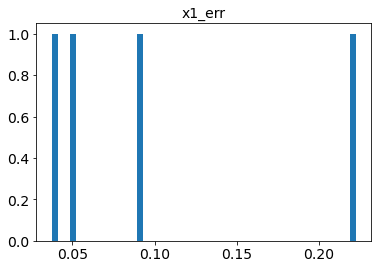

rango c : -0.21287693138134314, -0.0033446532644348936
promedio c : -0.13332078924941598
desviación estándar c : 0.07842097305321881
mediana c : -0.15853078617594296


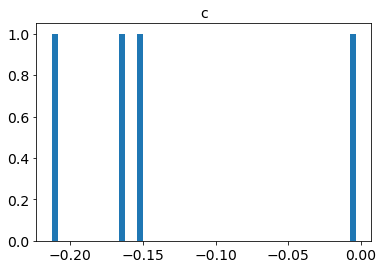

rango c_err : 0.0049851021305697685, 0.022674918633019597
promedio c_err : 0.014219650227039412
desviación estándar c_err : 0.007537987250738488
mediana c_err : 0.014609290072284141


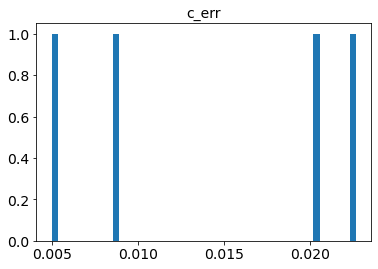

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02440207828578341
desviación estándar mwebv : 0.01691663733240622
mediana mwebv : 0.01854796664576526


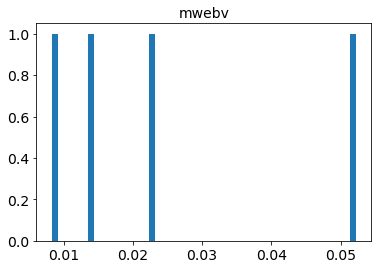

In [332]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52_cortes_trest, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 191, 572
promedio ncall : 394.0
desviación estándar ncall : 156.5439235486322
mediana ncall : 419.0


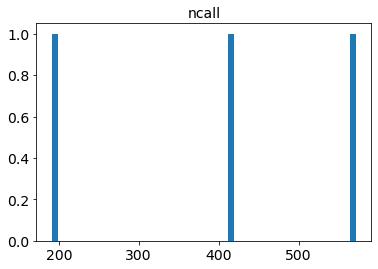

rango chisq : 1.4803418175203376, 819.1940970068742
promedio chisq : 286.95855968042423
desviación estándar chisq : 376.6791980700948
mediana chisq : 40.201240216878084


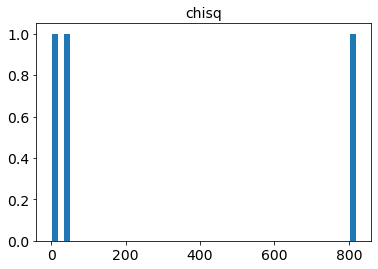

rango ndof : 3, 47
promedio ndof : 26.0
desviación estándar ndof : 18.01850900231944
mediana ndof : 28.0


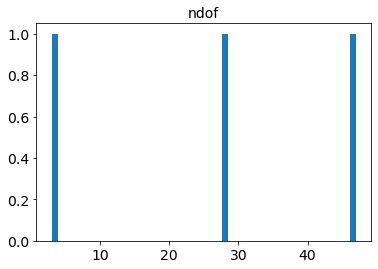

rango chisq/ndof : 0.49344727250677917, 29.256932035959796
promedio chisq/ndof : 10.201908281665299
desviación estándar chisq/ndof : 13.474746510811038
mediana chisq/ndof : 0.8553455365293209


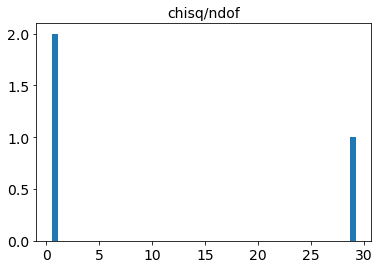

rango z : 0.02826305090169221, 0.27744243656167916
promedio z : 0.11877016750910985
desviación estándar z : 0.11256837200971151
mediana z : 0.050605015063958175


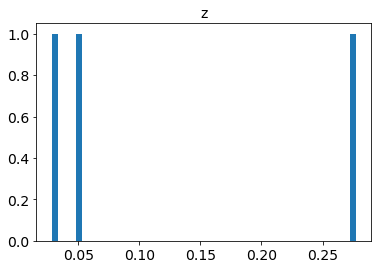

rango z_err : 0.0009229065487939957, 0.1271340180628111
promedio z_err : 0.047217327391018055
desviación estándar z_err : 0.05674594810069511
mediana z_err : 0.013595057561449062


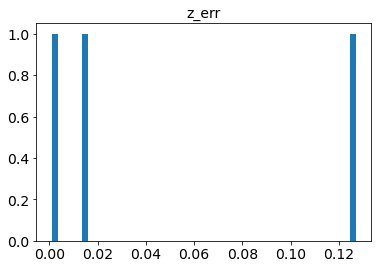

rango t0 : 58265.36691346459, 58364.092301232384
promedio t0 : 58309.97588079926
desviación estándar t0 : 40.861304399067436
mediana t0 : 58300.4684277008


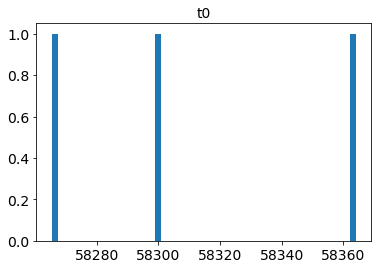

rango t0_err : 0.01908249725966016, 2.096757954579516
promedio t0_err : 0.7581936213403727
desviación estándar t0_err : 0.948223580865847
mediana t0_err : 0.1587404121819418


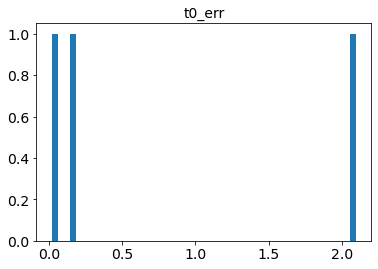

rango x0 : 0.0002565969937892909, 0.008459639731508222
promedio x0 : 0.0032161373374107586
desviación estándar x0 : 0.0037179599715634116
mediana x0 : 0.0009321752869347621


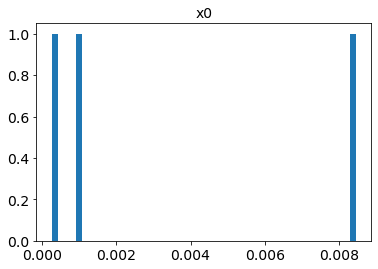

rango x0_err : 1.4246795675511866e-05, 4.302916800836718e-05
promedio x0_err : 2.525443883952735e-05
desviación estándar x0_err : 1.2687298872607355e-05
mediana x0_err : 1.8487352834703018e-05


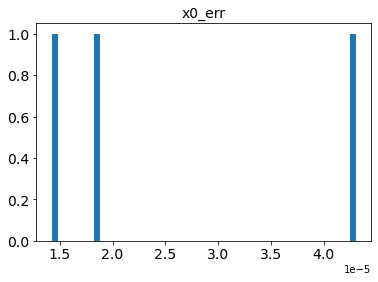

rango x1 : -2.5865571708243507, 0.8360146124580856
promedio x1 : -0.502155982073175
desviación estándar x1 : 1.493573896786415
mediana x1 : 0.24407461214673987


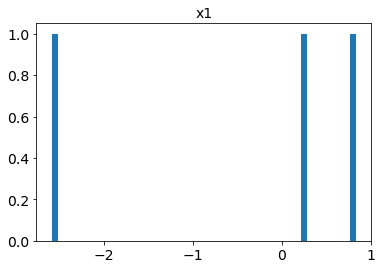

rango x1_err : 0.01789927516570966, 1.7884604736473213
promedio x1_err : 0.6411266441519797
desviación estándar x1_err : 0.8122960978414503
mediana x1_err : 0.11702018364290812


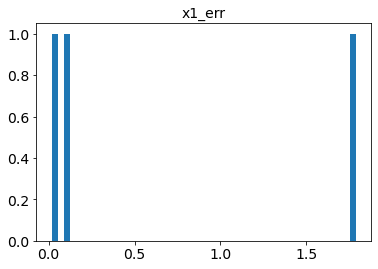

rango c : -0.2803902021421485, 0.1302290253897933
promedio c : -0.034117617448220026
desviación estándar c : 0.17736202612447088
mediana c : 0.04780832440769511


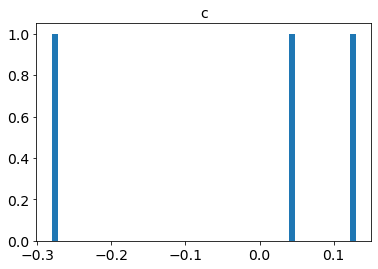

rango c_err : 0.002305617688235395, 0.15880576579460273
promedio c_err : 0.06283355037570697
desviación estándar c_err : 0.06863088213084825
mediana c_err : 0.02738926764428279


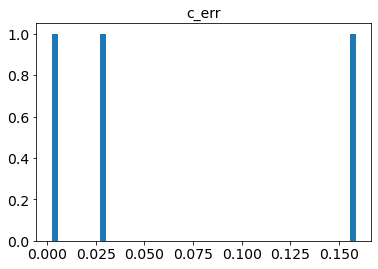

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


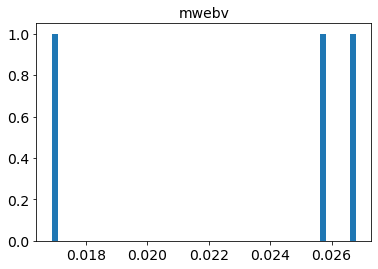

In [333]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52_cortes_trest, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [334]:
estadisticas_SALT3_z_var_cortes_trest = estadisticas_resultados(ajustes_SALT3_early_SNIa_sin_SN52_cortes_trest).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT3 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [335]:
lista_oid_SALT3_z_var_cortes_trest = list(estadisticas_SALT3_z_var_cortes_trest['oid'])
lista_chisq_vs_ndof_SALT3_z_var_cortes_trest = list(estadisticas_SALT3_z_var_cortes_trest['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [336]:
median_chisq_vs_ndof_SALT3_z_var_cortes_trest = np.median(np.array(estadisticas_SALT3_z_var_cortes_trest['chisq/ndof']))
df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest = estadisticas_SALT3_z_var_cortes_trest[estadisticas_SALT3_z_var_cortes_trest['chisq/ndof'] > median_chisq_vs_ndof_SALT3_z_var_cortes_trest].reset_index()
lista_oid_SALT3_z_var_sobre_mediana_cortes_trest = list(df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [337]:
display(df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest[['oid', 
                                                                 'chisq/ndof', 
                                                                 'z', 
                                                                 'z_err', 
                                                                 't0', 
                                                                 't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
0,ZTF18aaxrvzj,1.875722,0.198386,3.471400e-02,58286.756858,6.573904e-01
1,ZTF18abckujg,1.878410,0.028785,9.639951e-03,58302.911508,2.376389e-01
2,ZTF18aazsabq,1.919094,0.033883,7.921356e-03,58293.747247,1.534722e-01
3,ZTF18aazjztm,1.970341,0.301664,1.897528e-02,58293.197921,2.571549e-01
4,ZTF18abtnlik,2.035663,0.263541,2.632175e-02,58380.518237,2.933191e-01
5,ZTF18abimsyv,2.178769,0.240571,9.676009e-03,58336.302540,1.965998e-01
6,ZTF18aaxwjmp,2.218599,0.302822,1.513047e-02,58290.293653,2.098405e-01
7,ZTF18abclalx,2.266776,0.261197,2.244619e-02,58302.393653,2.972257e-01
8,ZTF18abetewu,2.304188,0.069200,2.146927e-02,58318.796142,1.984565e-01
9,ZTF18aaxsioa,2.332523,0.032291,2.777458e-03,58286.141831,4.956389e-02


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT3 y $z$ variable  antes y después de eliminar los puntos fuera del rango de tiempo del modelo en trest

In [338]:
inter_oid_SALT3_z_var_sobre_mediana_cortes_trest = np.intersect1d(np.array(lista_oid_SALT3_z_var_sobre_mediana),
                                                                   np.array(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest))
print('Elementos comunes sobre la mediana de chisq/ndof : ',len(inter_oid_SALT3_z_var_sobre_mediana_cortes_trest))

Elementos comunes sobre la mediana de chisq/ndof :  38


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [339]:
table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest = astropy_table_detections(df_meta_early_SNIa_sin_SN52,
                                                                              detect_early_SNIa_sin_SN52_cortes_trest)

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ menores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  0.4772206745634247


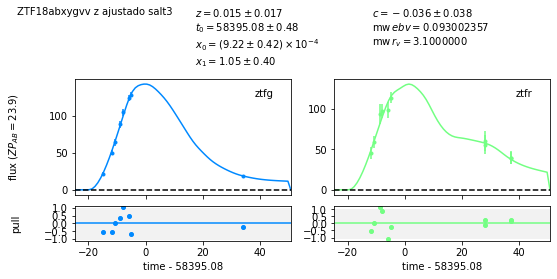

In [340]:
ajuste(lista_oid_SALT3_z_var_cortes_trest[0], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_trest[0])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.5372267826312719


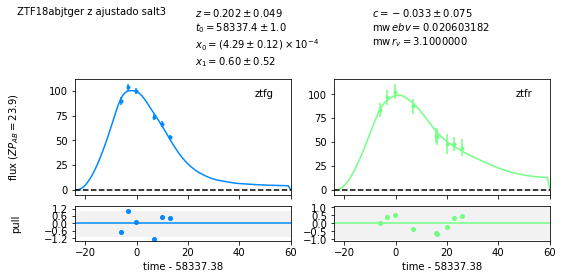

In [341]:
ajuste(lista_oid_SALT3_z_var_cortes_trest[3], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_trest[3])

 ==== Con ajuste del redshift ====
chisq/ndof :  0.7656544692580272


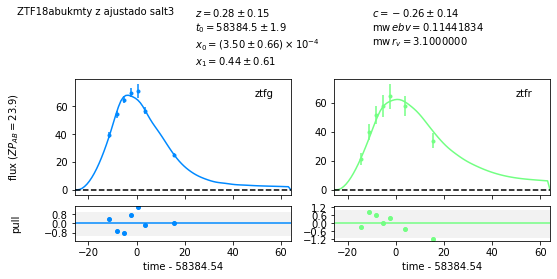

In [342]:
ajuste(lista_oid_SALT3_z_var_cortes_trest[10], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_trest[10])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.1278498753424306


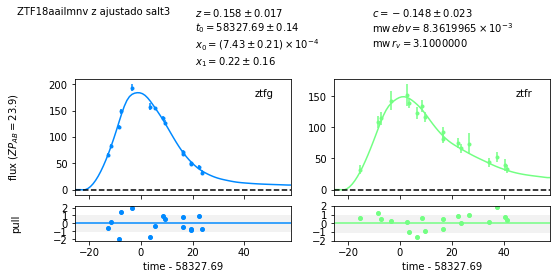

In [343]:
ajuste(lista_oid_SALT3_z_var_cortes_trest[19], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_trest[19])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.4476431809725094


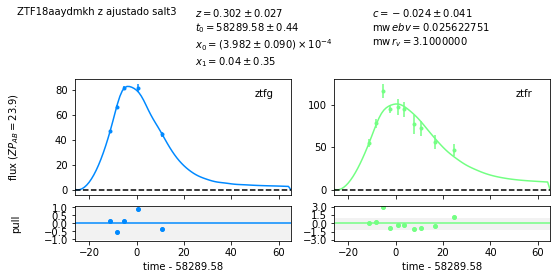

In [344]:
ajuste(lista_oid_SALT3_z_var_cortes_trest[31], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_trest[31])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.6230128415402219


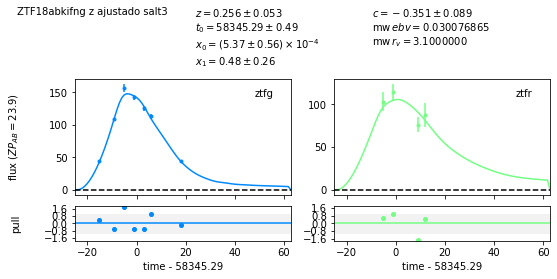

In [345]:
ajuste(lista_oid_SALT3_z_var_cortes_trest[36], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_trest[36])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.676841733205033


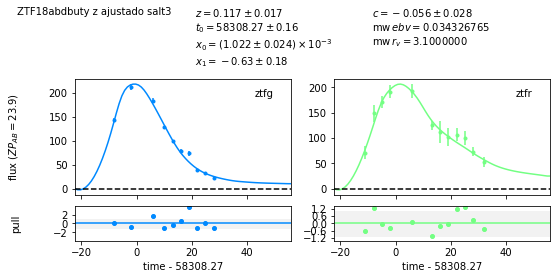

In [346]:
ajuste(lista_oid_SALT3_z_var_cortes_trest[40], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_trest[40])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.8572069424035058


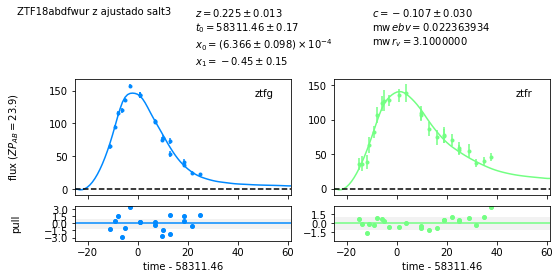

In [347]:
ajuste(lista_oid_SALT3_z_var_cortes_trest[41], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_var_cortes_trest[41])

Algunos gráficos de los ajustes de las SN que tienen valores de $\frac{\chi^{2}}{ndof}$ mayores a la mediana.

 ==== Con ajuste del redshift ====
chisq/ndof :  1.9703406295734411


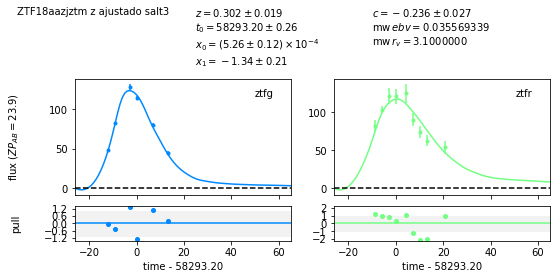

In [348]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[3], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][3])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.5030950364639555


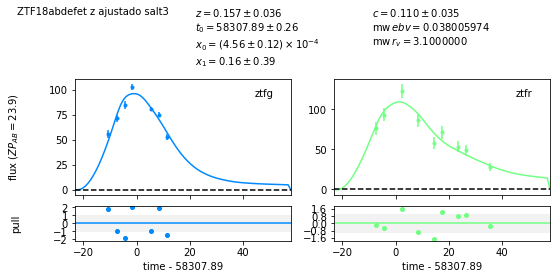

In [349]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[10], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][10])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.754702041876596


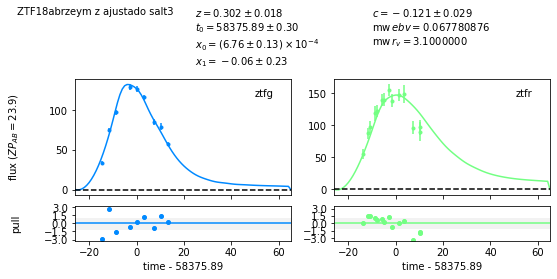

In [350]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[14], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][14])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.9789958026212093


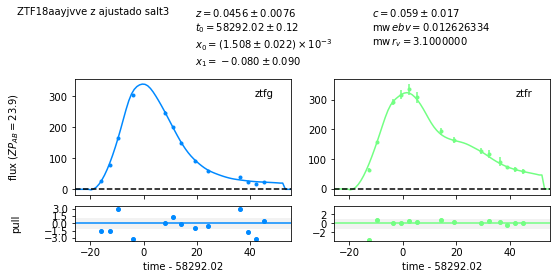

In [351]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[17], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][17])

 ==== Con ajuste del redshift ====
chisq/ndof :  3.6118840745223606


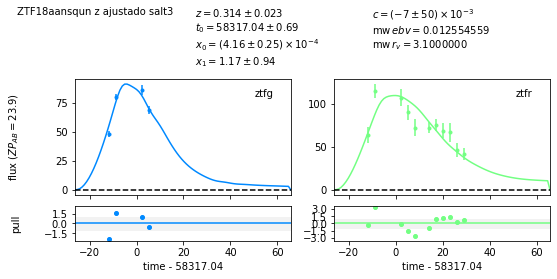

In [352]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[20], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][20])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.17876879766047


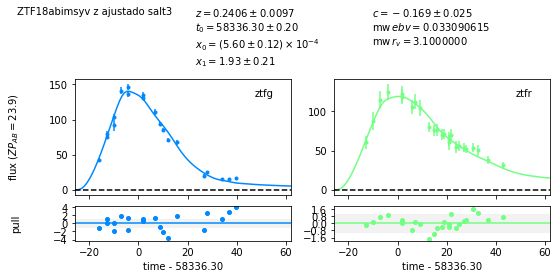

In [353]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[5], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][5])

 ==== Con ajuste del redshift ====
chisq/ndof :  5.56944210122612


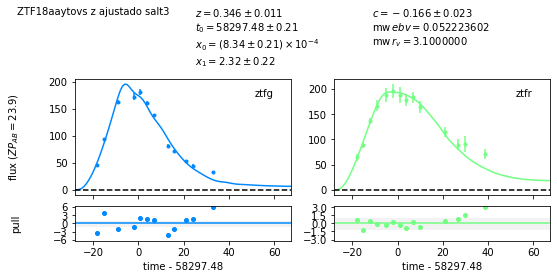

In [354]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[24], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][24])

 ==== Con ajuste del redshift ====
chisq/ndof :  7.396076422265404


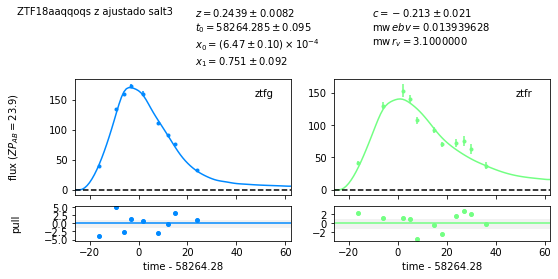

In [355]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[29], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][29])

 ==== Con ajuste del redshift ====
chisq/ndof :  15.829426219720606


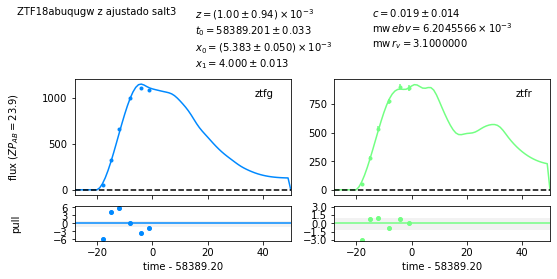

In [356]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[35], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][35])

 ==== Con ajuste del redshift ====
chisq/ndof :  32.76611388447659


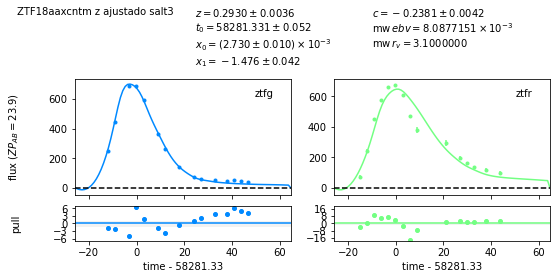

In [357]:
ajuste(lista_oid_SALT3_z_var_sobre_mediana_cortes_trest[40], 'salt3', df_meta_early_SNIa_sin_SN52, 
       table_early_SNIa_sin_SN52_SALT3_z_var_cortes_trest)[0]
print('chisq/ndof : ', df_chisq_vs_ndof_SALT3_z_var_sobre_mediana_cortes_trest['chisq/ndof'][40])

## Ajuste con límite más estricto en el valor de $z$ (solo afecta a los que también ajustan $z$) 

Aquí sabemos que el rango de redshift real de las SNIa es $0.0181 \leq z \leq 0.141$. Probaremos que pasa si en los ajustes se utiliza un rango más estricto de valores de $z$, que en este ejemplo será $z_{bounds} = [0, 0.2]$.

### Ajuste usando todas las observaciones (con redshift variable), se debe eliminar una SN ya que no se puede ajustar (si no se elimina el programa se cae)

In [358]:
name_15 = names_SNIa[15]
print('Eliminada : ', name_15)

df_meta_early_SNIa_sin_SN15 = df_meta_early_SNIa[df_meta_early_SNIa['oid'] != name_15]
detect_early_SNIa_sin_SN15 = detect_early_SNIa[detect_early_SNIa['oid'] != name_15]

ajustes_SALT3_early_SNIa_z_bounded = modelo_ajustado_y_resultados('salt3', 
                                                                  df_meta_early_SNIa_sin_SN15, 
                                                                  detect_early_SNIa_sin_SN15,
                                                                  z_bounds=z_bounds,
                                                                  print_ind_and_oid=False)

Eliminada :  ZTF18aaxcntm


Link en ALeRCE ZTF explorer de esta SN: https://alerce.online/object/ZTF18aaxcntm

Estadísticas SN Ia

rango ncall : 123, 674
promedio ncall : 249.61333333333334
desviación estándar ncall : 111.61432325448
mediana ncall : 209.0


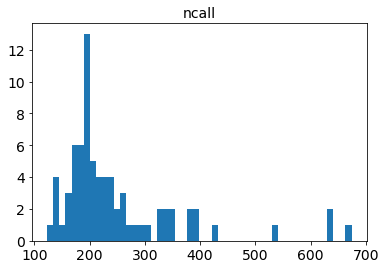

rango chisq : 4.512862788134209, 5157.493490265282
promedio chisq : 218.75025209208732
desviación estándar chisq : 719.4879556528601
mediana chisq : 28.550434821324906


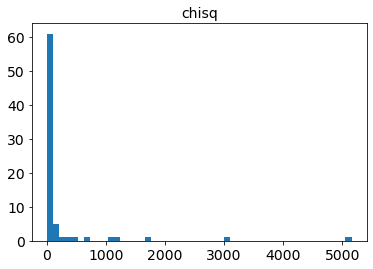

rango ndof : 5, 63
promedio ndof : 20.84
desviación estándar ndof : 12.50390872220896
mediana ndof : 17.0


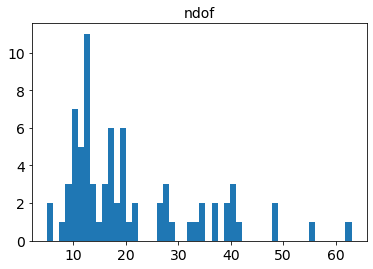

rango chisq/ndof : 0.47722158837924095, 130.2993959552755
promedio chisq/ndof : 7.304164096192385
desviación estándar chisq/ndof : 20.13378365652425
mediana chisq/ndof : 1.6297715417576162


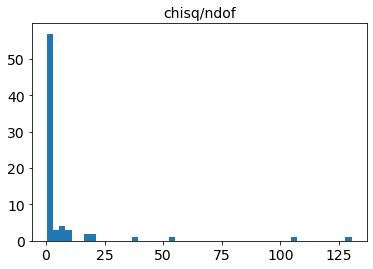

rango z : 5.340272746234831e-09, 0.19999999225625217
promedio z : 0.07572927361559302
desviación estándar z : 0.049705959150296054
mediana z : 0.06922584156413392


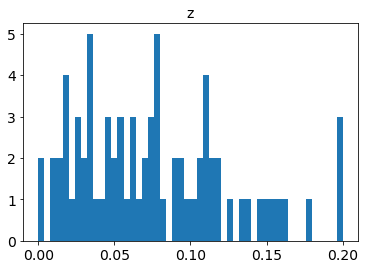

rango z_err : 1.1570257890669566e-08, 0.1708037720503088
promedio z_err : 0.023290717240308824
desviación estándar z_err : 0.02949612586754985
mediana z_err : 0.016686552310929505


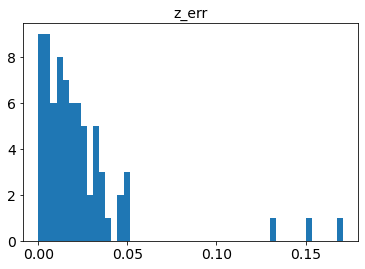

rango t0 : 58254.63512320608, 58395.08397202128
promedio t0 : 58322.66722350035
desviación estándar t0 : 38.542967202027405
mediana t0 : 58318.78219853909


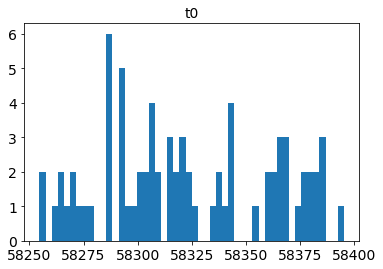

rango t0_err : 2.587512426543981e-07, 1.2954760865250137
promedio t0_err : 0.24167276315279498
desviación estándar t0_err : 0.20824459186526498
mediana t0_err : 0.19834037675173022


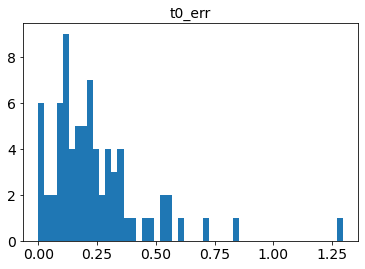

rango x0 : 0.0002311547337047612, 0.005801953188371477
promedio x0 : 0.001104929078811717
desviación estándar x0 : 0.001182950046792862
mediana x0 : 0.000669749490846753


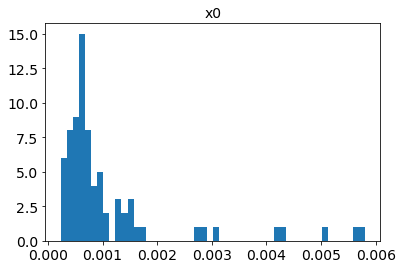

rango x0_err : 4.481379839874968e-06, 5.655730698983339e-05
promedio x0_err : 1.8955523044929915e-05
desviación estándar x0_err : 1.1491972097973434e-05
mediana x0_err : 1.5003406928472913e-05


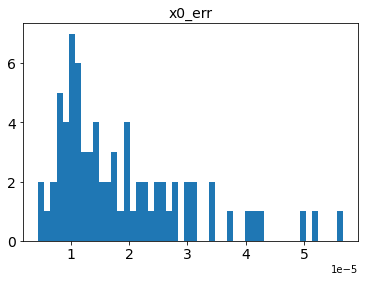

rango x1 : -2.441262495814739, 2.7058195692010614
promedio x1 : -0.030271680551491174
desviación estándar x1 : 1.1055872799776996
mediana x1 : 0.20199792082391


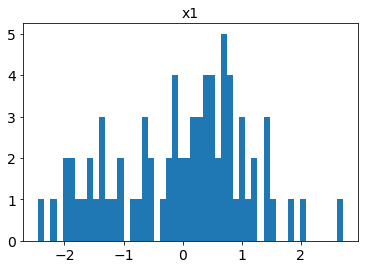

rango x1_err : 0.0303799290347313, 1.4537197859502382
promedio x1_err : 0.253320983817794
desviación estándar x1_err : 0.213788393143114
mediana x1_err : 0.2055636516297148


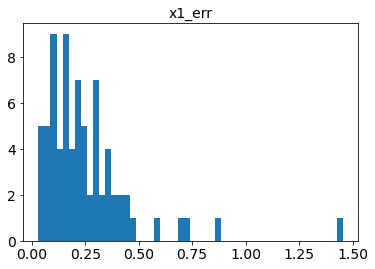

rango c : -0.2336414399383486, 0.399999893839173
promedio c : 0.009776188240949607
desviación estándar c : 0.11662882121553327
mediana c : -0.009424750997156062


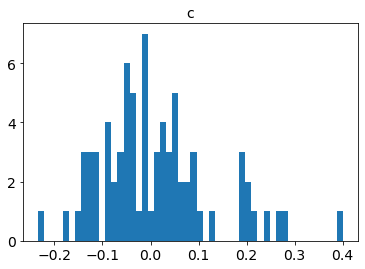

rango c_err : 0.004841383938841981, 0.6833865397438257
promedio c_err : 0.04164983725514805
desviación estándar c_err : 0.07748919854376829
mediana c_err : 0.030012445657501968


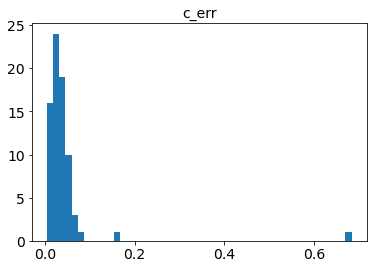

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.031452906822765546
desviación estándar mwebv : 0.022025641008680343
mediana mwebv : 0.025622750919880123


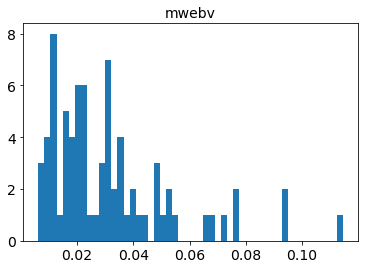

In [359]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 158, 367
promedio ncall : 223.8
desviación estándar ncall : 76.36072288814454
mediana ncall : 183.0


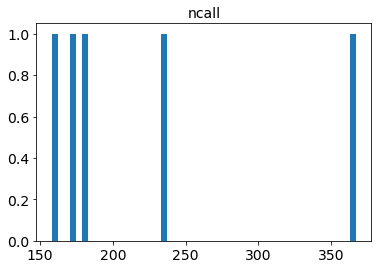

rango chisq : 88.45206211476415, 19430.8689117221
promedio chisq : 4646.756805091017
desviación estándar chisq : 7431.827371870716
mediana chisq : 1493.2991868144486


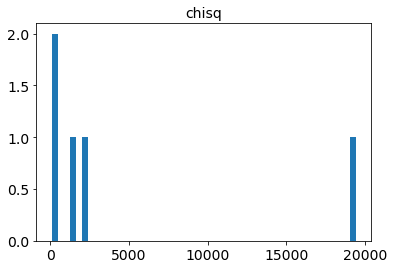

rango ndof : 15, 62
promedio ndof : 39.4
desviación estándar ndof : 19.12694434560837
mediana ndof : 35.0


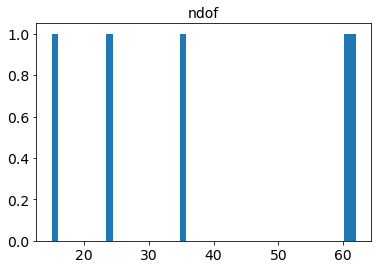

rango chisq/ndof : 5.896804140984276, 313.4011114793887
promedio chisq/ndof : 80.41585034326982
desviación estándar chisq/ndof : 117.41876508230631
mediana chisq/ndof : 34.01049685796045


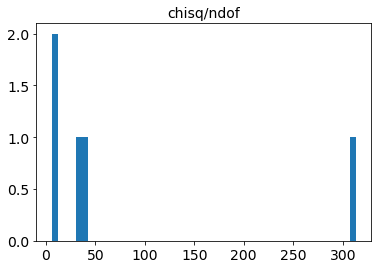

rango z : 0.013258328059516067, 0.08831531166016199
promedio z : 0.05521085689342531
desviación estándar z : 0.02879505152902215
mediana z : 0.06731050193680173


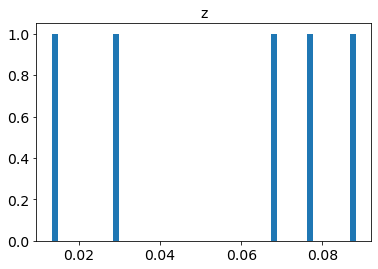

rango z_err : 0.001649911895854306, 0.013899227386137074
promedio z_err : 0.0063007804766063765
desviación estándar z_err : 0.005018541329060487
mediana z_err : 0.0026956235355964295


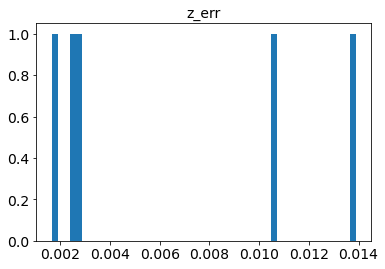

rango t0 : 58262.52464766739, 58329.76425189649
promedio t0 : 58291.154011423954
desviación estándar t0 : 24.553591825071585
mediana t0 : 58294.38757818781


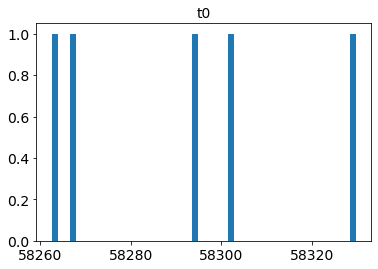

rango t0_err : 0.0453851499078155, 0.11867863076986396
promedio t0_err : 0.07060126911237603
desviación estándar t0_err : 0.02695365720146969
mediana t0_err : 0.05623405156802619


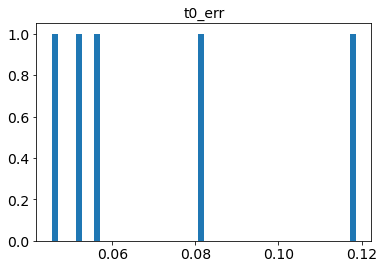

rango x0 : 0.0007387126293724358, 0.011421758159275193
promedio x0 : 0.003869270715568765
desviación estándar x0 : 0.003927985465422481
mediana x0 : 0.0027004150808625704


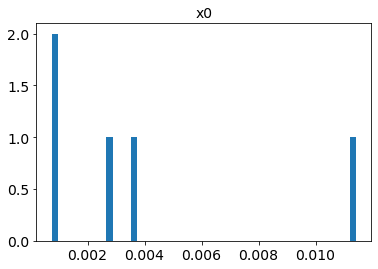

rango x0_err : 7.960554588476717e-06, 7.732491119479496e-05
promedio x0_err : 2.8154793631470588e-05
desviación estándar x0_err : 2.5026196434917046e-05
mediana x0_err : 1.6871326485615315e-05


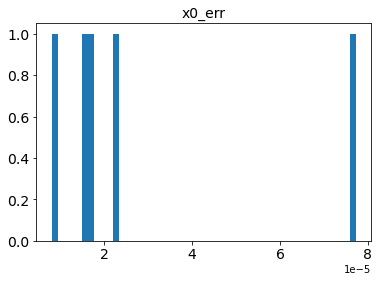

rango x1 : 0.601990036482408, 2.2816591195356315
promedio x1 : 1.218077524665936
desviación estándar x1 : 0.5695073347829773
mediana x1 : 1.1537503096113992


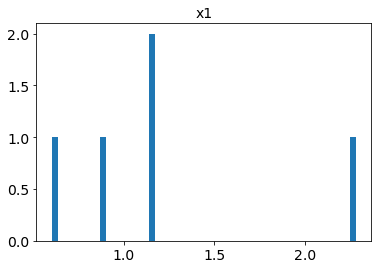

rango x1_err : 0.05026676582599032, 0.22105336768047934
promedio x1_err : 0.10624822608877978
desviación estándar x1_err : 0.06480551944257679
mediana x1_err : 0.06487942631561383


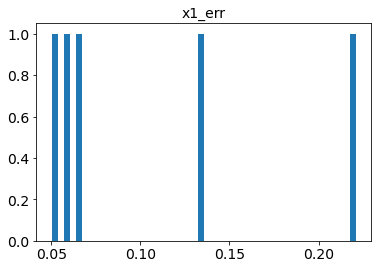

rango c : -0.017642838490926183, 0.39999999999997804
promedio c : 0.10478896741614241
desviación estándar c : 0.16023564702876167
mediana c : -0.00346488485870744


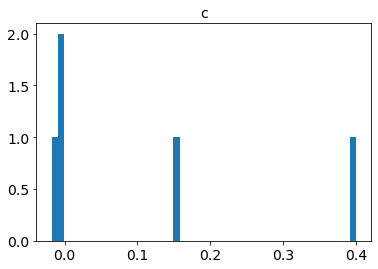

rango c_err : 0.0006582896655202286, 0.027487474320469274
promedio c_err : 0.013414186541939427
desviación estándar c_err : 0.010325069840178561
mediana c_err : 0.008629242697278716


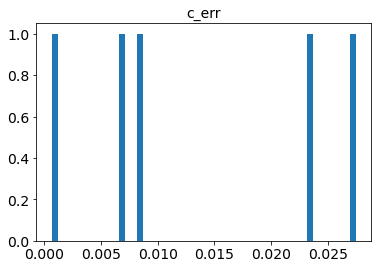

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


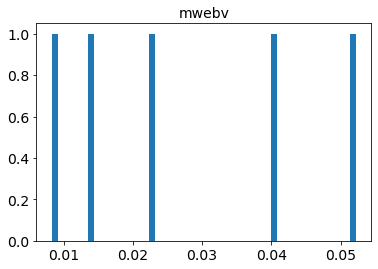

In [360]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 175, 878
promedio ncall : 420.6666666666667
desviación estándar ncall : 323.68125610784995
mediana ncall : 209.0


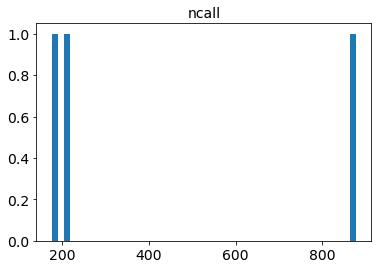

rango chisq : 1.3678884774614748, 21517.75265769396
promedio chisq : 7214.818563791039
desviación estándar chisq : 10113.828313785136
mediana chisq : 125.33514520169709


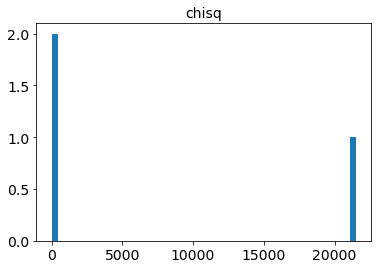

rango ndof : 3, 70
promedio ndof : 41.333333333333336
desviación estándar ndof : 28.193773938387334
mediana ndof : 51.0


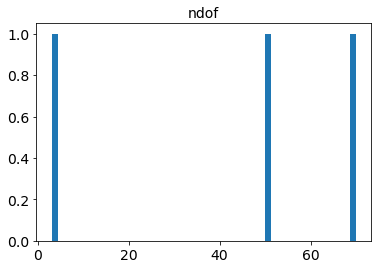

rango chisq/ndof : 0.4559628258204916, 307.39646653848513
promedio chisq/ndof : 103.4366604103352
desviación estándar chisq/ndof : 144.223676920138
mediana chisq/ndof : 2.457551866699943


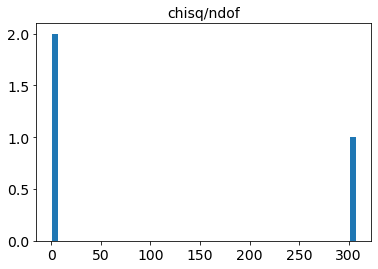

rango z : 0.050572254173817326, 0.1258575981467975
promedio z : 0.08207299703985448
desviación estándar z : 0.03193890662128234
mediana z : 0.06978913879894859


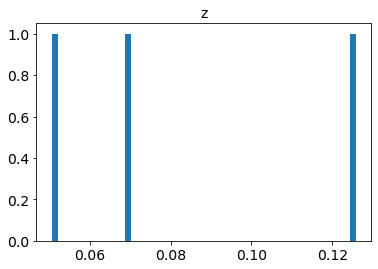

rango z_err : 6.369485363449945e-08, 0.15067062519017552
promedio z_err : 0.05488083349240485
desviación estándar z_err : 0.06797335546596361
mediana z_err : 0.013971811592185399


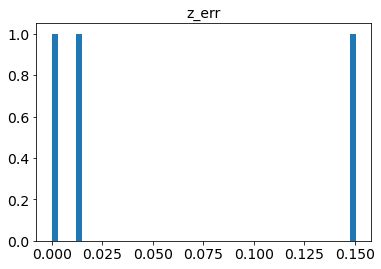

rango t0 : 58265.87510717733, 58363.873717201124
promedio t0 : 58310.072318725994
desviación estándar t0 : 40.58006239963678
mediana t0 : 58300.46813179955


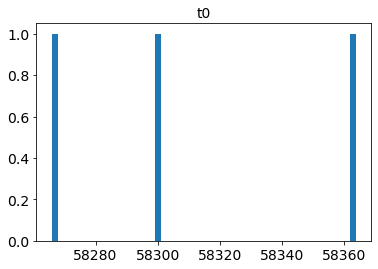

rango t0_err : 1.1818639904959127e-05, 1.2022888180836162
promedio t0_err : 0.4548280000963132
desviación estándar t0_err : 0.5326650969828153
mediana t0_err : 0.1621833635654184


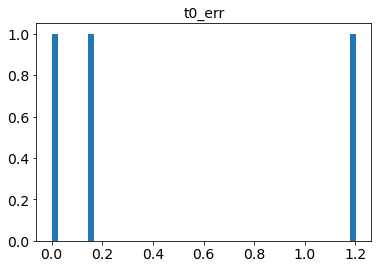

rango x0 : 0.00024055377547438754, 0.00818760688858649
promedio x0 : 0.0031201191248801954
desviación estándar x0 : 0.0035943628701903983
mediana x0 : 0.0009321967105797092


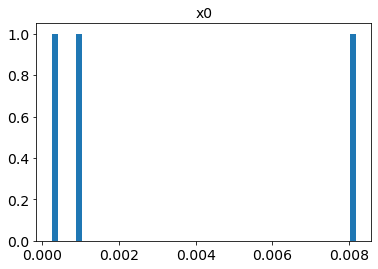

rango x0_err : 1.2177794246014235e-05, 3.753740283061824e-05
promedio x0_err : 2.138528423208172e-05
desviación estándar x0_err : 1.145857282605249e-05
mediana x0_err : 1.4440655619612696e-05


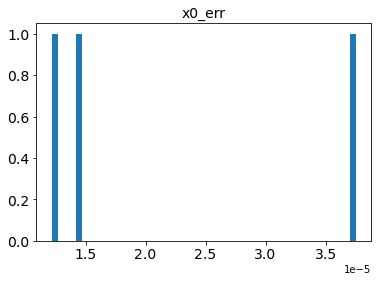

rango x1 : -1.3745138993293584, 0.9161953540451409
promedio x1 : -0.07137108839379591
desviación estándar x1 : 0.961432457027543
mediana x1 : 0.24420528010282982


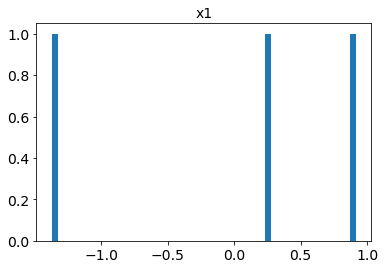

rango x1_err : 0.012669393350498659, 2.1418138437304246
promedio x1_err : 0.7571690205967657
desviación estándar x1_err : 0.9800181721135547
mediana x1_err : 0.11702382470937378


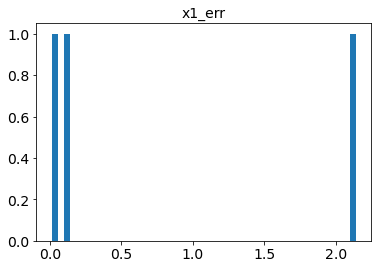

rango c : 0.04784251656255584, 0.06903477829361648
promedio c : 0.059955976110649824
desviación estándar c : 0.008913841233805456
mediana c : 0.06299063347577716


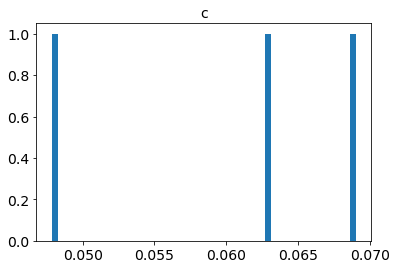

rango c_err : 0.0019205160535374355, 0.13822277123079946
promedio c_err : 0.05602086802621493
desviación estándar c_err : 0.05908665431850346
mediana c_err : 0.027919316794307897


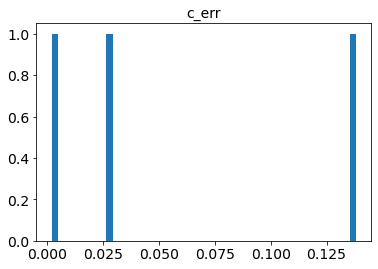

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


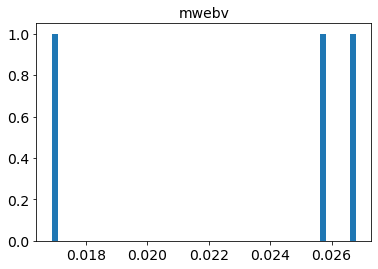

In [361]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [362]:
estadisticas_SALT3_z_bounded = estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT3 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [363]:
lista_oid_SALT3_z_bounded = list(estadisticas_SALT3_z_bounded['oid'])
lista_chisq_vs_ndof_SALT3_z_bounded = list(estadisticas_SALT3_z_bounded['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana

In [364]:
median_chisq_vs_ndof_SALT3_z_bounded = np.median(np.array(estadisticas_SALT3_z_bounded['chisq/ndof']))
df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana = estadisticas_SALT3_z_bounded[estadisticas_SALT3_z_bounded['chisq/ndof'] > median_chisq_vs_ndof_SALT3_z_bounded]
lista_oid_SALT3_z_bounded_sobre_mediana = list(df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana['oid'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [365]:
display(df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana[['oid', 
                                                        'chisq/ndof', 
                                                        'z', 
                                                        'z_err', 
                                                        't0', 
                                                        't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
38,ZTF18abdbuty,1.676841,1.175183e-01,1.668655e-02,58308.273651,1.576068e-01
17,ZTF18aaxrvzj,1.679437,1.257937e-01,3.242199e-02,58286.108908,1.649772e-01
24,ZTF18aazblzy,1.696134,1.883670e-02,5.802215e-03,58291.200089,1.098710e-01
58,ZTF18abkifng,1.750535,1.323600e-01,4.931771e-02,58343.920679,2.070761e-01
28,ZTF18aazsabq,1.852065,3.458562e-02,6.526298e-03,58293.761876,1.340640e-01
43,ZTF18abealop,1.861342,2.620719e-02,1.727052e-02,58315.752003,3.238317e-01
34,ZTF18abckujg,1.878410,2.880497e-02,9.272853e-03,58302.911566,2.325086e-01
35,ZTF18abclalx,1.897549,1.144366e-02,3.498806e-02,58300.262090,8.544299e-01
76,ZTF18abtnlik,1.925403,9.227441e-02,2.907010e-02,58379.091282,1.876913e-01
66,ZTF18abpaywm,1.940003,6.196593e-02,7.900543e-03,58368.045699,8.792701e-02


Se observa que los valores de $\frac{\chi^{2}}{ndof}$ son muy altos, y que estos tenían que ver principalmente con hay observaciones que están fuera del rango de tiempo del modelo

### Ajuste con observaciones en el rango de tiempo del modelo (determinado con $t_0$ y $z$ del primer ajuste)

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo según el primer ajuste con el modelo SALT3 y límites para $z$

In [366]:
detect_early_SNIa_SALT3_z_bounded_cortes_t = cortes_t_modelo(trest_min_modelo, 
                                                             trest_max_modelo, 
                                                             detect_early_SNIa_sin_SN15,
                                                             estadisticas_SALT3_z_bounded)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo

In [367]:
ajustes_SALT3_early_SNIa_z_bounded_cortes_t = modelo_ajustado_y_resultados('salt3', 
                                                                           df_meta_early_SNIa_sin_SN15, 
                                                                           detect_early_SNIa_SALT3_z_bounded_cortes_t,
                                                                           z_bounds=z_bounds,
                                                                           print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 123, 636
promedio ncall : 240.72
desviación estándar ncall : 92.63887736798196
mediana ncall : 208.0


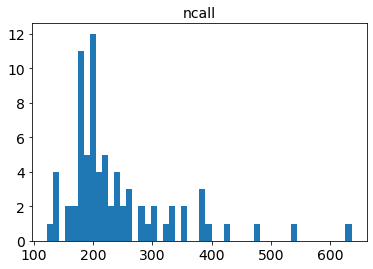

rango chisq : 4.512862788134209, 1024.1902036215376
promedio chisq : 65.62802623044398
desviación estándar chisq : 134.95717869591888
mediana chisq : 28.50630354369933


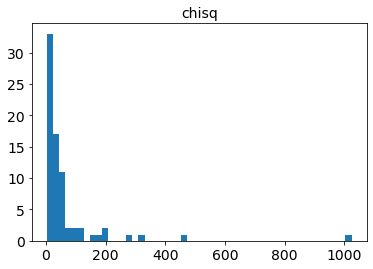

rango ndof : 5, 61
promedio ndof : 19.92
desviación estándar ndof : 11.352250878129851
mediana ndof : 17.0


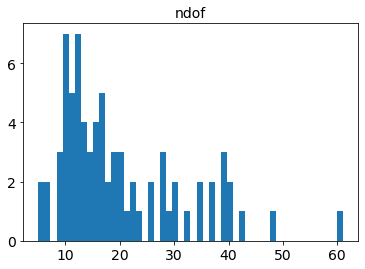

rango chisq/ndof : 0.47722158837924095, 27.740524745654053
promedio chisq/ndof : 2.9702898976825662
desviación estándar chisq/ndof : 4.4373654968499565
mediana chisq/ndof : 1.5707365954439647


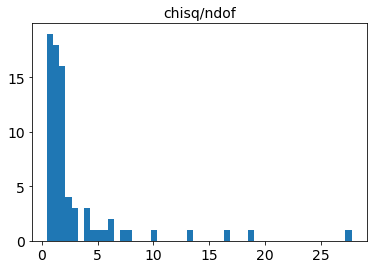

rango z : 2.1616759804388154e-08, 0.19999999225625217
promedio z : 0.07497340994217919
desviación estándar z : 0.04939801304288915
mediana z : 0.06882429835870481


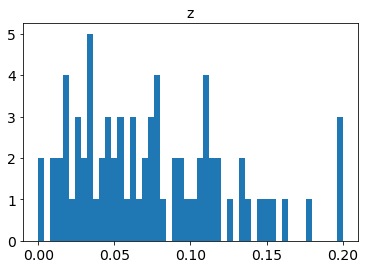

rango z_err : 2.026046853897956e-08, 0.1708037720503088
promedio z_err : 0.02332365151501239
desviación estándar z_err : 0.02944475019278879
mediana z_err : 0.016686552310929505


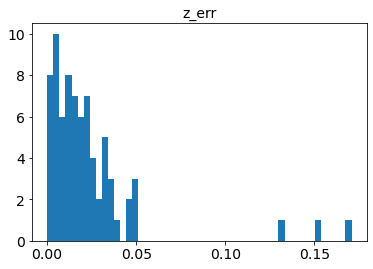

rango t0 : 58254.63512320608, 58395.08397202128
promedio t0 : 58322.663101782564
desviación estándar t0 : 38.546480633052745
mediana t0 : 58318.78219853909


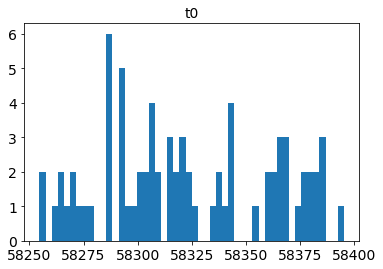

rango t0_err : 2.587512426543981e-07, 1.2954760865250137
promedio t0_err : 0.2426540386294558
desviación estándar t0_err : 0.2072009198090843
mediana t0_err : 0.19834037675173022


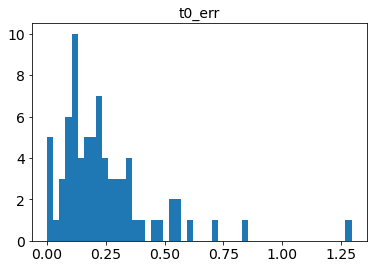

rango x0 : 0.0002311547337047612, 0.005801930559683916
promedio x0 : 0.001106570124554433
desviación estándar x0 : 0.0011876296980676076
mediana x0 : 0.000669749490846753


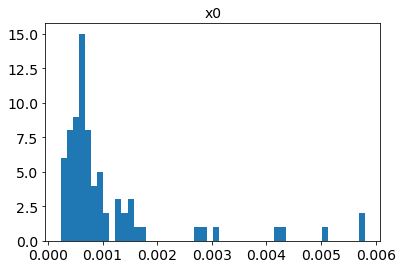

rango x0_err : 4.481226410390044e-06, 5.655730698983339e-05
promedio x0_err : 1.897387239872128e-05
desviación estándar x0_err : 1.144112070861375e-05
mediana x0_err : 1.5003406928472913e-05


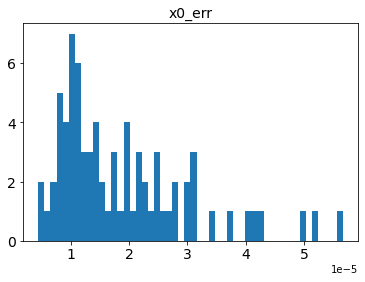

rango x1 : -2.441233773750012, 2.7058195692010614
promedio x1 : -0.026264627868559896
desviación estándar x1 : 1.1053550083859724
mediana x1 : 0.20199792082391


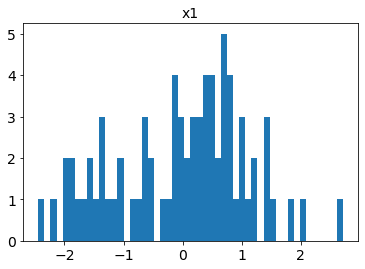

rango x1_err : 0.028065849660803277, 1.4537197859502382
promedio x1_err : 0.25329303352974786
desviación estándar x1_err : 0.2136688748402644
mediana x1_err : 0.2055636516297148


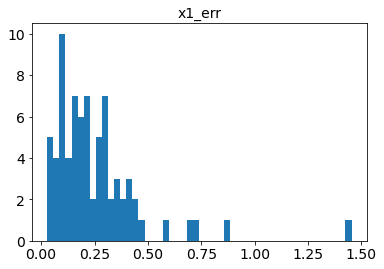

rango c : -0.2336414399383486, 0.399999893839173
promedio c : 0.01016923500119528
desviación estándar c : 0.11671521807159976
mediana c : -0.009424750997156062


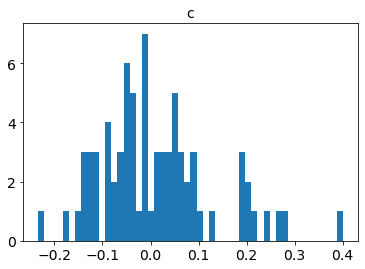

rango c_err : 0.00483996754072219, 0.6833865397438257
promedio c_err : 0.041672270545269785
desviación estándar c_err : 0.07748110153894475
mediana c_err : 0.030012445657501968


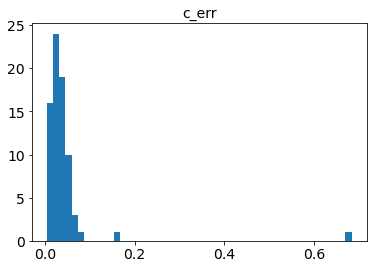

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.031452906822765546
desviación estándar mwebv : 0.022025641008680343
mediana mwebv : 0.025622750919880123


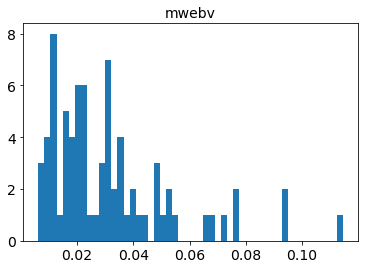

In [368]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded_cortes_t, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 158, 326
promedio ncall : 219.0
desviación estándar ncall : 61.93545026880809
mediana ncall : 187.0


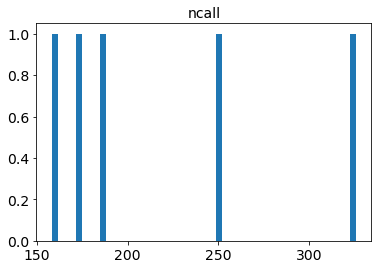

rango chisq : 68.18323749597286, 338.3810387283776
promedio chisq : 192.89586040716551
desviación estándar chisq : 117.03532996840906
mediana chisq : 141.56973692308515


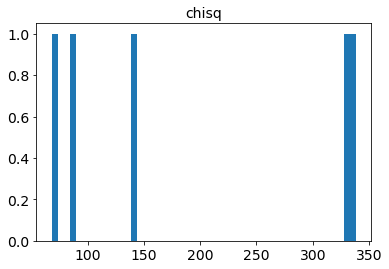

rango ndof : 15, 55
promedio ndof : 29.8
desviación estándar ndof : 13.89100428334827
mediana ndof : 25.0


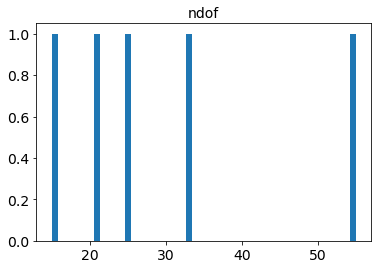

rango chisq/ndof : 3.2468208331415647, 9.936158387079631
promedio chisq/ndof : 6.178991072092603
desviación estándar chisq/ndof : 2.1475907482041747
mediana chisq/ndof : 5.896804140984276


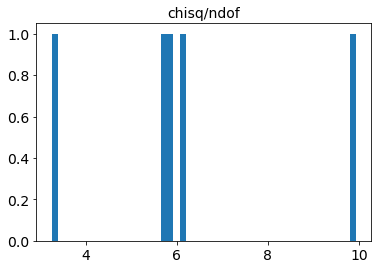

rango z : 0.01325163421515816, 0.08831874363659083
promedio z : 0.05521542070768025
desviación estándar z : 0.028797337282937343
mediana z : 0.06731050193680173


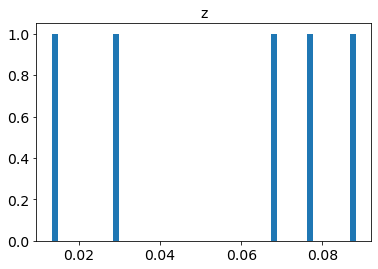

rango z_err : 0.0021394692144145024, 0.013334764964094616
promedio z_err : 0.006296615727068987
desviación estándar z_err : 0.0047534402080156605
mediana z_err : 0.002767367133988275


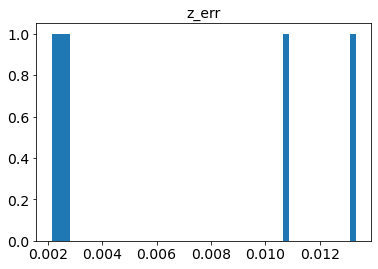

rango t0 : 58262.52464766739, 58329.76431229849
promedio t0 : 58291.154044931325
desviación estándar t0 : 24.553569954818407
mediana t0 : 58294.38768321294


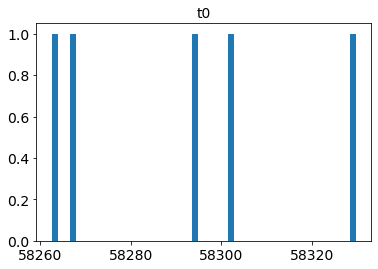

rango t0_err : 0.04614160144410562, 0.11672921421268256
promedio t0_err : 0.07270667899647379
desviación estándar t0_err : 0.02481521895178213
mediana t0_err : 0.06325309656676836


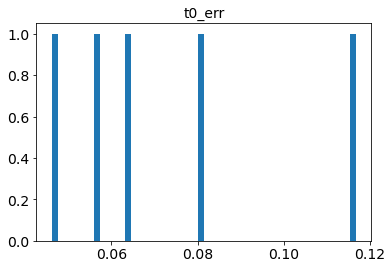

rango x0 : 0.0007387126293724358, 0.011421531312458922
promedio x0 : 0.0038692062600121737
desviación estándar x0 : 0.00392790193568969
mediana x0 : 0.0027004115174913508


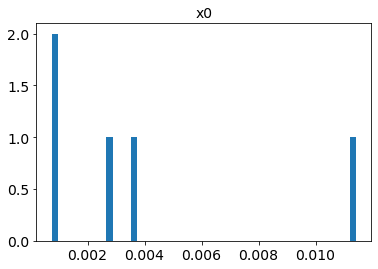

rango x0_err : 7.960554588476717e-06, 8.224107669102113e-05
promedio x0_err : 2.9214931183434805e-05
desviación estándar x0_err : 2.694636231666629e-05
mediana x0_err : 1.6865058437618248e-05


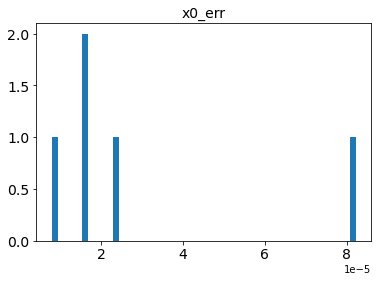

rango x1 : 0.6022145494924454, 2.2816496428184463
promedio x1 : 1.2181182594457287
desviación estándar x1 : 0.5694674447300317
mediana x1 : 1.1537503096113992


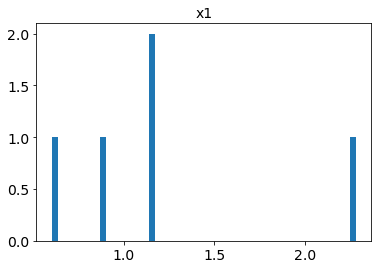

rango x1_err : 0.05618785661741965, 0.21663275829692807
promedio x1_err : 0.10673540149615998
desviación estándar x1_err : 0.06211032520621739
mediana x1_err : 0.0648722717889525


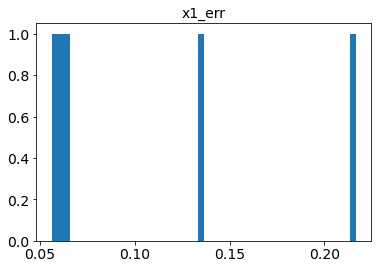

rango c : -0.017642838490926183, 0.39999999994854385
promedio c : 0.1047850182488814
desviación estándar c : 0.1602331611307728
mediana c : -0.0034324668005975556


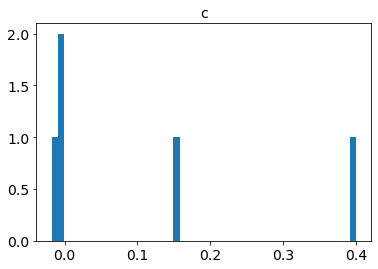

rango c_err : 0.0006584477220070717, 0.026929130641635157
promedio c_err : 0.013411147548949393
desviación estándar c_err : 0.010123330145102546
mediana c_err : 0.009106888418625197


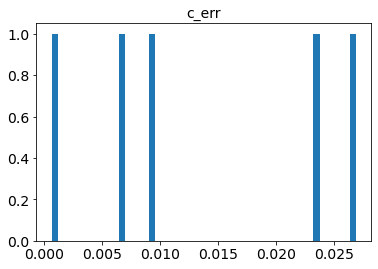

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


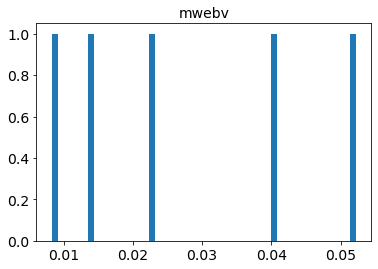

In [369]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded_cortes_t, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 176, 742
promedio ncall : 375.6666666666667
desviación estándar ncall : 259.3868839312342
mediana ncall : 209.0


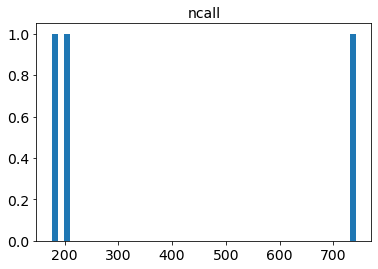

rango chisq : 1.3678884774614748, 1826.7082767348966
promedio chisq : 622.7591392106473
desviación estándar chisq : 851.4682033005512
mediana chisq : 40.201252419583554


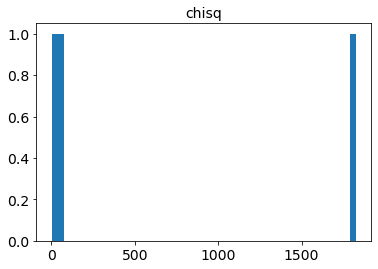

rango ndof : 3, 47
promedio ndof : 26.333333333333332
desviación estándar ndof : 18.06162291219209
mediana ndof : 29.0


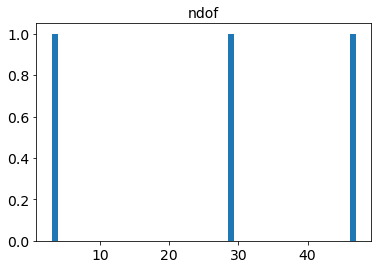

rango chisq/ndof : 0.4559628258204916, 62.9899405770654
promedio chisq/ndof : 21.433749733015745
desviación estándar chisq/ndof : 29.385116695242807
mediana chisq/ndof : 0.8553457961613522


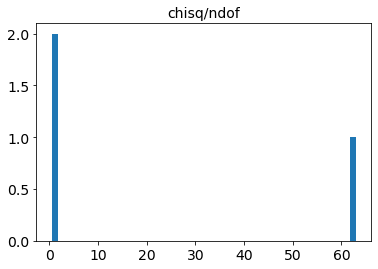

rango z : 0.05059067922847114, 0.1258575981467975
promedio z : 0.08207431073403233
desviación estándar z : 0.03193470862495531
mediana z : 0.06977465482682833


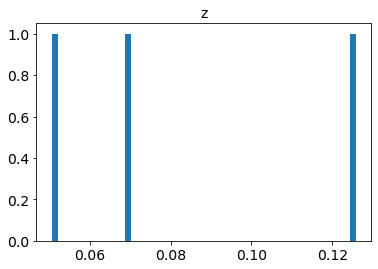

rango z_err : 2.089460847398694e-09, 0.15067062519017552
promedio z_err : 0.05473083330550999
desviación estándar z_err : 0.06806390622510623
mediana z_err : 0.013521872636893622


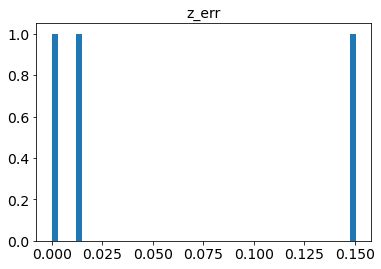

rango t0 : 58265.875809292826, 58363.873717201124
promedio t0 : 58310.07260713616
desviación estándar t0 : 40.579794631801484
mediana t0 : 58300.46829491453


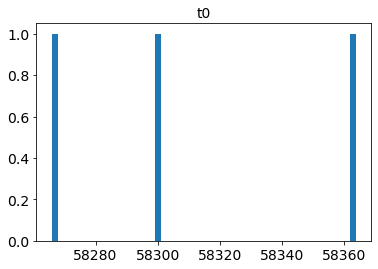

rango t0_err : 2.503038558643311e-07, 1.2022888180836162
promedio t0_err : 0.45361547704669647
desviación estándar t0_err : 0.5333347405157854
mediana t0_err : 0.15855736275261734


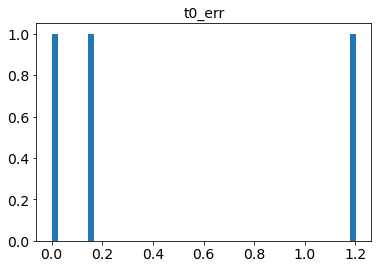

rango x0 : 0.00024055377547438754, 0.008187221131780895
promedio x0 : 0.003119986791205419
desviación estándar x0 : 0.0035941838661639807
mediana x0 : 0.0009321854663609752


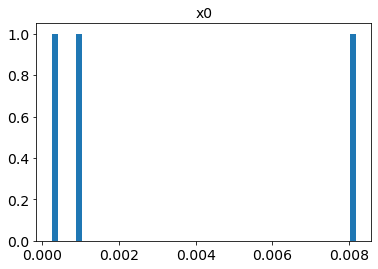

rango x0_err : 1.2532995930482032e-05, 3.753740283061824e-05
promedio x0_err : 2.143616889158472e-05
desviación estándar x0_err : 1.1406552283326828e-05
mediana x0_err : 1.4238107913653889e-05


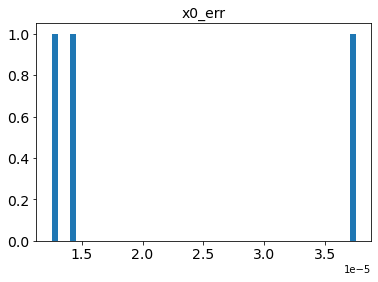

rango x1 : -1.3745138993293584, 0.9170651120898299
promedio x1 : -0.07103027379461506
desviación estándar x1 : 0.9617469860195461
mediana x1 : 0.24435796585568337


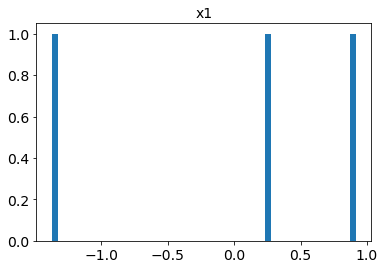

rango x1_err : 0.013154318493741268, 2.1418138437304246
promedio x1_err : 0.7573273208857026
desviación estándar x1_err : 0.9798975786448879
mediana x1_err : 0.11701380043294218


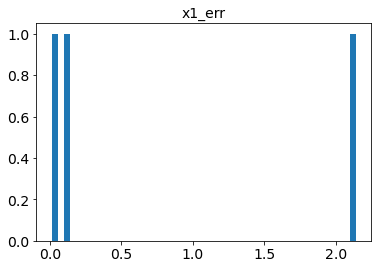

rango c : 0.04782344745861933, 0.06908303658372184
promedio c : 0.059965705839372774
desviación estándar c : 0.008938872891148206
mediana c : 0.06299063347577716


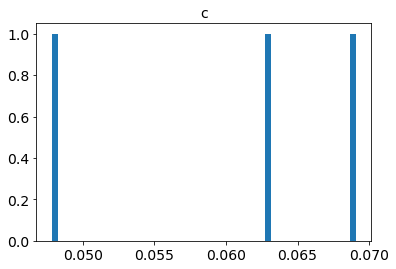

rango c_err : 0.0019895599858879565, 0.13822277123079946
promedio c_err : 0.055851912224465027
desviación estándar c_err : 0.05915754772988606
mediana c_err : 0.02734340545670766


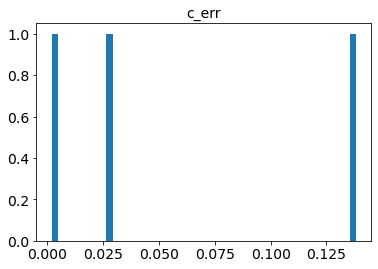

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


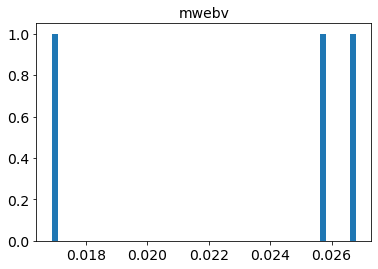

In [370]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded_cortes_t, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [371]:
estadisticas_SALT3_z_bounded_cortes_t = estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded_cortes_t).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT3 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [372]:
lista_oid_SALT3_z_bounded_cortes_t = list(estadisticas_SALT3_z_bounded_cortes_t['oid'])
lista_chisq_vs_ndof_SALT3_z_bounded_cortes_t = list(estadisticas_SALT3_z_bounded_cortes_t['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [373]:
median_chisq_vs_ndof_SALT3_z_bounded_cortes_t = np.median(np.array(estadisticas_SALT3_z_bounded_cortes_t['chisq/ndof']))
df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t = estadisticas_SALT3_z_bounded_cortes_t[estadisticas_SALT3_z_bounded_cortes_t['chisq/ndof'] > median_chisq_vs_ndof_SALT3_z_bounded_cortes_t]
lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t = list(df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t['oid'])
lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t = list(df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t['chisq/ndof'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [374]:
display(df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[['oid', 
                                                                 'chisq/ndof', 
                                                                 'z', 
                                                                 'z_err', 
                                                                 't0', 
                                                                 't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
55,ZTF18abjvhec,1.629772,1.501476e-01,1.241429e-02,58340.893166,1.127944e-01
65,ZTF18abpamut,1.635688,1.109075e-01,4.760861e-02,58367.845649,3.269917e-01
77,ZTF18abtogdl,1.641625,4.873072e-02,3.307702e-02,58381.284959,5.513288e-01
73,ZTF18absdgon,1.651643,2.431725e-02,1.487194e-02,58375.450930,2.672547e-01
38,ZTF18abdbuty,1.676841,1.175183e-01,1.668655e-02,58308.273651,1.576068e-01
17,ZTF18aaxrvzj,1.679437,1.257937e-01,3.242199e-02,58286.108908,1.649772e-01
24,ZTF18aazblzy,1.696134,1.883670e-02,5.802215e-03,58291.200089,1.098710e-01
58,ZTF18abkifng,1.750535,1.323600e-01,4.931771e-02,58343.920679,2.070761e-01
28,ZTF18aazsabq,1.852065,3.458562e-02,6.526298e-03,58293.761876,1.340640e-01
43,ZTF18abealop,1.861342,2.620719e-02,1.727052e-02,58315.752003,3.238317e-01


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT3 y $z$ variable antes y después de eliminar los puntos fuera del rango de tiempo del modelo

In [375]:
inter_oid_SALT3_z_bounded_sobre_mediana_cortes_t = np.intersect1d(np.array(lista_oid_SALT3_z_var_sobre_mediana),
                                                                  np.array(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t))
print('Elementos comunes sobre la mediana de chisq/ndof : ',
      len(inter_oid_SALT3_z_bounded_sobre_mediana_cortes_t))

Elementos comunes sobre la mediana de chisq/ndof :  31


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [376]:
table_early_SNIa_SALT3_z_bounded_cortes_t = astropy_table_detections(df_meta_early_SNIa_sin_SN15,
                                                                     detect_early_SNIa_SALT3_z_bounded_cortes_t)

Algunos gráficos interesantes de ajustes con $\frac{\chi^2}{ndof}$ mayor a la mediana

 ==== Con ajuste del redshift ====
chisq/ndof :  1.67684138492349


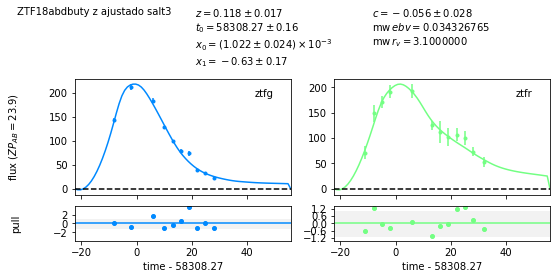

In [377]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t[4], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_t, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[4])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.705694384810282


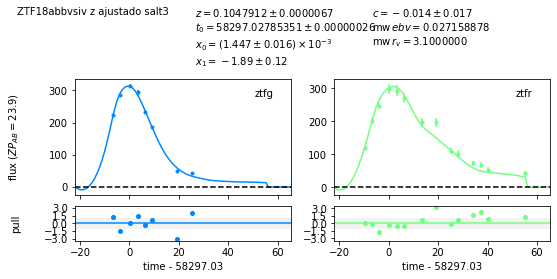

In [378]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t[17], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_t, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[17])

 ==== Con ajuste del redshift ====
chisq/ndof :  3.2468208331415647


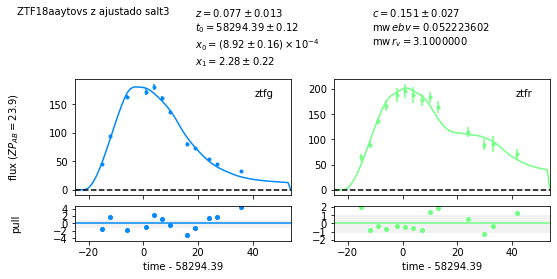

In [379]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t[20], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_t, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[20])

 ==== Con ajuste del redshift ====
chisq/ndof :  4.275911905240923


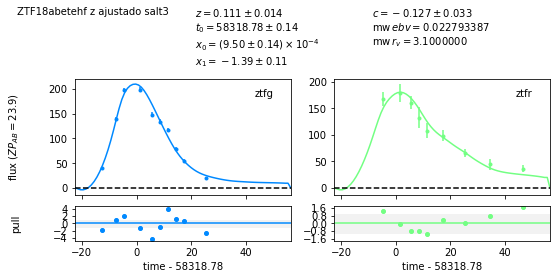

In [380]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t[23], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_t, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[23])

 ==== Con ajuste del redshift ====
chisq/ndof :  5.759041746411583


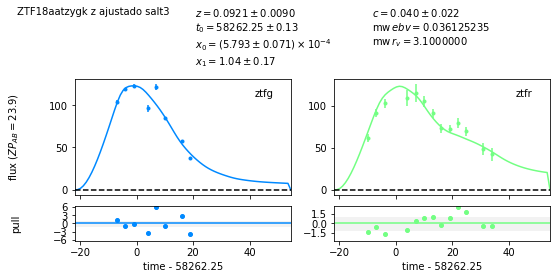

In [381]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t[27], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_t, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[27])

 ==== Con ajuste del redshift ====
chisq/ndof :  6.152382522334138


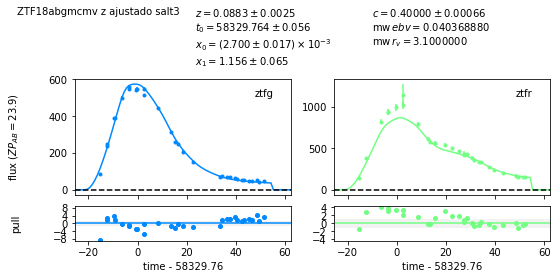

In [382]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t[30], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_t, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[30])

 ==== Con ajuste del redshift ====
chisq/ndof :  7.265246901923752


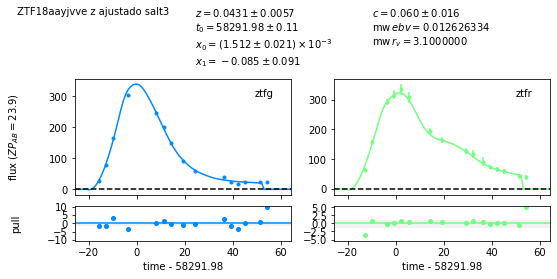

In [383]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t[32], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_t, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[32])

 ==== Con ajuste del redshift ====
chisq/ndof :  13.378144574062608


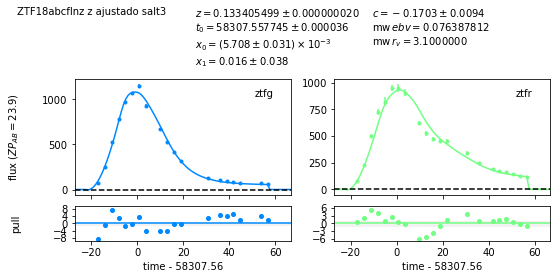

In [384]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t[36], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_t, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[36])

 ==== Con ajuste del redshift ====
chisq/ndof :  27.740524745654053


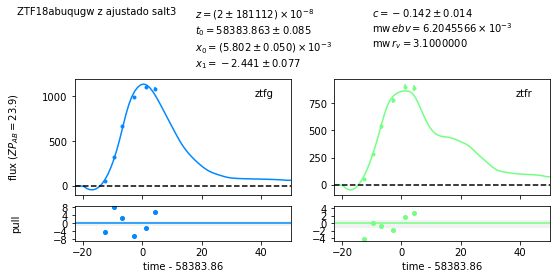

In [385]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_t[39], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_t, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_t[39])

En general los ajustes se ven bien y se parecen al caso en que se utiliza el redshift real de las SN.

Se ve que hay puntos que quedaron fuera del rango de tiempo del modelo, lo que aumenta el valor de $\frac{\chi^2}{ndof}$.

### Ajuste con observaciones en el rango de tiempo del modelo como si estuviese en el sistema de referencia en reposo (determinado con $t_0$ del primer ajuste)

Seleccionar las detecciones de las SN que están dentro del rango de tiempo del modelo asumiendo que está en el sistema de referencia en reposo $z=0$, con el valor de $t_0$ del primer ajuste con el modelo SALT3 y límites para $z$

In [386]:
detect_early_SNIa_SALT3_z_bounded_cortes_trest = cortes_trest_modelo(trest_min_modelo, 
                                                                     trest_max_modelo, 
                                                                     detect_early_SNIa_sin_SN15,
                                                                     estadisticas_SALT3_z_bounded)

Ajustes con las detecciones de las SN que están dentro del rango de tiempo del modelo

In [387]:
ajustes_SALT3_early_SNIa_z_bounded_cortes_trest = modelo_ajustado_y_resultados('salt3', 
                                                                               df_meta_early_SNIa_sin_SN15, 
                                                                               detect_early_SNIa_SALT3_z_bounded_cortes_trest, 
                                                                               z_bounds=z_bounds,
                                                                               print_ind_and_oid=False)

Estadísticas SN Ia

rango ncall : 123, 425
promedio ncall : 223.56
desviación estándar ncall : 61.9303350548017
mediana ncall : 204.0


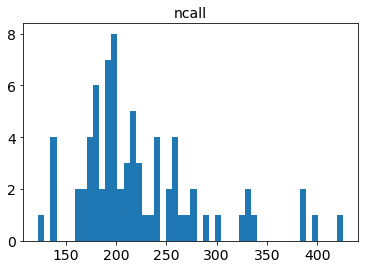

rango chisq : 4.512862788134209, 961.9926075419348
promedio chisq : 56.21717529234898
desviación estándar chisq : 118.44074830219172
mediana chisq : 28.50630354369933


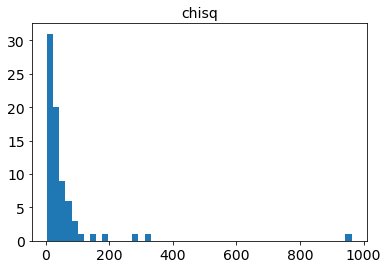

rango ndof : 5, 57
promedio ndof : 19.626666666666665
desviación estándar ndof : 10.974848012108817
mediana ndof : 16.0


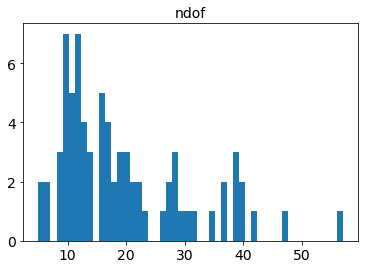

rango chisq/ndof : 0.47722158837924095, 27.740524745654053
promedio chisq/ndof : 2.7205666464774656
desviación estándar chisq/ndof : 4.221633023140787
mediana chisq/ndof : 1.5707365954439647


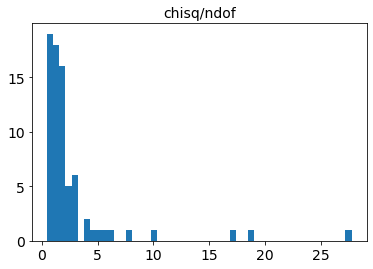

rango z : 2.1616759804388154e-08, 0.19999999225625217
promedio z : 0.0714512232830288
desviación estándar z : 0.05012575911539501
mediana z : 0.06201513729810579


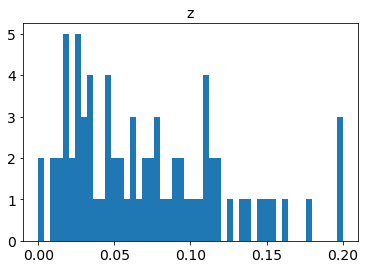

rango z_err : 0.0018111212721943159, 0.1708037720503088
promedio z_err : 0.023744540034854416
desviación estándar z_err : 0.029153182215206023
mediana z_err : 0.016686552310929505


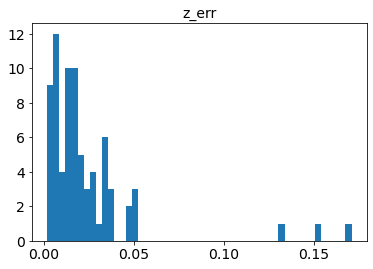

rango t0 : 58254.63512320608, 58395.08397202128
promedio t0 : 58322.62378108586
desviación estándar t0 : 38.56711645639689
mediana t0 : 58318.78219853909


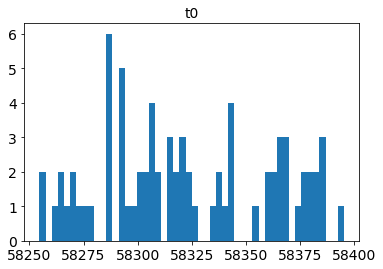

rango t0_err : 0.04994850590810529, 1.2954760865250137
promedio t0_err : 0.2497093339751882
desviación estándar t0_err : 0.2006544933541074
mediana t0_err : 0.19834037675173022


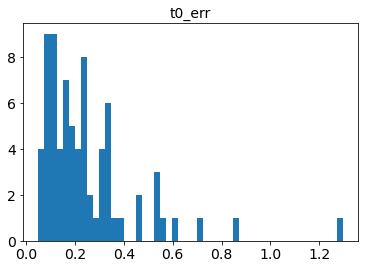

rango x0 : 0.0002311547337047612, 0.006440537754551899
promedio x0 : 0.0011234357355353565
desviación estándar x0 : 0.0012425646240967257
mediana x0 : 0.000669749490846753


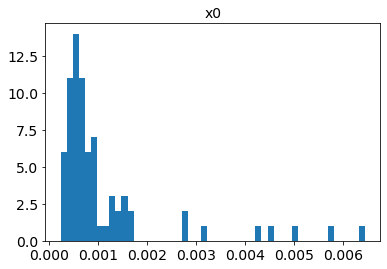

rango x0_err : 4.720434321243278e-06, 5.655730698983339e-05
promedio x0_err : 1.973284292059528e-05
desviación estándar x0_err : 1.2243841347360904e-05
mediana x0_err : 1.6044792574518454e-05


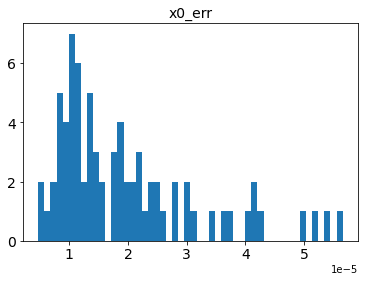

rango x1 : -2.441233773750012, 2.7058195692010614
promedio x1 : -0.027841586320314644
desviación estándar x1 : 1.1077587490473613
mediana x1 : 0.18700260189001927


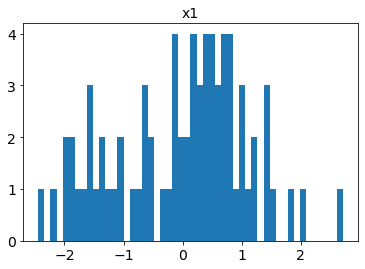

rango x1_err : 0.03488292083280342, 1.4537197859502382
promedio x1_err : 0.2544909215162853
desviación estándar x1_err : 0.21263785745919736
mediana x1_err : 0.2055636516297148


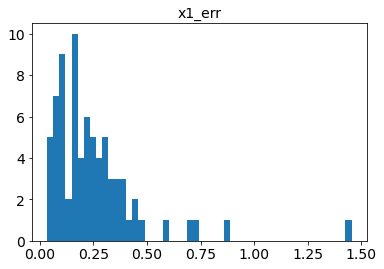

rango c : -0.2336414399383486, 0.399999893839173
promedio c : 0.01515054279403564
desviación estándar c : 0.11355915217341102
mediana c : 0.0017346098669177579


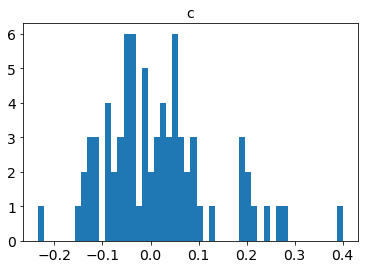

rango c_err : 0.00484671013199825, 0.6833865397438257
promedio c_err : 0.04194256547780439
desviación estándar c_err : 0.07738682841683983
mediana c_err : 0.030012445657501968


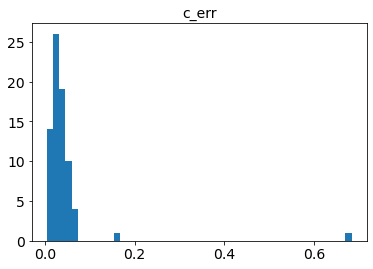

rango mwebv : 0.006204556550167132, 0.1144183424611353
promedio mwebv : 0.031452906822765546
desviación estándar mwebv : 0.022025641008680343
mediana mwebv : 0.025622750919880123


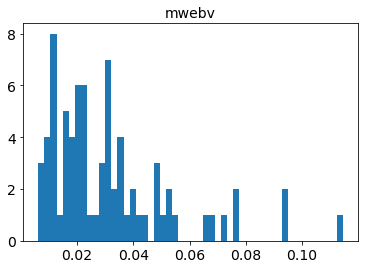

In [388]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded_cortes_trest, oids=SN_Ia)

Estadísticas SN Ia-91T

rango ncall : 158, 348
promedio ncall : 221.0
desviación estándar ncall : 68.92314560436138
mediana ncall : 187.0


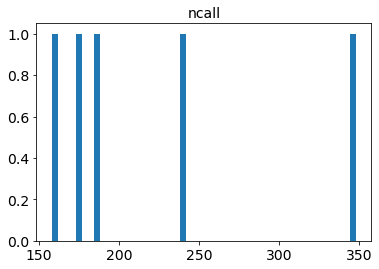

rango chisq : 68.18323749597286, 326.92363076209426
promedio chisq : 190.17722398945563
desviación estándar chisq : 113.73197199306296
mediana chisq : 141.56973692308515


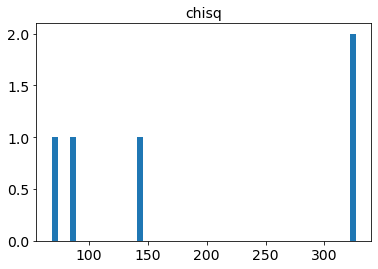

rango ndof : 15, 52
promedio ndof : 28.8
desviación estándar ndof : 12.718490476467716
mediana ndof : 25.0


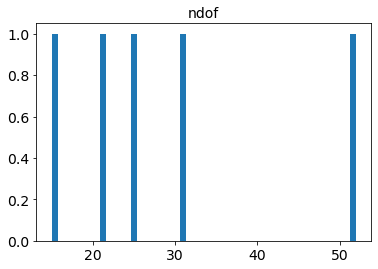

rango chisq/ndof : 3.2468208331415647, 10.508304924237471
promedio chisq/ndof : 6.320342454911552
desviación estándar chisq/ndof : 2.3494015246039543
mediana chisq/ndof : 5.896804140984276


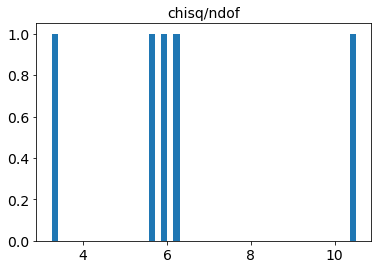

rango z : 0.012534291437280699, 0.08866199840441637
promedio z : 0.05514060310566986
desviación estándar z : 0.02908596972515463
mediana z : 0.06731050193680173


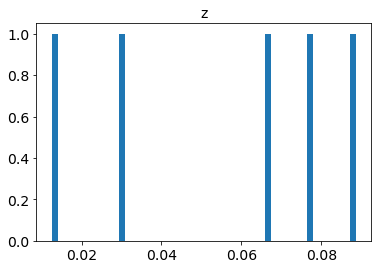

rango z_err : 0.0016754009210833637, 0.013334764964094616
promedio z_err : 0.006209170069607308
desviación estándar z_err : 0.004833424093392592
mediana z_err : 0.002767367133988275


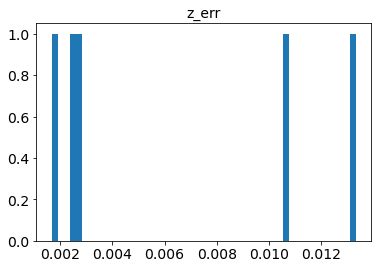

rango t0 : 58262.52464766739, 58329.76364053107
promedio t0 : 58291.149905025704
desviación estándar t0 : 24.551597561506444
mediana t0 : 58294.38768321294


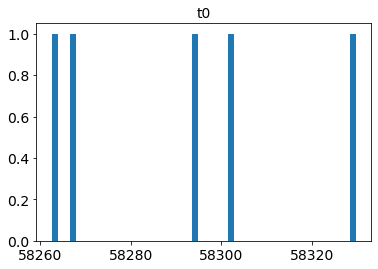

rango t0_err : 0.04614160144410562, 0.11672921421268256
promedio t0_err : 0.0705910022414173
desviación estándar t0_err : 0.025965290373765854
mediana t0_err : 0.05650073778087972


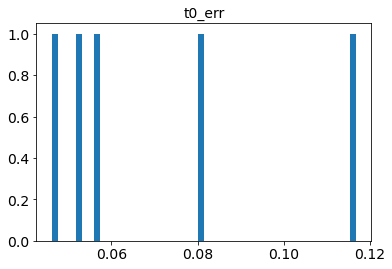

rango x0 : 0.0007387126293724358, 0.01144628406603895
promedio x0 : 0.0038740393402048622
desviación estándar x0 : 0.0039374565141396985
mediana x0 : 0.0026998241648747653


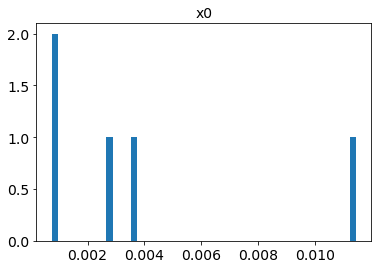

rango x0_err : 7.960554588476717e-06, 7.892914679162033e-05
promedio x0_err : 2.8552624937403974e-05
desviación estándar x0_err : 2.5643947597681042e-05
mediana x0_err : 1.686545710686489e-05


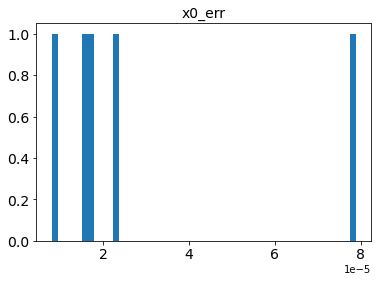

rango x1 : 0.6022145494924454, 2.2816496428184463
promedio x1 : 1.2145866262180247
desviación estándar x1 : 0.5711251923129689
mediana x1 : 1.1518887732915744


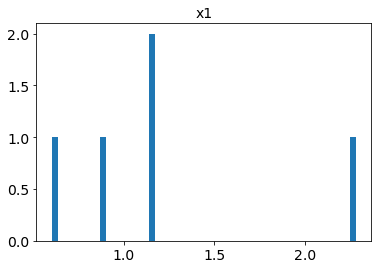

rango x1_err : 0.05073743588124424, 0.21663275829692807
promedio x1_err : 0.10566532568822033
desviación estándar x1_err : 0.06301601213340507
mediana x1_err : 0.06497231348542964


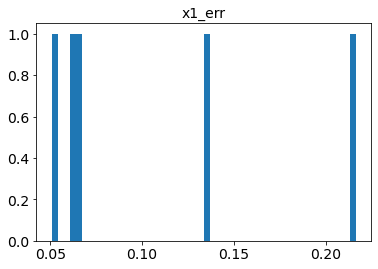

rango c : -0.017642838490926183, 0.39999999996807056
promedio c : 0.10481580743429411
desviación estándar c : 0.16021237737634902
mediana c : -0.0032785208930607435


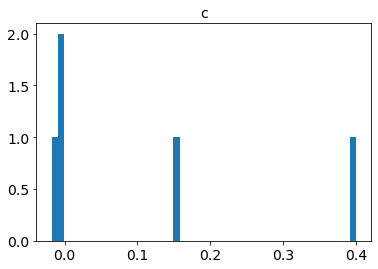

rango c_err : 0.0006479168385304934, 0.026929130641635157
promedio c_err : 0.01332483682586152
desviación estándar c_err : 0.01016309171204781
mediana c_err : 0.008685865686662408


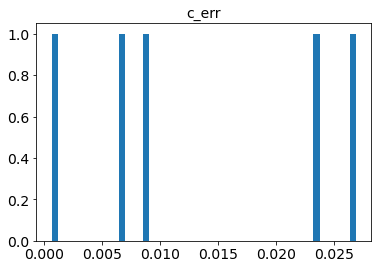

rango mwebv : 0.00828877761089716, 0.052223602240705956
promedio mwebv : 0.02759543868055308
desviación estándar mwebv : 0.016423406995884314
mediana mwebv : 0.023156305529974434


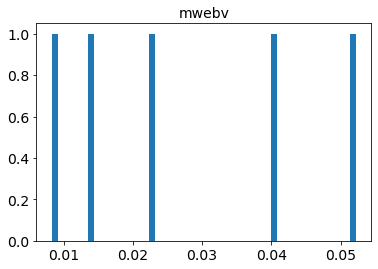

In [389]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded_cortes_trest, oids=SN_Ia_91T)

Estadísticas de las que no tienen el tipo especificado

rango ncall : 176, 209
promedio ncall : 194.0
desviación estándar ncall : 13.638181696985855
mediana ncall : 197.0


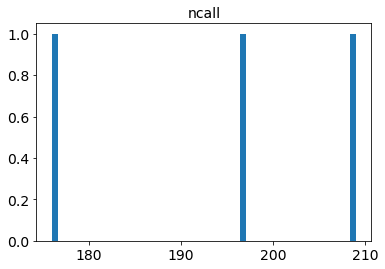

rango chisq : 1.3678884774614748, 818.8362282532684
promedio chisq : 286.8017897167711
desviación estándar chisq : 376.5390554160349
mediana chisq : 40.201252419583554


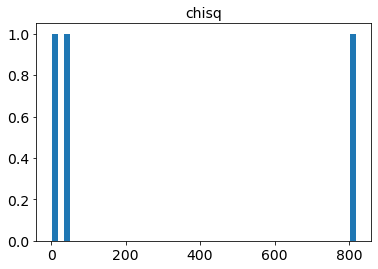

rango ndof : 3, 47
promedio ndof : 25.666666666666668
desviación estándar ndof : 17.98765008430939
mediana ndof : 27.0


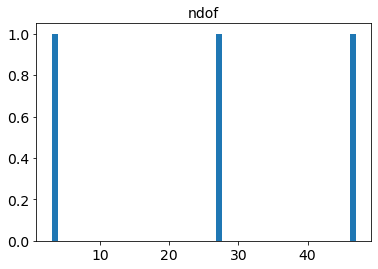

rango chisq/ndof : 0.4559628258204916, 30.327267713084012
promedio chisq/ndof : 10.546192111688619
desviación estándar chisq/ndof : 13.988282969455536
mediana chisq/ndof : 0.8553457961613522


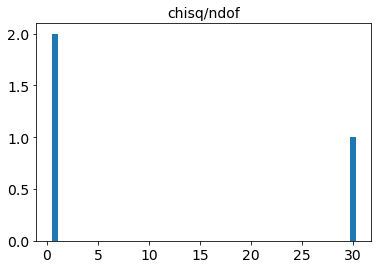

rango z : 0.028260625505198957, 0.1258575981467975
promedio z : 0.06823630096015587
desviación estándar z : 0.041751792312223056
mediana z : 0.05059067922847114


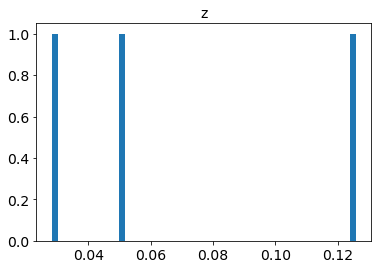

rango z_err : 0.0009228457109131949, 0.15067062519017552
promedio z_err : 0.055038447845994105
desviación estándar z_err : 0.06781749468272484
mediana z_err : 0.013521872636893622


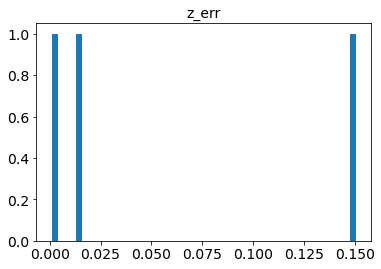

rango t0 : 58265.36683562373, 58363.873717201124
promedio t0 : 58309.90294924646
desviación estándar t0 : 40.76486196303452
mediana t0 : 58300.46829491453


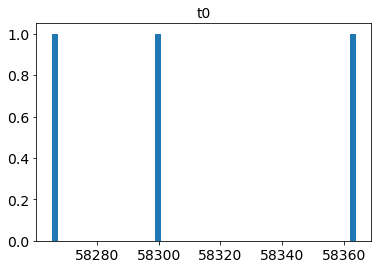

rango t0_err : 0.0191888554727484, 1.2022888180836162
promedio t0_err : 0.46001167876966065
desviación estándar t0_err : 0.5279440682916052
mediana t0_err : 0.15855736275261734


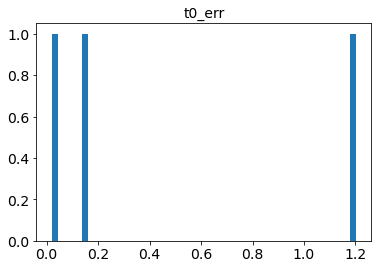

rango x0 : 0.00024055377547438754, 0.008459798142658152
promedio x0 : 0.0032108457948311713
desviación estándar x0 : 0.003722294468136415
mediana x0 : 0.0009321854663609752


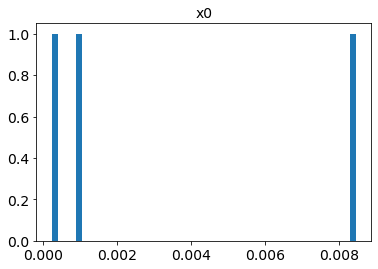

rango x0_err : 1.4238107913653889e-05, 3.753740283061824e-05
promedio x0_err : 2.349249995851371e-05
desviación estándar x0_err : 1.0097063315518422e-05
mediana x0_err : 1.8701989131268997e-05


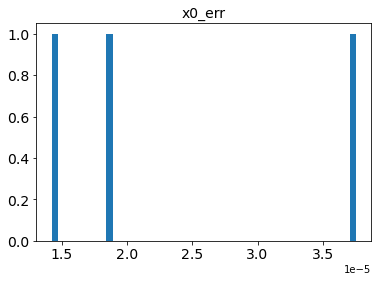

rango x1 : -1.3745138993293584, 0.8358811308809608
promedio x1 : -0.09809160086423807
desviación estándar x1 : 0.9343144819258721
mediana x1 : 0.24435796585568337


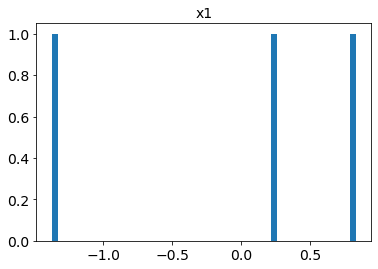

rango x1_err : 0.01832705302323223, 2.1418138437304246
promedio x1_err : 0.7590515657288663
desviación estándar x1_err : 0.9785902808382477
mediana x1_err : 0.11701380043294218


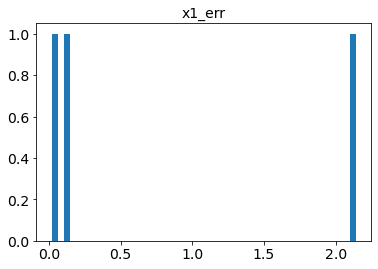

rango c : 0.04782344745861933, 0.13020819738827494
promedio c : 0.08034075944089047
desviación estándar c : 0.03580113507043175
mediana c : 0.06299063347577716


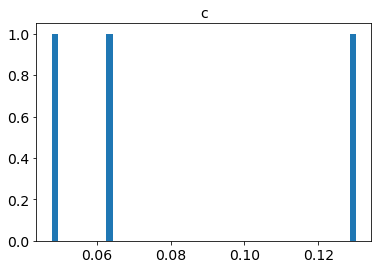

rango c_err : 0.0023037162946984435, 0.13822277123079946
promedio c_err : 0.05595663099406852
desviación estándar c_err : 0.059062311053212385
mediana c_err : 0.02734340545670766


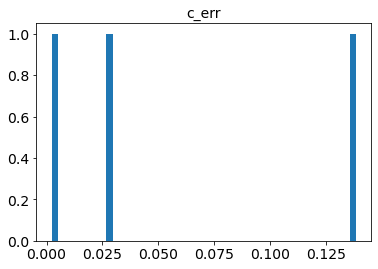

rango mwebv : 0.016887494541200157, 0.02679574322656395
promedio mwebv : 0.023129291898903063
desviación estándar mwebv : 0.004436038276329697
mediana mwebv : 0.025704637928945083


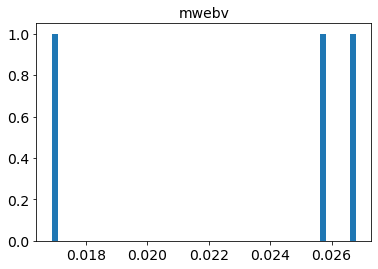

In [390]:
histogramas_estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded_cortes_trest, oids=Ia_tipo_no_especif)

Estadísticas de los ajustes, ordenados por valor de chisq/ndof

In [391]:
estadisticas_SALT3_z_bounded_cortes_trest = estadisticas_resultados(ajustes_SALT3_early_SNIa_z_bounded_cortes_trest).sort_values(by=['chisq/ndof'])

Listas de los oid y de los valores de chisq/ndof del ajuste con con el modelo SALT3 y redshift variable, utilizando los puntos que pertenecen al rango de tiempo del modelo (determinado con los valores de $t_0$ del primer ajuste y $z=0$), ordenados según el valor de chisq/ndof

In [392]:
lista_oid_SALT3_z_bounded_cortes_trest = list(estadisticas_SALT3_z_bounded_cortes_trest['oid'])
lista_chisq_vs_ndof_SALT3_z_bounded_cortes_trest = list(estadisticas_SALT3_z_bounded_cortes_trest['chisq/ndof'])

Filas de los resultados del ajuste con chisq/ndof sobre la 
mediana 

In [393]:
median_chisq_vs_ndof_SALT3_z_bounded_cortes_trest = np.median(np.array(estadisticas_SALT3_z_bounded_cortes_trest['chisq/ndof']))
df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest = estadisticas_SALT3_z_bounded_cortes_trest[estadisticas_SALT3_z_bounded_cortes_trest['chisq/ndof'] > median_chisq_vs_ndof_SALT3_z_bounded_cortes_trest]
lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest = list(df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest['oid'])
lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest = list(df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest['chisq/ndof'])

Mostrar algunas columnas de los resultados del ajuste, con valores de chisq/ndof sobre la mediana

In [394]:
display(df_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[['oid', 
                                                                     'chisq/ndof', 
                                                                     'z', 
                                                                     'z_err', 
                                                                     't0', 
                                                                     't0_err']])

,oid,chisq/ndof,z,z_err,t0,t0_err
55,ZTF18abjvhec,1.629772,1.501476e-01,0.012414,58340.893166,0.112794
65,ZTF18abpamut,1.635688,1.109075e-01,0.047609,58367.845649,0.326992
77,ZTF18abtogdl,1.641625,4.873072e-02,0.033077,58381.284959,0.551329
73,ZTF18absdgon,1.651643,2.431725e-02,0.014872,58375.450930,0.267255
38,ZTF18abdbuty,1.676841,1.175183e-01,0.016687,58308.273651,0.157607
17,ZTF18aaxrvzj,1.679437,1.257937e-01,0.032422,58286.108908,0.164977
24,ZTF18aazblzy,1.696134,1.883670e-02,0.005802,58291.200089,0.109871
58,ZTF18abkifng,1.750535,1.323600e-01,0.049318,58343.920679,0.207076
43,ZTF18abealop,1.861342,2.620719e-02,0.017271,58315.752003,0.323832
34,ZTF18abckujg,1.878410,2.880497e-02,0.009273,58302.911566,0.232509


Intersección de los oid de las SN con valores de chisq/ndof mayores a la mediana de los ajustes con SALT3 y $z$ variable antes y después de eliminar los puntos fuera del rango de tiempo del modelo como si en el primer ajuste estuviese en el sistema de referencia en reposo (cota inferior del rango de tiempo)

In [395]:
inter_oid_SALT3_z_bounded_sobre_mediana_cortes_trest = np.intersect1d(np.array(lista_oid_SALT3_z_var_sobre_mediana),
                                                                      np.array(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest))
print('Elementos comunes sobre la mediana de chisq/ndof : ',
      len(inter_oid_SALT3_z_bounded_sobre_mediana_cortes_trest))

Elementos comunes sobre la mediana de chisq/ndof :  31


Tabla de astropy con las detecciones que están en el rango de tiempo del modelo, en el formato que requiere sncosmo para hacer los ajustes 

In [396]:
table_early_SNIa_SALT3_z_bounded_cortes_trest = astropy_table_detections(df_meta_early_SNIa_sin_SN15,
                                                                         detect_early_SNIa_SALT3_z_bounded_cortes_trest)

Algunos gráficos de ajustes con $\frac{\chi^2}{ndof}$ mayor a la mediana

Los ajustes se parecen al caso en que se usa el redshift real.

 ==== Con ajuste del redshift ====
chisq/ndof :  1.67684138492349


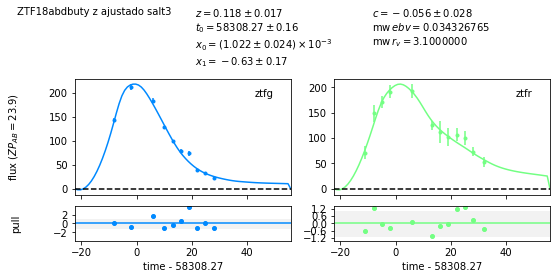

In [397]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest[4], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_trest, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[4])

 ==== Con ajuste del redshift ====
chisq/ndof :  1.8975488295471312


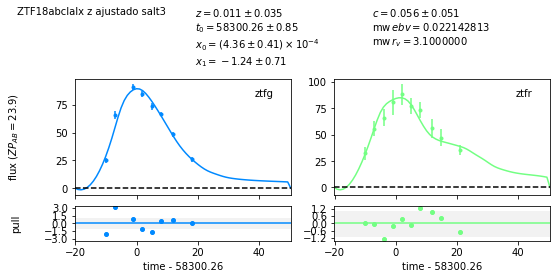

In [398]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest[10], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_trest, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[10])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.5442169838400828


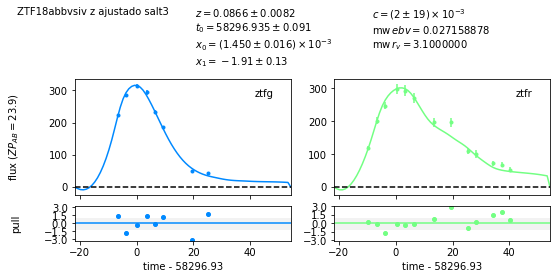

In [399]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest[17], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_trest, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[17])

 ==== Con ajuste del redshift ====
chisq/ndof :  2.760021578282748


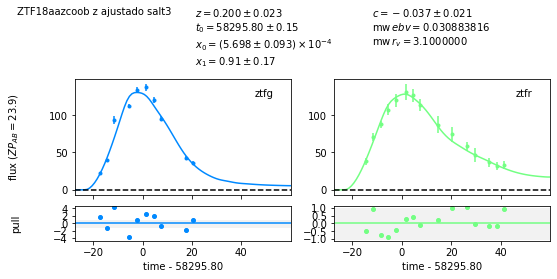

In [400]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest[19], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_trest, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[19])

 ==== Con ajuste del redshift ====
chisq/ndof :  3.1896082846271554


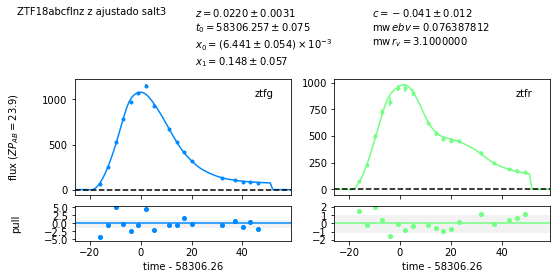

In [401]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest[23], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_trest, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[23])

 ==== Con ajuste del redshift ====
chisq/ndof :  3.2468208331415647


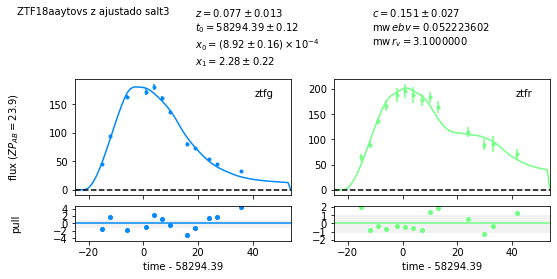

In [402]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest[24], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_trest, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[24])

 ==== Con ajuste del redshift ====
chisq/ndof :  5.759041746411583


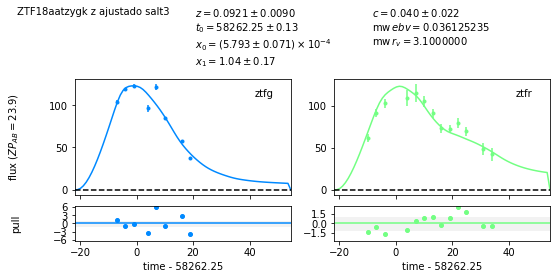

In [403]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest[30], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_trest, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[30])

 ==== Con ajuste del redshift ====
chisq/ndof :  19.001597626071575


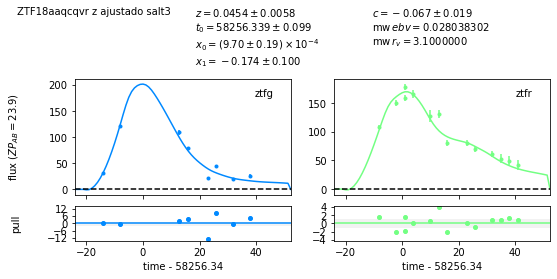

In [404]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest[38], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_trest, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[38])

 ==== Con ajuste del redshift ====
chisq/ndof :  30.327267713084012


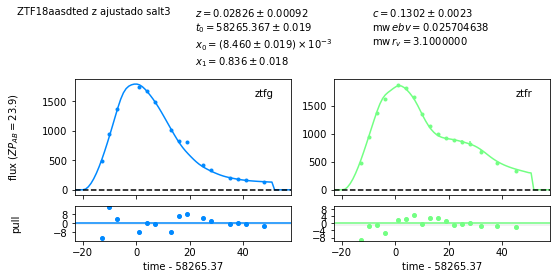

In [405]:
ajuste(lista_oid_SALT3_z_bounded_sobre_mediana_cortes_trest[40], 'salt3', df_meta_early_SNIa_sin_SN15, 
       table_early_SNIa_SALT3_z_bounded_cortes_trest, z_bounds=z_bounds)[0]
print('chisq/ndof : ', lista_chisq_vs_ndof_SALT3_z_bounded_sobre_mediana_cortes_trest[40])

# Comparación de los valores de $\frac{\chi^2}{ndof}$ de todos los ajustes

### Seleccionar las columnas oid y $\frac{\chi^2}{ndof}$ de las estadísticas de cada uno de los ajustes y renombrar las columnas de $\frac{\chi^2}{ndof}$ 

Ajustes con $z$ fijo y con todas las observaciones

In [406]:
SALT2_z_fijo = estadisticas_SALT2_z_fijo[['oid', 'chisq/ndof']]
SALT3_z_fijo = estadisticas_SALT3_z_fijo[['oid', 'chisq/ndof']]

SALT2_z_fijo = SALT2_z_fijo.rename(columns={'chisq/ndof': 'SALT2_z_fijo'})
SALT3_z_fijo = SALT3_z_fijo.rename(columns={'chisq/ndof': 'SALT3_z_fijo'})

Ajustes con $z$ variable y con todas las observaciones

In [407]:
SALT2_z_var = estadisticas_SALT2_z_var[['oid', 'chisq/ndof']]
SALT3_z_var = estadisticas_SALT3_z_var[['oid', 'chisq/ndof']]

SALT2_z_var = SALT2_z_var.rename(columns={'chisq/ndof': 'SALT2_z_var'})
SALT3_z_var = SALT3_z_var.rename(columns={'chisq/ndof': 'SALT3_z_var'})

Ajustes con $z$ fijo y con las observaciones que están en el rango de tiempo del modelo determinado con $t_0$ del primer ajuste y $z_{real}$ (cortes_t)

In [408]:
SALT2_z_fijo_cortes_t = estadisticas_SALT2_z_fijo_cortes_t[['oid', 'chisq/ndof']]
SALT3_z_fijo_cortes_t = estadisticas_SALT3_z_fijo_cortes_t[['oid', 'chisq/ndof']]

SALT2_z_fijo_cortes_t = SALT2_z_fijo_cortes_t.rename(columns={'chisq/ndof': 'SALT2_z_fijo_cortes_t'})
SALT3_z_fijo_cortes_t = SALT3_z_fijo_cortes_t.rename(columns={'chisq/ndof': 'SALT3_z_fijo_cortes_t'})

Ajustes con $z$ variable con las observaciones que están en el rango de tiempo del modelo determinado con $t_0$ y $z$ del primer ajuste (cortes_t)

In [409]:
SALT2_z_var_cortes_t = estadisticas_SALT2_z_var_cortes_t[['oid', 'chisq/ndof']]
SALT3_z_var_cortes_t = estadisticas_SALT3_z_var_cortes_t[['oid', 'chisq/ndof']]

SALT2_z_var_cortes_t = SALT2_z_var_cortes_t.rename(columns={'chisq/ndof': 'SALT2_z_var_cortes_t'})
SALT3_z_var_cortes_t = SALT3_z_var_cortes_t.rename(columns={'chisq/ndof': 'SALT3_z_var_cortes_t'})

Ajustes con $z$ fijo con las observaciones que están en el rango de tiempo del modelo como si estuviese en el sistema de referencia en reposo ($z =0$) determinado con $t_0$ (cortes_trest) (para comparar los resultados)

In [410]:
SALT2_z_fijo_cortes_trest = estadisticas_SALT2_z_fijo_cortes_trest[['oid', 'chisq/ndof']]
SALT3_z_fijo_cortes_trest = estadisticas_SALT3_z_fijo_cortes_trest[['oid', 'chisq/ndof']]

SALT2_z_fijo_cortes_trest = SALT2_z_fijo_cortes_trest.rename(columns={'chisq/ndof': 'SALT2_z_fijo_cortes_trest'})
SALT3_z_fijo_cortes_trest = SALT3_z_fijo_cortes_trest.rename(columns={'chisq/ndof': 'SALT3_z_fijo_cortes_trest'})

Ajustes con $z$ variable con las observaciones que están en el rango de tiempo del modelo como si estuviese en el sistema de referencia en reposo ($z =0$) determinado con $t_0$ (cortes_trest) (para evitar el caso en que las observaciones quedan fuera del rango de tiempo del modelo, ya que esto podría ser una cota inferior del rango de tiempo si $t_0$ está bien determinado)

In [411]:
SALT2_z_var_cortes_trest = estadisticas_SALT2_z_var_cortes_trest[['oid', 'chisq/ndof']]
SALT3_z_var_cortes_trest = estadisticas_SALT3_z_var_cortes_trest[['oid', 'chisq/ndof']]

SALT2_z_var_cortes_trest = SALT2_z_var_cortes_trest.rename(columns={'chisq/ndof': 'SALT2_z_var_cortes_trest'})
SALT3_z_var_cortes_trest = SALT3_z_var_cortes_trest.rename(columns={'chisq/ndof': 'SALT3_z_var_cortes_trest'})

Ajustes con $z$ variable en un rango entre $[0, 0.2]$ y con todas las observaciones

In [412]:
SALT2_z_bounded = estadisticas_SALT2_z_bounded[['oid', 'chisq/ndof']]
SALT3_z_bounded = estadisticas_SALT3_z_bounded[['oid', 'chisq/ndof']]

SALT2_z_bounded = SALT2_z_bounded.rename(columns={'chisq/ndof': 'SALT2_z_bounded'})
SALT3_z_bounded = SALT3_z_bounded.rename(columns={'chisq/ndof': 'SALT3_z_bounded'})

Ajustes con $z$ variable en un rango entre $[0, 0.2]$ con las observaciones que están en el rango de tiempo del modelo determinado con $t_0$ y $z$ del primer ajuste (cortes_t)

In [413]:
SALT2_z_bounded_cortes_t = estadisticas_SALT2_z_bounded_cortes_t[['oid', 'chisq/ndof']]
SALT3_z_bounded_cortes_t = estadisticas_SALT3_z_bounded_cortes_t[['oid', 'chisq/ndof']]

SALT2_z_bounded_cortes_t = SALT2_z_bounded_cortes_t.rename(columns={'chisq/ndof': 'SALT2_z_bounded_cortes_t'})
SALT3_z_bounded_cortes_t = SALT3_z_bounded_cortes_t.rename(columns={'chisq/ndof': 'SALT3_z_bounded_cortes_t'})

Ajustes con $z$ variable en un rango entre $[0, 0.2]$ con las observaciones que están en el rango de tiempo del modelo como si estuviese en el sistema de referencia en reposo ($z =0$) determinado con $t_0$ (cortes_trest)

In [414]:
SALT2_z_bounded_cortes_trest = estadisticas_SALT2_z_bounded_cortes_trest[['oid', 'chisq/ndof']]
SALT3_z_bounded_cortes_trest = estadisticas_SALT3_z_bounded_cortes_trest[['oid', 'chisq/ndof']]

SALT2_z_bounded_cortes_trest = SALT2_z_bounded_cortes_trest.rename(columns={'chisq/ndof': 'SALT2_z_bounded_cortes_trest'})
SALT3_z_bounded_cortes_trest = SALT3_z_bounded_cortes_trest.rename(columns={'chisq/ndof': 'SALT3_z_bounded_cortes_trest'})

### Unir todos las columnas de los valores de $\frac{\chi^2}{ndof}$ de los ajustes de acuerdo al valor del oid

Crear una lista que contiene a todos los Data Frames

In [415]:
dfs = [SALT2_z_fijo, SALT3_z_fijo, SALT2_z_var, SALT3_z_var, SALT2_z_fijo_cortes_t,
       SALT3_z_fijo_cortes_t, SALT2_z_var_cortes_t, SALT3_z_var_cortes_t,
       SALT2_z_fijo_cortes_trest, SALT3_z_fijo_cortes_trest, SALT2_z_var_cortes_trest,
       SALT3_z_var_cortes_trest, SALT2_z_bounded, SALT3_z_bounded, SALT2_z_bounded_cortes_t, 
       SALT3_z_bounded_cortes_t, SALT2_z_bounded_cortes_trest, SALT3_z_bounded_cortes_trest]

Unir todas las columnas de $\frac{\chi^2}{ndof}$ de los ajustes de acuerdo al oid

In [416]:
dfs = [df.set_index('oid') for df in dfs]
df_chisq_vs_ndof_ajustes = dfs[0].join(dfs[1:])

display(df_chisq_vs_ndof_ajustes)

,SALT2_z_fijo,SALT3_z_fijo,SALT2_z_var,SALT3_z_var,SALT2_z_fijo_cortes_t,SALT3_z_fijo_cortes_t,SALT2_z_var_cortes_t,SALT3_z_var_cortes_t,SALT2_z_fijo_cortes_trest,SALT3_z_fijo_cortes_trest,SALT2_z_var_cortes_trest,SALT3_z_var_cortes_trest,SALT2_z_bounded,SALT3_z_bounded,SALT2_z_bounded_cortes_t,SALT3_z_bounded_cortes_t,SALT2_z_bounded_cortes_trest,SALT3_z_bounded_cortes_trest
oid,,,,,,,,,,,,,,,,,,
ZTF18abptsco,0.308793,0.343113,0.424190,0.493447,0.308793,0.343113,0.424190,0.493447,0.308793,0.343113,0.424190,0.493447,0.353720,0.455963,0.353720,0.455963,0.353720,0.455963
ZTF18abjtger,0.442368,0.491140,0.470233,0.537227,0.442368,0.491140,0.470233,0.537227,0.442368,0.491140,0.470233,0.537227,0.470233,0.535988,0.470233,0.535988,0.470233,0.535988
ZTF18abukmty,0.469940,0.497514,0.650834,0.765654,0.469940,0.497514,0.650834,0.765654,0.469940,0.497514,0.650834,0.765654,0.549128,0.501429,0.549128,0.501429,0.549128,0.501429
ZTF18abqjvyl,0.535810,0.531700,0.570724,0.527829,0.535810,0.531700,0.570724,0.527829,0.535810,0.531700,0.570724,0.527829,0.564267,0.527831,0.564267,0.527831,0.564267,0.527831
ZTF18abxygvv,0.555674,0.758087,0.604918,0.477221,0.555674,0.758087,0.604918,0.477221,0.555674,0.758087,0.604918,0.477221,0.407611,0.477222,0.407611,0.477222,0.407611,0.477222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF18aaxcntm,57.352522,56.407762,45.442265,50.470849,5.970880,4.481067,14.434108,28.588255,5.970880,4.481067,16.152312,32.766114,52.754367,NaN,22.888386,NaN,6.076510,NaN
ZTF18abuqugw,118.045506,122.983823,119.602447,123.885729,19.116075,27.758132,3.974160,15.829426,19.116075,27.758132,3.974160,15.829426,127.111838,130.299396,16.923946,27.740525,16.923946,27.740525
ZTF18abcflnz,128.387523,129.118930,72.646404,73.878194,1.996004,3.175693,20.874397,44.030238,1.996004,3.175693,14.445752,3.546539,84.285780,105.254969,35.756362,13.378145,2.061916,3.189608


Agregar la columna que contiene el valor mínimo de $\frac{\chi^2}{ndof}$ de los ajustes cada oid

In [417]:
min_chisq_vs_ndof_ajustes = np.array(df_chisq_vs_ndof_ajustes.min(axis=1))
df_chisq_vs_ndof_ajustes['min_chisq/ndof'] = min_chisq_vs_ndof_ajustes

Agregar el nombre de la columna que contiene el valor mínimo de $\frac{\chi^2}{ndof}$ de los ajustes cada oid

In [418]:
columna_min_chisq_vs_ndof_ajustes = np.array(df_chisq_vs_ndof_ajustes.idxmin(axis=1))
df_chisq_vs_ndof_ajustes['columna_min_chisq/ndof'] = columna_min_chisq_vs_ndof_ajustes

Histograma de los valores mínimos de $\frac{\chi^2}{ndof}$

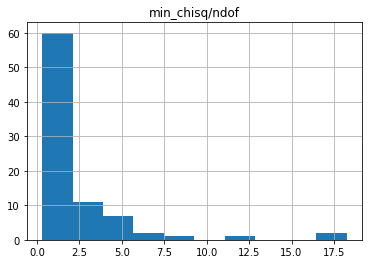

In [419]:
df_chisq_vs_ndof_ajustes.hist(column='min_chisq/ndof');

Contar las frecuencias de las columnas donde se encontró el mínimo valor de $\frac{\chi^2}{ndof}$

In [420]:
contar_columnas_min = df_chisq_vs_ndof_ajustes['columna_min_chisq/ndof'].value_counts()
contar_columnas_min

SALT2_z_fijo                    21
SALT3_z_fijo                    16
SALT2_z_bounded                 14
SALT2_z_var                      6
SALT3_z_var                      6
SALT3_z_fijo_cortes_t            4
SALT2_z_fijo_cortes_t            4
SALT2_z_bounded_cortes_t         3
SALT2_z_var_cortes_trest         3
SALT2_z_var_cortes_t             2
SALT2_z_bounded_cortes_trest     2
SALT3_z_bounded_cortes_t         1
SALT3_z_bounded                  1
SALT3_z_var_cortes_trest         1
Name: columna_min_chisq/ndof, dtype: int64

Gráfico de barras de los ajustes en los que se obtuvo el mínimo valor de $\frac{\chi^2}{ndof}$

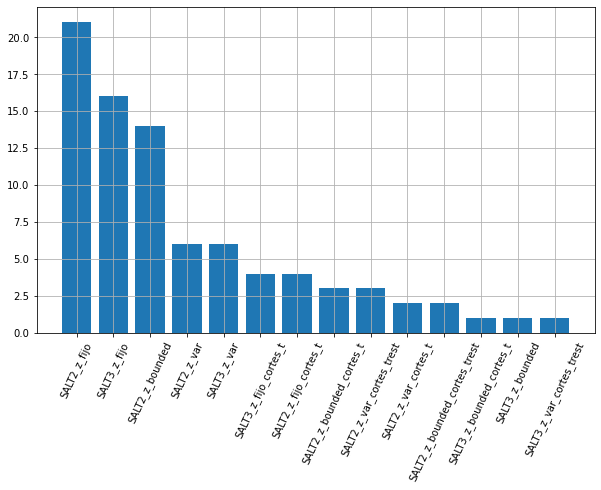

In [421]:
columnas_contadas = contar_columnas_min.index
cantidad_cada_columna = np.array(contar_columnas_min)

plt.figure(figsize=(10, 6))
plt.bar(columnas_contadas, cantidad_cada_columna)
plt.xticks(rotation=65)
plt.grid()

### Para los ajustes de las SNIa

In [430]:
df_chisq_vs_ndof_ajustes_SNIa = df_chisq_vs_ndof_ajustes[df_chisq_vs_ndof_ajustes.index.isin(SN_Ia)]

Contar las frecuencias de las columnas donde se encontró el mínimo valor de $\frac{\chi^2}{ndof}$

In [431]:
contar_columnas_min_SNIa = df_chisq_vs_ndof_ajustes_SNIa['columna_min_chisq/ndof'].value_counts()
contar_columnas_min_SNIa

SALT2_z_fijo                    19
SALT3_z_fijo                    16
SALT2_z_bounded                 14
SALT2_z_var                      6
SALT3_z_var                      6
SALT3_z_fijo_cortes_t            3
SALT2_z_bounded_cortes_t         2
SALT2_z_var_cortes_t             2
SALT2_z_bounded_cortes_trest     2
SALT2_z_fijo_cortes_t            2
SALT2_z_var_cortes_trest         2
SALT3_z_bounded_cortes_t         1
SALT3_z_bounded                  1
Name: columna_min_chisq/ndof, dtype: int64

Gráfico de barras de los ajustes en los que se obtuvo el mínimo valor de $\frac{\chi^2}{ndof}$ para las SN Ia

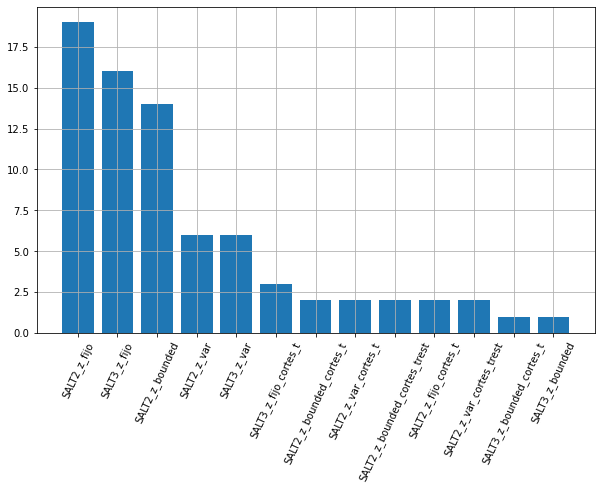

In [432]:
columnas_contadas_SNIa = contar_columnas_min_SNIa.index
cantidad_cada_columna_SNIa = np.array(contar_columnas_min_SNIa)

plt.figure(figsize=(10, 6))
plt.bar(columnas_contadas_SNIa, cantidad_cada_columna_SNIa)
plt.xticks(rotation=65)
plt.grid()

### Para los ajustes de las SNIa-91T

In [433]:
df_chisq_vs_ndof_ajustes_SNIa_91T = df_chisq_vs_ndof_ajustes[df_chisq_vs_ndof_ajustes.index.isin(SN_Ia_91T)]

Contar las frecuencias de las columnas donde se encontró el mínimo valor de $\frac{\chi^2}{ndof}$

In [434]:
contar_columnas_min_SNIa_91T = df_chisq_vs_ndof_ajustes_SNIa_91T['columna_min_chisq/ndof'].value_counts()
contar_columnas_min_SNIa_91T

SALT2_z_fijo_cortes_t       2
SALT3_z_fijo_cortes_t       1
SALT2_z_bounded_cortes_t    1
SALT2_z_fijo                1
Name: columna_min_chisq/ndof, dtype: int64

Gráfico de barras de los ajustes en los que se obtuvo el mínimo valor de $\frac{\chi^2}{ndof}$ para las SN Ia-91T

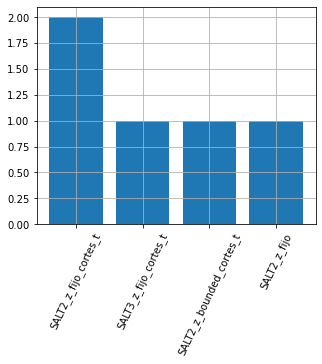

In [442]:
columnas_contadas_SNIa_91T = contar_columnas_min_SNIa_91T.index
cantidad_cada_columna_SNIa_91T = np.array(contar_columnas_min_SNIa_91T)

plt.figure(figsize=(5, 4))
plt.bar(columnas_contadas_SNIa_91T, cantidad_cada_columna_SNIa_91T)
plt.xticks(rotation=65)
plt.grid()

### Para los ajustes de las SNIa que no tienen el subtipo especificado

In [438]:
df_chisq_vs_ndof_ajustes_Ia_tipo_no_especif = df_chisq_vs_ndof_ajustes[df_chisq_vs_ndof_ajustes.index.isin(Ia_tipo_no_especif)]

Contar las frecuencias de las columnas donde se encontró el mínimo valor de $\frac{\chi^2}{ndof}$

In [439]:
contar_columnas_min_Ia_tipo_no_especif = df_chisq_vs_ndof_ajustes_Ia_tipo_no_especif['columna_min_chisq/ndof'].value_counts()
contar_columnas_min_Ia_tipo_no_especif

SALT3_z_var_cortes_trest    1
SALT2_z_fijo                1
SALT2_z_var_cortes_trest    1
Name: columna_min_chisq/ndof, dtype: int64

Gráfico de barras de los ajustes en los que se obtuvo el mínimo valor de $\frac{\chi^2}{ndof}$ para las SN Ia que no tienen el subtipo especificado

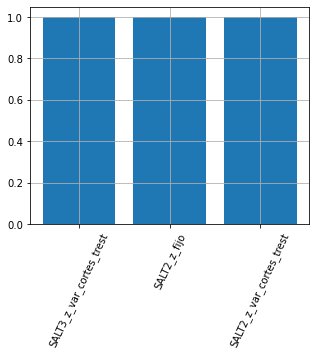

In [441]:
columnas_contadas_Ia_tipo_no_especif = contar_columnas_min_Ia_tipo_no_especif.index
cantidad_cada_columna_Ia_tipo_no_especif = np.array(contar_columnas_min_Ia_tipo_no_especif)

plt.figure(figsize=(5, 4))
plt.bar(columnas_contadas_Ia_tipo_no_especif, cantidad_cada_columna_Ia_tipo_no_especif)
plt.xticks(rotation=65)
plt.grid()

# Comparación de los valores de $\frac{\chi^2}{ndof}$ de todos los ajustes con $z$ variable

Crear una lista que contiene a todos los Data Frames de los ajustes con $z$ variable

In [422]:
dfs_var = [SALT2_z_var, SALT3_z_var, SALT2_z_var_cortes_t, SALT3_z_var_cortes_t,
           SALT2_z_var_cortes_trest, SALT3_z_var_cortes_trest, SALT2_z_bounded, 
           SALT3_z_bounded, SALT2_z_bounded_cortes_t, SALT3_z_bounded_cortes_t, 
           SALT2_z_bounded_cortes_trest, SALT3_z_bounded_cortes_trest]

Unir todas las columnas de $\frac{\chi^2}{ndof}$ de los ajustes de acuerdo al oid

In [423]:
dfs_var = [df_var.set_index('oid') for df_var in dfs_var]
df_chisq_vs_ndof_ajustes_var = dfs_var[0].join(dfs_var[1:])

display(df_chisq_vs_ndof_ajustes_var)

,SALT2_z_var,SALT3_z_var,SALT2_z_var_cortes_t,SALT3_z_var_cortes_t,SALT2_z_var_cortes_trest,SALT3_z_var_cortes_trest,SALT2_z_bounded,SALT3_z_bounded,SALT2_z_bounded_cortes_t,SALT3_z_bounded_cortes_t,SALT2_z_bounded_cortes_trest,SALT3_z_bounded_cortes_trest
oid,,,,,,,,,,,,
ZTF18abptsco,0.424190,0.493447,0.424190,0.493447,0.424190,0.493447,0.353720,0.455963,0.353720,0.455963,0.353720,0.455963
ZTF18abjtger,0.470233,0.537227,0.470233,0.537227,0.470233,0.537227,0.470233,0.535988,0.470233,0.535988,0.470233,0.535988
ZTF18abokpvh,0.555170,0.556936,0.555170,0.556936,0.555170,0.556936,0.555171,0.556936,0.555171,0.556936,0.555171,0.556936
ZTF18abpmmpo,0.557564,0.546762,0.557564,0.546762,0.557564,0.546762,0.557564,0.546764,0.557564,0.546764,0.557564,0.546764
ZTF18abqjvyl,0.570724,0.527829,0.570724,0.527829,0.570724,0.527829,0.564267,0.527831,0.564267,0.527831,0.564267,0.527831
...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF18aaxsioa,47.375581,47.433305,21.527486,20.968159,24.238261,2.332523,56.444163,54.281726,6.369074,2.332522,6.790919,2.498379
ZTF18abcflnz,72.646404,73.878194,20.874397,44.030238,14.445752,3.546539,84.285780,105.254969,35.756362,13.378145,2.061916,3.189608
ZTF18abuqugw,119.602447,123.885729,3.974160,15.829426,3.974160,15.829426,127.111838,130.299396,16.923946,27.740525,16.923946,27.740525


Agregar la columna que contiene el valor mínimo de $\frac{\chi^2}{ndof}$ de los ajustes cada oid

In [424]:
min_chisq_vs_ndof_ajustes_var = np.array(df_chisq_vs_ndof_ajustes_var.min(axis=1))
df_chisq_vs_ndof_ajustes_var['min_chisq/ndof'] = min_chisq_vs_ndof_ajustes_var

Agregar el nombre de la columna que contiene el valor mínimo de $\frac{\chi^2}{ndof}$ de los ajustes cada oid

In [425]:
columna_min_chisq_vs_ndof_ajustes_var = np.array(df_chisq_vs_ndof_ajustes_var.idxmin(axis=1))
df_chisq_vs_ndof_ajustes_var['columna_min_chisq/ndof'] = columna_min_chisq_vs_ndof_ajustes_var

Histograma de los valores mínimos de $\frac{\chi^2}{ndof}$

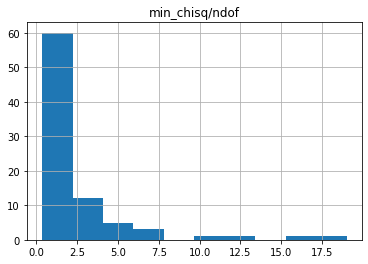

In [426]:
df_chisq_vs_ndof_ajustes_var.hist(column='min_chisq/ndof');

Contar las frecuencias de las columnas donde se encontró el mínimo valor de $\frac{\chi^2}{ndof}$

In [427]:
contar_columnas_min_var = df_chisq_vs_ndof_ajustes_var['columna_min_chisq/ndof'].value_counts()
contar_columnas_min_var

SALT2_z_bounded                 27
SALT3_z_bounded                 14
SALT2_z_var                     13
SALT3_z_var                     10
SALT2_z_bounded_cortes_trest     6
SALT2_z_bounded_cortes_t         4
SALT3_z_bounded_cortes_t         4
SALT2_z_var_cortes_trest         3
SALT2_z_var_cortes_t             2
SALT3_z_var_cortes_trest         1
Name: columna_min_chisq/ndof, dtype: int64

Gráfico de barras de los ajustes con $z$ variable en los que se obtuvo el mínimo valor de $\frac{\chi^2}{ndof}$ 

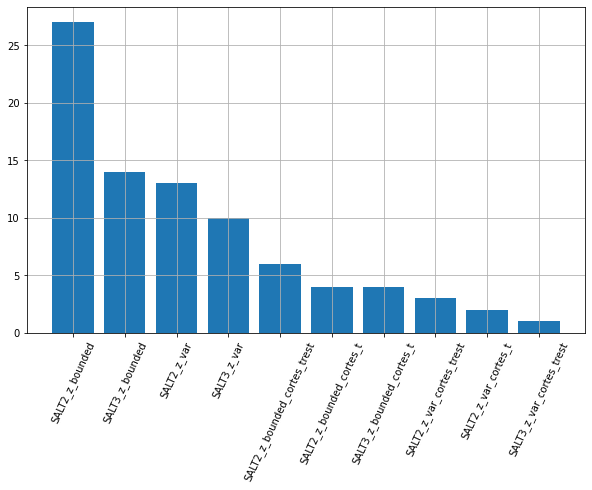

In [428]:
columnas_contadas_var = contar_columnas_min_var.index
cantidad_cada_columna_var = np.array(contar_columnas_min_var)

plt.figure(figsize=(10, 6))
plt.bar(columnas_contadas_var, cantidad_cada_columna_var)
plt.xticks(rotation=65)
plt.grid()

### Para los ajustes de las SNIa

In [444]:
df_chisq_vs_ndof_ajustes_SNIa_var = df_chisq_vs_ndof_ajustes_var[df_chisq_vs_ndof_ajustes_var.index.isin(SN_Ia)]

Contar las frecuencias de las columnas donde se encontró el mínimo valor de $\frac{\chi^2}{ndof}$

In [445]:
contar_columnas_min_SNIa_var = df_chisq_vs_ndof_ajustes_SNIa_var['columna_min_chisq/ndof'].value_counts()
contar_columnas_min_SNIa_var

SALT2_z_bounded                 25
SALT3_z_bounded                 14
SALT2_z_var                     13
SALT3_z_var                     10
SALT2_z_bounded_cortes_trest     5
SALT3_z_bounded_cortes_t         3
SALT2_z_bounded_cortes_t         2
SALT2_z_var_cortes_t             2
SALT2_z_var_cortes_trest         2
Name: columna_min_chisq/ndof, dtype: int64

Gráfico de barras de los ajustes en los que se obtuvo el mínimo valor de $\frac{\chi^2}{ndof}$ para las SN Ia

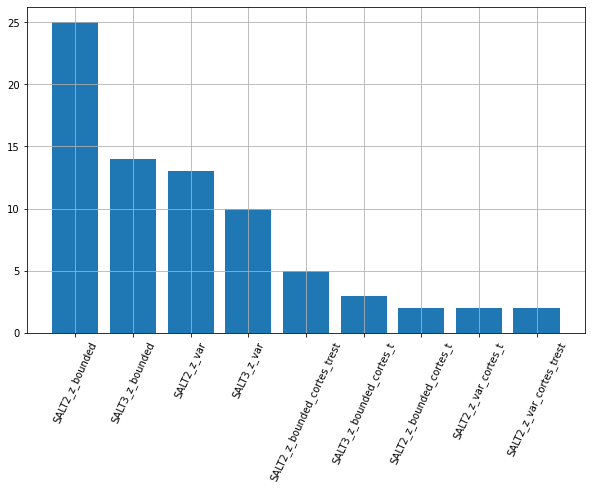

In [446]:
columnas_contadas_SNIa_var = contar_columnas_min_SNIa_var.index
cantidad_cada_columna_SNIa_var = np.array(contar_columnas_min_SNIa_var)

plt.figure(figsize=(10, 6))
plt.bar(columnas_contadas_SNIa_var, cantidad_cada_columna_SNIa_var)
plt.xticks(rotation=65)
plt.grid()

### Para los ajustes de las SNIa-91T

In [448]:
df_chisq_vs_ndof_ajustes_SNIa_91T_var = df_chisq_vs_ndof_ajustes_var[df_chisq_vs_ndof_ajustes_var.index.isin(SN_Ia_91T)]

Contar las frecuencias de las columnas donde se encontró el mínimo valor de $\frac{\chi^2}{ndof}$

In [449]:
contar_columnas_min_SNIa_91T_var = df_chisq_vs_ndof_ajustes_SNIa_91T_var['columna_min_chisq/ndof'].value_counts()
contar_columnas_min_SNIa_91T_var

SALT2_z_bounded_cortes_t        2
SALT3_z_bounded_cortes_t        1
SALT2_z_bounded_cortes_trest    1
SALT2_z_bounded                 1
Name: columna_min_chisq/ndof, dtype: int64

Gráfico de barras de los ajustes en los que se obtuvo el mínimo valor de $\frac{\chi^2}{ndof}$ para las SN Ia-91T

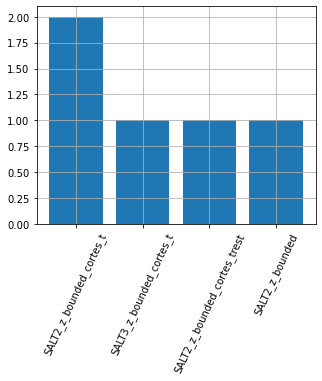

In [450]:
columnas_contadas_SNIa_91T_var = contar_columnas_min_SNIa_91T_var.index
cantidad_cada_columna_SNIa_91T_var = np.array(contar_columnas_min_SNIa_91T_var)

plt.figure(figsize=(5, 4))
plt.bar(columnas_contadas_SNIa_91T_var, cantidad_cada_columna_SNIa_91T_var)
plt.xticks(rotation=65)
plt.grid()

### Para los ajustes de las SNIa que no tienen el subtipo especificado

In [451]:
df_chisq_vs_ndof_ajustes_Ia_tipo_no_especif_var = df_chisq_vs_ndof_ajustes_var[df_chisq_vs_ndof_ajustes_var.index.isin(Ia_tipo_no_especif)]

Contar las frecuencias de las columnas donde se encontró el mínimo valor de $\frac{\chi^2}{ndof}$

In [452]:
contar_columnas_min_Ia_tipo_no_especif_var = df_chisq_vs_ndof_ajustes_Ia_tipo_no_especif_var['columna_min_chisq/ndof'].value_counts()
contar_columnas_min_Ia_tipo_no_especif_var

SALT3_z_var_cortes_trest    1
SALT2_z_bounded             1
SALT2_z_var_cortes_trest    1
Name: columna_min_chisq/ndof, dtype: int64

Gráfico de barras de los ajustes en los que se obtuvo el mínimo valor de $\frac{\chi^2}{ndof}$ para las SN Ia que no tienen el subtipo especificado

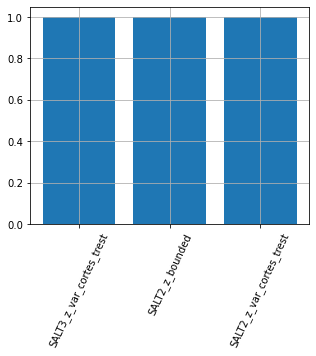

In [453]:
columnas_contadas_Ia_tipo_no_especif_var = contar_columnas_min_Ia_tipo_no_especif_var.index
cantidad_cada_columna_Ia_tipo_no_especif_var = np.array(contar_columnas_min_Ia_tipo_no_especif_var)

plt.figure(figsize=(5, 4))
plt.bar(columnas_contadas_Ia_tipo_no_especif_var, cantidad_cada_columna_Ia_tipo_no_especif_var)
plt.xticks(rotation=65)
plt.grid()